In [1]:
import tensorflow as tf
print(tf.test.gpu_device_name())

/device:GPU:0


In [2]:
from keras import backend as K
if 'tensorflow' == K.backend():
  import tensorflow as tf
  from keras.backend.tensorflow_backend import set_session
  config = tf.ConfigProto()
  config.gpu_options.allow_growth = True
  config.gpu_options.visible_device_list = "0"
  set_session(tf.Session(config=config))

Using TensorFlow backend.


In [0]:
# PyDrive Wrapper installieren, Bibliotheken importieren.
# Muß nur einmal pro Notebook durchgeführt werden
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
# This only needs to be done once per notebook.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [4]:
!pip install matplotlib==3.0.2
import matplotlib
from matplotlib import pyplot as plt
matplotlib.__version__

'3.0.2'

In [5]:
# choose a local (colab) directory to store the data.
import os
local_root_path = os.path.expanduser("~/data/data")
try:
  os.makedirs(local_root_path, exist_ok=True)    
except: pass

def ListFolder(google_drive_id, destination):
  file_list = drive.ListFile({'q': "'%s' in parents and trashed=false" % google_drive_id}).GetList()
  counter = 0
  for f in file_list:
    # If it is a directory then, create the dicrectory and upload the file inside it
    if f['mimeType']=='application/vnd.google-apps.folder': 
      folder_path = os.path.join(destination, f['title'])
      os.makedirs(folder_path, exist_ok=True)
      print('creating directory {}'.format(folder_path))
      ListFolder(f['id'], folder_path)
    else:
      fname = os.path.join(destination, f['title'])
      f_ = drive.CreateFile({'id': f['id']})
      f_.GetContentFile(fname)
      counter += 1
  print('{} files were uploaded in {}'.format(counter, destination))
ListFolder("1E4Oit_TJ9ayeobjtiCS1NsGJ4Pz9s7hI", local_root_path)

creating directory /root/data/data/data
creating directory /root/data/data/data/fashion
2 files were uploaded in /root/data/data/data/fashion
creating directory /root/data/data/data/GTSRB
2 files were uploaded in /root/data/data/data/GTSRB
0 files were uploaded in /root/data/data/data
creating directory /root/data/data/300 - CNN
7 files were uploaded in /root/data/data/300 - CNN
0 files were uploaded in /root/data/data


In [0]:
import glob
import h5py
import gzip

import time
import timeit
from timeit import default_timer as timer

from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential, load_model
from keras.layers import Dense, Dropout, SpatialDropout2D, Activation, Flatten, BatchNormalization
from keras.layers import Conv2D, Convolution2D, MaxPooling2D
from keras.optimizers import Adam
from keras.utils import np_utils
from keras.utils import to_categorical
#from keras.callbacks import LearningRateScheduler, ModelCheckpoint, TensorBoard, ReduceLROnPlateau
from keras.layers.advanced_activations import ELU
from keras.wrappers.scikit_learn import KerasClassifier

#from matplotlib import pyplot as plt
#%matplotlib inline

from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten

#from keras.datasets import fashion_mnist

import numpy as np
from numpy import mean, std

from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import average_precision_score, cohen_kappa_score, precision_recall_fscore_support
from sklearn.metrics import roc_curve, auc, precision_recall_curve
from sklearn.metrics import make_scorer
from sklearn.preprocessing import LabelBinarizer

from keras.callbacks import EarlyStopping

import seaborn as sns

import pickle as pkl
import csv
from google.colab import files   ##### importieren wenn in Google COLAB
from PIL import Image

#from skimage import transform, color, exposure

from sklearn.utils import shuffle

from google.colab import files    ##### importieren wenn in Google COLAB


In [0]:
'''
1. Aufteilung - Split A
erstellen unterschiedlicher Trainingsmengen aus 60.000 Trainingsdaten. Datensätze werden zufällig aber reproduzierbar
durch setzen von Seeds und unter Berücksichtigung der prozentualen Anteile der Daten in den einzelnen Klassen, erstellt.
'''
def make_subsets_training_data_A(X_tr, y_tr):    
    #Trainingsmenge mit 40.000 Bilder erzeugen
    X_tr_40000, X_te_10000_b, y_tr_40000, y_te_10000_b = train_test_split(X_tr, y_tr, random_state = 0, test_size=1/3, stratify=y_tr)
    #Trainingsmenge mit 20.000 Bilder erzeugen
    X_tr_20000, X_te_10000_d, y_tr_20000, y_te_10000_d = train_test_split(X_tr_40000, y_tr_40000, random_state = 0, test_size=1/2, stratify=y_tr_40000)
    #Trainingsmenge mit 10.000 Bilder erzeugen
    X_tr_10000, X_te_10000_e, y_tr_10000, y_te_10000_e = train_test_split(X_tr_20000, y_tr_20000, random_state = 0, test_size=1/2, stratify=y_tr_20000)
    #Trainingsmenge mit 5.000 Bilder erzeugen
    X_tr_5000, X_te_5000, y_tr_5000, y_te_5000 = train_test_split(X_tr_10000, y_tr_10000, random_state = 0, test_size=1/2, stratify=y_tr_10000)
    #Trainingsmenge mit 2.000 Bilder erzeugen
    X_tr_2000, X_te_3000, y_tr_2000, y_te_3000 = train_test_split(X_tr_5000, y_tr_5000, random_state = 0, test_size=3/5, stratify=y_tr_5000)
    #Trainingsmenge mit 1.000 Bilder erzeugen
    X_tr_1000, X_te_1000, y_tr_1000, y_te_1000 = train_test_split(X_tr_2000, y_tr_2000, random_state = 0, test_size=1/2, stratify=y_tr_2000)
    #Trainingsmenge mit 500 Bilder erzeugen
    X_tr_500, X_te_500, y_tr_500, y_te_500 = train_test_split(X_tr_1000, y_tr_1000, random_state = 0, test_size=1/2, stratify=y_tr_1000)
    return X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500  


'''
2. Aufteilung - Split B
erstellen unterschiedlicher Trainingsmengen aus 60.000 Trainingsdaten. Datensätze werden zufällig aber reproduzierbar
durch setzen von Seeds und unter Berücksichtigung der prozentualen Anteile der Daten in den einzelnen Klassen, erstellt.
'''
def make_subsets_training_data_B(X_tr, y_tr):    
    #Trainingsmenge mit 40.000 Bilder erzeugen
    X_tr_40000, X_te_10000_b, y_tr_40000, y_te_10000_b = train_test_split(X_tr, y_tr, random_state = 2, test_size=1/3, stratify=y_tr)
    #Trainingsmenge mit 20.000 Bilder erzeugen
    X_tr_20000, X_te_10000_d, y_tr_20000, y_te_10000_d = train_test_split(X_tr_40000, y_tr_40000, random_state = 3, test_size=1/2, stratify=y_tr_40000)
    #Trainingsmenge mit 10.000 Bilder erzeugen
    X_tr_10000, X_te_10000_e, y_tr_10000, y_te_10000_e = train_test_split(X_tr_20000, y_tr_20000, random_state = 4, test_size=1/2, stratify=y_tr_20000)
    #Trainingsmenge mit 5.000 Bilder erzeugen
    X_tr_5000, X_te_5000, y_tr_5000, y_te_5000 = train_test_split(X_tr_10000, y_tr_10000, random_state = 5, test_size=1/2, stratify=y_tr_10000)
    #Trainingsmenge mit 2.000 Bilder erzeugen
    X_tr_2000, X_te_3000, y_tr_2000, y_te_3000 = train_test_split(X_tr_5000, y_tr_5000, random_state = 6, test_size=3/5, stratify=y_tr_5000)
    #Trainingsmenge mit 1.000 Bilder erzeugen
    X_tr_1000, X_te_1000, y_tr_1000, y_te_1000 = train_test_split(X_tr_2000, y_tr_2000, random_state = 7, test_size=1/2, stratify=y_tr_2000)
    #Trainingsmenge mit 500 Bilder erzeugen
    X_tr_500, X_te_500, y_tr_500, y_te_500 = train_test_split(X_tr_1000, y_tr_1000, random_state = 8, test_size=1/2, stratify=y_tr_1000)
    return X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500   

'''
3. Aufteilung - Split C
erstellen unterschiedlicher Trainingsmengen aus 60.000 Trainingsdaten. Datensätze werden zufällig aber reproduzierbar
durch setzen von Seeds und unter Berücksichtigung der prozentualen Anteile der Daten in den einzelnen Klassen, erstellt.
'''
def make_subsets_training_data_C(X_tr, y_tr):    
    #Trainingsmenge mit 40.000 Bilder erzeugen
    X_tr_40000, X_te_10000_b, y_tr_40000, y_te_10000_b = train_test_split(X_tr, y_tr, random_state = 12, test_size=1/3, stratify=y_tr)
    #Trainingsmenge mit 20.000 Bilder erzeugen
    X_tr_20000, X_te_10000_d, y_tr_20000, y_te_10000_d = train_test_split(X_tr_40000, y_tr_40000, random_state = 14, test_size=1/2, stratify=y_tr_40000)
    #Trainingsmenge mit 10.000 Bilder erzeugen
    X_tr_10000, X_te_10000_e, y_tr_10000, y_te_10000_e = train_test_split(X_tr_20000, y_tr_20000, random_state = 19, test_size=1/2, stratify=y_tr_20000)
    #Trainingsmenge mit 5.000 Bilder erzeugen
    X_tr_5000, X_te_5000, y_tr_5000, y_te_5000 = train_test_split(X_tr_10000, y_tr_10000, random_state = 20, test_size=1/2, stratify=y_tr_10000)
    #Trainingsmenge mit 2.000 Bilder erzeugen
    X_tr_2000, X_te_3000, y_tr_2000, y_te_3000 = train_test_split(X_tr_5000, y_tr_5000, random_state = 30, test_size=3/5, stratify=y_tr_5000)
    #Trainingsmenge mit 1.000 Bilder erzeugen
    X_tr_1000, X_te_1000, y_tr_1000, y_te_1000 = train_test_split(X_tr_2000, y_tr_2000, random_state =50, test_size=1/2, stratify=y_tr_2000)
    #Trainingsmenge mit 500 Bilder erzeugen
    X_tr_500, X_te_500, y_tr_500, y_te_500 = train_test_split(X_tr_1000, y_tr_1000, random_state = 770, test_size=1/2, stratify=y_tr_1000)
    return X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500        




'''
Validierungsdaten von Trainingsdaten separieren
'''
def split_train_val_data(X,y, seed):
  #X_train_val, X_val, y_train_val, y_val = train_test_split(X, y, random_state=seed, test_size=1/5, stratify=y)
  X_train_val, X_val, y_train_val, y_val = train_test_split(X, y, random_state=seed, test_size=1/10, stratify=y)
  return(X_train_val, X_val, y_train_val, y_val) 


In [0]:
'''
Roc-Auc-Score Mehrklassenfall mit average='macro'
'''
# https://medium.com/@plog397/auc-roc-curve-scoring-function-for-multi-class-classification-9822871a6659
def roc_auc_score_multiclass(y_te, y_pr, average='macro'):
    labelBinarizer = LabelBinarizer()
    labelBinarizer.fit(y_te)    
    y_test = labelBinarizer.transform(y_te)
    y_pred = labelBinarizer.transform(y_pr)
    return roc_auc_score(y_test, y_pred, average=average)


'''
Roc-Auc score der einzelnen Klassen berechnen
'''
def roc_auc_score_single_class(y_te, y_pr, average='macro'):
  # Menge der einzelnen Klassen erstellen
  single_classes = set(y_te)
  roc_aucs = {}
  for cl in single_classes:
    # Liste der restlichen Klassen erstellen 
    remain_classes = [x for x in single_classes if x != cl]

    # aktuelle Klasse mit 1 markieren und alle anderen Klassen mit 0
    y_test_roc = [0 if x in remain_classes else 1 for x in y_te]
    y_pred_roc = [0 if x in remain_classes else 1 for x in y_pr]

    # roc_auc_score berechnen
    roc_auc = roc_auc_score(y_test_roc, y_pred_roc, average = average)
    roc_aucs[cl] = roc_auc
  return roc_aucs

'''
Klassifikationsreport erstellen
'''
def classifi_report(y_test, y_pred):
  labels = ["T-shirt", "Trousers", "Pullover", "Dress", "Coat", "Sandal", "Shirt", "Sneaker", "Bag", "Ankle-boot"]
  print(classification_report(y_test, y_pred, target_names=labels))



'''
Trainingsverlauf plotten und speichern
'''
def plot_training_progress(hist, number, dl):
  acc = hist.history['acc']
  acc_val = hist.history['val_acc']
  loss = hist.history['loss']
  loss_val = hist.history['val_loss']
  epochs = range(len(acc))
  plt.plot(epochs, acc, 'b', label='Trainingsgenauigkeit')
  plt.plot(epochs, acc_val, 'r', label='Validierungsgenauigkeit')
  plt.title('Lernkurven')
  plt.legend()
  name1 = str(dl)+'._'+str(number)+'_Lernkurve_FM_opt_Feat_acc.png'
  plt.savefig(name1)
  plt.figure()
  plt.plot(epochs, loss, 'b', label='Trainingsfehler')
  plt.plot(epochs, loss_val, 'r', label='Validierungsfehler')
  plt.title('Trainings- und Validierungsfehler')
  plt.legend()
  name2 = str(dl)+'._'+str(number)+'_Lernkurve_FM_opt_loss.png'
  plt.savefig(name2)
  plt.show()



'''
Konfusionsmatrix erstellen
'''
def plot_conf_matrix(y_test, y_pred, number, title):
  normalize=False
  cmap = plt.cm.Blues
  classes = ['T-Shirt', 'Trousers', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker','Bag', 'Ankle-boot']
  title = '\n'+title   
  cm = confusion_matrix(y_test, y_pred)
  fig, ax = plt.subplots()  
  fig.suptitle('                 Confusion matrix', fontsize=16, fontweight='medium')
  im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
  ax.figure.colorbar(im, ax=ax)
  ax.set_title(title, fontsize=10, fontweight='normal')
  ax.set(xticks=np.arange(cm.shape[1]),
        yticks=np.arange(cm.shape[0]),
        xticklabels=classes, yticklabels=classes,         
        ylabel = 'True label',
        xlabel = 'Predicted label')
  plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
          rotation_mode="anchor")    
  fmt = '.2f' if normalize else'd'
  thresh = cm.max() / 2.    
  for i in range(cm.shape[0]):
      for j in range(cm.shape[1]):
          ax.text(j, i, format(cm[i, j], fmt),
                  ha="center", va="center",
                  color="white" if cm[i, j] > thresh else "black")  
  
  np.set_printoptions(precision=2)
  fig.tight_layout()
  plt.show()
  return fig



'''
Modell evaluieren, scores bestimmen
'''
def evaluate_model(model, history, X, y, number, dl):
  # in one-hot ändern
  metrics=[]  # zum speichern der scores 
  time_list_test=[]
  start4 = time.time()
  start5 = time.process_time()
  start6 = time.perf_counter()
  
  # Modell testen mit Testdatensatz
  eva1 = model.evaluate(X_test, y_test, verbose=0)
  end4 = time.time()-start4
  end5 = time.process_time()-start5
  end6 = time.perf_counter()-start6
  end4_per_sample = end4/int(number)
  end5_per_sample = end5/int(number)
  end6_per_sample = end6/int(number)  
  time_list_test.append([end4, end5,end6])
  time_list_test.append([end4_per_sample, end5_per_sample, end6_per_sample])
  # Testzeit speichern
  save_as_csv(time_list_test, str(dl)+"._DL_" +str(number)+"_Testzeiten.csv")
  
  print("Testgenauigkeit: ", eva1[1], '  ', 'Testfehler: ', eva1[0])
  eva2 = model.evaluate(X, y, verbose=0)
  print('Trainingsgenauigkeit: ', eva2[1], '  ', 'Trainingsfehler: ', eva2[0])
  eva3 = model.evaluate(X_train, y_train, verbose=0)
  print('Genauigkeit aller Trainingsdaten: ', eva3[1], '  ', 'Fehler aller Trainingsdaten: ', eva3[0]) 
  
  # Trainingsverlauf anzeigen
  plot_training_progress(history, number, dl)

  # Klassen der Testmenge vorhersagen und speichern
  y_pred = model.predict(X_test) 
  np.save(str(dl)+"._DL_"+str(number)+"_y_pred_label.npy", np.argmax(y_pred, axis=1))

  # Scores berechnen und speichern 
  acc = accuracy_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  prec = precision_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), average='macro')
  rec = recall_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), average='macro')
  f1 = f1_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), average='macro')  
  roc_auc_multi = roc_auc_score_multiclass(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  kappa = cohen_kappa_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  metrics.append([acc,prec,rec,f1,roc_auc_multi,kappa])
  save_as_csv(metrics, str(dl)+"._DL_"+str(number)+'_metrics.csv')

  # Scores pro Klasse berechnen und speichern
  prec_rec_f1 = precision_recall_fscore_support(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  save_as_csv(prec_rec_f1, str(dl)+"._DL_"+str(number)+'_precision_recall_fscore.csv')
    
  roc_auc_single = roc_auc_score_single_class(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))  
  np.save(str(dl)+"._DL_"+str(number)+'_roc_auc_score_single_class.npy', roc_auc_single)

  # Scores der Trainingsdaten berechnen und speichern 
  y_pred_train = model.predict(X) 
  np.save(str(dl)+"._DL_"+str(number)+"_y_pred_label_train.npy", np.argmax(y_pred_train, axis=1))
  acc_train = accuracy_score(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1))
  prec_train = precision_score(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1), average='macro')
  rec_train = recall_score(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1), average='macro')
  f1_train = f1_score(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1), average='macro')  
  roc_auc_multi_train = roc_auc_score_multiclass(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1))
  kappa_train = cohen_kappa_score(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1))
  metrics.append([acc_train, prec_train ,rec_train ,f1_train, roc_auc_multi_train, kappa_train])
  save_as_csv(metrics, str(dl)+"._DL_"+str(number)+'_metrics_train.csv')
  prec_rec_f1 = precision_recall_fscore_support(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1))
  save_as_csv(prec_rec_f1, str(dl)+"._DL_"+str(number)+'_precision_recall_fscore_train.csv')
  roc_auc_single = roc_auc_score_single_class(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1))  
  np.save(str(dl)+"._DL_"+str(number)+'_roc_auc_score_single_class_train.npy', roc_auc_single)

  # Klassifikationsreport anzeigen
  classifi_report(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  
  # Konfusionsmatrix bestimmen und anzeigen
  title = '(FM opt. ' + str(number) + " "+str(dl) + "._DL_"+')'
  cm = plot_conf_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), number, title)  
  cm.savefig(str(dl)+"._DL_"+str(number)+"_Confusion_matrix.png")  



'''
konvertieren zu Float
Normalisieren in Bereich [0-1]
One hot encoding
'''
def prepro_data(X, y):
  X_reshape = X.reshape(X.shape[0],28,28,1)                  
  X_konv_norm = X_reshape.astype('float32')/255.0    
  y_one_hot = to_categorical(y)
  return X_konv_norm, y_one_hot 



'''
Data Augmentation, welcher lt. Email von Fr. Greeshma im Paper verwendet wurde
''' 
def gen_Image_data():
  datagen = ImageDataGenerator(
      width_shift_range=0.1,
      height_shift_range=0.1,
      horizontal_flip=True,
      vertical_flip=False)
  return datagen
  


'''
ImageDataGenerator für Validierungsdaten
'''
def gen_Image_data_test():
  datagen = ImageDataGenerator()
  return datagen


'''
als CSV-Datei speichern
'''
def save_as_csv(list,name):    
    with open(name, "w") as file:
        csv_wr = csv.writer(file)
        csv_wr.writerows(list)



'''
Durchführung mehrerer Trainingsläufe
'''
def earlyStoppingRuns(start, end, X_train, y_train, conv_dropout, learn_rate, spatial_dropout, epochs, number):
  epoch_list = []
  for i in range(start, (end+1)):
    print("***************************************************************************** ")
    print(i,"._Trainingsdurchlauf mit EarlyStopping")
    print(" ")
    X_tr, X_val, y_tr, y_val = split_train_val_data(X_train, y_train, i)
    X_tr, y_tr = shuffle(X_tr, y_tr)
    cnn_FM_opt_ES, best_ep = train_model_es(X_tr, y_tr, X_val, y_val, conv_dropout, learn_rate, spatial_dropout,epochs, number, i)
    epoch_list.append(best_ep)
  # Durchschnittliche Epochenanzahl bestimmen
  sum = 0
  for i in range(0, len(epoch_list)):
    sum = sum + epoch_list[i]
  print("Die durchschnittliche Epochenanzahl beträgt: ", (sum/len(epoch_list)))




'''
Durchführung mehrerer Trainingsläufe
'''
def earlyStoppingRuns_with_DA(start, end, X_train, y_train, conv_dropout, learn_rate, spatial_dropout, epochs, number):
  epoch_list = []
  for i in range(start, (end+1)):
    print("***************************************************************************** ")
    print(i,"._Trainingsdurchlauf mit EarlyStopping und Data Augmentation")
    print(" ")
    X_tr, X_val, y_tr, y_val = split_train_val_data(X_train, y_train, i)
    X_tr, y_tr = shuffle(X_tr, y_tr)
    cnn_FM_opt_ES, best_ep = train_model_es_da(X_tr, y_tr, X_val, y_val, conv_dropout, learn_rate, spatial_dropout,epochs, number, i)
    epoch_list.append(best_ep)
  # Durchschnittliche Epochenanzahl bestimmen
  sum = 0
  for i in range(0, len(epoch_list)):
    sum = sum + epoch_list[i]
  print("Die durchschnittliche Epochenanzahl beträgt: ", (sum/len(epoch_list)))


def fullDataRuns(start, end, X_train, y_train, X_test, y_test, conv_dropout, learn_rate, spatial_dropout, epochs, number):
    for i in range(start, (end+1)):
      print("***************************************************************************** ")
      print(i,"._Trainingsdurchlauf")
      print(" ")
      X_train, y_train = shuffle(X_train, y_train)
      cnn_FM_opt = fm_model_opt(X_train, y_train, X_test, y_test, conv_dropout, learn_rate, spatial_dropout, epochs, number, i)



'''
Modell, welches mit optimierten Hyperparametern (Dropoutrate, Lernrate, SpatialDropout?)
unter Verwendung von EarlyStopping trainiert wird
conv_dropout = Dropoutrate der Convolutional Layer im Bereich: [0.25, 0.3, 0.4]
learn_rate = Lernrate im Bereich: [0.0001, 0.001, 0.01]
spatial_dropout=False, d.h. kein Spatial Dropout2D Layer, sondern normaler Dropout Layer
'''
def model_es(conv_dropout=0.2, learn_rate=0.001, spatial_dropout=False):
  model = Sequential()
  model.add(Conv2D(32, kernel_size=(3,3), input_shape=(28,28,1)))
  model.add(BatchNormalization())
  model.add(Activation('relu'))
  model.add(Conv2D(32, kernel_size=(3,3)))
  model.add(BatchNormalization())
  model.add(Activation('relu'))
  model.add(MaxPooling2D(pool_size=(2,2)))
  if spatial_dropout==True:
    model.add(SpatialDropout2D(conv_dropout))
  if spatial_dropout==False:
    model.add(Dropout(conv_dropout))
  model.add(Conv2D(64, kernel_size=(3,3)))
  model.add(BatchNormalization())
  model.add(Activation('relu'))
  model.add(Conv2D(64, kernel_size=(3,3)))
  model.add(BatchNormalization())
  model.add(Activation('relu'))
  model.add(MaxPooling2D(pool_size=(2,2)))
  if spatial_dropout==True:
    model.add(SpatialDropout2D(conv_dropout))
  if spatial_dropout==False:
    model.add(Dropout(conv_dropout))
  model.add(Flatten())
  model.add(Dense(512))
  model.add(BatchNormalization())
  model.add(Activation('relu'))
  model.add(Dropout(0.5))
  model.add(Dense(10, activation='softmax'))
  optimizer = Adam(lr=learn_rate)
  model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=['accuracy'])
  return model
   


'''
Gibt bei Anwendung von EarlyStopping die Epoche mit geringstem Loss zurück
'''
def best_epoch(history):
  best_epoch = np.argmin(history.history['val_loss'])+1
  print("Der Validierungsfehler ist nach Epoche ", best_epoch, " am minimalsten.")
  return best_epoch


# mit EarlyStopping trainieren
# gibt neben dem trainierten Modell auch die Epochenanzahl zurück
def train_model_es(X, y, X_val, y_val, conv_dropout, learn_rate, spatial_dropout, epochs, number, dl):
  model = model_es(conv_dropout, learn_rate, spatial_dropout)    
  es = EarlyStopping(monitor='val_loss', patience=20, mode='min', restore_best_weights=True)
  start = time.time()
  start2 = time.process_time()
  start3 = time.perf_counter()
  
  history = model.fit(X, y,
                     batch_size=64,   
                     epochs=epochs,
                     verbose=1,
                     validation_data=(X_val, y_val),
                     callbacks=[es])
  cnn_train_time = time.time() - start
  cnn_train_time2 = time.process_time()-start2
  cnn_train_time3 = time.perf_counter()-start3
  # Trainingszeiten speichern
  time_list = []
  time_list.append([cnn_train_time, cnn_train_time2, cnn_train_time3])
  cnn_train_time_per_sample = cnn_train_time/int(number)
  cnn_train_time2_per_sample = cnn_train_time2/int(number)
  cnn_train_time3_per_sample = cnn_train_time3/int(number)
  time_list.append([cnn_train_time_per_sample, cnn_train_time2_per_sample, cnn_train_time3_per_sample])
  save_as_csv(time_list, str(dl) + "._DL_"+str(number)+"_Trainingszeiten_ES.csv")
  print("Trainingszeit beträgt {0:2f} Minuten".format(cnn_train_time/60.0))
  print("Trainingszeit in Sekunden: ", cnn_train_time)
  # Beste Epoche bestimmen und speichern
  best_ep = []
  epo = best_epoch(history)
  #best_ep.append([best_epoch(history)])
  best_ep.append([epo])
  save_as_csv(best_ep, str(dl)+"._DL_"+str(number)+"_beste_Epoche.csv")
  # trainiertes Modell und Gewichte speichern
  model.save(str(dl)+"._DL_"+str(number)+"_FM_opt_ES.hdf5")
  model.save_weights(str(dl)+"._DL_"+str(number)+"_FM_opt_ES_weights.hdf5")
  # Evaluation
  evaluate_model(model, history, X, y, number, dl)
  return model, epo




# mit EarlyStopping trainieren
# gibt neben dem trainierten Modell auch die Epochenanzahl zurück
def train_model_es_da(X, y, X_val, y_val, conv_dropout, learn_rate, spatial_dropout, epochs, number, dl):
  model = model_es(conv_dropout, learn_rate, spatial_dropout)    
  es = EarlyStopping(monitor='val_loss', patience=20, mode='min', restore_best_weights=True)

  train_gen = gen_Image_data()
  test_gen = ImageDataGenerator()
  train_samples = train_gen.flow(X,y, batch_size=64)
  test_samples = test_gen.flow(X_val, y_val, batch_size=64)

  start = time.time()
  start2 = time.process_time()
  start3 = time.perf_counter()

  history = model.fit(train_samples, steps_per_epoch = np.ceil(len(X)/64),
                      validation_data=(test_samples),
                      validation_steps=np.ceil(len(X_val)/64),
                      epochs=300, verbose=1, callbacks=[es])                     
  cnn_train_time = time.time() - start
  cnn_train_time2 = time.process_time()-start2
  cnn_train_time3 = time.perf_counter()-start3
  # Trainingszeiten speichern
  time_list = []
  time_list.append([cnn_train_time, cnn_train_time2, cnn_train_time3])
  cnn_train_time_per_sample = cnn_train_time/int(number)
  cnn_train_time2_per_sample = cnn_train_time2/int(number)
  cnn_train_time3_per_sample = cnn_train_time3/int(number)
  time_list.append([cnn_train_time_per_sample, cnn_train_time2_per_sample, cnn_train_time3_per_sample])
  save_as_csv(time_list, str(dl) + "._DL_"+str(number)+"_Trainingszeiten_ES.csv")
  print("Trainingszeit beträgt {0:2f} Minuten".format(cnn_train_time/60.0))
  print("Trainingszeit in Sekunden: ", cnn_train_time)
  # Beste Epoche bestimmen und speichern
  best_ep = []
  epo = best_epoch(history)
  #best_ep.append([best_epoch(history)])
  best_ep.append([epo])
  save_as_csv(best_ep, str(dl)+"._DL_"+str(number)+"_beste_Epoche.csv")
  # trainiertes Modell und Gewichte speichern
  model.save(str(dl)+"._DL_"+str(number)+"_FM_opt_ES.hdf5")
  model.save_weights(str(dl)+"._DL_"+str(number)+"_FM_opt_ES_weights.hdf5")
  # Evaluation
  evaluate_model(model, history, X, y, number, dl)
  return model, epo




# Modell mit übergebenen Parametern, ohne EarlyStopping trainieren
def fm_model_opt(X, y, X_test, y_test, conv_dropout, learn_rate, spatial_dropout, epochs, number, dl):
  model = model_es(conv_dropout, learn_rate, spatial_dropout)
  #model.summary()
  start = time.time()
  start2 = time.process_time()
  start3 = time.perf_counter()
  history = model.fit(X, y, batch_size=64, epochs=epochs, verbose=1,validation_data=(X_test, y_test))
  cnn_train_time = time.time() - start
  cnn_train_time2 = time.process_time()-start2
  cnn_train_time3 = time.perf_counter()-start3
  # Trainingszeiten speichern
  time_list = []
  time_list.append([cnn_train_time, cnn_train_time2, cnn_train_time3])
  cnn_train_time_per_sample = cnn_train_time/int(number)
  cnn_train_time2_per_sample = cnn_train_time2/int(number)
  cnn_train_time3_per_sample = cnn_train_time3/int(number)
  time_list.append([cnn_train_time_per_sample, cnn_train_time2_per_sample, cnn_train_time3_per_sample])
  save_as_csv(time_list, str(dl) + "._DL_"+str(number)+"_Trainingszeiten.csv")
  print("Trainingszeit beträgt {0:2f} Minuten".format(cnn_train_time/60.0))
  print("Trainingszeit in Sekunden: ", cnn_train_time)
  best_ep = []
  best_ep.append([best_epoch(history)])
  save_as_csv(best_ep, str(dl)+"._DL_"+str(number)+"_beste_Epoche_full.csv")

  # trainiertes Modell und Gewichte speichern
  model.save(str(dl)+"._DL_"+str(number)+"_FM_opt.hdf5")
  model.save_weights(str(dl)+"._DL_"+str(number)+"_FM_opt_weights.hdf5")
  # Evaluation
  evaluate_model(model, history, X, y, number, dl)
  return model


In [0]:
'''
Datensätze (Grauwertbilder) laden. Die Bilder haben eine Größe von 28x28 Pixel und sind bereits segmentiert, 
jedes enthält nur ein Kleidungsstück
'''

# Trainingsdatensatz laden
with open(os.path.expanduser("~/data/data/data/fashion/raw_train.pkl"), "rb") as f:
  X_train, y_train = pkl.load(f) 
  
#Testdatensatz laden
with open(os.path.expanduser("~/data/data/data/fashion/raw_test.pkl"), "rb") as f:
  X_test, y_test = pkl.load(f)


In [0]:
# Trainings- und Testdaten vorverarbeiten
(X_train, y_train) = prepro_data(X_train, y_train)
(X_test, y_test) = prepro_data(X_test, y_test)

In [0]:
test = model_es(0.25, 0.001, False)
test.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_29 (Conv2D)           (None, 26, 26, 32)        320       
_________________________________________________________________
batch_normalization_36 (Batc (None, 26, 26, 32)        128       
_________________________________________________________________
activation_36 (Activation)   (None, 26, 26, 32)        0         
_________________________________________________________________
conv2d_30 (Conv2D)           (None, 24, 24, 32)        9248      
_________________________________________________________________
batch_normalization_37 (Batc (None, 24, 24, 32)        128       
_________________________________________________________________
activation_37 (Activation)   (None, 24, 24, 32)        0         
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 12, 12, 32)       

In [0]:
def downloader(number):
  for i in range(1,6):
    name = str(i)+"._"+str(number)+"_"
    name2 = str(i)+"._DL_"+str(number)+"_"
    files.download(name+"Lernkurve_FM_opt_Feat_acc.png")
    files.download(name+"Lernkurve_FM_opt_loss.png")
    files.download(name2+"Confusion_matrix.png")
    files.download(name2+"FM_opt_ES.hdf5")
    files.download(name2+"FM_opt_ES_weights.hdf5")
    files.download(name2+"Testzeiten.csv")
    files.download(name2+"Trainingszeiten_ES.csv")
    files.download(name2+"beste_Epoche.csv")
    files.download(name2+"metrics.csv")
    files.download(name2+"metrics_train.csv")
    files.download(name2+"precision_recall_fscore.csv")
    files.download(name2+"precision_recall_fscore_train.csv")
    files.download(name2+"roc_auc_score_single_class.npy")
    files.download(name2+"roc_auc_score_single_class_train.npy")
    files.download(name2+"y_pred_label.npy")
    files.download(name2+"y_pred_label_train.npy")
  

In [0]:
########################################################################################################################
###################   Wiederholtes Training mitoptimiertenHyperparametern unter Verwendung von 
###################   EarlyStopping 
###################   1. Aufteilung der Trainingsdaten
########################################################################################################################

X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500 = make_subsets_training_data_A(X_train, y_train)


***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 450 samples, validate on 50 samples
Epoch 1/300
450/450 [==============================] - 9s 20ms/step - loss: 2.1094 - acc: 0.3200 - val_loss: 0.8712 - val_acc: 0.7200
Epoch 2/300
450/450 [==============================] - 0s 260us/step - loss: 1.1475 - acc: 0.6289 - val_loss: 0.8182 - val_acc: 0.7800
Epoch 3/300
450/450 [==============================] - 0s 232us/step - loss: 1.0044 - acc: 0.6511 - val_loss: 0.7141 - val_acc: 0.6800
Epoch 4/300
450/450 [==============================] - 0s 241us/step - loss: 0.9267 - acc: 0.6600 - val_loss: 0.6334 - val_acc: 0.7400
Epoch 5/300
450/450 [==============================] - 0s 226us/step - loss: 0.8143 - acc: 0.7089 - val_loss: 0.5437 - val_acc: 0.8600
Epoch 6/300
450/450 [==============================] - 0s 229us

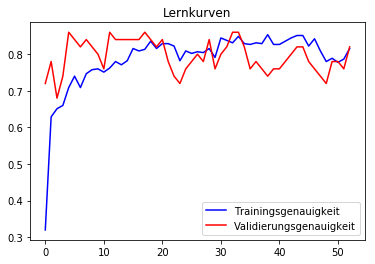

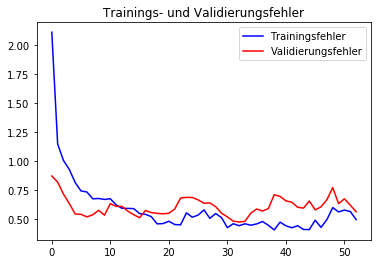

              precision    recall  f1-score   support

     T-shirt       0.67      0.85      0.75      1000
    Trousers       0.98      0.91      0.94      1000
    Pullover       0.59      0.56      0.58      1000
       Dress       0.78      0.81      0.80      1000
        Coat       0.62      0.71      0.66      1000
      Sandal       0.79      0.92      0.85      1000
       Shirt       0.45      0.30      0.36      1000
     Sneaker       0.88      0.83      0.86      1000
         Bag       0.95      0.81      0.88      1000
  Ankle-boot       0.91      0.94      0.92      1000

    accuracy                           0.76     10000
   macro avg       0.76      0.76      0.76     10000
weighted avg       0.76      0.76      0.76     10000



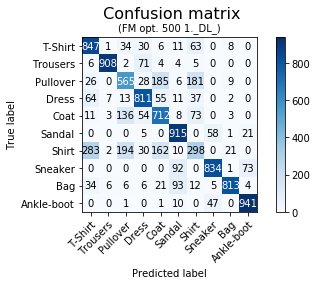

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 450 samples, validate on 50 samples
Epoch 1/300
450/450 [==============================] - 2s 4ms/step - loss: 2.2502 - acc: 0.2756 - val_loss: 1.0540 - val_acc: 0.6000
Epoch 2/300
450/450 [==============================] - 0s 254us/step - loss: 1.1970 - acc: 0.5867 - val_loss: 0.7693 - val_acc: 0.7600
Epoch 3/300
450/450 [==============================] - 0s 254us/step - loss: 1.0435 - acc: 0.6311 - val_loss: 0.7048 - val_acc: 0.7600
Epoch 4/300
450/450 [==============================] - 0s 251us/step - loss: 0.8590 - acc: 0.7022 - val_loss: 0.7782 - val_acc: 0.7800
Epoch 5/300
450/450 [==============================] - 0s 253us/step - loss: 0.8199 - acc: 0.7089 - val_loss: 0.9007 - val_acc: 0.6400
Epoch 6/300
450/450 [==============================] - 0s 244us/step - loss: 0.7867 - acc: 0.7356 - val_loss: 0.8750 - val_acc: 0.6600
Epoch 7/300
450/450 [====

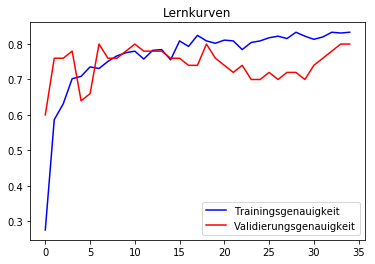

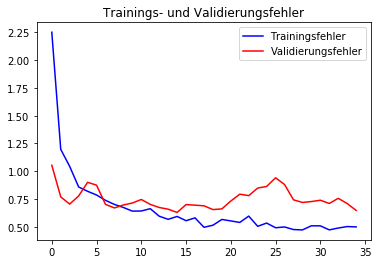

              precision    recall  f1-score   support

     T-shirt       0.63      0.85      0.72      1000
    Trousers       0.99      0.93      0.96      1000
    Pullover       0.54      0.42      0.47      1000
       Dress       0.81      0.76      0.78      1000
        Coat       0.61      0.63      0.62      1000
      Sandal       0.80      0.88      0.84      1000
       Shirt       0.36      0.32      0.34      1000
     Sneaker       0.84      0.87      0.85      1000
         Bag       0.94      0.85      0.89      1000
  Ankle-boot       0.91      0.91      0.91      1000

    accuracy                           0.74     10000
   macro avg       0.74      0.74      0.74     10000
weighted avg       0.74      0.74      0.74     10000



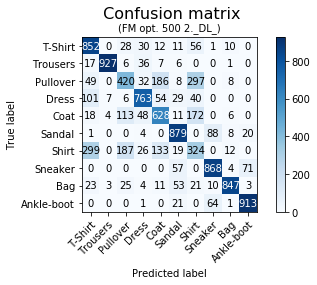

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 450 samples, validate on 50 samples
Epoch 1/300
450/450 [==============================] - 2s 5ms/step - loss: 2.0894 - acc: 0.3511 - val_loss: 1.0614 - val_acc: 0.6600
Epoch 2/300
450/450 [==============================] - 0s 268us/step - loss: 1.0827 - acc: 0.6378 - val_loss: 0.7535 - val_acc: 0.7200
Epoch 3/300
450/450 [==============================] - 0s 250us/step - loss: 0.9418 - acc: 0.6733 - val_loss: 0.6723 - val_acc: 0.8200
Epoch 4/300
450/450 [==============================] - 0s 259us/step - loss: 0.8393 - acc: 0.7000 - val_loss: 1.0140 - val_acc: 0.7000
Epoch 5/300
450/450 [==============================] - 0s 250us/step - loss: 0.8831 - acc: 0.6889 - val_loss: 0.8581 - val_acc: 0.7400
Epoch 6/300
450/450 [==============================] - 0s 224us/step - loss: 0.7686 - acc: 0.7289 - val_loss: 0.7203 - val_acc: 0.8200
Epoch 7/300
450/450 [====

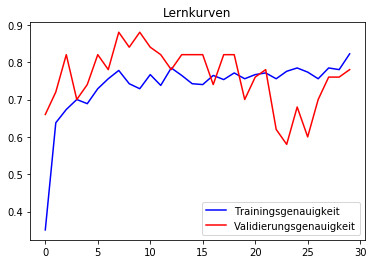

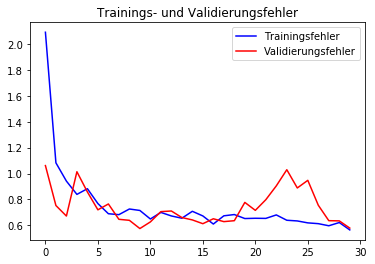

              precision    recall  f1-score   support

     T-shirt       0.71      0.78      0.74      1000
    Trousers       0.98      0.87      0.92      1000
    Pullover       0.56      0.33      0.42      1000
       Dress       0.76      0.79      0.77      1000
        Coat       0.50      0.75      0.60      1000
      Sandal       0.89      0.85      0.87      1000
       Shirt       0.34      0.32      0.33      1000
     Sneaker       0.85      0.85      0.85      1000
         Bag       0.94      0.85      0.89      1000
  Ankle-boot       0.87      0.96      0.91      1000

    accuracy                           0.73     10000
   macro avg       0.74      0.73      0.73     10000
weighted avg       0.74      0.73      0.73     10000



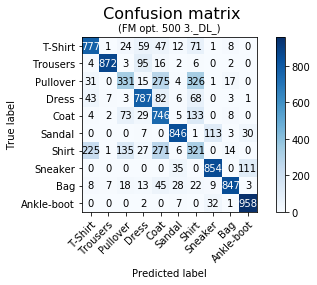

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 450 samples, validate on 50 samples
Epoch 1/300
450/450 [==============================] - 2s 5ms/step - loss: 2.1494 - acc: 0.3022 - val_loss: 0.9914 - val_acc: 0.7000
Epoch 2/300
450/450 [==============================] - 0s 252us/step - loss: 1.1792 - acc: 0.6044 - val_loss: 0.8582 - val_acc: 0.7600
Epoch 3/300
450/450 [==============================] - 0s 239us/step - loss: 0.9895 - acc: 0.6689 - val_loss: 0.8973 - val_acc: 0.6800
Epoch 4/300
450/450 [==============================] - 0s 220us/step - loss: 0.8878 - acc: 0.6956 - val_loss: 0.7995 - val_acc: 0.6800
Epoch 5/300
450/450 [==============================] - 0s 216us/step - loss: 0.7974 - acc: 0.7156 - val_loss: 0.7315 - val_acc: 0.7200
Epoch 6/300
450/450 [==============================] - 0s 213us/step - loss: 0.7604 - acc: 0.7200 - val_loss: 0.7004 - val_acc: 0.7200
Epoch 7/300
450/450 [====

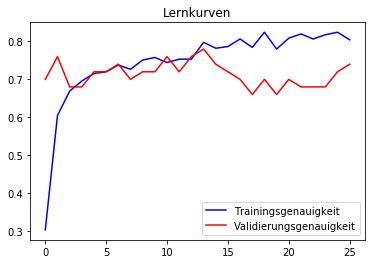

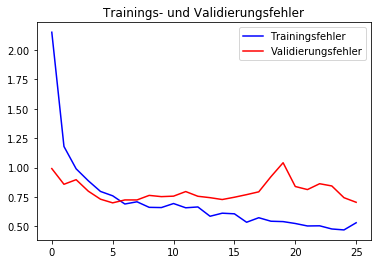

              precision    recall  f1-score   support

     T-shirt       0.69      0.70      0.69      1000
    Trousers       0.97      0.92      0.94      1000
    Pullover       0.51      0.33      0.40      1000
       Dress       0.69      0.85      0.76      1000
        Coat       0.60      0.61      0.60      1000
      Sandal       0.79      0.89      0.84      1000
       Shirt       0.31      0.38      0.34      1000
     Sneaker       0.84      0.85      0.84      1000
         Bag       0.98      0.73      0.84      1000
  Ankle-boot       0.91      0.93      0.92      1000

    accuracy                           0.72     10000
   macro avg       0.73      0.72      0.72     10000
weighted avg       0.73      0.72      0.72     10000



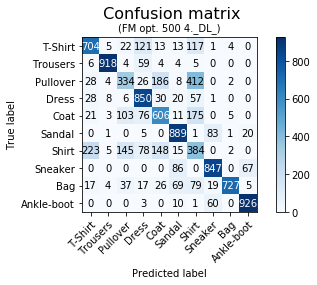

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 450 samples, validate on 50 samples
Epoch 1/300
450/450 [==============================] - 3s 6ms/step - loss: 2.1105 - acc: 0.3156 - val_loss: 1.0069 - val_acc: 0.7000
Epoch 2/300
450/450 [==============================] - 0s 243us/step - loss: 1.1384 - acc: 0.6200 - val_loss: 0.8701 - val_acc: 0.6800
Epoch 3/300
450/450 [==============================] - 0s 241us/step - loss: 0.9770 - acc: 0.6689 - val_loss: 0.8348 - val_acc: 0.7400
Epoch 4/300
450/450 [==============================] - 0s 227us/step - loss: 0.8580 - acc: 0.6800 - val_loss: 0.7408 - val_acc: 0.7200
Epoch 5/300
450/450 [==============================] - 0s 231us/step - loss: 0.8083 - acc: 0.7133 - val_loss: 0.6905 - val_acc: 0.7600
Epoch 6/300
450/450 [==============================] - 0s 208us/step - loss: 0.6773 - acc: 0.7600 - val_loss: 0.5938 - val_acc: 0.8200
Epoch 7/300
450/450 [====

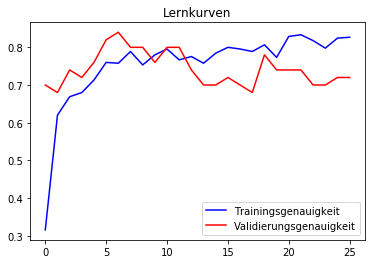

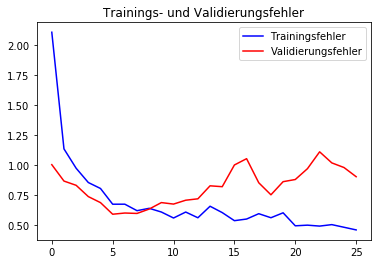

              precision    recall  f1-score   support

     T-shirt       0.65      0.80      0.72      1000
    Trousers       0.99      0.92      0.95      1000
    Pullover       0.53      0.45      0.49      1000
       Dress       0.78      0.79      0.78      1000
        Coat       0.53      0.69      0.60      1000
      Sandal       0.85      0.85      0.85      1000
       Shirt       0.34      0.22      0.27      1000
     Sneaker       0.85      0.85      0.85      1000
         Bag       0.91      0.87      0.89      1000
  Ankle-boot       0.87      0.94      0.91      1000

    accuracy                           0.74     10000
   macro avg       0.73      0.74      0.73     10000
weighted avg       0.73      0.74      0.73     10000



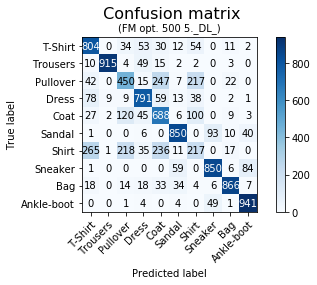

Die durchschnittliche Epochenanzahl beträgt:  14.0


In [0]:
# Trainingsmenge 500
# optimierte Parameter: Dropoutrate: 0.25, Lernrate: 0.001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainieren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1, 5, X_tr_500, y_tr_500, 0.25, 0.001, False, 300, 500)

In [0]:
downloader(500)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/14
500/500 [==============================] - 10s 19ms/step - loss: 2.1909 - acc: 0.2940 - val_loss: 1.0835 - val_acc: 0.6495
Epoch 2/14
500/500 [==============================] - 1s 1ms/step - loss: 1.0582 - acc: 0.6480 - val_loss: 0.9255 - val_acc: 0.6928
Epoch 3/14
500/500 [==============================] - 1s 2ms/step - loss: 0.8698 - acc: 0.6900 - val_loss: 0.8612 - val_acc: 0.7150
Epoch 4/14
500/500 [==============================] - 1s 1ms/step - loss: 0.7268 - acc: 0.7380 - val_loss: 0.8013 - val_acc: 0.7203
Epoch 5/14
500/500 [==============================] - 1s 1ms/step - loss: 0.5919 - acc: 0.7780 - val_loss: 0.7311 - val_acc: 0.7316
Epoch 6/14
500/500 [==============================] - 1s 1ms/step - loss: 0.5519 - acc: 0.7840 - val_loss: 0.7261 - val_acc: 0.7458
Epoch 7/14
500/500 [==============================] - 

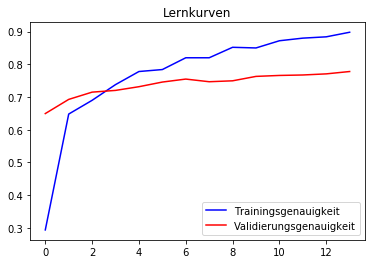

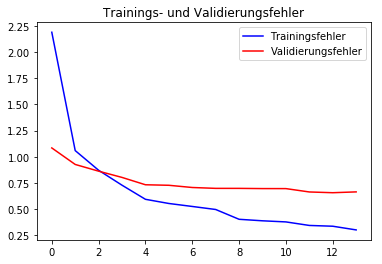

              precision    recall  f1-score   support

     T-shirt       0.72      0.83      0.77      1000
    Trousers       0.99      0.91      0.95      1000
    Pullover       0.65      0.48      0.55      1000
       Dress       0.82      0.78      0.80      1000
        Coat       0.55      0.84      0.66      1000
      Sandal       0.94      0.85      0.89      1000
       Shirt       0.45      0.32      0.38      1000
     Sneaker       0.87      0.89      0.88      1000
         Bag       0.93      0.93      0.93      1000
  Ankle-boot       0.88      0.95      0.92      1000

    accuracy                           0.78     10000
   macro avg       0.78      0.78      0.77     10000
weighted avg       0.78      0.78      0.77     10000



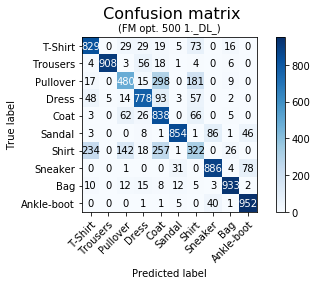

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/14
500/500 [==============================] - 10s 20ms/step - loss: 2.1682 - acc: 0.3300 - val_loss: 1.1517 - val_acc: 0.6098
Epoch 2/14
500/500 [==============================] - 1s 1ms/step - loss: 1.0400 - acc: 0.6100 - val_loss: 0.8832 - val_acc: 0.6834
Epoch 3/14
500/500 [==============================] - 1s 1ms/step - loss: 0.8890 - acc: 0.6920 - val_loss: 0.8483 - val_acc: 0.7062
Epoch 4/14
500/500 [==============================] - 1s 2ms/step - loss: 0.7931 - acc: 0.7140 - val_loss: 0.8405 - val_acc: 0.7264
Epoch 5/14
500/500 [==============================] - 1s 1ms/step - loss: 0.7154 - acc: 0.7400 - val_loss: 0.7333 - val_acc: 0.7532
Epoch 6/14
500/500 [==============================] - 1s 1ms/step - loss: 0.6602 - acc: 0.7500 - val_loss: 0.8421 - val_acc: 0.7249
Epoch 7/14
500/500 [==============================] - 

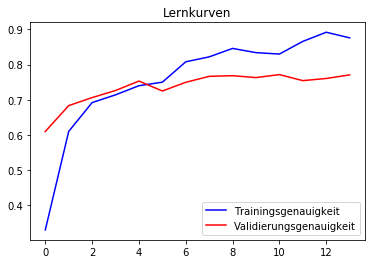

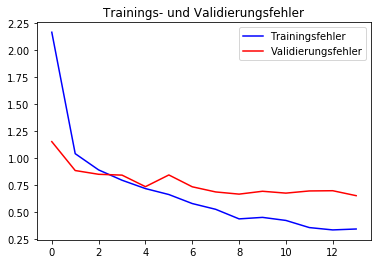

              precision    recall  f1-score   support

     T-shirt       0.69      0.83      0.75      1000
    Trousers       0.99      0.92      0.95      1000
    Pullover       0.58      0.54      0.56      1000
       Dress       0.80      0.81      0.81      1000
        Coat       0.72      0.56      0.63      1000
      Sandal       0.91      0.87      0.89      1000
       Shirt       0.37      0.42      0.39      1000
     Sneaker       0.86      0.90      0.88      1000
         Bag       0.94      0.91      0.92      1000
  Ankle-boot       0.91      0.94      0.92      1000

    accuracy                           0.77     10000
   macro avg       0.78      0.77      0.77     10000
weighted avg       0.78      0.77      0.77     10000



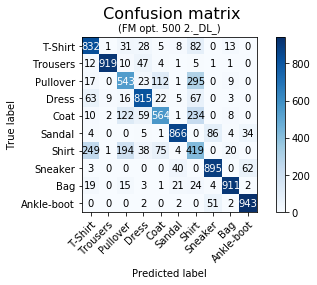

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/14
500/500 [==============================] - 10s 21ms/step - loss: 2.2306 - acc: 0.2600 - val_loss: 1.2093 - val_acc: 0.5617
Epoch 2/14
500/500 [==============================] - 1s 2ms/step - loss: 1.2406 - acc: 0.5900 - val_loss: 0.9313 - val_acc: 0.6673
Epoch 3/14
500/500 [==============================] - 1s 2ms/step - loss: 0.9154 - acc: 0.6820 - val_loss: 0.8857 - val_acc: 0.6731
Epoch 4/14
500/500 [==============================] - 1s 2ms/step - loss: 0.7650 - acc: 0.7320 - val_loss: 0.9943 - val_acc: 0.6514
Epoch 5/14
500/500 [==============================] - 1s 1ms/step - loss: 0.7396 - acc: 0.7420 - val_loss: 0.7973 - val_acc: 0.7255
Epoch 6/14
500/500 [==============================] - 1s 1ms/step - loss: 0.5865 - acc: 0.7860 - val_loss: 0.7238 - val_acc: 0.7449
Epoch 7/14
500/500 [==============================] - 

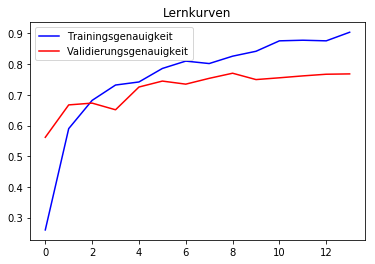

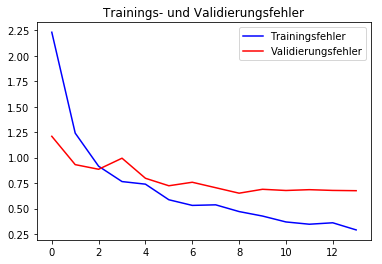

              precision    recall  f1-score   support

     T-shirt       0.68      0.82      0.74      1000
    Trousers       0.99      0.92      0.95      1000
    Pullover       0.57      0.62      0.59      1000
       Dress       0.84      0.76      0.80      1000
        Coat       0.67      0.68      0.68      1000
      Sandal       0.88      0.90      0.89      1000
       Shirt       0.39      0.36      0.38      1000
     Sneaker       0.93      0.80      0.86      1000
         Bag       0.94      0.85      0.89      1000
  Ankle-boot       0.85      0.97      0.91      1000

    accuracy                           0.77     10000
   macro avg       0.77      0.77      0.77     10000
weighted avg       0.77      0.77      0.77     10000



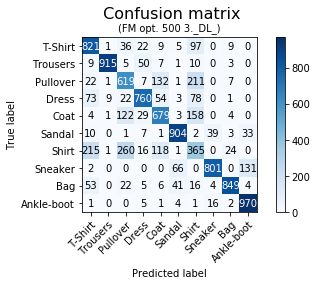

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/14
500/500 [==============================] - 11s 21ms/step - loss: 2.1571 - acc: 0.2960 - val_loss: 1.0129 - val_acc: 0.6630
Epoch 2/14
500/500 [==============================] - 1s 2ms/step - loss: 1.1262 - acc: 0.6160 - val_loss: 0.9184 - val_acc: 0.6792
Epoch 3/14
500/500 [==============================] - 1s 2ms/step - loss: 0.8848 - acc: 0.7040 - val_loss: 0.8190 - val_acc: 0.7088
Epoch 4/14
500/500 [==============================] - 1s 2ms/step - loss: 0.6932 - acc: 0.7380 - val_loss: 0.7596 - val_acc: 0.7258
Epoch 5/14
500/500 [==============================] - 1s 2ms/step - loss: 0.6715 - acc: 0.7520 - val_loss: 0.7223 - val_acc: 0.7385
Epoch 6/14
500/500 [==============================] - 1s 2ms/step - loss: 0.5594 - acc: 0.8140 - val_loss: 0.6944 - val_acc: 0.7510
Epoch 7/14
500/500 [==============================] - 

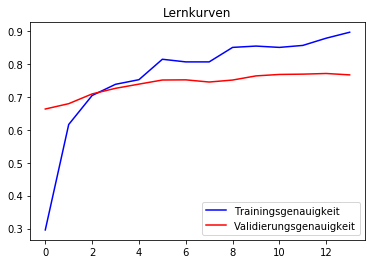

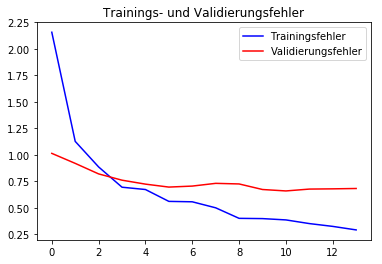

              precision    recall  f1-score   support

     T-shirt       0.70      0.83      0.76      1000
    Trousers       0.98      0.91      0.94      1000
    Pullover       0.63      0.41      0.50      1000
       Dress       0.85      0.74      0.80      1000
        Coat       0.53      0.79      0.64      1000
      Sandal       0.89      0.89      0.89      1000
       Shirt       0.41      0.33      0.37      1000
     Sneaker       0.86      0.91      0.88      1000
         Bag       0.92      0.92      0.92      1000
  Ankle-boot       0.91      0.92      0.92      1000

    accuracy                           0.77     10000
   macro avg       0.77      0.77      0.76     10000
weighted avg       0.77      0.77      0.76     10000



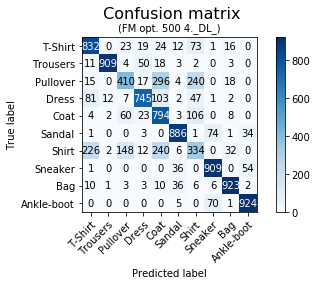

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/14
500/500 [==============================] - 11s 22ms/step - loss: 2.0721 - acc: 0.3240 - val_loss: 1.1166 - val_acc: 0.6253
Epoch 2/14
500/500 [==============================] - 1s 2ms/step - loss: 1.1495 - acc: 0.5940 - val_loss: 0.9128 - val_acc: 0.6677
Epoch 3/14
500/500 [==============================] - 1s 2ms/step - loss: 0.8536 - acc: 0.6920 - val_loss: 0.8854 - val_acc: 0.6916
Epoch 4/14
500/500 [==============================] - 1s 2ms/step - loss: 0.7577 - acc: 0.7260 - val_loss: 0.8468 - val_acc: 0.7156
Epoch 5/14
500/500 [==============================] - 1s 2ms/step - loss: 0.6493 - acc: 0.7700 - val_loss: 0.7799 - val_acc: 0.7237
Epoch 6/14
500/500 [==============================] - 1s 2ms/step - loss: 0.6322 - acc: 0.7740 - val_loss: 0.7114 - val_acc: 0.7455
Epoch 7/14
500/500 [==============================] - 

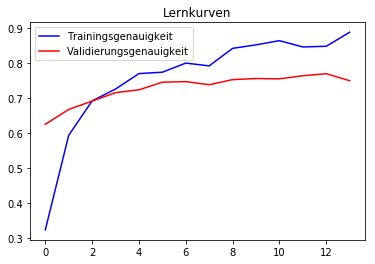

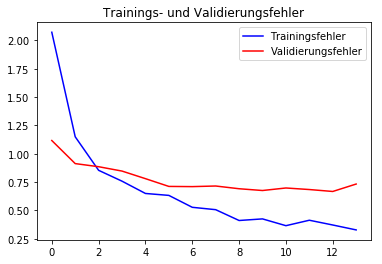

              precision    recall  f1-score   support

     T-shirt       0.76      0.69      0.72      1000
    Trousers       0.99      0.90      0.94      1000
    Pullover       0.61      0.36      0.46      1000
       Dress       0.82      0.77      0.79      1000
        Coat       0.66      0.58      0.62      1000
      Sandal       0.88      0.87      0.88      1000
       Shirt       0.33      0.54      0.41      1000
     Sneaker       0.85      0.91      0.88      1000
         Bag       0.89      0.94      0.92      1000
  Ankle-boot       0.91      0.93      0.92      1000

    accuracy                           0.75     10000
   macro avg       0.77      0.75      0.75     10000
weighted avg       0.77      0.75      0.75     10000



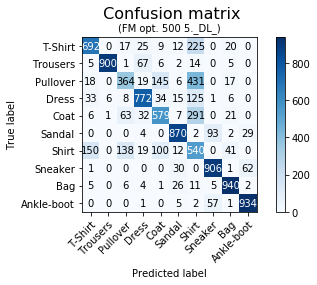

In [33]:
# Trainingsmenge 500
# optimierte Parameter: Dropoutrate: 0.25, Lernrate: 0.001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainieren, mit durchschnittlichen bester Epochenanzahl aus EarlyStopping
fullDataRuns(1, 5, X_tr_500, y_tr_500, X_test, y_test, 0.25, 0.001, False, 14, 500)

In [0]:
downloader_full(500)

In [0]:
def downloader_full(number):
  for i in range(1,6):
    name = str(i)+"._"+str(number)+"_"
    name2 = str(i)+"._DL_"+str(number)+"_"
    files.download(name+"Lernkurve_FM_opt_Feat_acc.png")
    files.download(name+"Lernkurve_FM_opt_loss.png")
    files.download(name2+"Confusion_matrix.png")
    files.download(name2+"FM_opt.hdf5")
    files.download(name2+"FM_opt_weights.hdf5")
    files.download(name2+"Testzeiten.csv")
    files.download(name2+"Trainingszeiten.csv")
    files.download(name2+"beste_Epoche_full.csv")
    files.download(name2+"metrics.csv")
    files.download(name2+"metrics_train.csv")
    files.download(name2+"precision_recall_fscore.csv")
    files.download(name2+"precision_recall_fscore_train.csv")
    files.download(name2+"roc_auc_score_single_class.npy")
    files.download(name2+"roc_auc_score_single_class_train.npy")
    files.download(name2+"y_pred_label.npy")
    files.download(name2+"y_pred_label_train.npy")

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
8/8 [==============================] - 4s 445ms/step - loss: 2.4092 - acc: 0.2204 - val_loss: 1.5140 - val_acc: 0.5000
Epoch 2/300
8/8 [==============================] - 0s 16ms/step - loss: 1.7191 - acc: 0.4227 - val_loss: 1.2035 - val_acc: 0.5000
Epoch 3/300
8/8 [==============================] - 0s 26ms/step - loss: 1.5324 - acc: 0.4224 - val_loss: 1.1479 - val_acc: 0.5400
Epoch 4/300
8/8 [==============================] - 0s 25ms/step - loss: 1.5698 - acc: 0.4700 - val_loss: 1.0165 - val_acc: 0.6400
Epoch 5/300
8/8 [==============================] - 0s 22ms/step - loss: 1.4777 - acc: 0.4462 - val_loss: 1.6349 - val_acc: 0.4800
Epoch 6/300
8/8 [==============================] - 0s 25ms/step - loss: 1.3540 - acc: 0.4759 - val_loss: 1.1997 - val_acc: 0.5800
Epoch 7/300
8/8 [==============================] - 0s 30ms/step - loss: 1.2

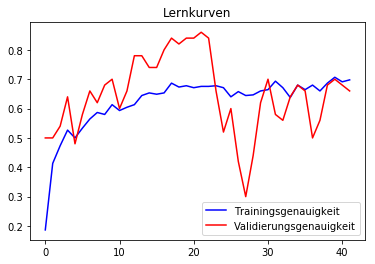

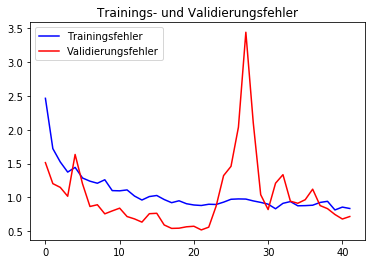

              precision    recall  f1-score   support

     T-shirt       0.67      0.78      0.72      1000
    Trousers       0.89      0.95      0.92      1000
    Pullover       0.59      0.33      0.42      1000
       Dress       0.75      0.76      0.75      1000
        Coat       0.60      0.61      0.60      1000
      Sandal       0.66      0.90      0.76      1000
       Shirt       0.31      0.29      0.30      1000
     Sneaker       0.83      0.71      0.77      1000
         Bag       0.93      0.81      0.86      1000
  Ankle-boot       0.83      0.93      0.87      1000

    accuracy                           0.71     10000
   macro avg       0.70      0.71      0.70     10000
weighted avg       0.70      0.71      0.70     10000



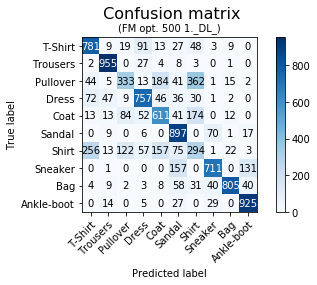

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
8/8 [==============================] - 3s 427ms/step - loss: 2.6107 - acc: 0.2023 - val_loss: 1.4564 - val_acc: 0.5800
Epoch 2/300
8/8 [==============================] - 0s 14ms/step - loss: 1.8072 - acc: 0.3550 - val_loss: 1.2721 - val_acc: 0.5600
Epoch 3/300
8/8 [==============================] - 0s 26ms/step - loss: 1.4712 - acc: 0.4921 - val_loss: 1.2776 - val_acc: 0.5400
Epoch 4/300
8/8 [==============================] - 0s 27ms/step - loss: 1.2198 - acc: 0.5377 - val_loss: 1.0519 - val_acc: 0.6600
Epoch 5/300
8/8 [==============================] - 0s 24ms/step - loss: 1.2985 - acc: 0.5357 - val_loss: 1.0156 - val_acc: 0.6400
Epoch 6/300
8/8 [==============================] - 0s 25ms/step - loss: 1.3078 - acc: 0.5516 - val_loss: 0.9151 - val_acc: 0.6600
Epoch 7/300
8/8 [==============================] - 0s 26ms/step - loss: 1.0

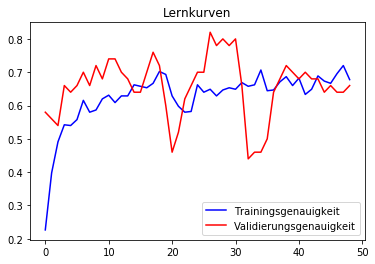

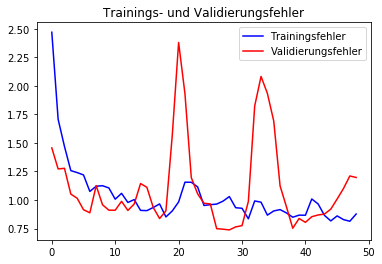

              precision    recall  f1-score   support

     T-shirt       0.68      0.79      0.73      1000
    Trousers       0.98      0.90      0.94      1000
    Pullover       0.45      0.43      0.44      1000
       Dress       0.77      0.73      0.75      1000
        Coat       0.47      0.67      0.55      1000
      Sandal       0.77      0.88      0.82      1000
       Shirt       0.31      0.16      0.21      1000
     Sneaker       0.84      0.81      0.83      1000
         Bag       0.91      0.79      0.84      1000
  Ankle-boot       0.84      0.94      0.89      1000

    accuracy                           0.71     10000
   macro avg       0.70      0.71      0.70     10000
weighted avg       0.70      0.71      0.70     10000



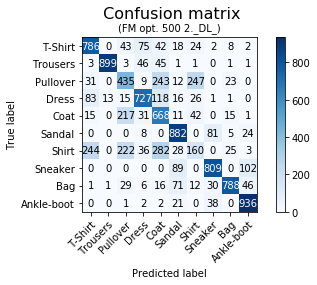

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
8/8 [==============================] - 4s 493ms/step - loss: 2.4875 - acc: 0.1904 - val_loss: 1.6261 - val_acc: 0.5200
Epoch 2/300
8/8 [==============================] - 0s 15ms/step - loss: 1.5884 - acc: 0.4286 - val_loss: 1.2619 - val_acc: 0.5800
Epoch 3/300
8/8 [==============================] - 0s 31ms/step - loss: 1.5232 - acc: 0.4402 - val_loss: 1.1607 - val_acc: 0.6600
Epoch 4/300
8/8 [==============================] - 0s 25ms/step - loss: 1.4867 - acc: 0.5079 - val_loss: 0.9067 - val_acc: 0.6600
Epoch 5/300
8/8 [==============================] - 0s 23ms/step - loss: 1.2674 - acc: 0.5654 - val_loss: 0.9758 - val_acc: 0.6400
Epoch 6/300
8/8 [==============================] - 0s 27ms/step - loss: 1.3241 - acc: 0.5654 - val_loss: 0.9576 - val_acc: 0.6200
Epoch 7/300
8/8 [==============================] - 0s 24ms/step - loss: 1.2

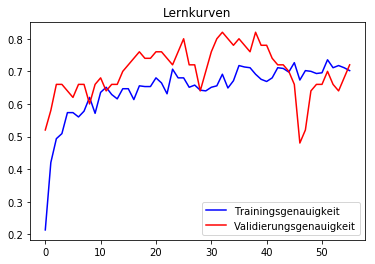

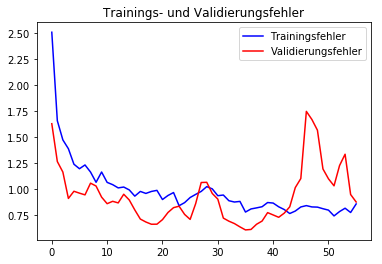

              precision    recall  f1-score   support

     T-shirt       0.78      0.70      0.74      1000
    Trousers       0.95      0.88      0.92      1000
    Pullover       0.51      0.38      0.43      1000
       Dress       0.70      0.78      0.74      1000
        Coat       0.51      0.74      0.60      1000
      Sandal       0.76      0.86      0.81      1000
       Shirt       0.34      0.28      0.31      1000
     Sneaker       0.83      0.84      0.83      1000
         Bag       0.95      0.81      0.88      1000
  Ankle-boot       0.88      0.93      0.90      1000

    accuracy                           0.72     10000
   macro avg       0.72      0.72      0.72     10000
weighted avg       0.72      0.72      0.72     10000



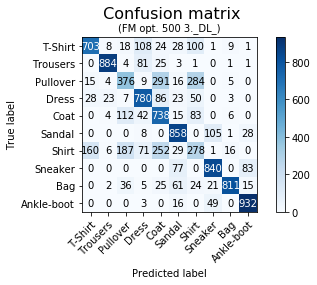

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
8/8 [==============================] - 4s 509ms/step - loss: 2.4068 - acc: 0.2819 - val_loss: 1.6566 - val_acc: 0.4200
Epoch 2/300
8/8 [==============================] - 0s 15ms/step - loss: 1.8519 - acc: 0.3649 - val_loss: 1.2114 - val_acc: 0.6200
Epoch 3/300
8/8 [==============================] - 0s 23ms/step - loss: 1.5171 - acc: 0.4363 - val_loss: 1.1150 - val_acc: 0.6400
Epoch 4/300
8/8 [==============================] - 0s 24ms/step - loss: 1.5157 - acc: 0.5337 - val_loss: 0.9602 - val_acc: 0.6600
Epoch 5/300
8/8 [==============================] - 0s 24ms/step - loss: 1.4763 - acc: 0.5813 - val_loss: 0.8341 - val_acc: 0.7400
Epoch 6/300
8/8 [==============================] - 0s 26ms/step - loss: 1.0906 - acc: 0.6312 - val_loss: 0.7886 - val_acc: 0.7400
Epoch 7/300
8/8 [==============================] - 0s 24ms/step - loss: 1.2

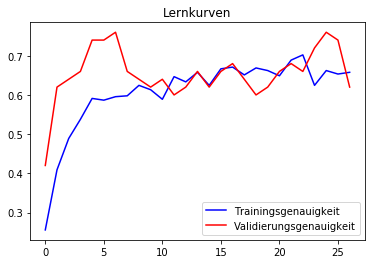

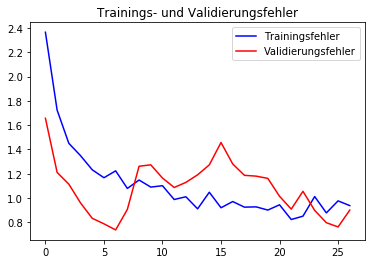

              precision    recall  f1-score   support

     T-shirt       0.71      0.71      0.71      1000
    Trousers       0.99      0.79      0.88      1000
    Pullover       0.41      0.66      0.51      1000
       Dress       0.63      0.72      0.67      1000
        Coat       0.53      0.51      0.52      1000
      Sandal       0.68      0.87      0.76      1000
       Shirt       0.35      0.18      0.24      1000
     Sneaker       0.79      0.81      0.80      1000
         Bag       0.93      0.68      0.79      1000
  Ankle-boot       0.85      0.80      0.82      1000

    accuracy                           0.67     10000
   macro avg       0.69      0.67      0.67     10000
weighted avg       0.69      0.67      0.67     10000



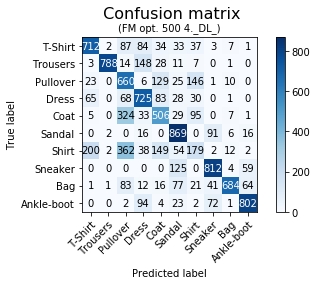

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
8/8 [==============================] - 4s 544ms/step - loss: 2.4472 - acc: 0.2320 - val_loss: 1.4447 - val_acc: 0.5000
Epoch 2/300
8/8 [==============================] - 0s 15ms/step - loss: 1.5962 - acc: 0.3768 - val_loss: 1.2093 - val_acc: 0.6000
Epoch 3/300
8/8 [==============================] - 0s 30ms/step - loss: 1.4811 - acc: 0.4722 - val_loss: 1.2737 - val_acc: 0.5800
Epoch 4/300
8/8 [==============================] - 0s 27ms/step - loss: 1.5473 - acc: 0.4759 - val_loss: 1.3696 - val_acc: 0.5800
Epoch 5/300
8/8 [==============================] - 0s 26ms/step - loss: 1.3214 - acc: 0.5017 - val_loss: 1.3299 - val_acc: 0.6000
Epoch 6/300
8/8 [==============================] - 0s 25ms/step - loss: 1.3118 - acc: 0.5992 - val_loss: 1.3260 - val_acc: 0.6000
Epoch 7/300
8/8 [==============================] - 0s 23ms/step - loss: 1.2

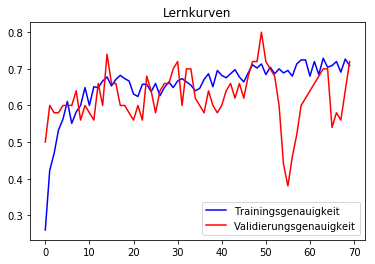

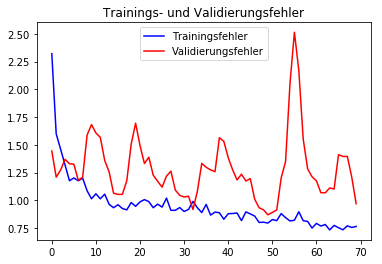

              precision    recall  f1-score   support

     T-shirt       0.64      0.80      0.71      1000
    Trousers       0.96      0.93      0.94      1000
    Pullover       0.55      0.24      0.34      1000
       Dress       0.64      0.89      0.74      1000
        Coat       0.53      0.61      0.57      1000
      Sandal       0.75      0.90      0.82      1000
       Shirt       0.31      0.23      0.26      1000
     Sneaker       0.80      0.83      0.82      1000
         Bag       0.91      0.85      0.88      1000
  Ankle-boot       0.94      0.85      0.89      1000

    accuracy                           0.71     10000
   macro avg       0.70      0.71      0.70     10000
weighted avg       0.70      0.71      0.70     10000



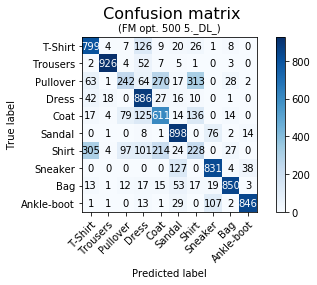

Die durchschnittliche Epochenanzahl beträgt:  28.8


In [0]:
# Trainingsmenge 500
# optimierte Parameter: Dropoutrate: 0.25, Lernrate: 0.001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1, 5, X_tr_500, y_tr_500, 0.25, 0.001, False, 300, 500)

In [0]:
downloader(500)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 900 samples, validate on 100 samples
Epoch 1/300
900/900 [==============================] - 5s 6ms/step - loss: 2.8919 - acc: 0.1367 - val_loss: 2.0170 - val_acc: 0.2900
Epoch 2/300
900/900 [==============================] - 0s 229us/step - loss: 2.5427 - acc: 0.1689 - val_loss: 1.7357 - val_acc: 0.4500
Epoch 3/300
900/900 [==============================] - 0s 219us/step - loss: 2.2676 - acc: 0.2378 - val_loss: 1.5198 - val_acc: 0.5700
Epoch 4/300
900/900 [==============================] - 0s 224us/step - loss: 2.1063 - acc: 0.2789 - val_loss: 1.3634 - val_acc: 0.6100
Epoch 5/300
900/900 [==============================] - 0s 236us/step - loss: 1.9190 - acc: 0.3278 - val_loss: 1.2434 - val_acc: 0.6600
Epoch 6/300
900/900 [==============================] - 0s 226us/step - loss: 1.7145 - acc: 0.4133 - val_loss: 1.1608 - val_acc: 0.6800
Epoch 7/300
900/900 [===

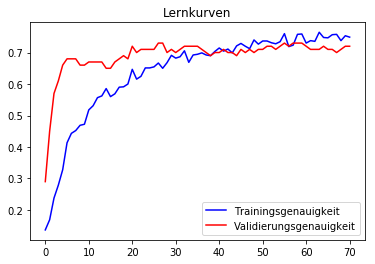

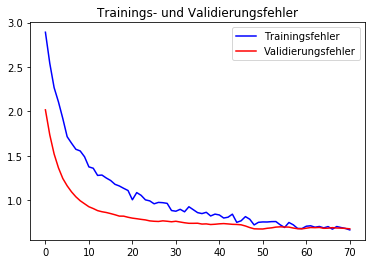

              precision    recall  f1-score   support

     T-shirt       0.73      0.78      0.75      1000
    Trousers       0.97      0.92      0.94      1000
    Pullover       0.61      0.43      0.50      1000
       Dress       0.77      0.80      0.79      1000
        Coat       0.57      0.70      0.63      1000
      Sandal       0.92      0.78      0.84      1000
       Shirt       0.38      0.39      0.38      1000
     Sneaker       0.80      0.89      0.84      1000
         Bag       0.93      0.89      0.91      1000
  Ankle-boot       0.88      0.95      0.91      1000

    accuracy                           0.75     10000
   macro avg       0.76      0.75      0.75     10000
weighted avg       0.76      0.75      0.75     10000



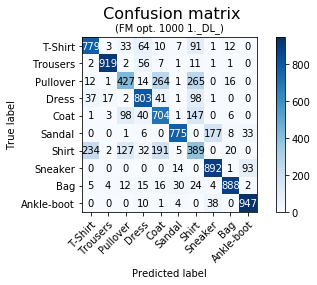

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 900 samples, validate on 100 samples
Epoch 1/300
900/900 [==============================] - 5s 6ms/step - loss: 3.0360 - acc: 0.1011 - val_loss: 2.0348 - val_acc: 0.3800
Epoch 2/300
900/900 [==============================] - 0s 252us/step - loss: 2.5424 - acc: 0.1578 - val_loss: 1.7708 - val_acc: 0.5100
Epoch 3/300
900/900 [==============================] - 0s 238us/step - loss: 2.2813 - acc: 0.2222 - val_loss: 1.5759 - val_acc: 0.5800
Epoch 4/300
900/900 [==============================] - 0s 224us/step - loss: 2.1451 - acc: 0.2778 - val_loss: 1.4419 - val_acc: 0.5900
Epoch 5/300
900/900 [==============================] - 0s 232us/step - loss: 1.9206 - acc: 0.3289 - val_loss: 1.3403 - val_acc: 0.5900
Epoch 6/300
900/900 [==============================] - 0s 240us/step - loss: 1.8490 - acc: 0.3533 - val_loss: 1.2558 - val_acc: 0.6300
Epoch 7/300
900/900 [===

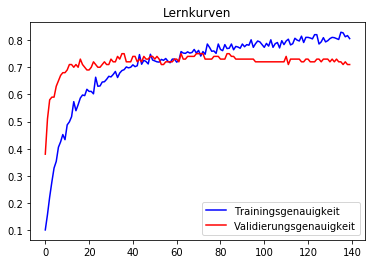

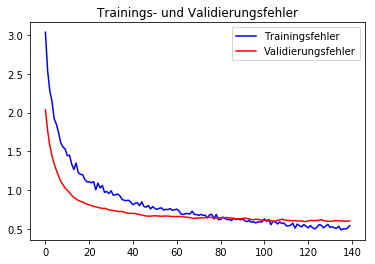

              precision    recall  f1-score   support

     T-shirt       0.77      0.79      0.78      1000
    Trousers       0.97      0.93      0.95      1000
    Pullover       0.57      0.70      0.63      1000
       Dress       0.79      0.84      0.82      1000
        Coat       0.59      0.74      0.66      1000
      Sandal       0.96      0.83      0.89      1000
       Shirt       0.52      0.23      0.32      1000
     Sneaker       0.82      0.95      0.88      1000
         Bag       0.92      0.93      0.92      1000
  Ankle-boot       0.93      0.92      0.93      1000

    accuracy                           0.79     10000
   macro avg       0.79      0.79      0.78     10000
weighted avg       0.79      0.79      0.78     10000



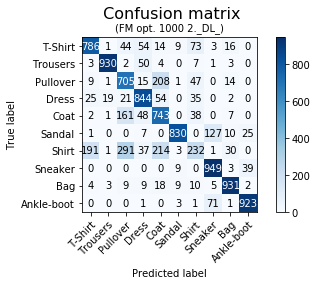

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 900 samples, validate on 100 samples
Epoch 1/300
900/900 [==============================] - 6s 6ms/step - loss: 2.8420 - acc: 0.1289 - val_loss: 1.9532 - val_acc: 0.3700
Epoch 2/300
900/900 [==============================] - 0s 253us/step - loss: 2.4291 - acc: 0.2144 - val_loss: 1.6716 - val_acc: 0.5300
Epoch 3/300
900/900 [==============================] - 0s 235us/step - loss: 2.2100 - acc: 0.2644 - val_loss: 1.4799 - val_acc: 0.5700
Epoch 4/300
900/900 [==============================] - 0s 244us/step - loss: 1.9539 - acc: 0.3222 - val_loss: 1.3554 - val_acc: 0.5900
Epoch 5/300
900/900 [==============================] - 0s 249us/step - loss: 1.8303 - acc: 0.3722 - val_loss: 1.2724 - val_acc: 0.5900
Epoch 6/300
900/900 [==============================] - 0s 231us/step - loss: 1.6969 - acc: 0.3989 - val_loss: 1.1937 - val_acc: 0.6100
Epoch 7/300
900/900 [===

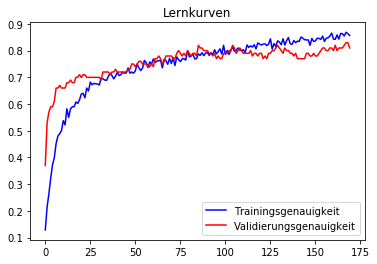

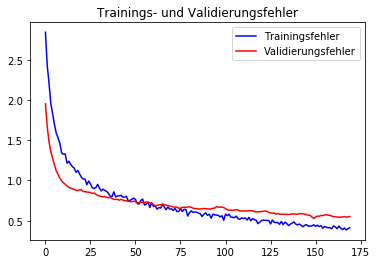

              precision    recall  f1-score   support

     T-shirt       0.80      0.78      0.79      1000
    Trousers       0.98      0.94      0.96      1000
    Pullover       0.66      0.76      0.71      1000
       Dress       0.81      0.86      0.83      1000
        Coat       0.70      0.70      0.70      1000
      Sandal       0.96      0.77      0.86      1000
       Shirt       0.54      0.47      0.50      1000
     Sneaker       0.81      0.95      0.87      1000
         Bag       0.95      0.91      0.93      1000
  Ankle-boot       0.91      0.94      0.92      1000

    accuracy                           0.81     10000
   macro avg       0.81      0.81      0.81     10000
weighted avg       0.81      0.81      0.81     10000



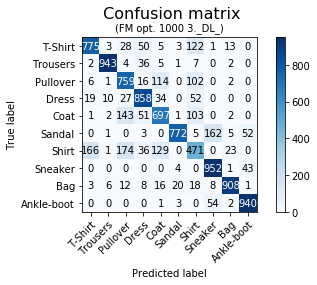

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 900 samples, validate on 100 samples
Epoch 1/300
900/900 [==============================] - 6s 7ms/step - loss: 2.9320 - acc: 0.1278 - val_loss: 2.0221 - val_acc: 0.3700
Epoch 2/300
900/900 [==============================] - 0s 259us/step - loss: 2.5819 - acc: 0.1844 - val_loss: 1.7718 - val_acc: 0.4900
Epoch 3/300
900/900 [==============================] - 0s 240us/step - loss: 2.3199 - acc: 0.2167 - val_loss: 1.5831 - val_acc: 0.5800
Epoch 4/300
900/900 [==============================] - 0s 266us/step - loss: 2.1129 - acc: 0.3189 - val_loss: 1.4404 - val_acc: 0.6100
Epoch 5/300
900/900 [==============================] - 0s 259us/step - loss: 1.9618 - acc: 0.3167 - val_loss: 1.3251 - val_acc: 0.6500
Epoch 6/300
900/900 [==============================] - 0s 254us/step - loss: 1.7872 - acc: 0.3911 - val_loss: 1.2381 - val_acc: 0.6600
Epoch 7/300
900/900 [===

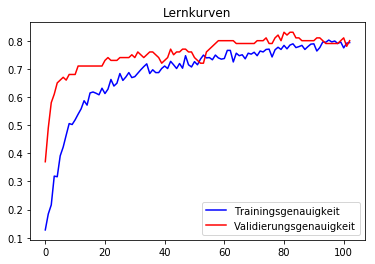

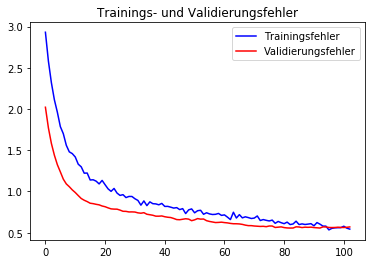

              precision    recall  f1-score   support

     T-shirt       0.77      0.79      0.78      1000
    Trousers       0.97      0.92      0.95      1000
    Pullover       0.57      0.67      0.61      1000
       Dress       0.79      0.82      0.80      1000
        Coat       0.62      0.69      0.65      1000
      Sandal       0.95      0.78      0.85      1000
       Shirt       0.42      0.29      0.35      1000
     Sneaker       0.79      0.94      0.86      1000
         Bag       0.92      0.91      0.92      1000
  Ankle-boot       0.91      0.93      0.92      1000

    accuracy                           0.77     10000
   macro avg       0.77      0.77      0.77     10000
weighted avg       0.77      0.77      0.77     10000



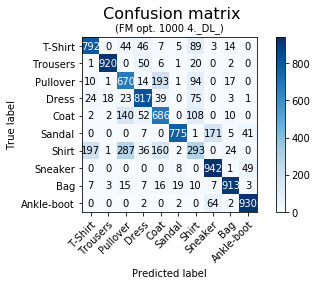

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 900 samples, validate on 100 samples
Epoch 1/300
900/900 [==============================] - 6s 7ms/step - loss: 2.8063 - acc: 0.1344 - val_loss: 1.9179 - val_acc: 0.3300
Epoch 2/300
900/900 [==============================] - 0s 256us/step - loss: 2.4711 - acc: 0.1933 - val_loss: 1.6428 - val_acc: 0.4700
Epoch 3/300
900/900 [==============================] - 0s 269us/step - loss: 2.1847 - acc: 0.2411 - val_loss: 1.4367 - val_acc: 0.5300
Epoch 4/300
900/900 [==============================] - 0s 267us/step - loss: 1.9065 - acc: 0.3444 - val_loss: 1.2801 - val_acc: 0.5600
Epoch 5/300
900/900 [==============================] - 0s 240us/step - loss: 1.8819 - acc: 0.3200 - val_loss: 1.1691 - val_acc: 0.6200
Epoch 6/300
900/900 [==============================] - 0s 255us/step - loss: 1.7366 - acc: 0.4022 - val_loss: 1.0870 - val_acc: 0.6300
Epoch 7/300
900/900 [===

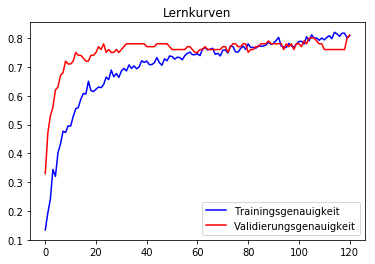

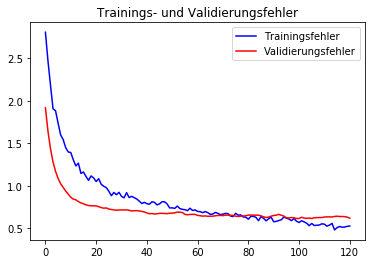

              precision    recall  f1-score   support

     T-shirt       0.78      0.78      0.78      1000
    Trousers       0.99      0.94      0.96      1000
    Pullover       0.57      0.70      0.63      1000
       Dress       0.83      0.83      0.83      1000
        Coat       0.62      0.72      0.66      1000
      Sandal       0.97      0.73      0.83      1000
       Shirt       0.50      0.32      0.39      1000
     Sneaker       0.79      0.92      0.85      1000
         Bag       0.90      0.92      0.91      1000
  Ankle-boot       0.87      0.95      0.91      1000

    accuracy                           0.78     10000
   macro avg       0.78      0.78      0.78     10000
weighted avg       0.78      0.78      0.78     10000



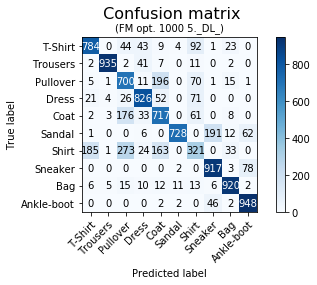

Die durchschnittliche Epochenanzahl beträgt:  101.0


In [0]:
# Trainingsmenge 1000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.0001, mit SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1, 5, X_tr_1000, y_tr_1000, 0.4, 0.0001, True, 300, 1000)

In [0]:
downloader(1000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/101
1000/1000 [==============================] - 11s 11ms/step - loss: 2.9037 - acc: 0.1310 - val_loss: 1.9661 - val_acc: 0.3325
Epoch 2/101
1000/1000 [==============================] - 1s 868us/step - loss: 2.4769 - acc: 0.2120 - val_loss: 1.6732 - val_acc: 0.4816
Epoch 3/101
1000/1000 [==============================] - 1s 870us/step - loss: 2.1511 - acc: 0.2690 - val_loss: 1.4452 - val_acc: 0.5657
Epoch 4/101
1000/1000 [==============================] - 1s 867us/step - loss: 1.9236 - acc: 0.3470 - val_loss: 1.2816 - val_acc: 0.6040
Epoch 5/101
1000/1000 [==============================] - 1s 848us/step - loss: 1.7493 - acc: 0.3990 - val_loss: 1.1723 - val_acc: 0.6247
Epoch 6/101
1000/1000 [==============================] - 1s 897us/step - loss: 1.5644 - acc: 0.4550 - val_loss: 1.0782 - val_acc: 0.6556
Epoch 7/101
1000/1000 [==

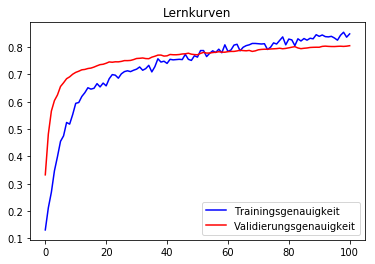

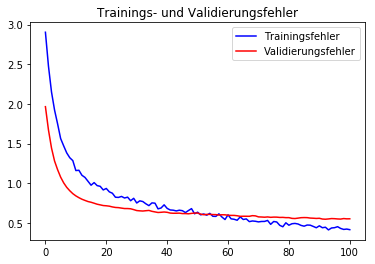

              precision    recall  f1-score   support

     T-shirt       0.79      0.77      0.78      1000
    Trousers       0.99      0.93      0.96      1000
    Pullover       0.67      0.72      0.69      1000
       Dress       0.82      0.84      0.83      1000
        Coat       0.68      0.71      0.70      1000
      Sandal       0.97      0.77      0.86      1000
       Shirt       0.51      0.47      0.49      1000
     Sneaker       0.81      0.96      0.87      1000
         Bag       0.91      0.94      0.92      1000
  Ankle-boot       0.92      0.94      0.93      1000

    accuracy                           0.80     10000
   macro avg       0.81      0.80      0.80     10000
weighted avg       0.81      0.80      0.80     10000



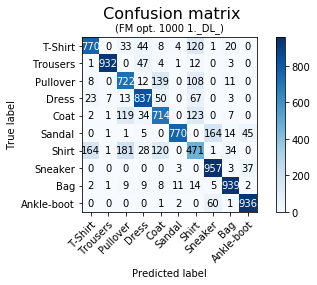

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/101
1000/1000 [==============================] - 12s 12ms/step - loss: 2.7982 - acc: 0.1430 - val_loss: 2.0003 - val_acc: 0.3365
Epoch 2/101
1000/1000 [==============================] - 1s 876us/step - loss: 2.3921 - acc: 0.2030 - val_loss: 1.6705 - val_acc: 0.5077
Epoch 3/101
1000/1000 [==============================] - 1s 901us/step - loss: 2.1099 - acc: 0.2880 - val_loss: 1.4310 - val_acc: 0.5780
Epoch 4/101
1000/1000 [==============================] - 1s 957us/step - loss: 1.8329 - acc: 0.3800 - val_loss: 1.2502 - val_acc: 0.6216
Epoch 5/101
1000/1000 [==============================] - 1s 906us/step - loss: 1.7363 - acc: 0.4080 - val_loss: 1.1229 - val_acc: 0.6436
Epoch 6/101
1000/1000 [==============================] - 1s 901us/step - loss: 1.5770 - acc: 0.4380 - val_loss: 1.0311 - val_acc: 0.6668
Epoch 7/101
1000/1000 [==

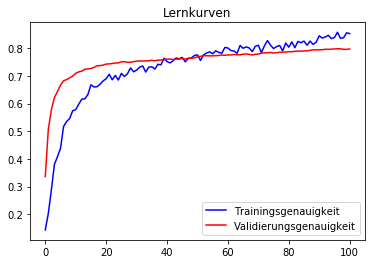

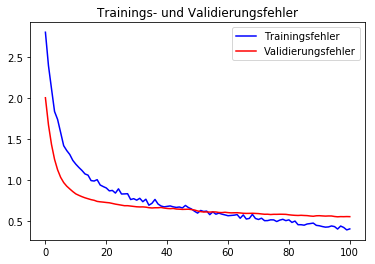

              precision    recall  f1-score   support

     T-shirt       0.79      0.77      0.78      1000
    Trousers       0.98      0.93      0.96      1000
    Pullover       0.60      0.77      0.68      1000
       Dress       0.82      0.85      0.83      1000
        Coat       0.67      0.73      0.70      1000
      Sandal       0.98      0.79      0.87      1000
       Shirt       0.49      0.33      0.39      1000
     Sneaker       0.84      0.91      0.87      1000
         Bag       0.92      0.94      0.93      1000
  Ankle-boot       0.87      0.96      0.91      1000

    accuracy                           0.80     10000
   macro avg       0.80      0.80      0.79     10000
weighted avg       0.80      0.80      0.79     10000



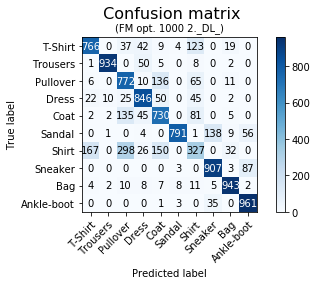

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/101
1000/1000 [==============================] - 12s 12ms/step - loss: 2.8653 - acc: 0.1210 - val_loss: 2.0214 - val_acc: 0.2970
Epoch 2/101
1000/1000 [==============================] - 1s 979us/step - loss: 2.4970 - acc: 0.1670 - val_loss: 1.7306 - val_acc: 0.4602
Epoch 3/101
1000/1000 [==============================] - 1s 878us/step - loss: 2.1458 - acc: 0.2710 - val_loss: 1.5085 - val_acc: 0.5665
Epoch 4/101
1000/1000 [==============================] - 1s 895us/step - loss: 1.9598 - acc: 0.3330 - val_loss: 1.3405 - val_acc: 0.6192
Epoch 5/101
1000/1000 [==============================] - 1s 907us/step - loss: 1.7426 - acc: 0.4030 - val_loss: 1.2104 - val_acc: 0.6443
Epoch 6/101
1000/1000 [==============================] - 1s 864us/step - loss: 1.6574 - acc: 0.4260 - val_loss: 1.1121 - val_acc: 0.6584
Epoch 7/101
1000/1000 [==

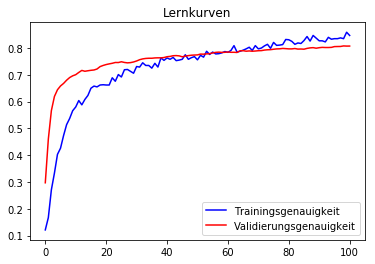

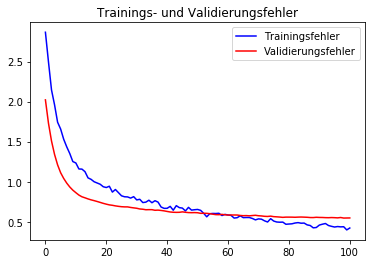

              precision    recall  f1-score   support

     T-shirt       0.79      0.77      0.78      1000
    Trousers       0.99      0.93      0.96      1000
    Pullover       0.70      0.69      0.69      1000
       Dress       0.80      0.86      0.83      1000
        Coat       0.70      0.69      0.70      1000
      Sandal       0.98      0.83      0.89      1000
       Shirt       0.49      0.51      0.50      1000
     Sneaker       0.85      0.91      0.88      1000
         Bag       0.93      0.94      0.94      1000
  Ankle-boot       0.88      0.96      0.92      1000

    accuracy                           0.81     10000
   macro avg       0.81      0.81      0.81     10000
weighted avg       0.81      0.81      0.81     10000



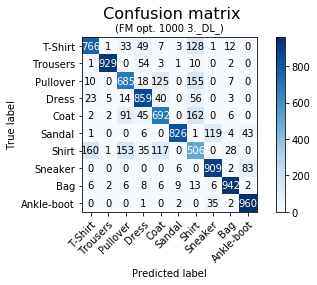

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/101
1000/1000 [==============================] - 13s 13ms/step - loss: 2.8400 - acc: 0.1310 - val_loss: 1.9773 - val_acc: 0.3273
Epoch 2/101
1000/1000 [==============================] - 1s 992us/step - loss: 2.3536 - acc: 0.1970 - val_loss: 1.6597 - val_acc: 0.4934
Epoch 3/101
1000/1000 [==============================] - 1s 995us/step - loss: 2.0640 - acc: 0.3070 - val_loss: 1.4256 - val_acc: 0.5834
Epoch 4/101
1000/1000 [==============================] - 1s 953us/step - loss: 1.8379 - acc: 0.3570 - val_loss: 1.2543 - val_acc: 0.6263
Epoch 5/101
1000/1000 [==============================] - 1s 964us/step - loss: 1.6421 - acc: 0.4250 - val_loss: 1.1352 - val_acc: 0.6466
Epoch 6/101
1000/1000 [==============================] - 1s 1ms/step - loss: 1.5828 - acc: 0.4550 - val_loss: 1.0454 - val_acc: 0.6663
Epoch 7/101
1000/1000 [====

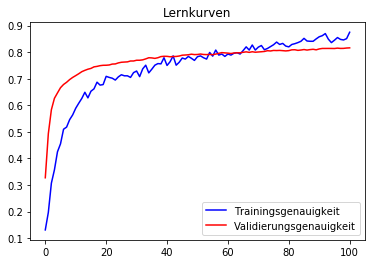

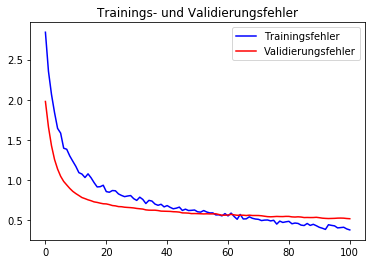

              precision    recall  f1-score   support

     T-shirt       0.81      0.77      0.79      1000
    Trousers       0.99      0.94      0.96      1000
    Pullover       0.69      0.71      0.70      1000
       Dress       0.81      0.86      0.83      1000
        Coat       0.67      0.77      0.71      1000
      Sandal       0.97      0.84      0.90      1000
       Shirt       0.55      0.47      0.51      1000
     Sneaker       0.86      0.93      0.89      1000
         Bag       0.94      0.93      0.93      1000
  Ankle-boot       0.90      0.95      0.92      1000

    accuracy                           0.82     10000
   macro avg       0.82      0.82      0.82     10000
weighted avg       0.82      0.82      0.82     10000



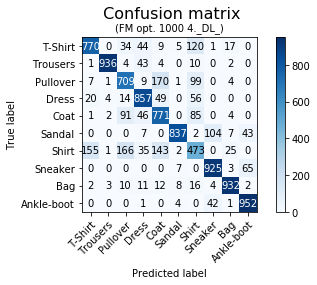

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/101
1000/1000 [==============================] - 13s 13ms/step - loss: 2.9130 - acc: 0.1300 - val_loss: 2.0255 - val_acc: 0.2706
Epoch 2/101
1000/1000 [==============================] - 1s 1ms/step - loss: 2.4853 - acc: 0.1870 - val_loss: 1.7245 - val_acc: 0.4415
Epoch 3/101
1000/1000 [==============================] - 1s 912us/step - loss: 2.1350 - acc: 0.2500 - val_loss: 1.4914 - val_acc: 0.5444
Epoch 4/101
1000/1000 [==============================] - 1s 936us/step - loss: 1.9221 - acc: 0.3160 - val_loss: 1.3138 - val_acc: 0.5974
Epoch 5/101
1000/1000 [==============================] - 1s 924us/step - loss: 1.7127 - acc: 0.3860 - val_loss: 1.1833 - val_acc: 0.6347
Epoch 6/101
1000/1000 [==============================] - 1s 904us/step - loss: 1.6168 - acc: 0.4330 - val_loss: 1.0862 - val_acc: 0.6595
Epoch 7/101
1000/1000 [====

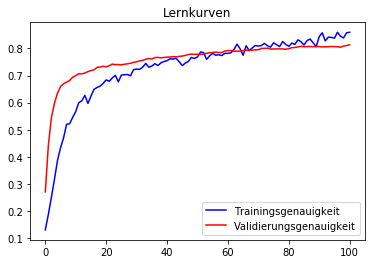

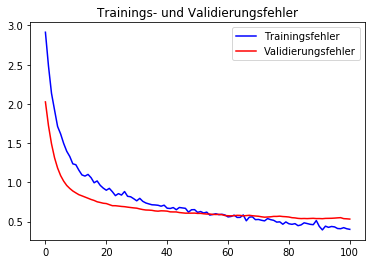

              precision    recall  f1-score   support

     T-shirt       0.79      0.79      0.79      1000
    Trousers       0.98      0.94      0.96      1000
    Pullover       0.70      0.69      0.70      1000
       Dress       0.82      0.84      0.83      1000
        Coat       0.64      0.78      0.70      1000
      Sandal       0.96      0.82      0.89      1000
       Shirt       0.56      0.43      0.49      1000
     Sneaker       0.85      0.93      0.89      1000
         Bag       0.93      0.94      0.93      1000
  Ankle-boot       0.90      0.96      0.93      1000

    accuracy                           0.81     10000
   macro avg       0.81      0.81      0.81     10000
weighted avg       0.81      0.81      0.81     10000



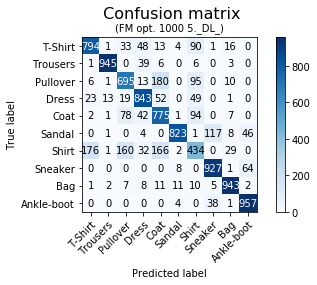

In [38]:
# Trainingsmenge 1000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.0001, mit SpatialDropout
# 5 Modelle mit EarlyStopping trainieren, mit durchschnittlichen bester Epochenanzahl aus EarlyStopping
fullDataRuns(1, 5, X_tr_1000, y_tr_1000, X_test, y_test, 0.4, 0.0001, True, 101, 1000)

In [0]:
downloader_full(1000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
15/15 [==============================] - 6s 428ms/step - loss: 2.8372 - acc: 0.1454 - val_loss: 2.1257 - val_acc: 0.2500
Epoch 2/300
15/15 [==============================] - 0s 17ms/step - loss: 2.6322 - acc: 0.1527 - val_loss: 1.8563 - val_acc: 0.3600
Epoch 3/300
15/15 [==============================] - 0s 23ms/step - loss: 2.5872 - acc: 0.1590 - val_loss: 1.6616 - val_acc: 0.4500
Epoch 4/300
15/15 [==============================] - 0s 26ms/step - loss: 2.3913 - acc: 0.1966 - val_loss: 1.5386 - val_acc: 0.5000
Epoch 5/300
15/15 [==============================] - 0s 27ms/step - loss: 2.2454 - acc: 0.2395 - val_loss: 1.4420 - val_acc: 0.5800
Epoch 6/300
15/15 [==============================] - 0s 25ms/step - loss: 2.1998 - acc: 0.2542 - val_loss: 1.3496 - val_acc: 0.6100
Epoch 7/300
15/15 [==============================] - 0s 27ms/st

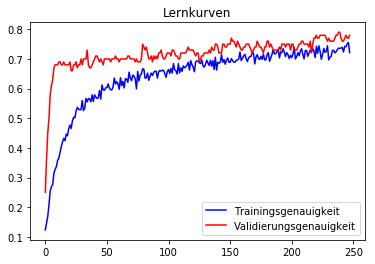

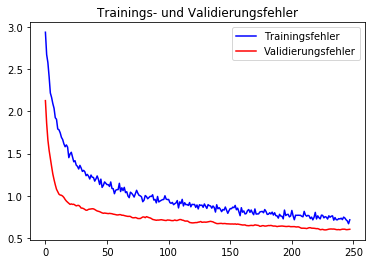

              precision    recall  f1-score   support

     T-shirt       0.73      0.81      0.77      1000
    Trousers       0.96      0.96      0.96      1000
    Pullover       0.51      0.76      0.61      1000
       Dress       0.79      0.81      0.80      1000
        Coat       0.65      0.59      0.62      1000
      Sandal       0.90      0.85      0.88      1000
       Shirt       0.41      0.16      0.23      1000
     Sneaker       0.84      0.89      0.86      1000
         Bag       0.92      0.92      0.92      1000
  Ankle-boot       0.90      0.94      0.92      1000

    accuracy                           0.77     10000
   macro avg       0.76      0.77      0.76     10000
weighted avg       0.76      0.77      0.76     10000



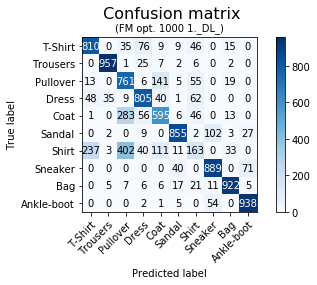

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
15/15 [==============================] - 8s 510ms/step - loss: 2.9387 - acc: 0.1109 - val_loss: 2.0489 - val_acc: 0.2100
Epoch 2/300
15/15 [==============================] - 0s 18ms/step - loss: 2.6891 - acc: 0.1245 - val_loss: 1.8005 - val_acc: 0.3800
Epoch 3/300
15/15 [==============================] - 0s 26ms/step - loss: 2.5785 - acc: 0.1684 - val_loss: 1.6494 - val_acc: 0.4400
Epoch 4/300
15/15 [==============================] - 0s 27ms/step - loss: 2.3246 - acc: 0.2280 - val_loss: 1.5418 - val_acc: 0.5000
Epoch 5/300
15/15 [==============================] - 0s 27ms/step - loss: 2.2337 - acc: 0.2458 - val_loss: 1.4492 - val_acc: 0.5500
Epoch 6/300
15/15 [==============================] - 0s 29ms/step - loss: 2.1253 - acc: 0.2646 - val_loss: 1.3580 - val_acc: 0.5800
Epoch 7/300
15/15 [==============================] - 0s 27ms/st

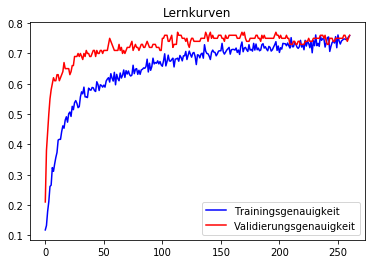

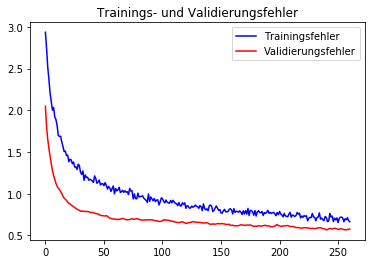

              precision    recall  f1-score   support

     T-shirt       0.75      0.80      0.77      1000
    Trousers       0.97      0.96      0.97      1000
    Pullover       0.56      0.75      0.64      1000
       Dress       0.80      0.84      0.82      1000
        Coat       0.67      0.63      0.65      1000
      Sandal       0.89      0.89      0.89      1000
       Shirt       0.47      0.27      0.34      1000
     Sneaker       0.87      0.86      0.86      1000
         Bag       0.92      0.91      0.92      1000
  Ankle-boot       0.90      0.95      0.93      1000

    accuracy                           0.79     10000
   macro avg       0.78      0.79      0.78     10000
weighted avg       0.78      0.79      0.78     10000



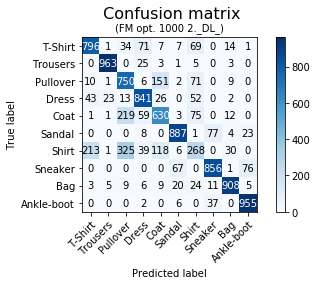

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
15/15 [==============================] - 8s 519ms/step - loss: 2.8813 - acc: 0.1151 - val_loss: 2.1350 - val_acc: 0.2500
Epoch 2/300
15/15 [==============================] - 0s 18ms/step - loss: 2.6353 - acc: 0.1454 - val_loss: 1.9128 - val_acc: 0.3200
Epoch 3/300
15/15 [==============================] - 0s 25ms/step - loss: 2.5072 - acc: 0.1987 - val_loss: 1.7332 - val_acc: 0.4000
Epoch 4/300
15/15 [==============================] - 0s 27ms/step - loss: 2.3534 - acc: 0.2061 - val_loss: 1.5963 - val_acc: 0.4300
Epoch 5/300
15/15 [==============================] - 0s 27ms/step - loss: 2.2829 - acc: 0.2280 - val_loss: 1.4968 - val_acc: 0.5100
Epoch 6/300
15/15 [==============================] - 0s 26ms/step - loss: 2.3313 - acc: 0.2510 - val_loss: 1.4112 - val_acc: 0.5100
Epoch 7/300
15/15 [==============================] - 0s 27ms/st

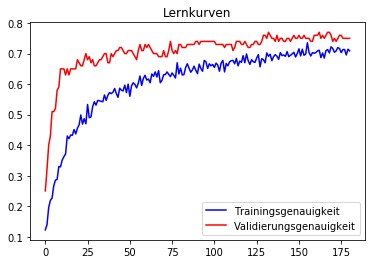

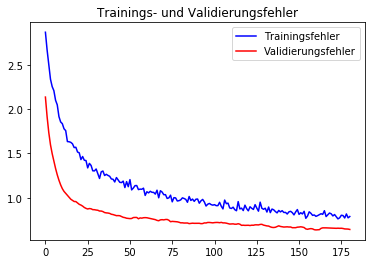

              precision    recall  f1-score   support

     T-shirt       0.73      0.79      0.76      1000
    Trousers       0.97      0.96      0.96      1000
    Pullover       0.49      0.75      0.60      1000
       Dress       0.78      0.80      0.79      1000
        Coat       0.60      0.62      0.61      1000
      Sandal       0.90      0.82      0.86      1000
       Shirt       0.42      0.12      0.19      1000
     Sneaker       0.82      0.87      0.85      1000
         Bag       0.91      0.91      0.91      1000
  Ankle-boot       0.87      0.95      0.91      1000

    accuracy                           0.76     10000
   macro avg       0.75      0.76      0.74     10000
weighted avg       0.75      0.76      0.74     10000



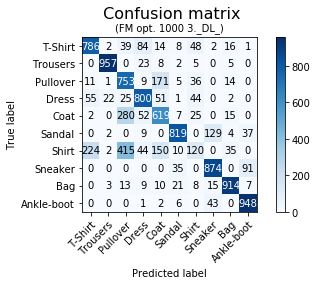

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
15/15 [==============================] - 8s 521ms/step - loss: 2.8326 - acc: 0.1297 - val_loss: 2.0440 - val_acc: 0.2000
Epoch 2/300
15/15 [==============================] - 0s 18ms/step - loss: 2.6833 - acc: 0.1559 - val_loss: 1.8636 - val_acc: 0.3400
Epoch 3/300
15/15 [==============================] - 0s 25ms/step - loss: 2.5199 - acc: 0.1872 - val_loss: 1.7151 - val_acc: 0.4000
Epoch 4/300
15/15 [==============================] - 0s 26ms/step - loss: 2.3166 - acc: 0.2134 - val_loss: 1.5791 - val_acc: 0.4300
Epoch 5/300
15/15 [==============================] - 0s 27ms/step - loss: 2.1972 - acc: 0.2186 - val_loss: 1.4745 - val_acc: 0.4500
Epoch 6/300
15/15 [==============================] - 0s 26ms/step - loss: 2.1130 - acc: 0.2636 - val_loss: 1.3726 - val_acc: 0.5300
Epoch 7/300
15/15 [==============================] - 0s 29ms/st

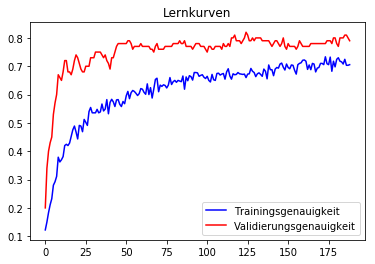

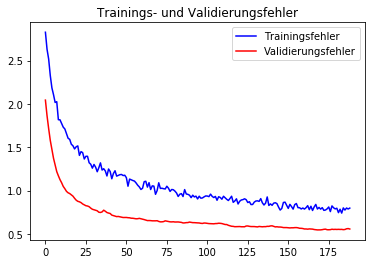

              precision    recall  f1-score   support

     T-shirt       0.73      0.80      0.76      1000
    Trousers       0.96      0.96      0.96      1000
    Pullover       0.56      0.72      0.63      1000
       Dress       0.80      0.79      0.79      1000
        Coat       0.65      0.63      0.64      1000
      Sandal       0.91      0.84      0.87      1000
       Shirt       0.48      0.32      0.38      1000
     Sneaker       0.84      0.89      0.87      1000
         Bag       0.94      0.90      0.91      1000
  Ankle-boot       0.89      0.95      0.92      1000

    accuracy                           0.78     10000
   macro avg       0.78      0.78      0.77     10000
weighted avg       0.78      0.78      0.77     10000



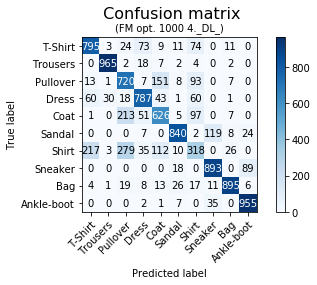

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
15/15 [==============================] - 8s 533ms/step - loss: 2.8926 - acc: 0.1255 - val_loss: 1.9838 - val_acc: 0.3300
Epoch 2/300
15/15 [==============================] - 0s 20ms/step - loss: 2.5878 - acc: 0.1778 - val_loss: 1.7705 - val_acc: 0.3900
Epoch 3/300
15/15 [==============================] - 0s 25ms/step - loss: 2.5040 - acc: 0.1925 - val_loss: 1.6144 - val_acc: 0.4200
Epoch 4/300
15/15 [==============================] - 0s 27ms/step - loss: 2.3192 - acc: 0.2238 - val_loss: 1.4866 - val_acc: 0.4600
Epoch 5/300
15/15 [==============================] - 0s 27ms/step - loss: 2.2562 - acc: 0.2584 - val_loss: 1.3963 - val_acc: 0.5100
Epoch 6/300
15/15 [==============================] - 0s 28ms/step - loss: 2.1437 - acc: 0.2772 - val_loss: 1.3255 - val_acc: 0.5400
Epoch 7/300
15/15 [==============================] - 0s 27ms/st

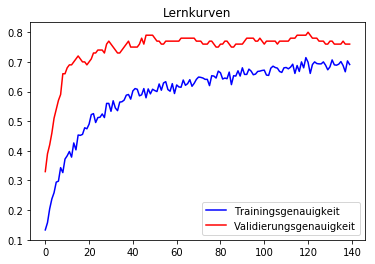

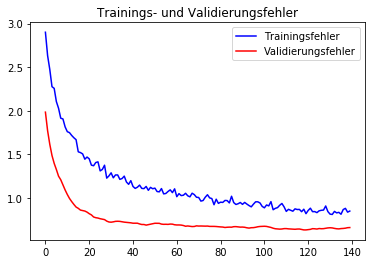

              precision    recall  f1-score   support

     T-shirt       0.74      0.79      0.76      1000
    Trousers       0.93      0.96      0.95      1000
    Pullover       0.51      0.72      0.60      1000
       Dress       0.77      0.79      0.78      1000
        Coat       0.62      0.60      0.61      1000
      Sandal       0.89      0.85      0.87      1000
       Shirt       0.39      0.17      0.24      1000
     Sneaker       0.86      0.86      0.86      1000
         Bag       0.89      0.92      0.90      1000
  Ankle-boot       0.88      0.95      0.92      1000

    accuracy                           0.76     10000
   macro avg       0.75      0.76      0.75     10000
weighted avg       0.75      0.76      0.75     10000



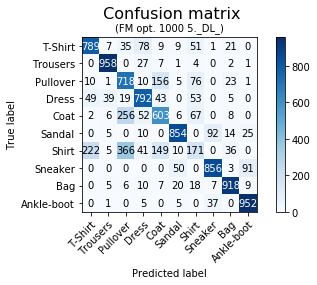

Die durchschnittliche Epochenanzahl beträgt:  183.8


In [0]:
# Trainingsmenge 1000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.0001, mit SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1, 5, X_tr_1000, y_tr_1000, 0.4, 0.0001, True, 300, 1000)

In [0]:
downloader(1000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 9s 5ms/step - loss: 1.4437 - acc: 0.5211 - val_loss: 0.7606 - val_acc: 0.7500
Epoch 2/300
1800/1800 [==============================] - 0s 233us/step - loss: 0.7738 - acc: 0.7178 - val_loss: 0.6183 - val_acc: 0.7850
Epoch 3/300
1800/1800 [==============================] - 0s 221us/step - loss: 0.6758 - acc: 0.7494 - val_loss: 0.5660 - val_acc: 0.8050
Epoch 4/300
1800/1800 [==============================] - 0s 204us/step - loss: 0.6154 - acc: 0.7761 - val_loss: 0.5227 - val_acc: 0.8400
Epoch 5/300
1800/1800 [==============================] - 0s 203us/step - loss: 0.5910 - acc: 0.7872 - val_loss: 0.5298 - val_acc: 0.8500
Epoch 6/300
1800/1800 [==============================] - 0s 214us/step - loss: 0.5262 - acc: 0.8028 - val_loss: 0.5114 - val_acc: 0.8400
Epoch 7/300

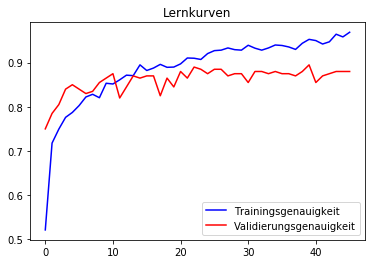

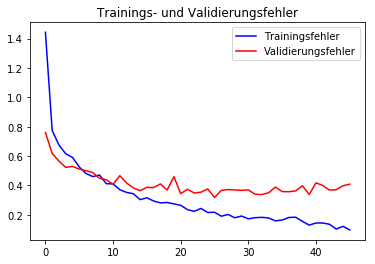

              precision    recall  f1-score   support

     T-shirt       0.81      0.82      0.81      1000
    Trousers       0.99      0.93      0.96      1000
    Pullover       0.83      0.71      0.77      1000
       Dress       0.87      0.87      0.87      1000
        Coat       0.77      0.79      0.78      1000
      Sandal       0.98      0.91      0.94      1000
       Shirt       0.55      0.64      0.59      1000
     Sneaker       0.93      0.89      0.91      1000
         Bag       0.94      0.95      0.95      1000
  Ankle-boot       0.88      0.97      0.92      1000

    accuracy                           0.85     10000
   macro avg       0.86      0.85      0.85     10000
weighted avg       0.86      0.85      0.85     10000



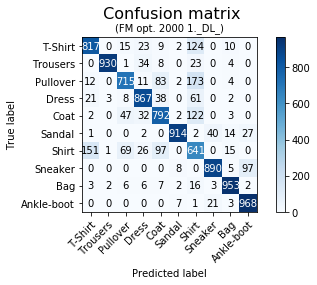

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 9s 5ms/step - loss: 1.5054 - acc: 0.5033 - val_loss: 0.6983 - val_acc: 0.7600
Epoch 2/300
1800/1800 [==============================] - 1s 280us/step - loss: 0.8292 - acc: 0.7028 - val_loss: 0.6124 - val_acc: 0.7800
Epoch 3/300
1800/1800 [==============================] - 0s 258us/step - loss: 0.7082 - acc: 0.7472 - val_loss: 0.5639 - val_acc: 0.8150
Epoch 4/300
1800/1800 [==============================] - 0s 269us/step - loss: 0.6168 - acc: 0.7628 - val_loss: 0.4785 - val_acc: 0.8150
Epoch 5/300
1800/1800 [==============================] - 0s 270us/step - loss: 0.6076 - acc: 0.7828 - val_loss: 0.5340 - val_acc: 0.8250
Epoch 6/300
1800/1800 [==============================] - 0s 257us/step - loss: 0.5510 - acc: 0.7967 - val_loss: 0.4354 - val_acc: 0.8250
Epoch 7/300

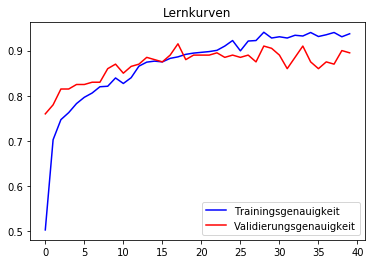

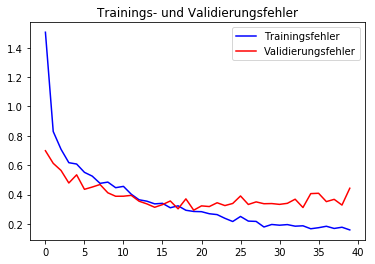

              precision    recall  f1-score   support

     T-shirt       0.80      0.80      0.80      1000
    Trousers       0.98      0.96      0.97      1000
    Pullover       0.82      0.70      0.76      1000
       Dress       0.88      0.83      0.86      1000
        Coat       0.75      0.78      0.76      1000
      Sandal       0.92      0.95      0.94      1000
       Shirt       0.53      0.62      0.57      1000
     Sneaker       0.92      0.95      0.93      1000
         Bag       0.97      0.94      0.95      1000
  Ankle-boot       0.96      0.94      0.95      1000

    accuracy                           0.85     10000
   macro avg       0.85      0.85      0.85     10000
weighted avg       0.85      0.85      0.85     10000



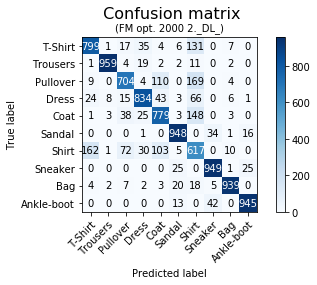

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 10s 5ms/step - loss: 1.4956 - acc: 0.5017 - val_loss: 0.9477 - val_acc: 0.7150
Epoch 2/300
1800/1800 [==============================] - 0s 259us/step - loss: 0.7978 - acc: 0.7017 - val_loss: 0.9504 - val_acc: 0.7250
Epoch 3/300
1800/1800 [==============================] - 0s 248us/step - loss: 0.7086 - acc: 0.7372 - val_loss: 0.7362 - val_acc: 0.7450
Epoch 4/300
1800/1800 [==============================] - 0s 247us/step - loss: 0.6148 - acc: 0.7733 - val_loss: 0.7647 - val_acc: 0.7800
Epoch 5/300
1800/1800 [==============================] - 0s 228us/step - loss: 0.5752 - acc: 0.7811 - val_loss: 0.6394 - val_acc: 0.7950
Epoch 6/300
1800/1800 [==============================] - 0s 238us/step - loss: 0.5446 - acc: 0.7922 - val_loss: 0.6474 - val_acc: 0.7850
Epoch 7/30

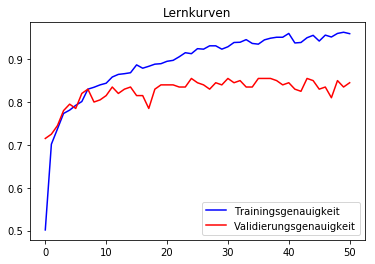

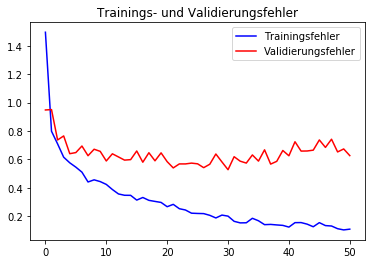

              precision    recall  f1-score   support

     T-shirt       0.85      0.75      0.80      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.75      0.83      0.79      1000
       Dress       0.91      0.82      0.86      1000
        Coat       0.72      0.85      0.78      1000
      Sandal       0.97      0.93      0.95      1000
       Shirt       0.63      0.58      0.60      1000
     Sneaker       0.92      0.92      0.92      1000
         Bag       0.94      0.96      0.95      1000
  Ankle-boot       0.91      0.96      0.94      1000

    accuracy                           0.86     10000
   macro avg       0.86      0.86      0.86     10000
weighted avg       0.86      0.86      0.86     10000



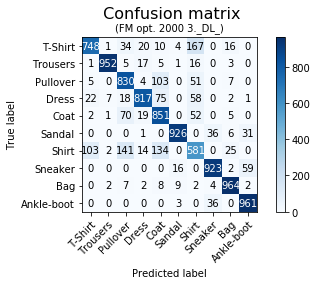

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 10s 5ms/step - loss: 1.4150 - acc: 0.5356 - val_loss: 1.0826 - val_acc: 0.6550
Epoch 2/300
1800/1800 [==============================] - 0s 263us/step - loss: 0.7834 - acc: 0.7144 - val_loss: 0.9319 - val_acc: 0.6950
Epoch 3/300
1800/1800 [==============================] - 0s 233us/step - loss: 0.6712 - acc: 0.7483 - val_loss: 0.7870 - val_acc: 0.7600
Epoch 4/300
1800/1800 [==============================] - 0s 238us/step - loss: 0.6235 - acc: 0.7672 - val_loss: 0.7382 - val_acc: 0.7900
Epoch 5/300
1800/1800 [==============================] - 0s 260us/step - loss: 0.5556 - acc: 0.7839 - val_loss: 0.6662 - val_acc: 0.7900
Epoch 6/300
1800/1800 [==============================] - 0s 246us/step - loss: 0.5333 - acc: 0.7972 - val_loss: 0.6561 - val_acc: 0.8150
Epoch 7/30

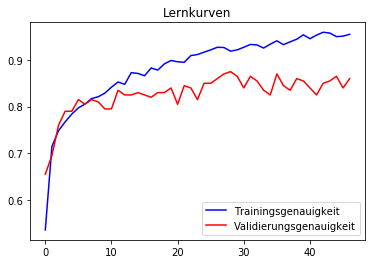

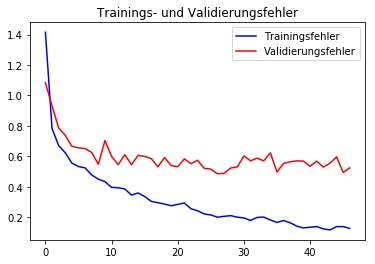

              precision    recall  f1-score   support

     T-shirt       0.79      0.81      0.80      1000
    Trousers       0.99      0.96      0.97      1000
    Pullover       0.76      0.82      0.79      1000
       Dress       0.86      0.85      0.86      1000
        Coat       0.79      0.72      0.75      1000
      Sandal       0.96      0.92      0.94      1000
       Shirt       0.59      0.60      0.59      1000
     Sneaker       0.92      0.91      0.91      1000
         Bag       0.94      0.96      0.95      1000
  Ankle-boot       0.92      0.96      0.94      1000

    accuracy                           0.85     10000
   macro avg       0.85      0.85      0.85     10000
weighted avg       0.85      0.85      0.85     10000



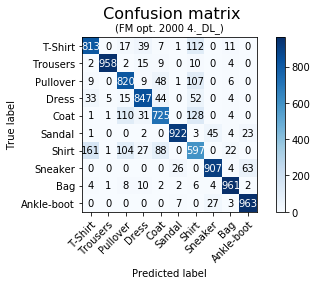

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 10s 6ms/step - loss: 1.3705 - acc: 0.5411 - val_loss: 0.8924 - val_acc: 0.7300
Epoch 2/300
1800/1800 [==============================] - 1s 282us/step - loss: 0.8152 - acc: 0.7094 - val_loss: 0.5982 - val_acc: 0.7700
Epoch 3/300
1800/1800 [==============================] - 0s 249us/step - loss: 0.7016 - acc: 0.7422 - val_loss: 0.5142 - val_acc: 0.8050
Epoch 4/300
1800/1800 [==============================] - 0s 264us/step - loss: 0.6210 - acc: 0.7767 - val_loss: 0.4838 - val_acc: 0.8000
Epoch 5/300
1800/1800 [==============================] - 0s 263us/step - loss: 0.5723 - acc: 0.7839 - val_loss: 0.4828 - val_acc: 0.8000
Epoch 6/300
1800/1800 [==============================] - 0s 254us/step - loss: 0.5155 - acc: 0.8056 - val_loss: 0.4847 - val_acc: 0.8300
Epoch 7/30

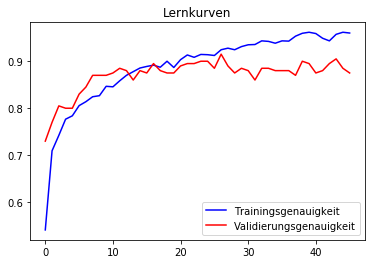

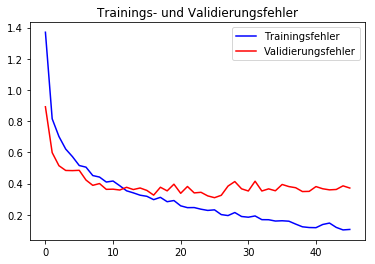

              precision    recall  f1-score   support

     T-shirt       0.82      0.80      0.81      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.77      0.81      0.79      1000
       Dress       0.90      0.82      0.86      1000
        Coat       0.74      0.77      0.76      1000
      Sandal       0.96      0.94      0.95      1000
       Shirt       0.58      0.63      0.60      1000
     Sneaker       0.94      0.91      0.92      1000
         Bag       0.97      0.94      0.95      1000
  Ankle-boot       0.91      0.97      0.94      1000

    accuracy                           0.85     10000
   macro avg       0.86      0.85      0.85     10000
weighted avg       0.86      0.85      0.85     10000



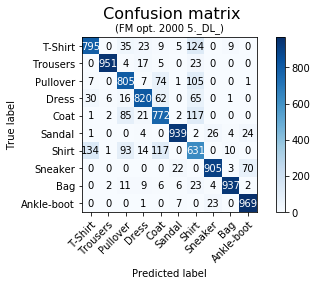

Die durchschnittliche Epochenanzahl beträgt:  26.0


In [0]:
# Trainingsmenge 2000
# optimierte Parameter: Dropoutrate: 0.3, Lernrate: 0.001, mit SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1, 5, X_tr_2000, y_tr_2000, 0.3, 0.001, False, 300, 2000)

In [0]:
downloader(2000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/26
2000/2000 [==============================] - 13s 7ms/step - loss: 1.3705 - acc: 0.5530 - val_loss: 0.8435 - val_acc: 0.7264
Epoch 2/26
2000/2000 [==============================] - 1s 563us/step - loss: 0.7550 - acc: 0.7225 - val_loss: 0.7143 - val_acc: 0.7493
Epoch 3/26
2000/2000 [==============================] - 1s 584us/step - loss: 0.7140 - acc: 0.7435 - val_loss: 0.6190 - val_acc: 0.7719
Epoch 4/26
2000/2000 [==============================] - 1s 582us/step - loss: 0.6237 - acc: 0.7725 - val_loss: 0.5715 - val_acc: 0.7858
Epoch 5/26
2000/2000 [==============================] - 1s 556us/step - loss: 0.5504 - acc: 0.7910 - val_loss: 0.5701 - val_acc: 0.7964
Epoch 6/26
2000/2000 [==============================] - 1s 546us/step - loss: 0.5259 - acc: 0.8045 - val_loss: 0.5378 - val_acc: 0.8114
Epoch 7/26
2000/2000 [==========

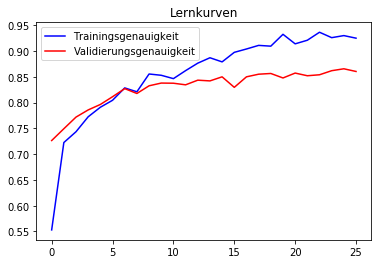

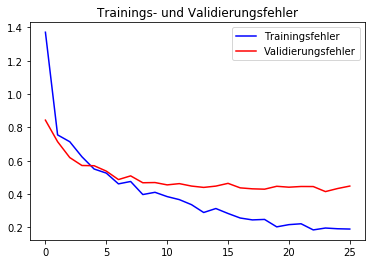

              precision    recall  f1-score   support

     T-shirt       0.81      0.82      0.82      1000
    Trousers       1.00      0.93      0.97      1000
    Pullover       0.79      0.81      0.80      1000
       Dress       0.84      0.90      0.87      1000
        Coat       0.80      0.78      0.79      1000
      Sandal       0.98      0.89      0.93      1000
       Shirt       0.62      0.60      0.61      1000
     Sneaker       0.86      0.98      0.92      1000
         Bag       0.94      0.96      0.95      1000
  Ankle-boot       0.96      0.93      0.94      1000

    accuracy                           0.86     10000
   macro avg       0.86      0.86      0.86     10000
weighted avg       0.86      0.86      0.86     10000



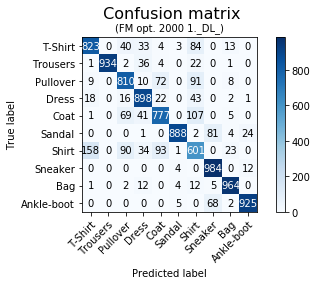

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/26
2000/2000 [==============================] - 14s 7ms/step - loss: 1.3543 - acc: 0.5470 - val_loss: 0.9078 - val_acc: 0.7233
Epoch 2/26
2000/2000 [==============================] - 1s 595us/step - loss: 0.7592 - acc: 0.7110 - val_loss: 0.6732 - val_acc: 0.7619
Epoch 3/26
2000/2000 [==============================] - 1s 576us/step - loss: 0.6469 - acc: 0.7620 - val_loss: 0.5874 - val_acc: 0.7841
Epoch 4/26
2000/2000 [==============================] - 1s 571us/step - loss: 0.5795 - acc: 0.7815 - val_loss: 0.5867 - val_acc: 0.7719
Epoch 5/26
2000/2000 [==============================] - 1s 570us/step - loss: 0.5595 - acc: 0.7980 - val_loss: 0.5343 - val_acc: 0.8037
Epoch 6/26
2000/2000 [==============================] - 1s 569us/step - loss: 0.5028 - acc: 0.8115 - val_loss: 0.5337 - val_acc: 0.8023
Epoch 7/26
2000/2000 [==========

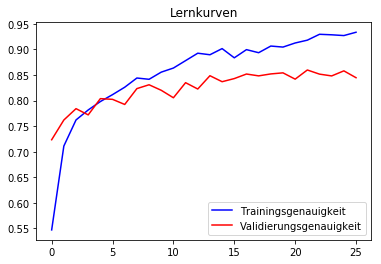

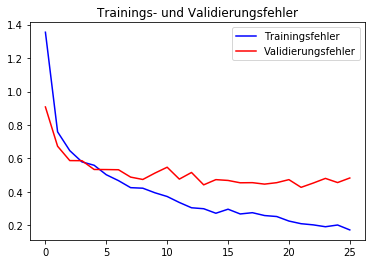

              precision    recall  f1-score   support

     T-shirt       0.88      0.71      0.78      1000
    Trousers       0.99      0.94      0.97      1000
    Pullover       0.83      0.73      0.78      1000
       Dress       0.86      0.86      0.86      1000
        Coat       0.71      0.82      0.76      1000
      Sandal       0.99      0.88      0.93      1000
       Shirt       0.56      0.67      0.61      1000
     Sneaker       0.92      0.90      0.91      1000
         Bag       0.92      0.97      0.94      1000
  Ankle-boot       0.88      0.98      0.93      1000

    accuracy                           0.84     10000
   macro avg       0.85      0.84      0.85     10000
weighted avg       0.85      0.84      0.85     10000



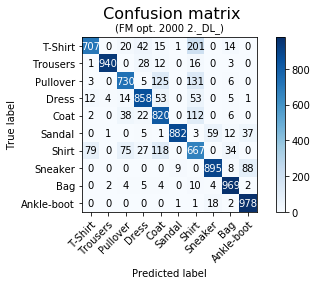

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/26
2000/2000 [==============================] - 14s 7ms/step - loss: 1.3246 - acc: 0.5605 - val_loss: 0.8793 - val_acc: 0.7265
Epoch 2/26
2000/2000 [==============================] - 1s 579us/step - loss: 0.7961 - acc: 0.7075 - val_loss: 0.9739 - val_acc: 0.6840
Epoch 3/26
2000/2000 [==============================] - 1s 572us/step - loss: 0.6744 - acc: 0.7425 - val_loss: 0.6275 - val_acc: 0.7829
Epoch 4/26
2000/2000 [==============================] - 1s 575us/step - loss: 0.6144 - acc: 0.7760 - val_loss: 0.5796 - val_acc: 0.7988
Epoch 5/26
2000/2000 [==============================] - 1s 575us/step - loss: 0.5413 - acc: 0.8060 - val_loss: 0.5281 - val_acc: 0.8112
Epoch 6/26
2000/2000 [==============================] - 1s 582us/step - loss: 0.5011 - acc: 0.8155 - val_loss: 0.5210 - val_acc: 0.8118
Epoch 7/26
2000/2000 [==========

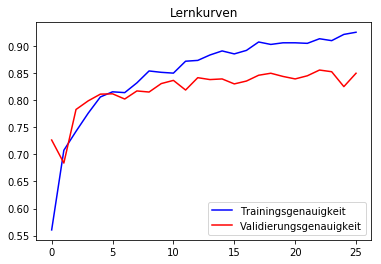

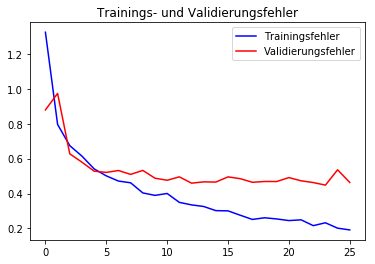

              precision    recall  f1-score   support

     T-shirt       0.78      0.84      0.81      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.83      0.69      0.76      1000
       Dress       0.88      0.85      0.86      1000
        Coat       0.69      0.85      0.76      1000
      Sandal       0.99      0.89      0.94      1000
       Shirt       0.59      0.55      0.57      1000
     Sneaker       0.91      0.95      0.93      1000
         Bag       0.96      0.96      0.96      1000
  Ankle-boot       0.92      0.96      0.94      1000

    accuracy                           0.85     10000
   macro avg       0.85      0.85      0.85     10000
weighted avg       0.85      0.85      0.85     10000



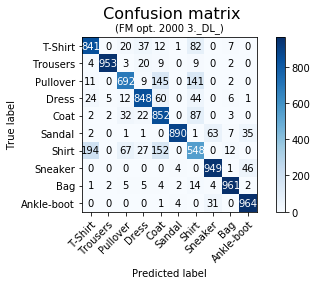

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/26
2000/2000 [==============================] - 15s 7ms/step - loss: 1.3919 - acc: 0.5370 - val_loss: 0.9867 - val_acc: 0.6880
Epoch 2/26
2000/2000 [==============================] - 1s 578us/step - loss: 0.7679 - acc: 0.7165 - val_loss: 0.7072 - val_acc: 0.7590
Epoch 3/26
2000/2000 [==============================] - 1s 567us/step - loss: 0.6661 - acc: 0.7595 - val_loss: 0.6169 - val_acc: 0.7723
Epoch 4/26
2000/2000 [==============================] - 1s 593us/step - loss: 0.6318 - acc: 0.7665 - val_loss: 0.5946 - val_acc: 0.7916
Epoch 5/26
2000/2000 [==============================] - 1s 588us/step - loss: 0.5654 - acc: 0.7875 - val_loss: 0.5746 - val_acc: 0.7978
Epoch 6/26
2000/2000 [==============================] - 1s 590us/step - loss: 0.5330 - acc: 0.7970 - val_loss: 0.5501 - val_acc: 0.8012
Epoch 7/26
2000/2000 [==========

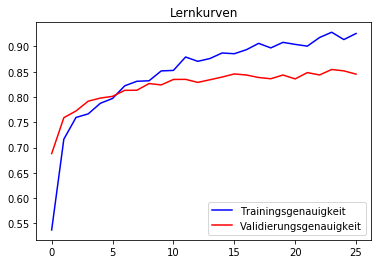

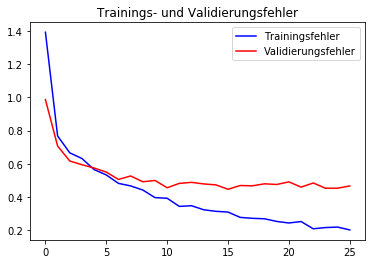

              precision    recall  f1-score   support

     T-shirt       0.81      0.80      0.80      1000
    Trousers       0.98      0.96      0.97      1000
    Pullover       0.87      0.62      0.73      1000
       Dress       0.87      0.86      0.87      1000
        Coat       0.72      0.77      0.74      1000
      Sandal       0.98      0.91      0.94      1000
       Shirt       0.53      0.69      0.60      1000
     Sneaker       0.91      0.94      0.93      1000
         Bag       0.97      0.94      0.96      1000
  Ankle-boot       0.92      0.96      0.94      1000

    accuracy                           0.85     10000
   macro avg       0.86      0.85      0.85     10000
weighted avg       0.86      0.85      0.85     10000



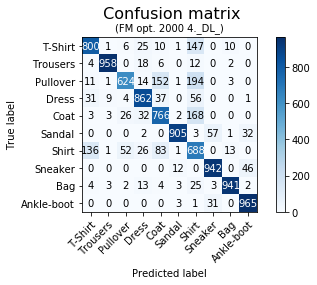

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/26
2000/2000 [==============================] - 14s 7ms/step - loss: 1.4018 - acc: 0.5365 - val_loss: 1.0343 - val_acc: 0.6985
Epoch 2/26
2000/2000 [==============================] - 1s 593us/step - loss: 0.7805 - acc: 0.7235 - val_loss: 0.7927 - val_acc: 0.7472
Epoch 3/26
2000/2000 [==============================] - 1s 593us/step - loss: 0.6677 - acc: 0.7530 - val_loss: 0.6149 - val_acc: 0.7824
Epoch 4/26
2000/2000 [==============================] - 1s 578us/step - loss: 0.5936 - acc: 0.7810 - val_loss: 0.6023 - val_acc: 0.7889
Epoch 5/26
2000/2000 [==============================] - 1s 598us/step - loss: 0.5528 - acc: 0.7895 - val_loss: 0.5486 - val_acc: 0.8078
Epoch 6/26
2000/2000 [==============================] - 1s 606us/step - loss: 0.5113 - acc: 0.8185 - val_loss: 0.5244 - val_acc: 0.8106
Epoch 7/26
2000/2000 [==========

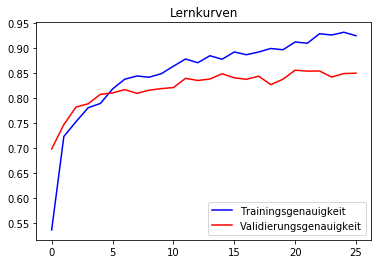

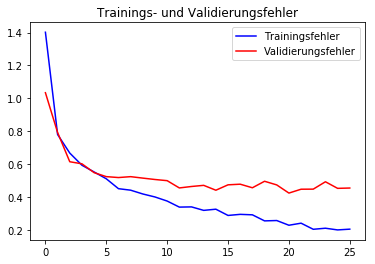

              precision    recall  f1-score   support

     T-shirt       0.81      0.79      0.80      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.76      0.84      0.80      1000
       Dress       0.87      0.84      0.86      1000
        Coat       0.83      0.66      0.74      1000
      Sandal       0.96      0.93      0.95      1000
       Shirt       0.56      0.65      0.60      1000
     Sneaker       0.90      0.95      0.92      1000
         Bag       0.92      0.97      0.94      1000
  Ankle-boot       0.96      0.93      0.94      1000

    accuracy                           0.85     10000
   macro avg       0.86      0.85      0.85     10000
weighted avg       0.86      0.85      0.85     10000



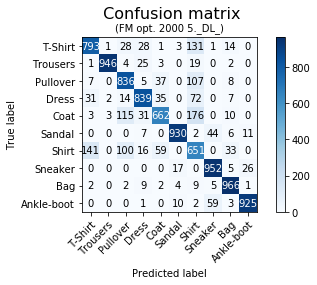

In [41]:
# Trainingsmenge 2000
# optimierte Parameter: Dropoutrate: 0.3, Lernrate: 0.001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainieren, mit durchschnittlichen bester Epochenanzahl aus EarlyStopping
fullDataRuns(1, 5, X_tr_2000, y_tr_2000, X_test, y_test, 0.3, 0.001, False, 26, 2000)

In [0]:
downloader_full(2000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
29/29 [==============================] - 10s 342ms/step - loss: 1.7665 - acc: 0.4126 - val_loss: 1.2194 - val_acc: 0.6400
Epoch 2/300
29/29 [==============================] - 1s 19ms/step - loss: 1.0952 - acc: 0.6088 - val_loss: 1.6266 - val_acc: 0.5950
Epoch 3/300
29/29 [==============================] - 1s 23ms/step - loss: 0.9428 - acc: 0.6458 - val_loss: 1.2182 - val_acc: 0.6900
Epoch 4/300
29/29 [==============================] - 1s 25ms/step - loss: 0.8813 - acc: 0.6710 - val_loss: 0.7172 - val_acc: 0.7550
Epoch 5/300
29/29 [==============================] - 1s 23ms/step - loss: 0.8561 - acc: 0.6961 - val_loss: 0.6974 - val_acc: 0.7600
Epoch 6/300
29/29 [==============================] - 1s 23ms/step - loss: 0.8039 - acc: 0.7063 - val_loss: 0.6019 - val_acc: 0.7850
Epoch 7/300
29/29 [==============================] - 1s 26ms/s

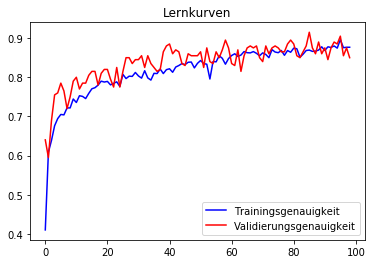

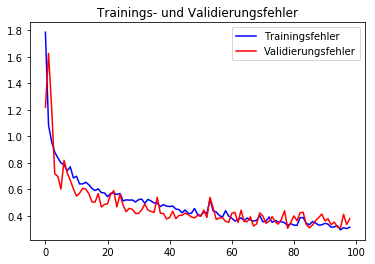

              precision    recall  f1-score   support

     T-shirt       0.77      0.84      0.80      1000
    Trousers       1.00      0.95      0.97      1000
    Pullover       0.81      0.77      0.79      1000
       Dress       0.81      0.89      0.84      1000
        Coat       0.72      0.86      0.78      1000
      Sandal       0.96      0.94      0.95      1000
       Shirt       0.64      0.47      0.54      1000
     Sneaker       0.89      0.97      0.93      1000
         Bag       0.98      0.92      0.95      1000
  Ankle-boot       0.97      0.92      0.94      1000

    accuracy                           0.85     10000
   macro avg       0.85      0.85      0.85     10000
weighted avg       0.85      0.85      0.85     10000



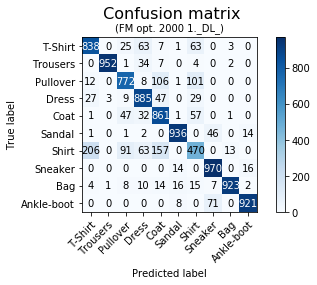

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
29/29 [==============================] - 11s 388ms/step - loss: 1.6546 - acc: 0.4385 - val_loss: 1.4215 - val_acc: 0.6300
Epoch 2/300
29/29 [==============================] - 1s 21ms/step - loss: 1.0762 - acc: 0.6158 - val_loss: 1.0855 - val_acc: 0.6550
Epoch 3/300
29/29 [==============================] - 1s 27ms/step - loss: 0.9546 - acc: 0.6575 - val_loss: 0.8547 - val_acc: 0.7350
Epoch 4/300
29/29 [==============================] - 1s 26ms/step - loss: 0.8580 - acc: 0.6842 - val_loss: 0.6736 - val_acc: 0.7800
Epoch 5/300
29/29 [==============================] - 1s 26ms/step - loss: 0.8386 - acc: 0.6785 - val_loss: 0.6624 - val_acc: 0.7500
Epoch 6/300
29/29 [==============================] - 1s 27ms/step - loss: 0.8043 - acc: 0.7063 - val_loss: 0.6584 - val_acc: 0.7750
Epoch 7/300
29/29 [==============================] - 1s 29ms/s

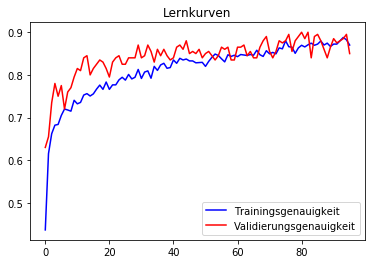

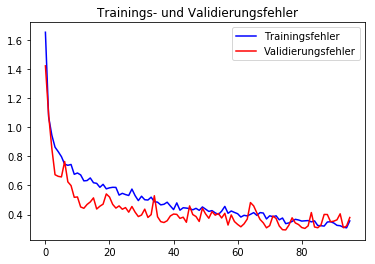

              precision    recall  f1-score   support

     T-shirt       0.75      0.87      0.80      1000
    Trousers       0.96      0.97      0.97      1000
    Pullover       0.69      0.87      0.77      1000
       Dress       0.87      0.84      0.86      1000
        Coat       0.79      0.69      0.74      1000
      Sandal       0.99      0.85      0.92      1000
       Shirt       0.64      0.47      0.54      1000
     Sneaker       0.86      0.97      0.91      1000
         Bag       0.98      0.96      0.97      1000
  Ankle-boot       0.95      0.94      0.94      1000

    accuracy                           0.84     10000
   macro avg       0.85      0.84      0.84     10000
weighted avg       0.85      0.84      0.84     10000



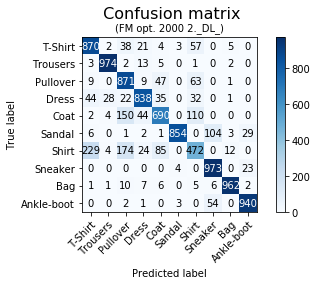

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
29/29 [==============================] - 12s 400ms/step - loss: 1.6616 - acc: 0.4320 - val_loss: 1.2899 - val_acc: 0.6600
Epoch 2/300
29/29 [==============================] - 1s 22ms/step - loss: 1.1011 - acc: 0.6088 - val_loss: 1.2491 - val_acc: 0.6900
Epoch 3/300
29/29 [==============================] - 1s 26ms/step - loss: 0.9463 - acc: 0.6632 - val_loss: 1.0282 - val_acc: 0.7200
Epoch 4/300
29/29 [==============================] - 1s 26ms/step - loss: 0.9183 - acc: 0.6695 - val_loss: 0.9324 - val_acc: 0.7400
Epoch 5/300
29/29 [==============================] - 1s 26ms/step - loss: 0.8144 - acc: 0.6978 - val_loss: 0.9206 - val_acc: 0.7300
Epoch 6/300
29/29 [==============================] - 1s 26ms/step - loss: 0.7647 - acc: 0.7117 - val_loss: 0.8988 - val_acc: 0.7450
Epoch 7/300
29/29 [==============================] - 1s 26ms/s

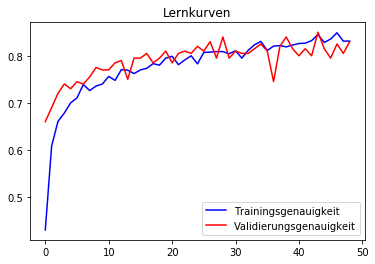

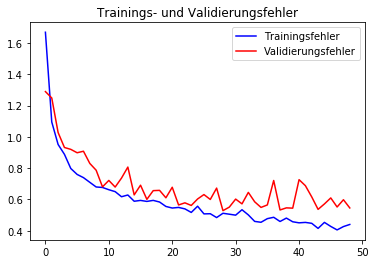

              precision    recall  f1-score   support

     T-shirt       0.73      0.84      0.78      1000
    Trousers       0.97      0.97      0.97      1000
    Pullover       0.72      0.67      0.69      1000
       Dress       0.89      0.79      0.84      1000
        Coat       0.64      0.81      0.72      1000
      Sandal       0.94      0.92      0.93      1000
       Shirt       0.51      0.41      0.45      1000
     Sneaker       0.90      0.92      0.91      1000
         Bag       0.97      0.93      0.95      1000
  Ankle-boot       0.94      0.94      0.94      1000

    accuracy                           0.82     10000
   macro avg       0.82      0.82      0.82     10000
weighted avg       0.82      0.82      0.82     10000



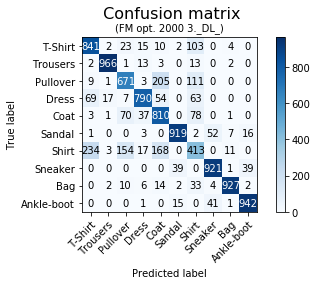

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
29/29 [==============================] - 12s 410ms/step - loss: 1.6789 - acc: 0.4334 - val_loss: 1.7468 - val_acc: 0.5900
Epoch 2/300
29/29 [==============================] - 1s 21ms/step - loss: 1.0756 - acc: 0.6131 - val_loss: 1.2232 - val_acc: 0.7000
Epoch 3/300
29/29 [==============================] - 1s 27ms/step - loss: 0.9414 - acc: 0.6541 - val_loss: 1.1121 - val_acc: 0.7350
Epoch 4/300
29/29 [==============================] - 1s 27ms/step - loss: 0.8840 - acc: 0.6760 - val_loss: 1.0275 - val_acc: 0.7150
Epoch 5/300
29/29 [==============================] - 1s 27ms/step - loss: 0.8436 - acc: 0.6896 - val_loss: 1.1392 - val_acc: 0.7150
Epoch 6/300
29/29 [==============================] - 1s 25ms/step - loss: 0.7886 - acc: 0.7091 - val_loss: 0.9296 - val_acc: 0.7350
Epoch 7/300
29/29 [==============================] - 1s 28ms/s

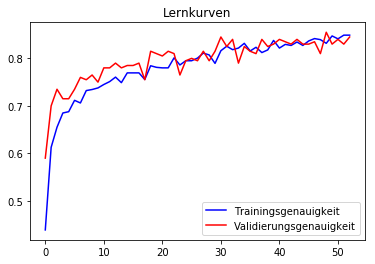

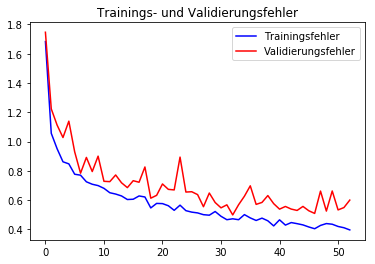

              precision    recall  f1-score   support

     T-shirt       0.76      0.84      0.79      1000
    Trousers       0.98      0.97      0.98      1000
    Pullover       0.66      0.83      0.73      1000
       Dress       0.89      0.81      0.85      1000
        Coat       0.73      0.72      0.73      1000
      Sandal       0.97      0.81      0.88      1000
       Shirt       0.54      0.39      0.46      1000
     Sneaker       0.83      0.96      0.89      1000
         Bag       0.96      0.96      0.96      1000
  Ankle-boot       0.92      0.95      0.94      1000

    accuracy                           0.82     10000
   macro avg       0.82      0.82      0.82     10000
weighted avg       0.82      0.82      0.82     10000



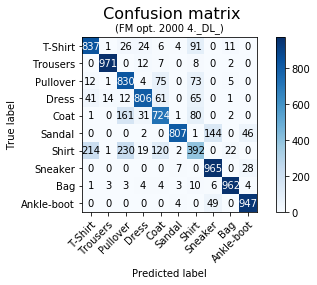

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
29/29 [==============================] - 11s 387ms/step - loss: 1.6760 - acc: 0.4476 - val_loss: 1.5587 - val_acc: 0.6050
Epoch 2/300
29/29 [==============================] - 1s 19ms/step - loss: 1.1190 - acc: 0.6138 - val_loss: 1.1037 - val_acc: 0.7000
Epoch 3/300
29/29 [==============================] - 1s 25ms/step - loss: 0.9678 - acc: 0.6483 - val_loss: 0.9799 - val_acc: 0.7200
Epoch 4/300
29/29 [==============================] - 1s 26ms/step - loss: 0.8730 - acc: 0.6746 - val_loss: 0.8284 - val_acc: 0.7250
Epoch 5/300
29/29 [==============================] - 1s 24ms/step - loss: 0.8182 - acc: 0.6882 - val_loss: 0.8269 - val_acc: 0.7500
Epoch 6/300
29/29 [==============================] - 1s 22ms/step - loss: 0.7927 - acc: 0.7094 - val_loss: 0.6424 - val_acc: 0.7600
Epoch 7/300
29/29 [==============================] - 1s 25ms/s

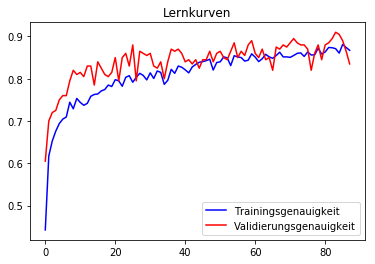

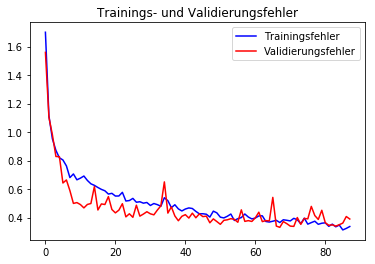

              precision    recall  f1-score   support

     T-shirt       0.80      0.82      0.81      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.75      0.83      0.79      1000
       Dress       0.90      0.82      0.86      1000
        Coat       0.72      0.84      0.77      1000
      Sandal       0.98      0.87      0.92      1000
       Shirt       0.61      0.51      0.56      1000
     Sneaker       0.86      0.97      0.91      1000
         Bag       0.96      0.96      0.96      1000
  Ankle-boot       0.96      0.94      0.95      1000

    accuracy                           0.85     10000
   macro avg       0.85      0.85      0.85     10000
weighted avg       0.85      0.85      0.85     10000



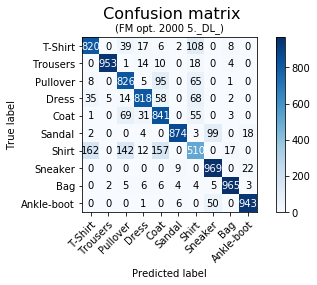

Die durchschnittliche Epochenanzahl beträgt:  57.0


In [0]:
# Trainingsmenge 2000
# optimierte Parameter: Dropoutrate: 0.3, Lernrate: 0.001, mit SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1, 5, X_tr_2000, y_tr_2000, 0.3, 0.001, False, 300, 2000)

In [0]:
downloader(2000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 13s 3ms/step - loss: 2.2671 - acc: 0.2564 - val_loss: 1.2276 - val_acc: 0.6120
Epoch 2/300
4500/4500 [==============================] - 1s 275us/step - loss: 1.3994 - acc: 0.5144 - val_loss: 0.9022 - val_acc: 0.7060
Epoch 3/300
4500/4500 [==============================] - 1s 258us/step - loss: 1.1357 - acc: 0.5942 - val_loss: 0.7874 - val_acc: 0.7280
Epoch 4/300
4500/4500 [==============================] - 1s 247us/step - loss: 0.9816 - acc: 0.6529 - val_loss: 0.7333 - val_acc: 0.7480
Epoch 5/300
4500/4500 [==============================] - 1s 256us/step - loss: 0.9222 - acc: 0.6700 - val_loss: 0.6975 - val_acc: 0.7660
Epoch 6/300
4500/4500 [==============================] - 1s 252us/step - loss: 0.8858 - acc: 0.6847 - val_loss: 0.6785 - val_acc: 0.7760
Epoch 7/30

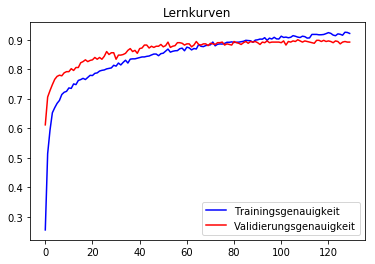

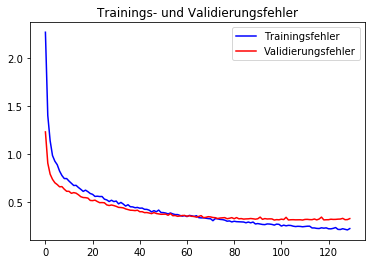

              precision    recall  f1-score   support

     T-shirt       0.84      0.83      0.84      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.83      0.84      0.83      1000
       Dress       0.90      0.87      0.88      1000
        Coat       0.80      0.84      0.82      1000
      Sandal       0.99      0.93      0.96      1000
       Shirt       0.68      0.67      0.67      1000
     Sneaker       0.91      0.97      0.94      1000
         Bag       0.96      0.97      0.97      1000
  Ankle-boot       0.96      0.95      0.96      1000

    accuracy                           0.88     10000
   macro avg       0.89      0.88      0.88     10000
weighted avg       0.89      0.88      0.88     10000



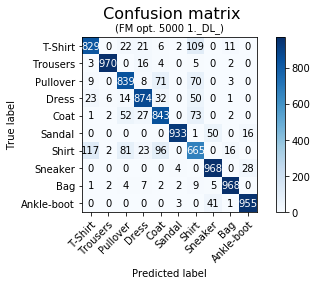

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 13s 3ms/step - loss: 2.2453 - acc: 0.2771 - val_loss: 1.2636 - val_acc: 0.6460
Epoch 2/300
4500/4500 [==============================] - 1s 236us/step - loss: 1.4203 - acc: 0.5113 - val_loss: 0.8934 - val_acc: 0.7100
Epoch 3/300
4500/4500 [==============================] - 1s 237us/step - loss: 1.1326 - acc: 0.6009 - val_loss: 0.7732 - val_acc: 0.7320
Epoch 4/300
4500/4500 [==============================] - 1s 227us/step - loss: 0.9806 - acc: 0.6518 - val_loss: 0.6909 - val_acc: 0.7540
Epoch 5/300
4500/4500 [==============================] - 1s 220us/step - loss: 0.8829 - acc: 0.6776 - val_loss: 0.6490 - val_acc: 0.7540
Epoch 6/300
4500/4500 [==============================] - 1s 230us/step - loss: 0.8339 - acc: 0.7009 - val_loss: 0.6351 - val_acc: 0.7500
Epoch 7/30

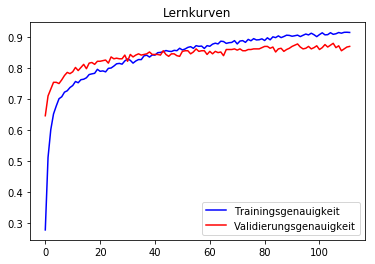

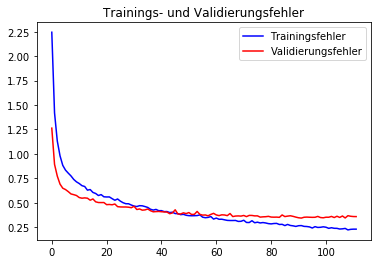

              precision    recall  f1-score   support

     T-shirt       0.85      0.80      0.82      1000
    Trousers       1.00      0.96      0.98      1000
    Pullover       0.84      0.83      0.84      1000
       Dress       0.86      0.91      0.88      1000
        Coat       0.82      0.81      0.82      1000
      Sandal       0.98      0.92      0.95      1000
       Shirt       0.65      0.68      0.67      1000
     Sneaker       0.90      0.97      0.93      1000
         Bag       0.96      0.97      0.96      1000
  Ankle-boot       0.96      0.94      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



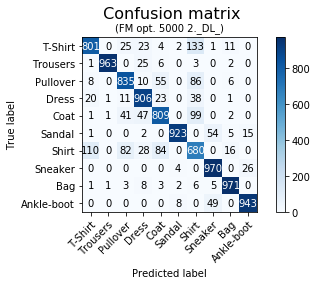

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 13s 3ms/step - loss: 2.2446 - acc: 0.2620 - val_loss: 1.1656 - val_acc: 0.6400
Epoch 2/300
4500/4500 [==============================] - 1s 227us/step - loss: 1.3679 - acc: 0.5278 - val_loss: 0.8599 - val_acc: 0.6980
Epoch 3/300
4500/4500 [==============================] - 1s 216us/step - loss: 1.1031 - acc: 0.6120 - val_loss: 0.7604 - val_acc: 0.7180
Epoch 4/300
4500/4500 [==============================] - 1s 215us/step - loss: 0.9945 - acc: 0.6491 - val_loss: 0.7004 - val_acc: 0.7300
Epoch 5/300
4500/4500 [==============================] - 1s 223us/step - loss: 0.8785 - acc: 0.6782 - val_loss: 0.6705 - val_acc: 0.7460
Epoch 6/300
4500/4500 [==============================] - 1s 228us/step - loss: 0.8584 - acc: 0.6889 - val_loss: 0.6468 - val_acc: 0.7580
Epoch 7/30

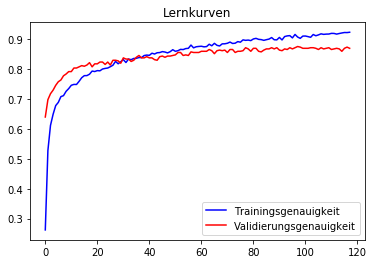

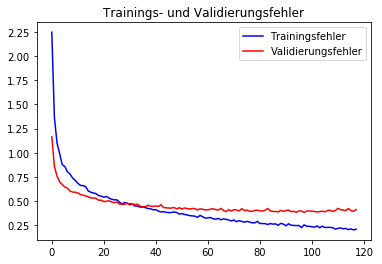

              precision    recall  f1-score   support

     T-shirt       0.85      0.81      0.83      1000
    Trousers       0.99      0.96      0.98      1000
    Pullover       0.82      0.83      0.83      1000
       Dress       0.87      0.90      0.88      1000
        Coat       0.82      0.78      0.80      1000
      Sandal       0.99      0.92      0.95      1000
       Shirt       0.65      0.69      0.67      1000
     Sneaker       0.90      0.97      0.93      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.95      0.95      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



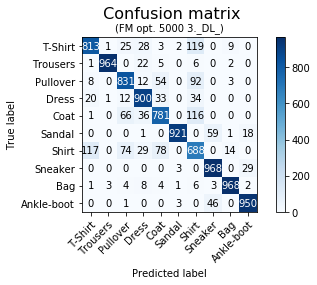

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 13s 3ms/step - loss: 2.1915 - acc: 0.2820 - val_loss: 1.1404 - val_acc: 0.6080
Epoch 2/300
4500/4500 [==============================] - 1s 235us/step - loss: 1.3477 - acc: 0.5282 - val_loss: 0.8671 - val_acc: 0.7000
Epoch 3/300
4500/4500 [==============================] - 1s 220us/step - loss: 1.1102 - acc: 0.6073 - val_loss: 0.7634 - val_acc: 0.7240
Epoch 4/300
4500/4500 [==============================] - 1s 224us/step - loss: 0.9642 - acc: 0.6522 - val_loss: 0.7001 - val_acc: 0.7340
Epoch 5/300
4500/4500 [==============================] - 1s 216us/step - loss: 0.9083 - acc: 0.6778 - val_loss: 0.6600 - val_acc: 0.7420
Epoch 6/300
4500/4500 [==============================] - 1s 214us/step - loss: 0.8448 - acc: 0.6967 - val_loss: 0.6276 - val_acc: 0.7500
Epoch 7/30

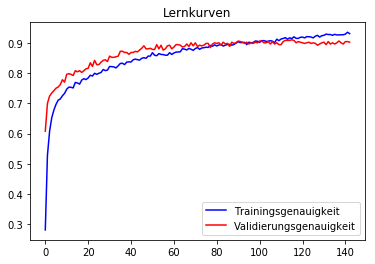

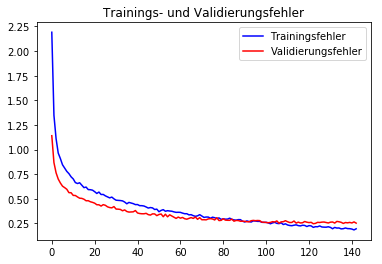

              precision    recall  f1-score   support

     T-shirt       0.85      0.82      0.84      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.84      0.84      0.84      1000
       Dress       0.89      0.89      0.89      1000
        Coat       0.81      0.85      0.83      1000
      Sandal       0.99      0.92      0.96      1000
       Shirt       0.68      0.66      0.67      1000
     Sneaker       0.90      0.97      0.94      1000
         Bag       0.96      0.97      0.96      1000
  Ankle-boot       0.96      0.94      0.95      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



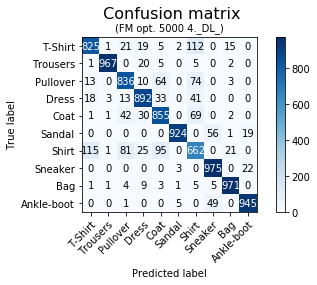

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 14s 3ms/step - loss: 2.2261 - acc: 0.2644 - val_loss: 1.2143 - val_acc: 0.6220
Epoch 2/300
4500/4500 [==============================] - 1s 276us/step - loss: 1.4400 - acc: 0.5051 - val_loss: 0.8777 - val_acc: 0.7160
Epoch 3/300
4500/4500 [==============================] - 1s 267us/step - loss: 1.1387 - acc: 0.6029 - val_loss: 0.7706 - val_acc: 0.7360
Epoch 4/300
4500/4500 [==============================] - 1s 264us/step - loss: 1.0066 - acc: 0.6376 - val_loss: 0.7123 - val_acc: 0.7460
Epoch 5/300
4500/4500 [==============================] - 1s 265us/step - loss: 0.9136 - acc: 0.6778 - val_loss: 0.6748 - val_acc: 0.7480
Epoch 6/300
4500/4500 [==============================] - 1s 265us/step - loss: 0.8530 - acc: 0.6918 - val_loss: 0.6527 - val_acc: 0.7580
Epoch 7/30

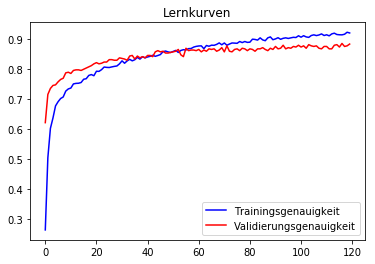

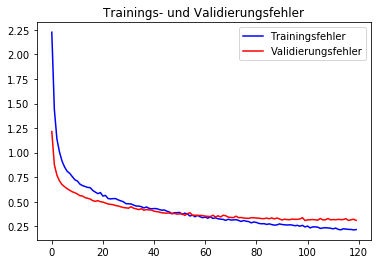

              precision    recall  f1-score   support

     T-shirt       0.84      0.82      0.83      1000
    Trousers       0.99      0.96      0.98      1000
    Pullover       0.83      0.85      0.84      1000
       Dress       0.86      0.89      0.88      1000
        Coat       0.78      0.84      0.81      1000
      Sandal       0.99      0.92      0.95      1000
       Shirt       0.70      0.66      0.68      1000
     Sneaker       0.89      0.98      0.93      1000
         Bag       0.97      0.95      0.96      1000
  Ankle-boot       0.96      0.93      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



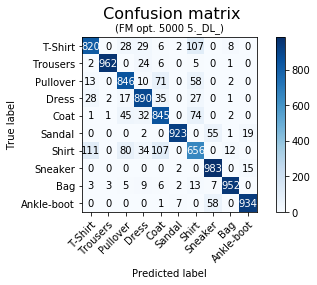

Die durchschnittliche Epochenanzahl beträgt:  104.6


In [0]:
# Trainingsmenge 5000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.0001, mit SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1, 5, X_tr_5000, y_tr_5000, 0.4, 0.0001, False, 300, 5000)

In [0]:
downloader(5000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/105
5000/5000 [==============================] - 17s 3ms/step - loss: 2.2349 - acc: 0.2786 - val_loss: 1.1623 - val_acc: 0.6357
Epoch 2/105
5000/5000 [==============================] - 2s 448us/step - loss: 1.3501 - acc: 0.5332 - val_loss: 0.8601 - val_acc: 0.6979
Epoch 3/105
5000/5000 [==============================] - 2s 420us/step - loss: 1.0815 - acc: 0.6220 - val_loss: 0.7710 - val_acc: 0.7229
Epoch 4/105
5000/5000 [==============================] - 2s 419us/step - loss: 0.9671 - acc: 0.6618 - val_loss: 0.7220 - val_acc: 0.7333
Epoch 5/105
5000/5000 [==============================] - 2s 436us/step - loss: 0.8842 - acc: 0.6812 - val_loss: 0.6878 - val_acc: 0.7394
Epoch 6/105
5000/5000 [==============================] - 2s 421us/step - loss: 0.8548 - acc: 0.6950 - val_loss: 0.6766 - val_acc: 0.7439
Epoch 7/105
5000/5000 [===

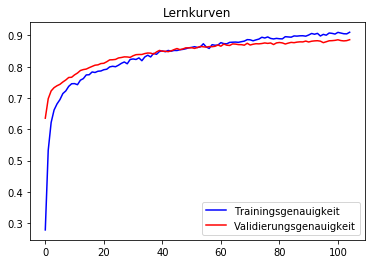

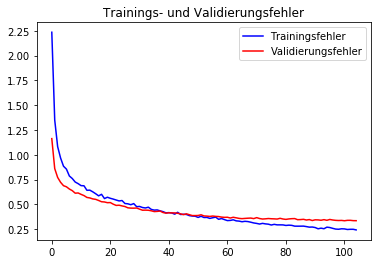

              precision    recall  f1-score   support

     T-shirt       0.84      0.83      0.83      1000
    Trousers       1.00      0.96      0.98      1000
    Pullover       0.85      0.85      0.85      1000
       Dress       0.88      0.88      0.88      1000
        Coat       0.81      0.85      0.83      1000
      Sandal       0.99      0.93      0.96      1000
       Shirt       0.69      0.67      0.68      1000
     Sneaker       0.90      0.97      0.94      1000
         Bag       0.96      0.97      0.97      1000
  Ankle-boot       0.96      0.95      0.95      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



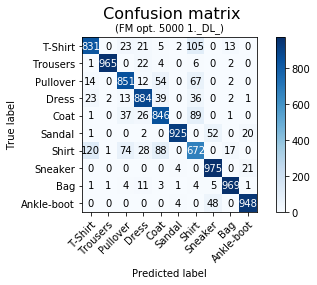

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/105
5000/5000 [==============================] - 16s 3ms/step - loss: 2.2359 - acc: 0.2732 - val_loss: 1.1990 - val_acc: 0.6625
Epoch 2/105
5000/5000 [==============================] - 2s 368us/step - loss: 1.3536 - acc: 0.5288 - val_loss: 0.9061 - val_acc: 0.6970
Epoch 3/105
5000/5000 [==============================] - 2s 376us/step - loss: 1.0771 - acc: 0.6238 - val_loss: 0.7806 - val_acc: 0.7279
Epoch 4/105
5000/5000 [==============================] - 2s 370us/step - loss: 0.9723 - acc: 0.6654 - val_loss: 0.7253 - val_acc: 0.7397
Epoch 5/105
5000/5000 [==============================] - 2s 392us/step - loss: 0.8581 - acc: 0.6882 - val_loss: 0.6804 - val_acc: 0.7509
Epoch 6/105
5000/5000 [==============================] - 2s 373us/step - loss: 0.8393 - acc: 0.6986 - val_loss: 0.6583 - val_acc: 0.7568
Epoch 7/105
5000/5000 [===

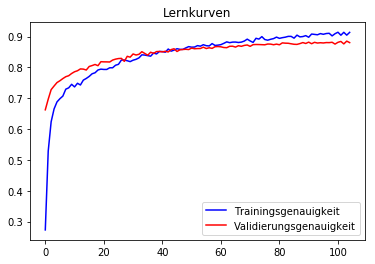

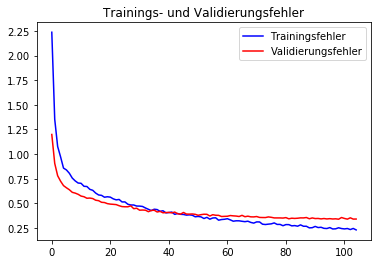

              precision    recall  f1-score   support

     T-shirt       0.81      0.85      0.83      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.81      0.87      0.84      1000
       Dress       0.88      0.90      0.89      1000
        Coat       0.81      0.83      0.82      1000
      Sandal       0.98      0.93      0.95      1000
       Shirt       0.71      0.60      0.65      1000
     Sneaker       0.87      0.98      0.92      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.97      0.92      0.94      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



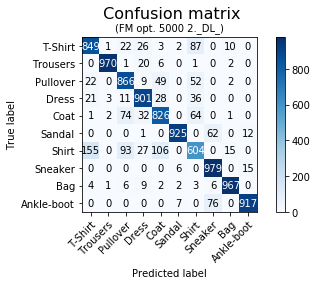

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/105
5000/5000 [==============================] - 17s 3ms/step - loss: 2.2434 - acc: 0.2614 - val_loss: 1.1907 - val_acc: 0.6540
Epoch 2/105
5000/5000 [==============================] - 2s 367us/step - loss: 1.3791 - acc: 0.5308 - val_loss: 0.8792 - val_acc: 0.7120
Epoch 3/105
5000/5000 [==============================] - 2s 370us/step - loss: 1.0809 - acc: 0.6272 - val_loss: 0.7791 - val_acc: 0.7242
Epoch 4/105
5000/5000 [==============================] - 2s 394us/step - loss: 0.9523 - acc: 0.6636 - val_loss: 0.7305 - val_acc: 0.7332
Epoch 5/105
5000/5000 [==============================] - 2s 382us/step - loss: 0.8801 - acc: 0.6940 - val_loss: 0.6883 - val_acc: 0.7446
Epoch 6/105
5000/5000 [==============================] - 2s 395us/step - loss: 0.8260 - acc: 0.7018 - val_loss: 0.6735 - val_acc: 0.7463
Epoch 7/105
5000/5000 [===

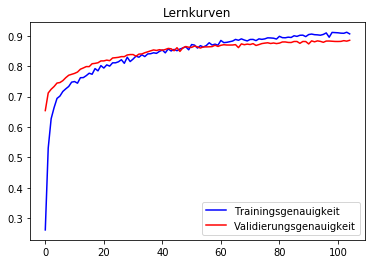

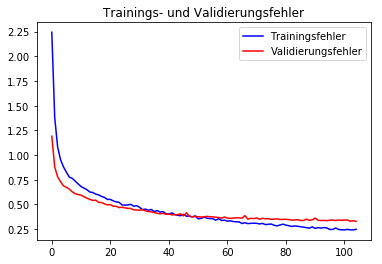

              precision    recall  f1-score   support

     T-shirt       0.83      0.84      0.83      1000
    Trousers       1.00      0.96      0.98      1000
    Pullover       0.84      0.84      0.84      1000
       Dress       0.90      0.88      0.89      1000
        Coat       0.81      0.84      0.83      1000
      Sandal       0.98      0.95      0.96      1000
       Shirt       0.67      0.67      0.67      1000
     Sneaker       0.92      0.97      0.94      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.96      0.95      0.95      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



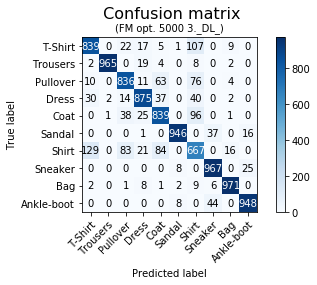

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/105
5000/5000 [==============================] - 17s 3ms/step - loss: 2.1970 - acc: 0.2786 - val_loss: 1.1948 - val_acc: 0.6445
Epoch 2/105
5000/5000 [==============================] - 2s 364us/step - loss: 1.4065 - acc: 0.5104 - val_loss: 0.8954 - val_acc: 0.6897
Epoch 3/105
5000/5000 [==============================] - 2s 380us/step - loss: 1.1186 - acc: 0.6070 - val_loss: 0.7811 - val_acc: 0.7215
Epoch 4/105
5000/5000 [==============================] - 2s 380us/step - loss: 0.9715 - acc: 0.6578 - val_loss: 0.7295 - val_acc: 0.7325
Epoch 5/105
5000/5000 [==============================] - 2s 378us/step - loss: 0.9122 - acc: 0.6788 - val_loss: 0.7073 - val_acc: 0.7360
Epoch 6/105
5000/5000 [==============================] - 2s 377us/step - loss: 0.8310 - acc: 0.6898 - val_loss: 0.6882 - val_acc: 0.7435
Epoch 7/105
5000/5000 [===

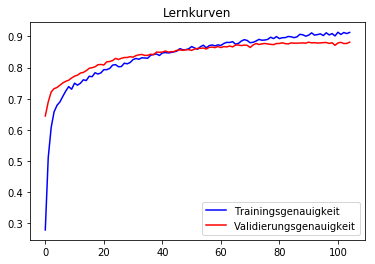

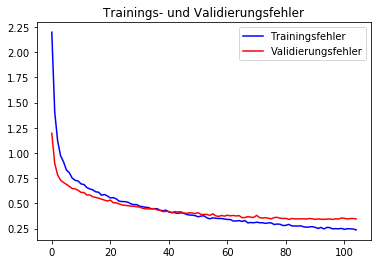

              precision    recall  f1-score   support

     T-shirt       0.84      0.83      0.83      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.84      0.83      0.84      1000
       Dress       0.88      0.90      0.89      1000
        Coat       0.79      0.86      0.83      1000
      Sandal       0.99      0.90      0.94      1000
       Shirt       0.70      0.65      0.67      1000
     Sneaker       0.88      0.98      0.92      1000
         Bag       0.97      0.96      0.97      1000
  Ankle-boot       0.96      0.94      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



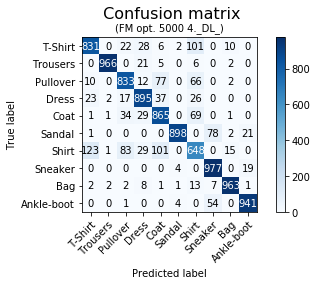

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/105
5000/5000 [==============================] - 17s 3ms/step - loss: 2.3285 - acc: 0.2596 - val_loss: 1.2957 - val_acc: 0.6070
Epoch 2/105
5000/5000 [==============================] - 2s 406us/step - loss: 1.4425 - acc: 0.4980 - val_loss: 0.9370 - val_acc: 0.7017
Epoch 3/105
5000/5000 [==============================] - 2s 380us/step - loss: 1.1557 - acc: 0.5982 - val_loss: 0.7946 - val_acc: 0.7264
Epoch 4/105
5000/5000 [==============================] - 2s 369us/step - loss: 0.9787 - acc: 0.6468 - val_loss: 0.7332 - val_acc: 0.7377
Epoch 5/105
5000/5000 [==============================] - 2s 387us/step - loss: 0.8984 - acc: 0.6830 - val_loss: 0.6889 - val_acc: 0.7496
Epoch 6/105
5000/5000 [==============================] - 2s 383us/step - loss: 0.8305 - acc: 0.7008 - val_loss: 0.6584 - val_acc: 0.7629
Epoch 7/105
5000/5000 [===

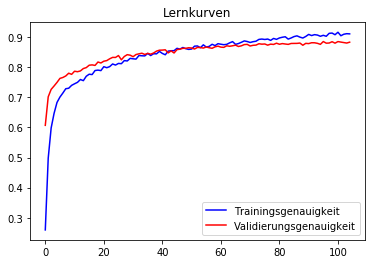

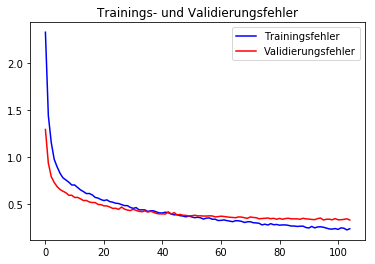

              precision    recall  f1-score   support

     T-shirt       0.83      0.82      0.83      1000
    Trousers       0.99      0.96      0.98      1000
    Pullover       0.86      0.81      0.83      1000
       Dress       0.86      0.90      0.88      1000
        Coat       0.80      0.87      0.83      1000
      Sandal       0.99      0.94      0.96      1000
       Shirt       0.67      0.66      0.66      1000
     Sneaker       0.90      0.98      0.94      1000
         Bag       0.96      0.96      0.96      1000
  Ankle-boot       0.97      0.94      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



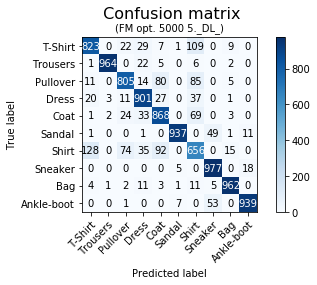

In [45]:
# Trainingsmenge 5000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.0001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainieren, mit durchschnittlichen bester Epochenanzahl aus EarlyStopping
fullDataRuns(1, 5, X_tr_5000, y_tr_5000, X_test, y_test, 0.4, 0.0001, False, 105, 5000)

In [0]:
downloader_full(5000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
71/71 [==============================] - 15s 216ms/step - loss: 2.4533 - acc: 0.2073 - val_loss: 1.4665 - val_acc: 0.4860
Epoch 2/300
71/71 [==============================] - 2s 27ms/step - loss: 1.8355 - acc: 0.3656 - val_loss: 1.1025 - val_acc: 0.6400
Epoch 3/300
71/71 [==============================] - 2s 28ms/step - loss: 1.5137 - acc: 0.4578 - val_loss: 0.9467 - val_acc: 0.6880
Epoch 4/300
71/71 [==============================] - 2s 28ms/step - loss: 1.3243 - acc: 0.5280 - val_loss: 0.8565 - val_acc: 0.7200
Epoch 5/300
71/71 [==============================] - 2s 28ms/step - loss: 1.2176 - acc: 0.5727 - val_loss: 0.7852 - val_acc: 0.7180
Epoch 6/300
71/71 [==============================] - 2s 28ms/step - loss: 1.1172 - acc: 0.5940 - val_loss: 0.7608 - val_acc: 0.7240
Epoch 7/300
71/71 [==============================] - 2s 28ms/s

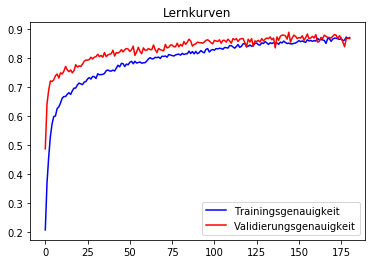

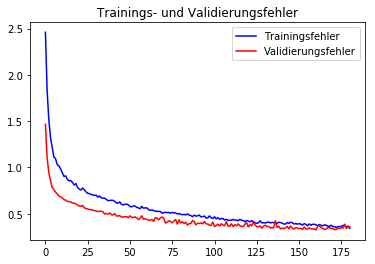

              precision    recall  f1-score   support

     T-shirt       0.87      0.81      0.84      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.86      0.82      0.84      1000
       Dress       0.86      0.91      0.88      1000
        Coat       0.82      0.81      0.82      1000
      Sandal       0.96      0.94      0.95      1000
       Shirt       0.64      0.69      0.66      1000
     Sneaker       0.89      0.96      0.92      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.97      0.92      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



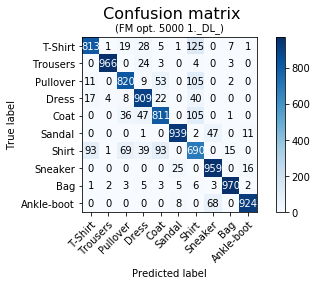

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
71/71 [==============================] - 16s 223ms/step - loss: 2.4139 - acc: 0.2306 - val_loss: 1.2946 - val_acc: 0.6000
Epoch 2/300
71/71 [==============================] - 2s 26ms/step - loss: 1.7008 - acc: 0.3983 - val_loss: 1.0361 - val_acc: 0.6600
Epoch 3/300
71/71 [==============================] - 2s 28ms/step - loss: 1.4004 - acc: 0.5062 - val_loss: 0.8993 - val_acc: 0.6920
Epoch 4/300
71/71 [==============================] - 2s 29ms/step - loss: 1.2472 - acc: 0.5581 - val_loss: 0.8497 - val_acc: 0.6860
Epoch 5/300
71/71 [==============================] - 2s 28ms/step - loss: 1.1403 - acc: 0.5790 - val_loss: 0.7872 - val_acc: 0.7200
Epoch 6/300
71/71 [==============================] - 2s 27ms/step - loss: 1.1147 - acc: 0.6051 - val_loss: 0.7394 - val_acc: 0.7320
Epoch 7/300
71/71 [==============================] - 2s 28ms/s

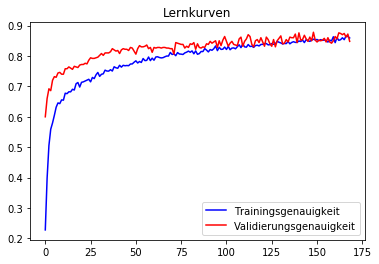

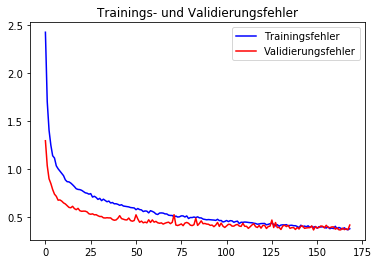

              precision    recall  f1-score   support

     T-shirt       0.81      0.84      0.82      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.85      0.82      0.84      1000
       Dress       0.86      0.90      0.88      1000
        Coat       0.81      0.79      0.80      1000
      Sandal       0.98      0.90      0.94      1000
       Shirt       0.63      0.62      0.63      1000
     Sneaker       0.87      0.97      0.92      1000
         Bag       0.96      0.97      0.96      1000
  Ankle-boot       0.97      0.93      0.95      1000

    accuracy                           0.87     10000
   macro avg       0.87      0.87      0.87     10000
weighted avg       0.87      0.87      0.87     10000



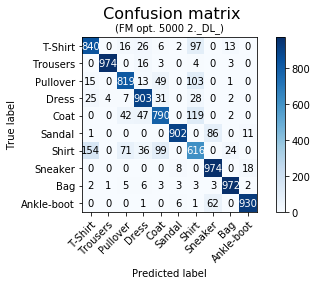

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
71/71 [==============================] - 15s 214ms/step - loss: 2.4853 - acc: 0.2006 - val_loss: 1.4574 - val_acc: 0.5420
Epoch 2/300
71/71 [==============================] - 2s 22ms/step - loss: 1.8440 - acc: 0.3618 - val_loss: 1.0681 - val_acc: 0.6620
Epoch 3/300
71/71 [==============================] - 2s 24ms/step - loss: 1.4810 - acc: 0.4674 - val_loss: 0.8903 - val_acc: 0.6920
Epoch 4/300
71/71 [==============================] - 2s 24ms/step - loss: 1.3057 - acc: 0.5359 - val_loss: 0.8157 - val_acc: 0.7160
Epoch 5/300
71/71 [==============================] - 2s 29ms/step - loss: 1.2179 - acc: 0.5607 - val_loss: 0.7800 - val_acc: 0.7220
Epoch 6/300
71/71 [==============================] - 2s 30ms/step - loss: 1.1216 - acc: 0.5926 - val_loss: 0.7399 - val_acc: 0.7300
Epoch 7/300
71/71 [==============================] - 2s 28ms/s

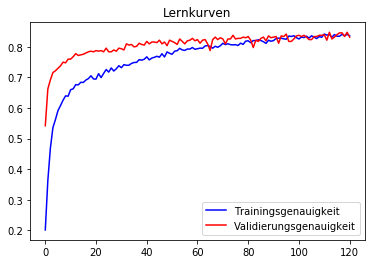

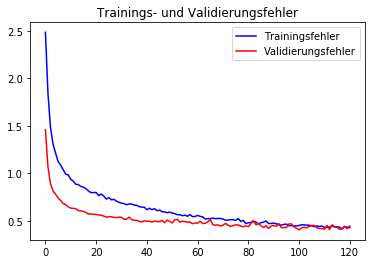

              precision    recall  f1-score   support

     T-shirt       0.77      0.86      0.81      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.82      0.79      0.81      1000
       Dress       0.87      0.89      0.88      1000
        Coat       0.80      0.75      0.77      1000
      Sandal       0.95      0.91      0.93      1000
       Shirt       0.58      0.56      0.57      1000
     Sneaker       0.88      0.94      0.91      1000
         Bag       0.94      0.96      0.95      1000
  Ankle-boot       0.96      0.93      0.94      1000

    accuracy                           0.86     10000
   macro avg       0.86      0.86      0.85     10000
weighted avg       0.86      0.86      0.85     10000



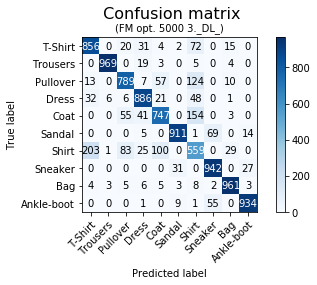

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
71/71 [==============================] - 15s 218ms/step - loss: 2.4575 - acc: 0.2027 - val_loss: 1.4523 - val_acc: 0.5340
Epoch 2/300
71/71 [==============================] - 2s 23ms/step - loss: 1.7832 - acc: 0.3809 - val_loss: 1.0429 - val_acc: 0.6740
Epoch 3/300
71/71 [==============================] - 2s 27ms/step - loss: 1.4406 - acc: 0.4895 - val_loss: 0.8842 - val_acc: 0.6880
Epoch 4/300
71/71 [==============================] - 2s 24ms/step - loss: 1.2755 - acc: 0.5489 - val_loss: 0.7998 - val_acc: 0.7320
Epoch 5/300
71/71 [==============================] - 2s 24ms/step - loss: 1.1926 - acc: 0.5698 - val_loss: 0.7505 - val_acc: 0.7520
Epoch 6/300
71/71 [==============================] - 2s 25ms/step - loss: 1.1108 - acc: 0.5969 - val_loss: 0.7236 - val_acc: 0.7720
Epoch 7/300
71/71 [==============================] - 2s 25ms/s

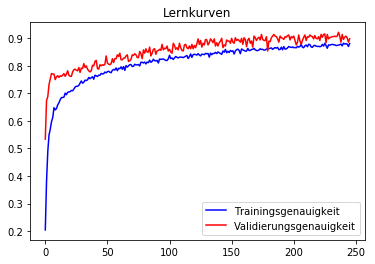

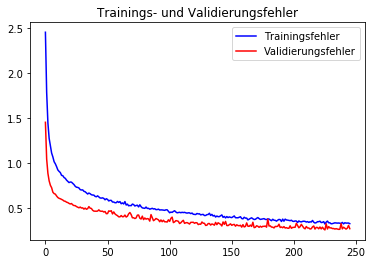

              precision    recall  f1-score   support

     T-shirt       0.83      0.85      0.84      1000
    Trousers       0.98      0.97      0.98      1000
    Pullover       0.87      0.82      0.84      1000
       Dress       0.89      0.87      0.88      1000
        Coat       0.80      0.81      0.81      1000
      Sandal       0.98      0.93      0.96      1000
       Shirt       0.65      0.69      0.67      1000
     Sneaker       0.90      0.97      0.93      1000
         Bag       0.98      0.96      0.97      1000
  Ankle-boot       0.96      0.94      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



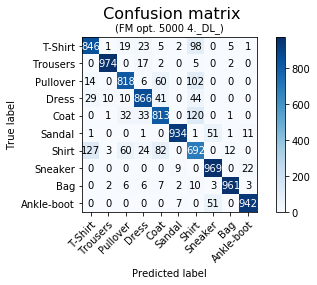

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
71/71 [==============================] - 16s 227ms/step - loss: 2.4367 - acc: 0.2077 - val_loss: 1.3398 - val_acc: 0.5660
Epoch 2/300
71/71 [==============================] - 2s 25ms/step - loss: 1.8288 - acc: 0.3617 - val_loss: 1.0208 - val_acc: 0.6560
Epoch 3/300
71/71 [==============================] - 2s 27ms/step - loss: 1.4990 - acc: 0.4694 - val_loss: 0.8779 - val_acc: 0.7080
Epoch 4/300
71/71 [==============================] - 2s 28ms/step - loss: 1.3456 - acc: 0.5205 - val_loss: 0.8067 - val_acc: 0.7240
Epoch 5/300
71/71 [==============================] - 2s 26ms/step - loss: 1.2267 - acc: 0.5588 - val_loss: 0.7570 - val_acc: 0.7400
Epoch 6/300
71/71 [==============================] - 2s 26ms/step - loss: 1.1642 - acc: 0.5879 - val_loss: 0.7246 - val_acc: 0.7380
Epoch 7/300
71/71 [==============================] - 2s 25ms/s

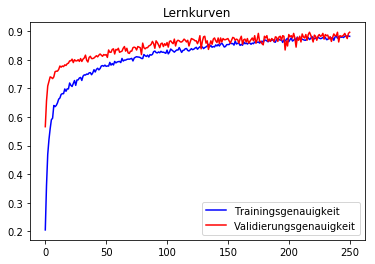

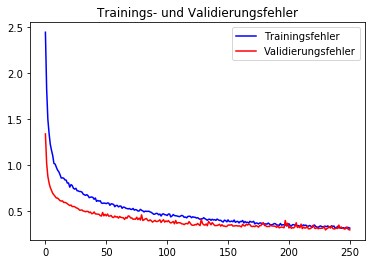

              precision    recall  f1-score   support

     T-shirt       0.87      0.82      0.84      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.89      0.80      0.84      1000
       Dress       0.86      0.90      0.88      1000
        Coat       0.79      0.84      0.81      1000
      Sandal       0.98      0.93      0.96      1000
       Shirt       0.66      0.72      0.69      1000
     Sneaker       0.90      0.97      0.94      1000
         Bag       0.98      0.97      0.97      1000
  Ankle-boot       0.97      0.94      0.95      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



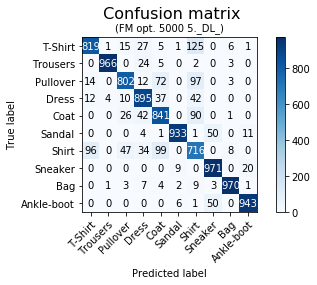

Die durchschnittliche Epochenanzahl beträgt:  173.6


In [0]:
# Trainingsmenge 5000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.0001, mit SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1, 5, X_tr_5000, y_tr_5000, 0.4, 0.0001, False, 300, 5000)

In [0]:
downloader(5000)

In [0]:
########################################################################################################################
###################   Wiederholtes Training mit optimiertenHyperparametern unter Verwendung von 
###################   EarlyStopping 
###################   2. Aufteilung der Trainingsdaten
########################################################################################################################

X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500 = make_subsets_training_data_B(X_train, y_train)


***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 450 samples, validate on 50 samples
Epoch 1/300
450/450 [==============================] - 14s 32ms/step - loss: 2.1522 - acc: 0.3022 - val_loss: 0.9527 - val_acc: 0.7000
Epoch 2/300
450/450 [==============================] - 0s 343us/step - loss: 1.3118 - acc: 0.5600 - val_loss: 0.8389 - val_acc: 0.6800
Epoch 3/300
450/450 [==============================] - 0s 285us/step - loss: 1.1691 - acc: 0.6089 - val_loss: 0.7672 - val_acc: 0.7000
Epoch 4/300
450/450 [==============================] - 0s 281us/step - loss: 0.9573 - acc: 0.6467 - val_loss: 0.7248 - val_acc: 0.6800
Epoch 5/300
450/450 [==============================] - 0s 278us/step - loss: 0.8966 - acc: 0.6622 - val_loss: 0.7246 - val_acc: 0.7000
Epoch 6/300
450/450 [==============================] - 0s 307us/step - loss: 0.8516 - acc: 0.7156 - val_loss: 0.7669 - val_acc: 0.6800
Epoch 7/300
450/450 [==

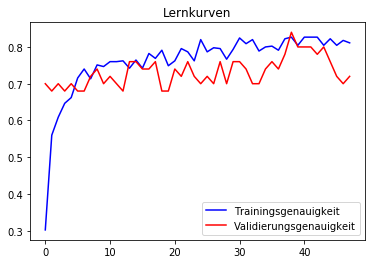

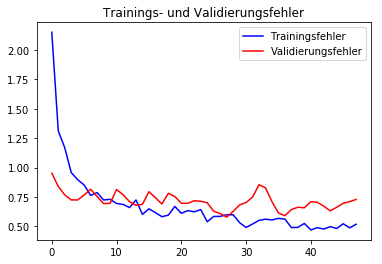

              precision    recall  f1-score   support

     T-shirt       0.73      0.75      0.74      1000
    Trousers       0.92      0.95      0.93      1000
    Pullover       0.53      0.46      0.49      1000
       Dress       0.80      0.80      0.80      1000
        Coat       0.61      0.60      0.60      1000
      Sandal       0.75      0.93      0.83      1000
       Shirt       0.39      0.42      0.40      1000
     Sneaker       0.87      0.77      0.82      1000
         Bag       0.93      0.81      0.87      1000
  Ankle-boot       0.91      0.91      0.91      1000

    accuracy                           0.74     10000
   macro avg       0.74      0.74      0.74     10000
weighted avg       0.74      0.74      0.74     10000



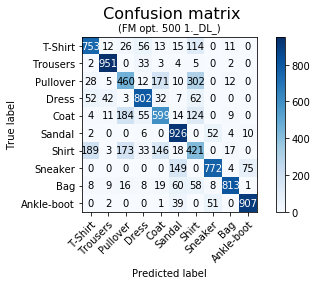

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 450 samples, validate on 50 samples
Epoch 1/300
450/450 [==============================] - 16s 35ms/step - loss: 2.3344 - acc: 0.2578 - val_loss: 1.1919 - val_acc: 0.5200
Epoch 2/300
450/450 [==============================] - 0s 392us/step - loss: 1.2390 - acc: 0.5600 - val_loss: 0.9887 - val_acc: 0.6000
Epoch 3/300
450/450 [==============================] - 0s 357us/step - loss: 1.0001 - acc: 0.6333 - val_loss: 1.1008 - val_acc: 0.6000
Epoch 4/300
450/450 [==============================] - 0s 331us/step - loss: 0.9178 - acc: 0.6689 - val_loss: 1.0081 - val_acc: 0.6600
Epoch 5/300
450/450 [==============================] - 0s 308us/step - loss: 0.9510 - acc: 0.6756 - val_loss: 0.9235 - val_acc: 0.7000
Epoch 6/300
450/450 [==============================] - 0s 329us/step - loss: 0.7514 - acc: 0.7400 - val_loss: 0.8995 - val_acc: 0.7000
Epoch 7/300
450/450 [==

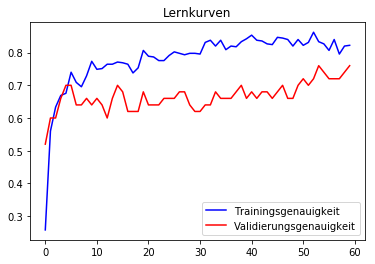

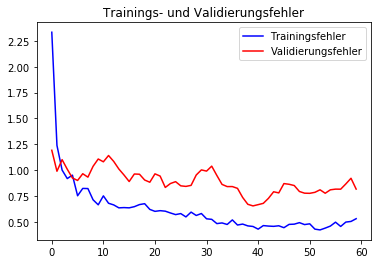

              precision    recall  f1-score   support

     T-shirt       0.70      0.82      0.76      1000
    Trousers       0.96      0.93      0.94      1000
    Pullover       0.47      0.68      0.55      1000
       Dress       0.75      0.82      0.79      1000
        Coat       0.67      0.51      0.58      1000
      Sandal       0.83      0.90      0.86      1000
       Shirt       0.48      0.28      0.35      1000
     Sneaker       0.83      0.88      0.86      1000
         Bag       0.96      0.82      0.89      1000
  Ankle-boot       0.93      0.89      0.91      1000

    accuracy                           0.75     10000
   macro avg       0.76      0.75      0.75     10000
weighted avg       0.76      0.75      0.75     10000



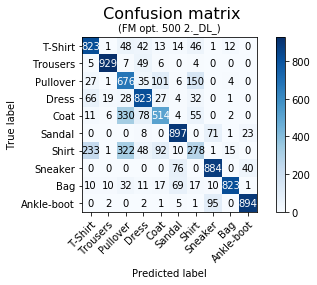

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 450 samples, validate on 50 samples
Epoch 1/300
450/450 [==============================] - 16s 36ms/step - loss: 2.1708 - acc: 0.3067 - val_loss: 1.2916 - val_acc: 0.6200
Epoch 2/300
450/450 [==============================] - 0s 306us/step - loss: 1.2483 - acc: 0.5578 - val_loss: 1.1431 - val_acc: 0.6800
Epoch 3/300
450/450 [==============================] - 0s 292us/step - loss: 0.9789 - acc: 0.6711 - val_loss: 0.9907 - val_acc: 0.7000
Epoch 4/300
450/450 [==============================] - 0s 282us/step - loss: 1.0105 - acc: 0.6267 - val_loss: 0.7553 - val_acc: 0.8000
Epoch 5/300
450/450 [==============================] - 0s 321us/step - loss: 0.9245 - acc: 0.6800 - val_loss: 0.7235 - val_acc: 0.8200
Epoch 6/300
450/450 [==============================] - 0s 279us/step - loss: 0.7620 - acc: 0.7467 - val_loss: 0.9030 - val_acc: 0.7800
Epoch 7/300
450/450 [==

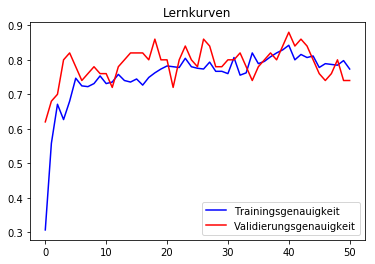

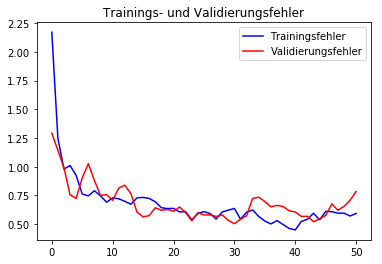

              precision    recall  f1-score   support

     T-shirt       0.68      0.79      0.73      1000
    Trousers       0.90      0.96      0.93      1000
    Pullover       0.52      0.53      0.53      1000
       Dress       0.88      0.70      0.78      1000
        Coat       0.57      0.62      0.59      1000
      Sandal       0.85      0.85      0.85      1000
       Shirt       0.42      0.33      0.37      1000
     Sneaker       0.90      0.68      0.78      1000
         Bag       0.84      0.92      0.88      1000
  Ankle-boot       0.79      0.97      0.87      1000

    accuracy                           0.74     10000
   macro avg       0.74      0.74      0.73     10000
weighted avg       0.74      0.74      0.73     10000



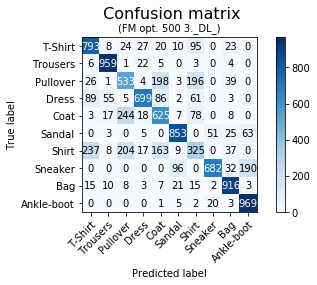

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 450 samples, validate on 50 samples
Epoch 1/300
450/450 [==============================] - 15s 34ms/step - loss: 2.3773 - acc: 0.2533 - val_loss: 1.0572 - val_acc: 0.6400
Epoch 2/300
450/450 [==============================] - 0s 310us/step - loss: 1.3752 - acc: 0.5200 - val_loss: 1.1337 - val_acc: 0.6200
Epoch 3/300
450/450 [==============================] - 0s 320us/step - loss: 1.1412 - acc: 0.6067 - val_loss: 1.1870 - val_acc: 0.6000
Epoch 4/300
450/450 [==============================] - 0s 280us/step - loss: 0.9064 - acc: 0.7022 - val_loss: 1.1184 - val_acc: 0.6400
Epoch 5/300
450/450 [==============================] - 0s 300us/step - loss: 0.8892 - acc: 0.7111 - val_loss: 1.0203 - val_acc: 0.6200
Epoch 6/300
450/450 [==============================] - 0s 299us/step - loss: 0.7965 - acc: 0.7067 - val_loss: 0.9618 - val_acc: 0.6800
Epoch 7/300
450/450 [==

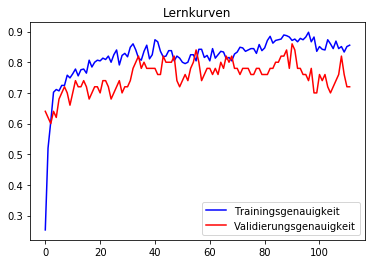

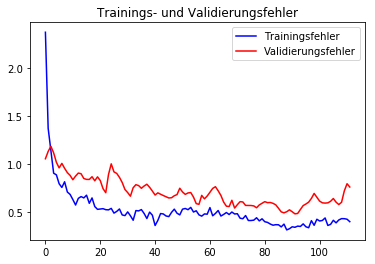

              precision    recall  f1-score   support

     T-shirt       0.74      0.71      0.72      1000
    Trousers       0.93      0.96      0.94      1000
    Pullover       0.52      0.56      0.54      1000
       Dress       0.84      0.70      0.77      1000
        Coat       0.64      0.61      0.62      1000
      Sandal       0.87      0.90      0.88      1000
       Shirt       0.42      0.42      0.42      1000
     Sneaker       0.84      0.94      0.89      1000
         Bag       0.85      0.92      0.88      1000
  Ankle-boot       0.95      0.88      0.92      1000

    accuracy                           0.76     10000
   macro avg       0.76      0.76      0.76     10000
weighted avg       0.76      0.76      0.76     10000



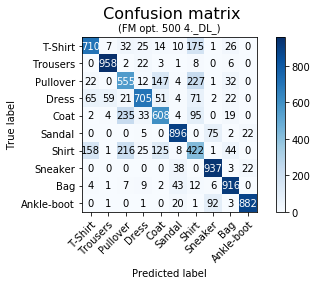

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 450 samples, validate on 50 samples
Epoch 1/300
450/450 [==============================] - 16s 36ms/step - loss: 2.1624 - acc: 0.3178 - val_loss: 1.2051 - val_acc: 0.7200
Epoch 2/300
450/450 [==============================] - 0s 345us/step - loss: 1.1715 - acc: 0.6111 - val_loss: 1.2231 - val_acc: 0.6200
Epoch 3/300
450/450 [==============================] - 0s 314us/step - loss: 1.0380 - acc: 0.6467 - val_loss: 1.1473 - val_acc: 0.5800
Epoch 4/300
450/450 [==============================] - 0s 284us/step - loss: 0.9505 - acc: 0.6756 - val_loss: 0.9920 - val_acc: 0.5800
Epoch 5/300
450/450 [==============================] - 0s 300us/step - loss: 0.8825 - acc: 0.7111 - val_loss: 0.9232 - val_acc: 0.6200
Epoch 6/300
450/450 [==============================] - 0s 289us/step - loss: 0.8822 - acc: 0.7111 - val_loss: 0.8954 - val_acc: 0.6200
Epoch 7/300
450/450 [==

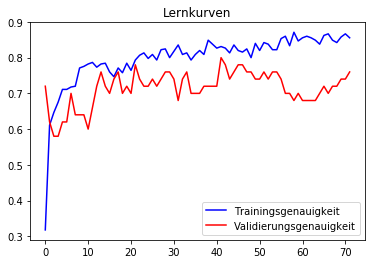

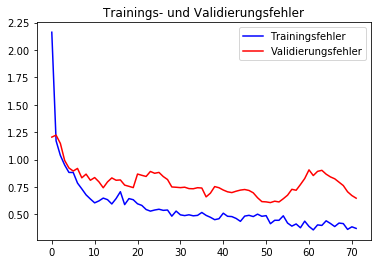

              precision    recall  f1-score   support

     T-shirt       0.67      0.76      0.71      1000
    Trousers       0.96      0.94      0.95      1000
    Pullover       0.49      0.64      0.55      1000
       Dress       0.86      0.71      0.78      1000
        Coat       0.58      0.56      0.57      1000
      Sandal       0.81      0.87      0.84      1000
       Shirt       0.47      0.36      0.41      1000
     Sneaker       0.85      0.87      0.86      1000
         Bag       0.93      0.86      0.89      1000
  Ankle-boot       0.91      0.94      0.93      1000

    accuracy                           0.75     10000
   macro avg       0.75      0.75      0.75     10000
weighted avg       0.75      0.75      0.75     10000



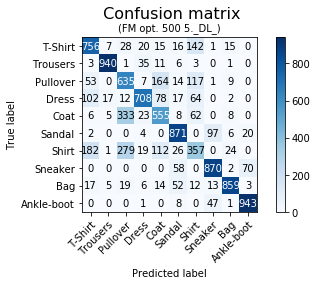

Die durchschnittliche Epochenanzahl beträgt:  48.6


In [0]:
# Trainingsmenge 500
# optimierte Parameter: Dropoutrate: 0.25, Lernrate: 0.001, mit SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1, 5, X_tr_500, y_tr_500, 0.25, 0.001, True, 300, 500)

In [0]:
downloader(500)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/49
500/500 [==============================] - 16s 32ms/step - loss: 2.2743 - acc: 0.2760 - val_loss: 1.1918 - val_acc: 0.5787
Epoch 2/49
500/500 [==============================] - 1s 2ms/step - loss: 1.1452 - acc: 0.5940 - val_loss: 0.9276 - val_acc: 0.6887
Epoch 3/49
500/500 [==============================] - 1s 2ms/step - loss: 0.9374 - acc: 0.6800 - val_loss: 0.9020 - val_acc: 0.7157
Epoch 4/49
500/500 [==============================] - 1s 2ms/step - loss: 0.7814 - acc: 0.7420 - val_loss: 0.9438 - val_acc: 0.6953
Epoch 5/49
500/500 [==============================] - 1s 2ms/step - loss: 0.7118 - acc: 0.7400 - val_loss: 0.7419 - val_acc: 0.7336
Epoch 6/49
500/500 [==============================] - 1s 2ms/step - loss: 0.6570 - acc: 0.7660 - val_loss: 0.6911 - val_acc: 0.7531
Epoch 7/49
500/500 [==============================] - 

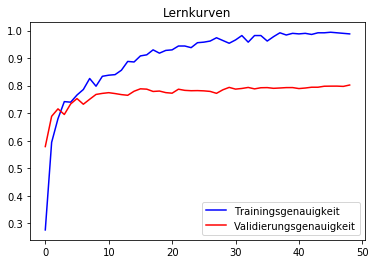

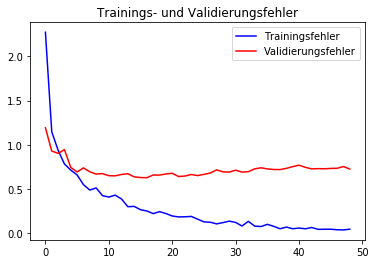

              precision    recall  f1-score   support

     T-shirt       0.73      0.81      0.77      1000
    Trousers       0.98      0.92      0.95      1000
    Pullover       0.65      0.68      0.67      1000
       Dress       0.85      0.79      0.82      1000
        Coat       0.65      0.75      0.70      1000
      Sandal       0.93      0.89      0.91      1000
       Shirt       0.51      0.41      0.45      1000
     Sneaker       0.87      0.92      0.89      1000
         Bag       0.92      0.92      0.92      1000
  Ankle-boot       0.92      0.93      0.92      1000

    accuracy                           0.80     10000
   macro avg       0.80      0.80      0.80     10000
weighted avg       0.80      0.80      0.80     10000



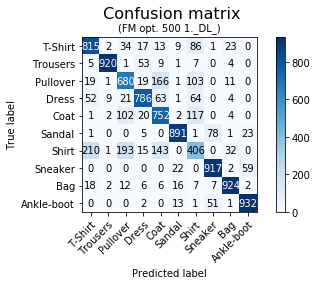

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/49
500/500 [==============================] - 16s 33ms/step - loss: 2.2656 - acc: 0.2920 - val_loss: 1.0046 - val_acc: 0.6586
Epoch 2/49
500/500 [==============================] - 1s 2ms/step - loss: 1.2269 - acc: 0.5860 - val_loss: 0.8792 - val_acc: 0.6853
Epoch 3/49
500/500 [==============================] - 1s 2ms/step - loss: 0.9744 - acc: 0.6540 - val_loss: 0.8876 - val_acc: 0.7052
Epoch 4/49
500/500 [==============================] - 1s 2ms/step - loss: 0.7666 - acc: 0.7260 - val_loss: 0.8206 - val_acc: 0.7224
Epoch 5/49
500/500 [==============================] - 1s 2ms/step - loss: 0.7184 - acc: 0.7460 - val_loss: 0.7380 - val_acc: 0.7366
Epoch 6/49
500/500 [==============================] - 1s 2ms/step - loss: 0.6777 - acc: 0.7500 - val_loss: 0.7466 - val_acc: 0.7349
Epoch 7/49
500/500 [==============================] - 

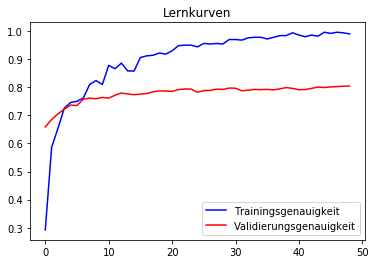

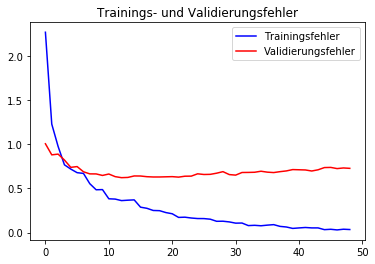

              precision    recall  f1-score   support

     T-shirt       0.77      0.79      0.78      1000
    Trousers       0.99      0.92      0.95      1000
    Pullover       0.65      0.71      0.68      1000
       Dress       0.83      0.83      0.83      1000
        Coat       0.70      0.67      0.68      1000
      Sandal       0.96      0.86      0.91      1000
       Shirt       0.50      0.47      0.48      1000
     Sneaker       0.86      0.92      0.89      1000
         Bag       0.91      0.94      0.93      1000
  Ankle-boot       0.90      0.94      0.92      1000

    accuracy                           0.80     10000
   macro avg       0.81      0.80      0.80     10000
weighted avg       0.81      0.80      0.80     10000



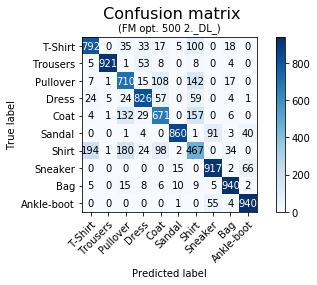

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/49
500/500 [==============================] - 17s 33ms/step - loss: 2.1682 - acc: 0.2920 - val_loss: 1.2614 - val_acc: 0.5783
Epoch 2/49
500/500 [==============================] - 1s 2ms/step - loss: 1.1884 - acc: 0.5840 - val_loss: 1.0535 - val_acc: 0.6642
Epoch 3/49
500/500 [==============================] - 1s 2ms/step - loss: 1.0123 - acc: 0.6560 - val_loss: 1.1057 - val_acc: 0.6416
Epoch 4/49
500/500 [==============================] - 1s 2ms/step - loss: 0.8009 - acc: 0.7160 - val_loss: 1.0579 - val_acc: 0.6788
Epoch 5/49
500/500 [==============================] - 1s 2ms/step - loss: 0.7319 - acc: 0.7300 - val_loss: 0.7849 - val_acc: 0.7368
Epoch 6/49
500/500 [==============================] - 1s 2ms/step - loss: 0.6767 - acc: 0.7480 - val_loss: 0.7471 - val_acc: 0.7407
Epoch 7/49
500/500 [==============================] - 

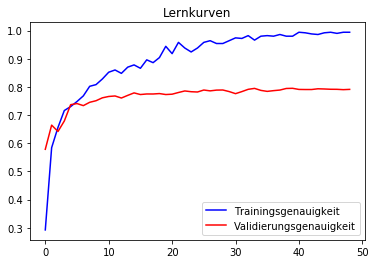

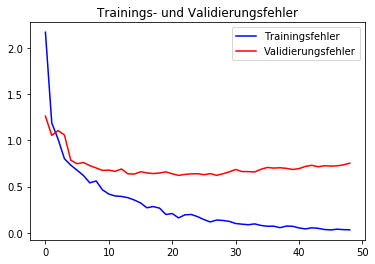

              precision    recall  f1-score   support

     T-shirt       0.80      0.75      0.77      1000
    Trousers       0.99      0.92      0.95      1000
    Pullover       0.64      0.71      0.67      1000
       Dress       0.84      0.80      0.82      1000
        Coat       0.70      0.66      0.68      1000
      Sandal       0.98      0.77      0.86      1000
       Shirt       0.47      0.50      0.48      1000
     Sneaker       0.84      0.92      0.88      1000
         Bag       0.86      0.95      0.91      1000
  Ankle-boot       0.88      0.94      0.90      1000

    accuracy                           0.79     10000
   macro avg       0.80      0.79      0.79     10000
weighted avg       0.80      0.79      0.79     10000



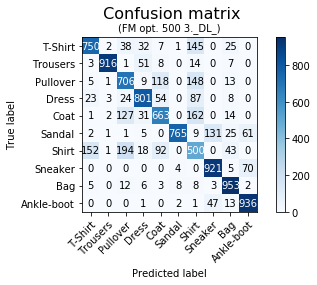

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/49
500/500 [==============================] - 17s 34ms/step - loss: 2.1437 - acc: 0.2900 - val_loss: 1.2057 - val_acc: 0.6065
Epoch 2/49
500/500 [==============================] - 1s 2ms/step - loss: 1.2126 - acc: 0.5840 - val_loss: 0.9345 - val_acc: 0.6928
Epoch 3/49
500/500 [==============================] - 1s 2ms/step - loss: 0.9619 - acc: 0.6540 - val_loss: 0.8527 - val_acc: 0.7053
Epoch 4/49
500/500 [==============================] - 1s 2ms/step - loss: 0.8158 - acc: 0.7280 - val_loss: 0.7847 - val_acc: 0.7194
Epoch 5/49
500/500 [==============================] - 1s 2ms/step - loss: 0.7330 - acc: 0.7340 - val_loss: 0.8367 - val_acc: 0.7162
Epoch 6/49
500/500 [==============================] - 1s 2ms/step - loss: 0.6489 - acc: 0.7760 - val_loss: 0.7729 - val_acc: 0.7398
Epoch 7/49
500/500 [==============================] - 

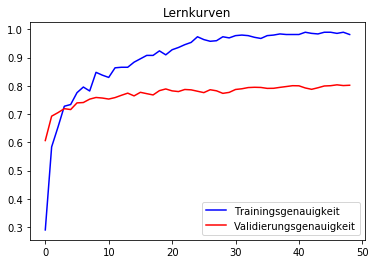

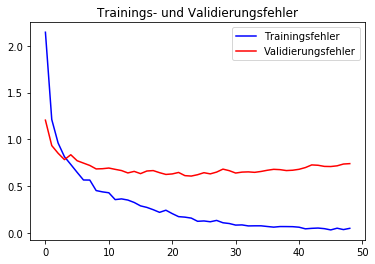

              precision    recall  f1-score   support

     T-shirt       0.76      0.80      0.78      1000
    Trousers       0.99      0.90      0.94      1000
    Pullover       0.63      0.74      0.68      1000
       Dress       0.81      0.83      0.82      1000
        Coat       0.70      0.70      0.70      1000
      Sandal       0.97      0.82      0.89      1000
       Shirt       0.57      0.42      0.48      1000
     Sneaker       0.85      0.91      0.88      1000
         Bag       0.85      0.95      0.89      1000
  Ankle-boot       0.90      0.95      0.93      1000

    accuracy                           0.80     10000
   macro avg       0.80      0.80      0.80     10000
weighted avg       0.80      0.80      0.80     10000



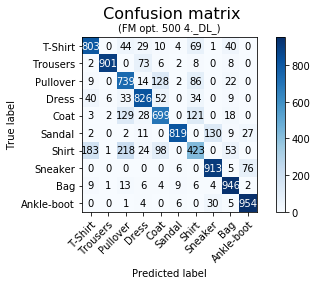

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/49
500/500 [==============================] - 18s 35ms/step - loss: 2.1326 - acc: 0.3160 - val_loss: 1.0917 - val_acc: 0.6415
Epoch 2/49
500/500 [==============================] - 1s 2ms/step - loss: 1.1930 - acc: 0.5780 - val_loss: 0.9173 - val_acc: 0.7063
Epoch 3/49
500/500 [==============================] - 1s 2ms/step - loss: 0.9623 - acc: 0.6640 - val_loss: 0.8490 - val_acc: 0.7313
Epoch 4/49
500/500 [==============================] - 1s 2ms/step - loss: 0.8516 - acc: 0.7180 - val_loss: 0.7886 - val_acc: 0.7390
Epoch 5/49
500/500 [==============================] - 1s 2ms/step - loss: 0.6948 - acc: 0.7500 - val_loss: 0.7168 - val_acc: 0.7480
Epoch 6/49
500/500 [==============================] - 1s 2ms/step - loss: 0.6418 - acc: 0.7700 - val_loss: 0.7337 - val_acc: 0.7395
Epoch 7/49
500/500 [==============================] - 

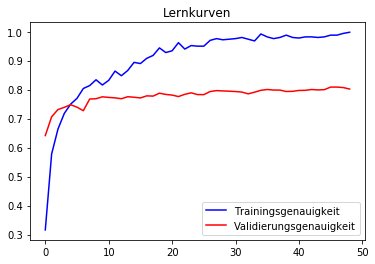

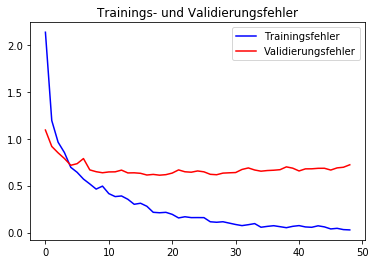

              precision    recall  f1-score   support

     T-shirt       0.74      0.81      0.77      1000
    Trousers       0.98      0.93      0.96      1000
    Pullover       0.68      0.60      0.64      1000
       Dress       0.82      0.84      0.83      1000
        Coat       0.66      0.77      0.71      1000
      Sandal       0.97      0.83      0.89      1000
       Shirt       0.53      0.44      0.48      1000
     Sneaker       0.83      0.93      0.88      1000
         Bag       0.89      0.94      0.91      1000
  Ankle-boot       0.91      0.95      0.93      1000

    accuracy                           0.80     10000
   macro avg       0.80      0.80      0.80     10000
weighted avg       0.80      0.80      0.80     10000



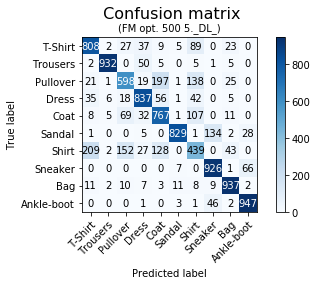

In [48]:
# Trainingsmenge 500
# optimierte Parameter: Dropoutrate: 0.25, Lernrate: 0.001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainieren, mit durchschnittlichen bester Epochenanzahl aus EarlyStopping
fullDataRuns(1, 5, X_tr_500, y_tr_500, X_test, y_test, 0.25, 0.001, True, 49, 500)

In [0]:
downloader_full(500)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
8/8 [==============================] - 17s 2s/step - loss: 2.4887 - acc: 0.2105 - val_loss: 1.4223 - val_acc: 0.5800
Epoch 2/300
8/8 [==============================] - 0s 19ms/step - loss: 2.0796 - acc: 0.3292 - val_loss: 1.4272 - val_acc: 0.4600
Epoch 3/300
8/8 [==============================] - 0s 27ms/step - loss: 1.9134 - acc: 0.3907 - val_loss: 1.3737 - val_acc: 0.4800
Epoch 4/300
8/8 [==============================] - 0s 27ms/step - loss: 1.9885 - acc: 0.4105 - val_loss: 1.1344 - val_acc: 0.6000
Epoch 5/300
8/8 [==============================] - 0s 28ms/step - loss: 1.4919 - acc: 0.4980 - val_loss: 1.1142 - val_acc: 0.6000
Epoch 6/300
8/8 [==============================] - 0s 33ms/step - loss: 1.4443 - acc: 0.4482 - val_loss: 1.0917 - val_acc: 0.6400
Epoch 7/300
8/8 [==============================] - 0s 29ms/step - loss: 1.469

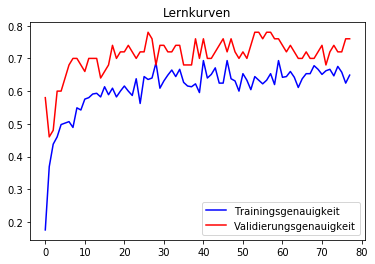

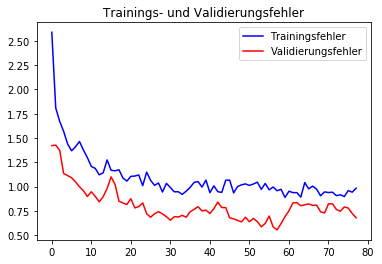

              precision    recall  f1-score   support

     T-shirt       0.74      0.69      0.71      1000
    Trousers       0.93      0.96      0.94      1000
    Pullover       0.49      0.63      0.55      1000
       Dress       0.82      0.71      0.76      1000
        Coat       0.58      0.58      0.58      1000
      Sandal       0.68      0.92      0.78      1000
       Shirt       0.38      0.25      0.30      1000
     Sneaker       0.89      0.75      0.81      1000
         Bag       0.89      0.83      0.86      1000
  Ankle-boot       0.87      0.92      0.89      1000

    accuracy                           0.73     10000
   macro avg       0.73      0.73      0.72     10000
weighted avg       0.73      0.73      0.72     10000



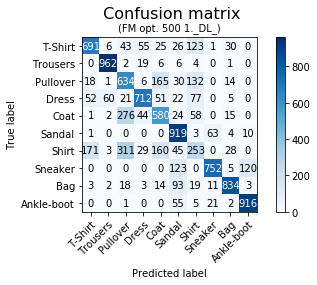

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
8/8 [==============================] - 17s 2s/step - loss: 2.3770 - acc: 0.2640 - val_loss: 1.3978 - val_acc: 0.5200
Epoch 2/300
8/8 [==============================] - 0s 18ms/step - loss: 1.9862 - acc: 0.3371 - val_loss: 1.1342 - val_acc: 0.6400
Epoch 3/300
8/8 [==============================] - 0s 26ms/step - loss: 1.9813 - acc: 0.3867 - val_loss: 1.2097 - val_acc: 0.6000
Epoch 4/300
8/8 [==============================] - 0s 24ms/step - loss: 1.6886 - acc: 0.4663 - val_loss: 1.0098 - val_acc: 0.6600
Epoch 5/300
8/8 [==============================] - 0s 26ms/step - loss: 1.6248 - acc: 0.4402 - val_loss: 0.9532 - val_acc: 0.6400
Epoch 6/300
8/8 [==============================] - 0s 25ms/step - loss: 1.4492 - acc: 0.4739 - val_loss: 1.0583 - val_acc: 0.6600
Epoch 7/300
8/8 [==============================] - 0s 24ms/step - loss: 1.371

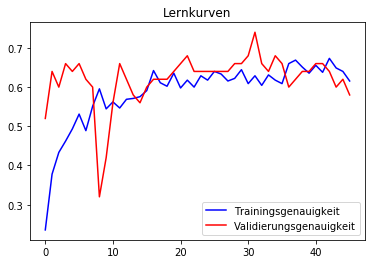

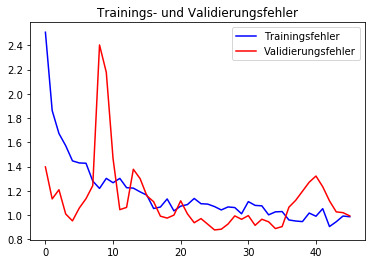

              precision    recall  f1-score   support

     T-shirt       0.75      0.68      0.71      1000
    Trousers       0.93      0.94      0.93      1000
    Pullover       0.45      0.56      0.50      1000
       Dress       0.73      0.75      0.74      1000
        Coat       0.59      0.60      0.60      1000
      Sandal       0.75      0.79      0.77      1000
       Shirt       0.33      0.27      0.30      1000
     Sneaker       0.68      0.92      0.78      1000
         Bag       0.96      0.73      0.83      1000
  Ankle-boot       0.94      0.81      0.87      1000

    accuracy                           0.70     10000
   macro avg       0.71      0.70      0.70     10000
weighted avg       0.71      0.70      0.70     10000



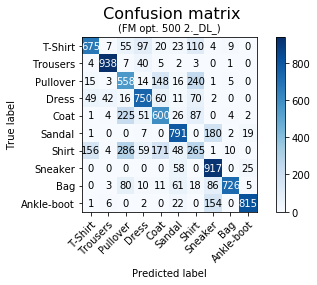

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
8/8 [==============================] - 17s 2s/step - loss: 2.3307 - acc: 0.2581 - val_loss: 1.5231 - val_acc: 0.4600
Epoch 2/300
8/8 [==============================] - 0s 17ms/step - loss: 2.0169 - acc: 0.3252 - val_loss: 1.5650 - val_acc: 0.4600
Epoch 3/300
8/8 [==============================] - 0s 30ms/step - loss: 1.5166 - acc: 0.4804 - val_loss: 1.0428 - val_acc: 0.6400
Epoch 4/300
8/8 [==============================] - 0s 27ms/step - loss: 1.4297 - acc: 0.4601 - val_loss: 1.0315 - val_acc: 0.6000
Epoch 5/300
8/8 [==============================] - 0s 25ms/step - loss: 1.6329 - acc: 0.4501 - val_loss: 1.2196 - val_acc: 0.6400
Epoch 6/300
8/8 [==============================] - 0s 24ms/step - loss: 1.3043 - acc: 0.5476 - val_loss: 1.1334 - val_acc: 0.6800
Epoch 7/300
8/8 [==============================] - 0s 25ms/step - loss: 1.371

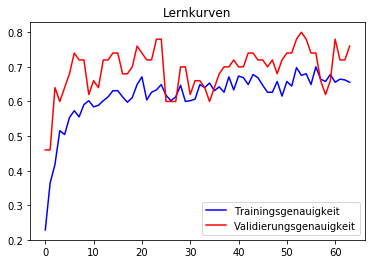

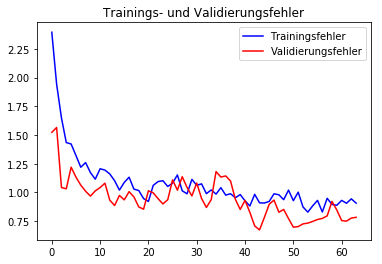

              precision    recall  f1-score   support

     T-shirt       0.71      0.77      0.74      1000
    Trousers       0.88      0.97      0.92      1000
    Pullover       0.51      0.56      0.53      1000
       Dress       0.77      0.77      0.77      1000
        Coat       0.52      0.68      0.59      1000
      Sandal       0.73      0.89      0.80      1000
       Shirt       0.50      0.12      0.20      1000
     Sneaker       0.85      0.84      0.84      1000
         Bag       0.89      0.85      0.87      1000
  Ankle-boot       0.92      0.92      0.92      1000

    accuracy                           0.74     10000
   macro avg       0.73      0.74      0.72     10000
weighted avg       0.73      0.74      0.72     10000



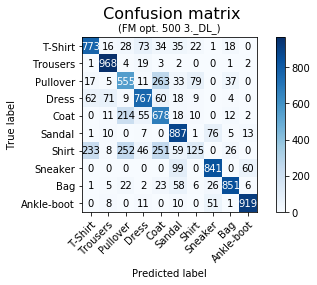

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
8/8 [==============================] - 17s 2s/step - loss: 2.5157 - acc: 0.1646 - val_loss: 1.5330 - val_acc: 0.5800
Epoch 2/300
8/8 [==============================] - 0s 17ms/step - loss: 2.0036 - acc: 0.3394 - val_loss: 1.3126 - val_acc: 0.6000
Epoch 3/300
8/8 [==============================] - 0s 23ms/step - loss: 1.7051 - acc: 0.3887 - val_loss: 1.2798 - val_acc: 0.5600
Epoch 4/300
8/8 [==============================] - 0s 24ms/step - loss: 1.7220 - acc: 0.4402 - val_loss: 1.3705 - val_acc: 0.6000
Epoch 5/300
8/8 [==============================] - 0s 26ms/step - loss: 1.6211 - acc: 0.4581 - val_loss: 1.3744 - val_acc: 0.6000
Epoch 6/300
8/8 [==============================] - 0s 33ms/step - loss: 1.6844 - acc: 0.4442 - val_loss: 1.5437 - val_acc: 0.4200
Epoch 7/300
8/8 [==============================] - 0s 25ms/step - loss: 1.285

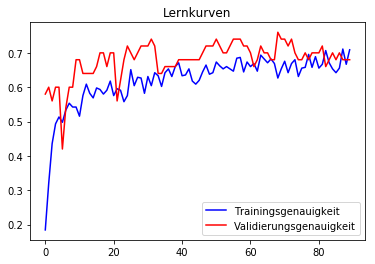

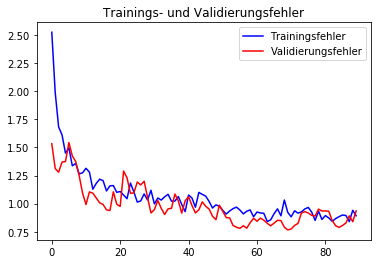

              precision    recall  f1-score   support

     T-shirt       0.78      0.65      0.71      1000
    Trousers       0.93      0.96      0.94      1000
    Pullover       0.42      0.55      0.48      1000
       Dress       0.81      0.74      0.78      1000
        Coat       0.64      0.39      0.49      1000
      Sandal       0.77      0.77      0.77      1000
       Shirt       0.38      0.42      0.40      1000
     Sneaker       0.78      0.79      0.78      1000
         Bag       0.87      0.88      0.87      1000
  Ankle-boot       0.82      0.96      0.89      1000

    accuracy                           0.71     10000
   macro avg       0.72      0.71      0.71     10000
weighted avg       0.72      0.71      0.71     10000



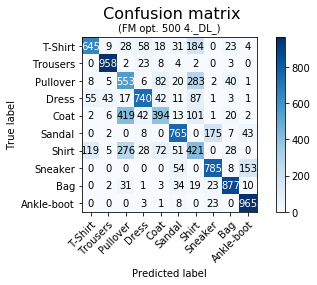

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
8/8 [==============================] - 18s 2s/step - loss: 2.5475 - acc: 0.2125 - val_loss: 1.4276 - val_acc: 0.5800
Epoch 2/300
8/8 [==============================] - 0s 20ms/step - loss: 2.1484 - acc: 0.3771 - val_loss: 1.4214 - val_acc: 0.5800
Epoch 3/300
8/8 [==============================] - 0s 36ms/step - loss: 1.6856 - acc: 0.4923 - val_loss: 1.5359 - val_acc: 0.5600
Epoch 4/300
8/8 [==============================] - 0s 39ms/step - loss: 1.5148 - acc: 0.4683 - val_loss: 1.5585 - val_acc: 0.5400
Epoch 5/300
8/8 [==============================] - 0s 35ms/step - loss: 1.4241 - acc: 0.5280 - val_loss: 1.2982 - val_acc: 0.6000
Epoch 6/300
8/8 [==============================] - 0s 37ms/step - loss: 1.5374 - acc: 0.5139 - val_loss: 1.1545 - val_acc: 0.7000
Epoch 7/300
8/8 [==============================] - 0s 27ms/step - loss: 1.355

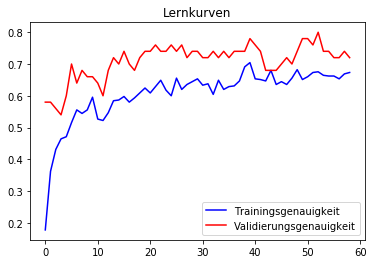

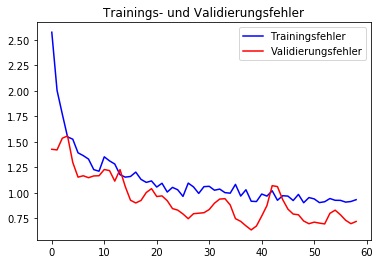

              precision    recall  f1-score   support

     T-shirt       0.72      0.74      0.73      1000
    Trousers       0.90      0.93      0.91      1000
    Pullover       0.52      0.40      0.45      1000
       Dress       0.71      0.78      0.74      1000
        Coat       0.57      0.64      0.60      1000
      Sandal       0.76      0.82      0.79      1000
       Shirt       0.37      0.33      0.34      1000
     Sneaker       0.81      0.82      0.82      1000
         Bag       0.94      0.81      0.87      1000
  Ankle-boot       0.85      0.95      0.90      1000

    accuracy                           0.72     10000
   macro avg       0.72      0.72      0.72     10000
weighted avg       0.72      0.72      0.72     10000



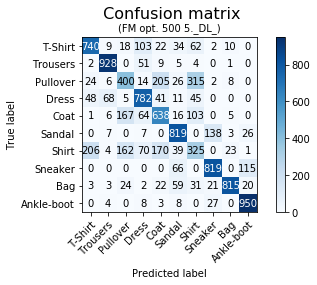

Die durchschnittliche Epochenanzahl beträgt:  47.4


In [0]:
# Trainingsmenge 500
# optimierte Parameter: Dropoutrate: 0.25, Lernrate: 0.001, mit SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1, 5, X_tr_500, y_tr_500, 0.25, 0.001, True, 300, 500)

In [0]:
downloader(500)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 900 samples, validate on 100 samples
Epoch 1/300
900/900 [==============================] - 19s 21ms/step - loss: 2.1255 - acc: 0.3133 - val_loss: 0.8928 - val_acc: 0.6700
Epoch 2/300
900/900 [==============================] - 0s 307us/step - loss: 1.1214 - acc: 0.6033 - val_loss: 0.6428 - val_acc: 0.7700
Epoch 3/300
900/900 [==============================] - 0s 279us/step - loss: 0.9784 - acc: 0.6433 - val_loss: 0.5008 - val_acc: 0.7800
Epoch 4/300
900/900 [==============================] - 0s 282us/step - loss: 0.8507 - acc: 0.6956 - val_loss: 0.4512 - val_acc: 0.8100
Epoch 5/300
900/900 [==============================] - 0s 285us/step - loss: 0.8254 - acc: 0.6956 - val_loss: 0.4342 - val_acc: 0.8400
Epoch 6/300
900/900 [==============================] - 0s 291us/step - loss: 0.7524 - acc: 0.7156 - val_loss: 0.4254 - val_acc: 0.8200
Epoch 7/300
900/900 [=

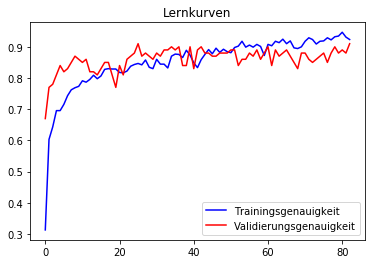

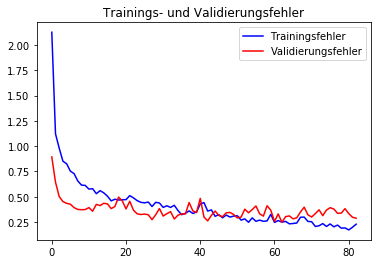

              precision    recall  f1-score   support

     T-shirt       0.79      0.76      0.78      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.70      0.67      0.69      1000
       Dress       0.84      0.85      0.85      1000
        Coat       0.68      0.74      0.71      1000
      Sandal       0.87      0.95      0.91      1000
       Shirt       0.53      0.53      0.53      1000
     Sneaker       0.93      0.88      0.90      1000
         Bag       0.96      0.93      0.94      1000
  Ankle-boot       0.93      0.95      0.94      1000

    accuracy                           0.82     10000
   macro avg       0.82      0.82      0.82     10000
weighted avg       0.82      0.82      0.82     10000



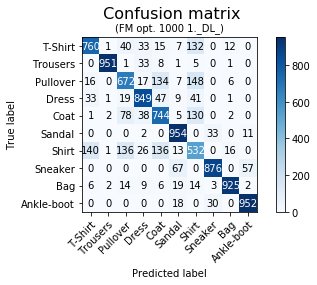

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 900 samples, validate on 100 samples
Epoch 1/300
900/900 [==============================] - 18s 20ms/step - loss: 2.0208 - acc: 0.3233 - val_loss: 1.0119 - val_acc: 0.6800
Epoch 2/300
900/900 [==============================] - 0s 278us/step - loss: 1.1622 - acc: 0.6000 - val_loss: 0.8549 - val_acc: 0.7300
Epoch 3/300
900/900 [==============================] - 0s 272us/step - loss: 0.9701 - acc: 0.6744 - val_loss: 0.7038 - val_acc: 0.7700
Epoch 4/300
900/900 [==============================] - 0s 260us/step - loss: 0.8400 - acc: 0.6956 - val_loss: 0.6657 - val_acc: 0.7700
Epoch 5/300
900/900 [==============================] - 0s 264us/step - loss: 0.8183 - acc: 0.7022 - val_loss: 0.7465 - val_acc: 0.7400
Epoch 6/300
900/900 [==============================] - 0s 283us/step - loss: 0.7674 - acc: 0.7300 - val_loss: 0.6336 - val_acc: 0.7600
Epoch 7/300
900/900 [=

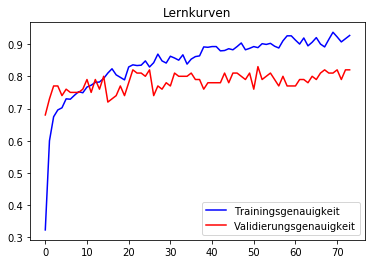

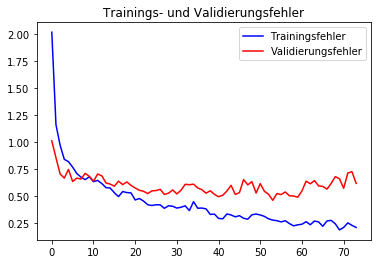

              precision    recall  f1-score   support

     T-shirt       0.79      0.74      0.77      1000
    Trousers       0.99      0.94      0.96      1000
    Pullover       0.69      0.71      0.70      1000
       Dress       0.85      0.85      0.85      1000
        Coat       0.78      0.55      0.64      1000
      Sandal       0.94      0.91      0.92      1000
       Shirt       0.48      0.65      0.55      1000
     Sneaker       0.85      0.93      0.89      1000
         Bag       0.95      0.93      0.94      1000
  Ankle-boot       0.95      0.91      0.93      1000

    accuracy                           0.81     10000
   macro avg       0.83      0.81      0.81     10000
weighted avg       0.83      0.81      0.81     10000



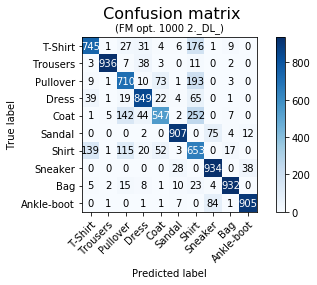

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 900 samples, validate on 100 samples
Epoch 1/300
900/900 [==============================] - 19s 22ms/step - loss: 1.8947 - acc: 0.3811 - val_loss: 1.0394 - val_acc: 0.6600
Epoch 2/300
900/900 [==============================] - 0s 341us/step - loss: 1.0718 - acc: 0.6344 - val_loss: 0.8722 - val_acc: 0.7400
Epoch 3/300
900/900 [==============================] - 0s 356us/step - loss: 0.8866 - acc: 0.6878 - val_loss: 0.7063 - val_acc: 0.7400
Epoch 4/300
900/900 [==============================] - 0s 348us/step - loss: 0.8390 - acc: 0.7033 - val_loss: 0.6276 - val_acc: 0.7800
Epoch 5/300
900/900 [==============================] - 0s 336us/step - loss: 0.7364 - acc: 0.7111 - val_loss: 0.6656 - val_acc: 0.7700
Epoch 6/300
900/900 [==============================] - 0s 310us/step - loss: 0.7421 - acc: 0.7311 - val_loss: 0.6329 - val_acc: 0.7500
Epoch 7/300
900/900 [=

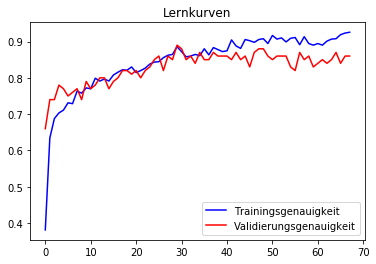

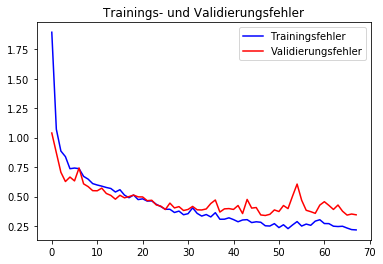

              precision    recall  f1-score   support

     T-shirt       0.79      0.73      0.76      1000
    Trousers       0.97      0.96      0.97      1000
    Pullover       0.77      0.60      0.68      1000
       Dress       0.87      0.83      0.85      1000
        Coat       0.67      0.80      0.73      1000
      Sandal       0.98      0.90      0.94      1000
       Shirt       0.51      0.60      0.55      1000
     Sneaker       0.89      0.93      0.91      1000
         Bag       0.95      0.93      0.94      1000
  Ankle-boot       0.92      0.95      0.93      1000

    accuracy                           0.82     10000
   macro avg       0.83      0.82      0.82     10000
weighted avg       0.83      0.82      0.82     10000



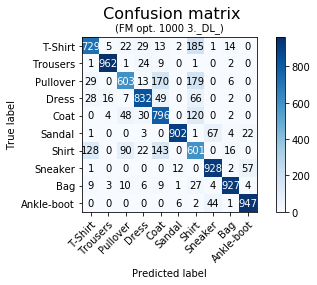

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 900 samples, validate on 100 samples
Epoch 1/300
900/900 [==============================] - 20s 22ms/step - loss: 2.0257 - acc: 0.3211 - val_loss: 0.9274 - val_acc: 0.7200
Epoch 2/300
900/900 [==============================] - 0s 320us/step - loss: 1.1514 - acc: 0.5956 - val_loss: 0.6868 - val_acc: 0.7600
Epoch 3/300
900/900 [==============================] - 0s 323us/step - loss: 0.9636 - acc: 0.6656 - val_loss: 0.6742 - val_acc: 0.7600
Epoch 4/300
900/900 [==============================] - 0s 342us/step - loss: 0.8451 - acc: 0.6911 - val_loss: 0.5734 - val_acc: 0.7800
Epoch 5/300
900/900 [==============================] - 0s 337us/step - loss: 0.8797 - acc: 0.6900 - val_loss: 0.5703 - val_acc: 0.8100
Epoch 6/300
900/900 [==============================] - 0s 354us/step - loss: 0.7451 - acc: 0.7344 - val_loss: 0.5404 - val_acc: 0.8000
Epoch 7/300
900/900 [=

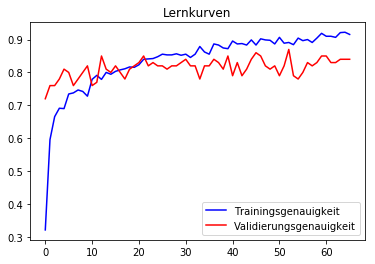

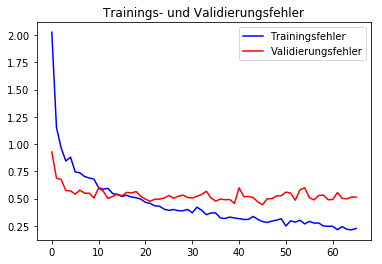

              precision    recall  f1-score   support

     T-shirt       0.75      0.81      0.78      1000
    Trousers       0.99      0.93      0.96      1000
    Pullover       0.71      0.70      0.70      1000
       Dress       0.83      0.86      0.85      1000
        Coat       0.74      0.65      0.69      1000
      Sandal       0.92      0.93      0.93      1000
       Shirt       0.54      0.58      0.56      1000
     Sneaker       0.90      0.94      0.92      1000
         Bag       0.96      0.90      0.93      1000
  Ankle-boot       0.94      0.94      0.94      1000

    accuracy                           0.82     10000
   macro avg       0.83      0.82      0.83     10000
weighted avg       0.83      0.82      0.83     10000



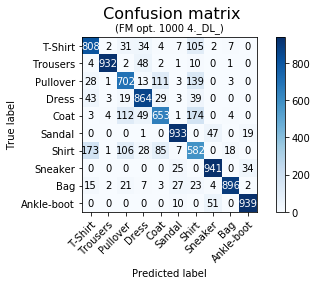

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 900 samples, validate on 100 samples
Epoch 1/300
900/900 [==============================] - 19s 22ms/step - loss: 2.1306 - acc: 0.3067 - val_loss: 1.1174 - val_acc: 0.6400
Epoch 2/300
900/900 [==============================] - 0s 304us/step - loss: 1.2394 - acc: 0.5611 - val_loss: 1.1663 - val_acc: 0.5700
Epoch 3/300
900/900 [==============================] - 0s 292us/step - loss: 0.9931 - acc: 0.6422 - val_loss: 0.8815 - val_acc: 0.6600
Epoch 4/300
900/900 [==============================] - 0s 297us/step - loss: 0.8995 - acc: 0.6789 - val_loss: 0.8489 - val_acc: 0.6700
Epoch 5/300
900/900 [==============================] - 0s 316us/step - loss: 0.8252 - acc: 0.7233 - val_loss: 0.7898 - val_acc: 0.6700
Epoch 6/300
900/900 [==============================] - 0s 288us/step - loss: 0.7669 - acc: 0.7156 - val_loss: 0.7156 - val_acc: 0.7100
Epoch 7/300
900/900 [=

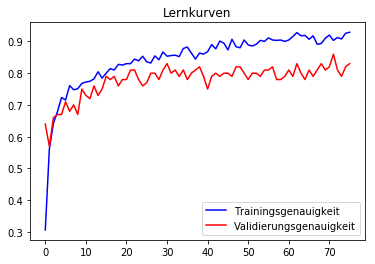

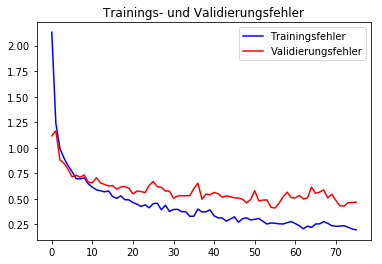

              precision    recall  f1-score   support

     T-shirt       0.78      0.75      0.76      1000
    Trousers       0.94      0.97      0.95      1000
    Pullover       0.71      0.66      0.69      1000
       Dress       0.89      0.80      0.84      1000
        Coat       0.71      0.67      0.69      1000
      Sandal       0.94      0.93      0.94      1000
       Shirt       0.49      0.61      0.54      1000
     Sneaker       0.90      0.90      0.90      1000
         Bag       0.97      0.94      0.95      1000
  Ankle-boot       0.92      0.95      0.94      1000

    accuracy                           0.82     10000
   macro avg       0.83      0.82      0.82     10000
weighted avg       0.83      0.82      0.82     10000



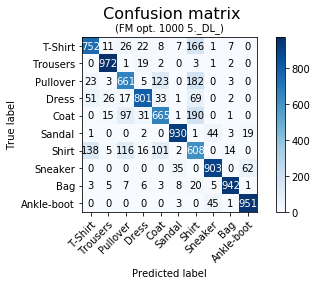

Die durchschnittliche Epochenanzahl beträgt:  53.4


In [0]:
# Trainingsmenge 1000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.0001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1, 5, X_tr_1000, y_tr_1000, 0.4, 0.001, False, 300, 1000)

In [0]:
downloader(1000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/54
1000/1000 [==============================] - 18s 18ms/step - loss: 1.8858 - acc: 0.3560 - val_loss: 0.9912 - val_acc: 0.6568
Epoch 2/54
1000/1000 [==============================] - 1s 1ms/step - loss: 1.0430 - acc: 0.6290 - val_loss: 0.8188 - val_acc: 0.7184
Epoch 3/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.9120 - acc: 0.6870 - val_loss: 0.7930 - val_acc: 0.7341
Epoch 4/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.8164 - acc: 0.7140 - val_loss: 0.7560 - val_acc: 0.7408
Epoch 5/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.7186 - acc: 0.7450 - val_loss: 0.7019 - val_acc: 0.7498
Epoch 6/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.6560 - acc: 0.7530 - val_loss: 0.6697 - val_acc: 0.7610
Epoch 7/54
1000/1000 [===================

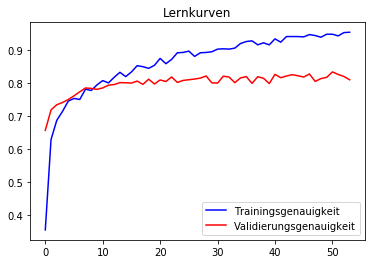

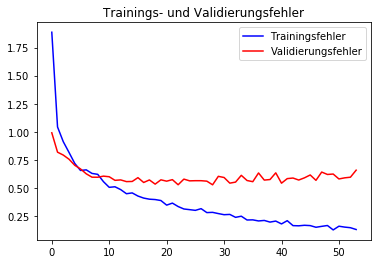

              precision    recall  f1-score   support

     T-shirt       0.85      0.71      0.77      1000
    Trousers       1.00      0.91      0.95      1000
    Pullover       0.82      0.50      0.62      1000
       Dress       0.74      0.90      0.82      1000
        Coat       0.67      0.77      0.72      1000
      Sandal       0.98      0.86      0.92      1000
       Shirt       0.49      0.59      0.54      1000
     Sneaker       0.87      0.95      0.91      1000
         Bag       0.88      0.96      0.92      1000
  Ankle-boot       0.92      0.94      0.93      1000

    accuracy                           0.81     10000
   macro avg       0.82      0.81      0.81     10000
weighted avg       0.82      0.81      0.81     10000



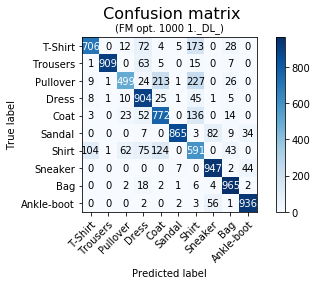

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/54
1000/1000 [==============================] - 19s 19ms/step - loss: 1.9811 - acc: 0.3380 - val_loss: 1.0026 - val_acc: 0.6547
Epoch 2/54
1000/1000 [==============================] - 1s 1ms/step - loss: 1.0983 - acc: 0.6000 - val_loss: 0.8765 - val_acc: 0.7007
Epoch 3/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.8686 - acc: 0.6940 - val_loss: 0.8042 - val_acc: 0.7158
Epoch 4/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.7802 - acc: 0.7210 - val_loss: 0.6969 - val_acc: 0.7465
Epoch 5/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.7096 - acc: 0.7330 - val_loss: 0.6595 - val_acc: 0.7535
Epoch 6/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.6475 - acc: 0.7730 - val_loss: 0.6238 - val_acc: 0.7739
Epoch 7/54
1000/1000 [===================

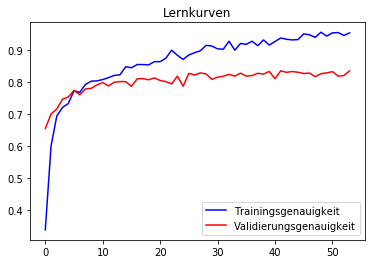

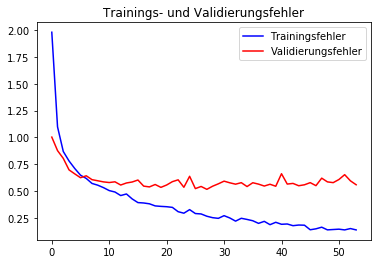

              precision    recall  f1-score   support

     T-shirt       0.81      0.78      0.80      1000
    Trousers       0.99      0.96      0.97      1000
    Pullover       0.70      0.80      0.75      1000
       Dress       0.87      0.82      0.85      1000
        Coat       0.76      0.74      0.75      1000
      Sandal       0.97      0.89      0.93      1000
       Shirt       0.55      0.56      0.55      1000
     Sneaker       0.86      0.96      0.91      1000
         Bag       0.93      0.94      0.94      1000
  Ankle-boot       0.95      0.91      0.93      1000

    accuracy                           0.84     10000
   macro avg       0.84      0.84      0.84     10000
weighted avg       0.84      0.84      0.84     10000



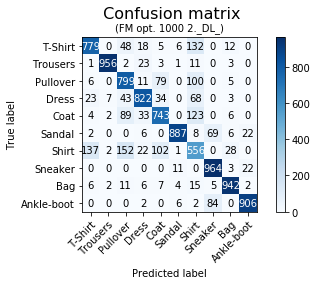

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/54
1000/1000 [==============================] - 20s 20ms/step - loss: 1.9654 - acc: 0.3470 - val_loss: 1.1220 - val_acc: 0.5947
Epoch 2/54
1000/1000 [==============================] - 1s 1ms/step - loss: 1.1058 - acc: 0.6060 - val_loss: 1.1166 - val_acc: 0.6445
Epoch 3/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.8863 - acc: 0.6870 - val_loss: 0.8854 - val_acc: 0.7181
Epoch 4/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.7634 - acc: 0.7290 - val_loss: 0.8447 - val_acc: 0.7228
Epoch 5/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.7344 - acc: 0.7450 - val_loss: 0.7170 - val_acc: 0.7427
Epoch 6/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.7126 - acc: 0.7400 - val_loss: 0.6378 - val_acc: 0.7638
Epoch 7/54
1000/1000 [===================

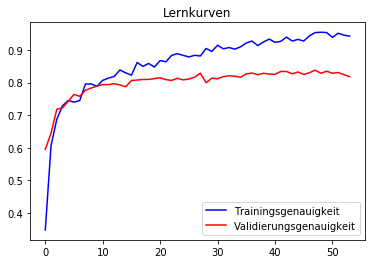

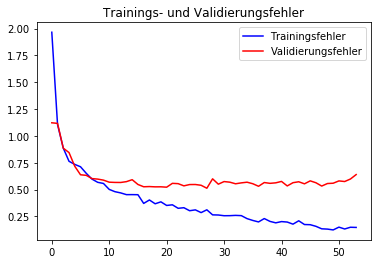

              precision    recall  f1-score   support

     T-shirt       0.88      0.63      0.74      1000
    Trousers       0.99      0.94      0.96      1000
    Pullover       0.80      0.58      0.67      1000
       Dress       0.75      0.91      0.82      1000
        Coat       0.65      0.77      0.71      1000
      Sandal       0.95      0.93      0.94      1000
       Shirt       0.51      0.63      0.56      1000
     Sneaker       0.90      0.94      0.92      1000
         Bag       0.96      0.92      0.94      1000
  Ankle-boot       0.93      0.93      0.93      1000

    accuracy                           0.82     10000
   macro avg       0.83      0.82      0.82     10000
weighted avg       0.83      0.82      0.82     10000



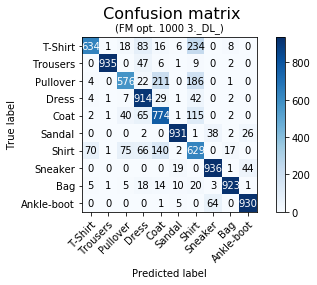

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/54
1000/1000 [==============================] - 20s 20ms/step - loss: 1.9744 - acc: 0.3540 - val_loss: 1.0172 - val_acc: 0.6651
Epoch 2/54
1000/1000 [==============================] - 1s 1ms/step - loss: 1.0976 - acc: 0.6200 - val_loss: 0.9171 - val_acc: 0.6954
Epoch 3/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.8928 - acc: 0.6850 - val_loss: 0.7242 - val_acc: 0.7381
Epoch 4/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.7990 - acc: 0.7220 - val_loss: 0.7089 - val_acc: 0.7504
Epoch 5/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.7287 - acc: 0.7280 - val_loss: 0.6865 - val_acc: 0.7535
Epoch 6/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.6765 - acc: 0.7640 - val_loss: 0.6423 - val_acc: 0.7696
Epoch 7/54
1000/1000 [===================

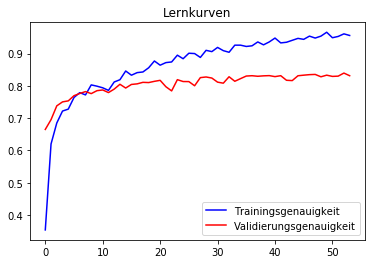

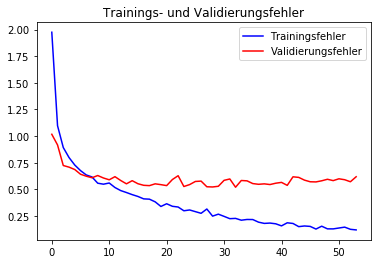

              precision    recall  f1-score   support

     T-shirt       0.85      0.73      0.79      1000
    Trousers       1.00      0.90      0.94      1000
    Pullover       0.79      0.70      0.74      1000
       Dress       0.76      0.90      0.82      1000
        Coat       0.73      0.78      0.75      1000
      Sandal       0.96      0.90      0.93      1000
       Shirt       0.56      0.59      0.57      1000
     Sneaker       0.92      0.91      0.92      1000
         Bag       0.91      0.95      0.93      1000
  Ankle-boot       0.89      0.96      0.93      1000

    accuracy                           0.83     10000
   macro avg       0.84      0.83      0.83     10000
weighted avg       0.84      0.83      0.83     10000



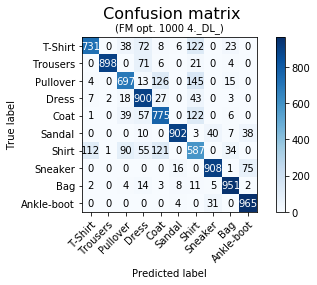

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/54
1000/1000 [==============================] - 20s 20ms/step - loss: 1.9485 - acc: 0.3680 - val_loss: 0.9815 - val_acc: 0.6671
Epoch 2/54
1000/1000 [==============================] - 1s 1ms/step - loss: 1.0678 - acc: 0.6060 - val_loss: 0.8929 - val_acc: 0.7021
Epoch 3/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.9076 - acc: 0.6890 - val_loss: 0.7490 - val_acc: 0.7356
Epoch 4/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.7575 - acc: 0.7240 - val_loss: 0.6855 - val_acc: 0.7483
Epoch 5/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.7208 - acc: 0.7470 - val_loss: 0.6416 - val_acc: 0.7668
Epoch 6/54
1000/1000 [==============================] - 1s 1ms/step - loss: 0.6558 - acc: 0.7510 - val_loss: 0.6346 - val_acc: 0.7695
Epoch 7/54
1000/1000 [===================

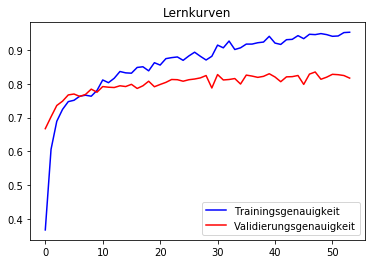

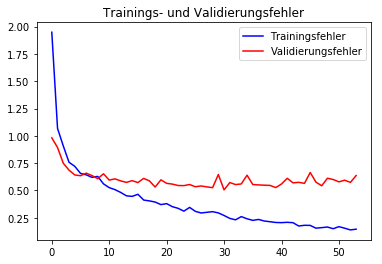

              precision    recall  f1-score   support

     T-shirt       0.84      0.70      0.76      1000
    Trousers       0.99      0.92      0.95      1000
    Pullover       0.77      0.67      0.72      1000
       Dress       0.75      0.90      0.81      1000
        Coat       0.73      0.71      0.72      1000
      Sandal       0.98      0.82      0.89      1000
       Shirt       0.51      0.60      0.55      1000
     Sneaker       0.86      0.93      0.89      1000
         Bag       0.92      0.96      0.94      1000
  Ankle-boot       0.90      0.96      0.93      1000

    accuracy                           0.82     10000
   macro avg       0.83      0.82      0.82     10000
weighted avg       0.83      0.82      0.82     10000



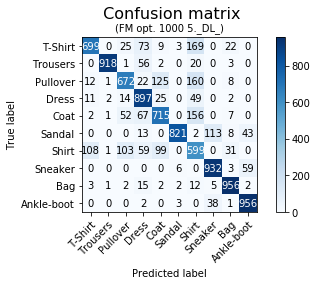

In [51]:
# Trainingsmenge 1000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainieren, mit durchschnittlichen bester Epochenanzahl aus EarlyStopping
fullDataRuns(1, 5, X_tr_1000, y_tr_1000, X_test, y_test, 0.4, 0.001, False, 54, 1000)

In [0]:
downloader_full(1000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
15/15 [==============================] - 21s 1s/step - loss: 2.3551 - acc: 0.2730 - val_loss: 1.2214 - val_acc: 0.6400
Epoch 2/300
15/15 [==============================] - 0s 24ms/step - loss: 1.6352 - acc: 0.4132 - val_loss: 0.9576 - val_acc: 0.7500
Epoch 3/300
15/15 [==============================] - 1s 34ms/step - loss: 1.3904 - acc: 0.5167 - val_loss: 0.8056 - val_acc: 0.7500
Epoch 4/300
15/15 [==============================] - 0s 31ms/step - loss: 1.3084 - acc: 0.5628 - val_loss: 0.7502 - val_acc: 0.7500
Epoch 5/300
15/15 [==============================] - 0s 29ms/step - loss: 1.2527 - acc: 0.5230 - val_loss: 0.7320 - val_acc: 0.7800
Epoch 6/300
15/15 [==============================] - 0s 31ms/step - loss: 1.0845 - acc: 0.6318 - val_loss: 0.6788 - val_acc: 0.7600
Epoch 7/300
15/15 [==============================] - 1s 35ms/step

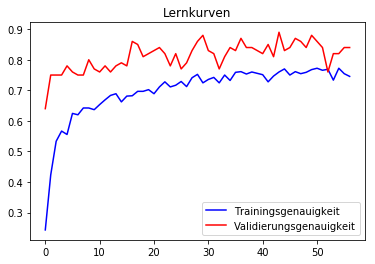

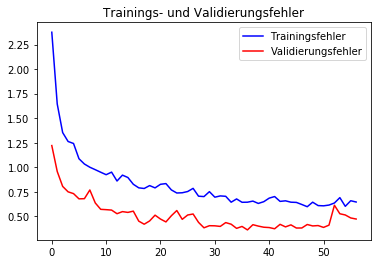

              precision    recall  f1-score   support

     T-shirt       0.68      0.82      0.74      1000
    Trousers       0.95      0.97      0.96      1000
    Pullover       0.68      0.50      0.58      1000
       Dress       0.82      0.82      0.82      1000
        Coat       0.56      0.76      0.65      1000
      Sandal       0.83      0.90      0.86      1000
       Shirt       0.51      0.32      0.40      1000
     Sneaker       0.87      0.87      0.87      1000
         Bag       0.96      0.88      0.92      1000
  Ankle-boot       0.90      0.95      0.92      1000

    accuracy                           0.78     10000
   macro avg       0.78      0.78      0.77     10000
weighted avg       0.78      0.78      0.77     10000



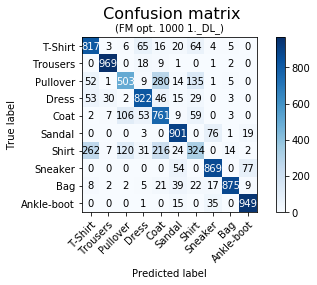

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
15/15 [==============================] - 21s 1s/step - loss: 2.3930 - acc: 0.2469 - val_loss: 1.2940 - val_acc: 0.5800
Epoch 2/300
15/15 [==============================] - 0s 21ms/step - loss: 1.7534 - acc: 0.4163 - val_loss: 1.3166 - val_acc: 0.5800
Epoch 3/300
15/15 [==============================] - 0s 28ms/step - loss: 1.3787 - acc: 0.4937 - val_loss: 1.1425 - val_acc: 0.6500
Epoch 4/300
15/15 [==============================] - 0s 28ms/step - loss: 1.2686 - acc: 0.5805 - val_loss: 1.1027 - val_acc: 0.6800
Epoch 5/300
15/15 [==============================] - 0s 28ms/step - loss: 1.1877 - acc: 0.5680 - val_loss: 1.2219 - val_acc: 0.6400
Epoch 6/300
15/15 [==============================] - 0s 27ms/step - loss: 1.0996 - acc: 0.5910 - val_loss: 1.1451 - val_acc: 0.6900
Epoch 7/300
15/15 [==============================] - 0s 29ms/step

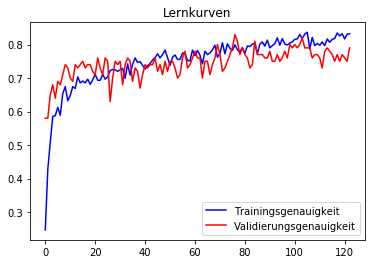

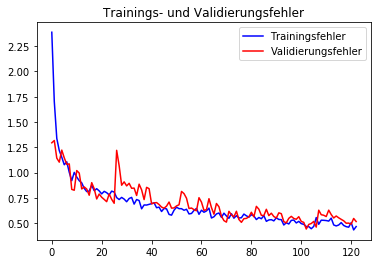

              precision    recall  f1-score   support

     T-shirt       0.73      0.82      0.77      1000
    Trousers       1.00      0.95      0.98      1000
    Pullover       0.72      0.61      0.66      1000
       Dress       0.82      0.86      0.84      1000
        Coat       0.67      0.77      0.72      1000
      Sandal       0.93      0.90      0.91      1000
       Shirt       0.52      0.45      0.48      1000
     Sneaker       0.88      0.92      0.90      1000
         Bag       0.96      0.94      0.95      1000
  Ankle-boot       0.92      0.95      0.94      1000

    accuracy                           0.82     10000
   macro avg       0.81      0.82      0.81     10000
weighted avg       0.81      0.82      0.81     10000



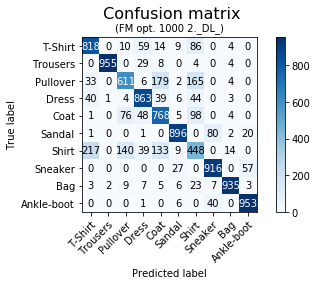

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
15/15 [==============================] - 20s 1s/step - loss: 2.2622 - acc: 0.2395 - val_loss: 1.4236 - val_acc: 0.5100
Epoch 2/300
15/15 [==============================] - 0s 19ms/step - loss: 1.5517 - acc: 0.4425 - val_loss: 1.8171 - val_acc: 0.5000
Epoch 3/300
15/15 [==============================] - 0s 29ms/step - loss: 1.4341 - acc: 0.4948 - val_loss: 1.3752 - val_acc: 0.5900
Epoch 4/300
15/15 [==============================] - 0s 26ms/step - loss: 1.2163 - acc: 0.5387 - val_loss: 0.9907 - val_acc: 0.6400
Epoch 5/300
15/15 [==============================] - 0s 28ms/step - loss: 1.1259 - acc: 0.6192 - val_loss: 0.9454 - val_acc: 0.6200
Epoch 6/300
15/15 [==============================] - 0s 26ms/step - loss: 1.1180 - acc: 0.5952 - val_loss: 1.0067 - val_acc: 0.6200
Epoch 7/300
15/15 [==============================] - 0s 25ms/step

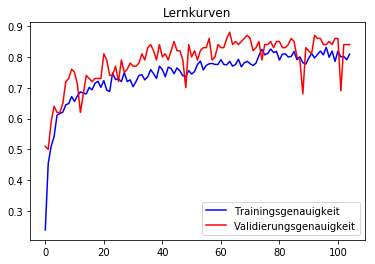

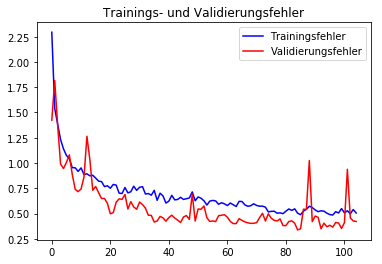

              precision    recall  f1-score   support

     T-shirt       0.76      0.77      0.77      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.76      0.58      0.66      1000
       Dress       0.81      0.89      0.84      1000
        Coat       0.67      0.77      0.72      1000
      Sandal       0.85      0.95      0.90      1000
       Shirt       0.51      0.51      0.51      1000
     Sneaker       0.88      0.91      0.89      1000
         Bag       0.97      0.91      0.94      1000
  Ankle-boot       0.97      0.90      0.93      1000

    accuracy                           0.81     10000
   macro avg       0.82      0.81      0.81     10000
weighted avg       0.82      0.81      0.81     10000



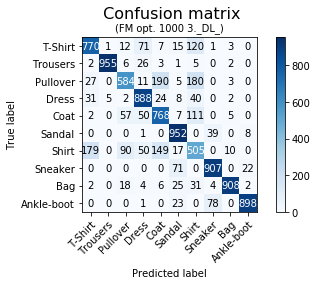

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
15/15 [==============================] - 22s 1s/step - loss: 2.2063 - acc: 0.2960 - val_loss: 1.1927 - val_acc: 0.6400
Epoch 2/300
15/15 [==============================] - 0s 23ms/step - loss: 1.5873 - acc: 0.4571 - val_loss: 1.0017 - val_acc: 0.6400
Epoch 3/300
15/15 [==============================] - 0s 31ms/step - loss: 1.3302 - acc: 0.5356 - val_loss: 0.8059 - val_acc: 0.7500
Epoch 4/300
15/15 [==============================] - 0s 31ms/step - loss: 1.2905 - acc: 0.5429 - val_loss: 1.0418 - val_acc: 0.7100
Epoch 5/300
15/15 [==============================] - 0s 31ms/step - loss: 1.1113 - acc: 0.6046 - val_loss: 0.9508 - val_acc: 0.7400
Epoch 6/300
15/15 [==============================] - 0s 31ms/step - loss: 1.2475 - acc: 0.5523 - val_loss: 0.8246 - val_acc: 0.7400
Epoch 7/300
15/15 [==============================] - 0s 31ms/step

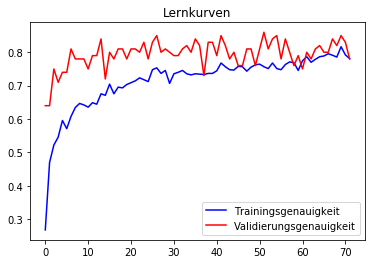

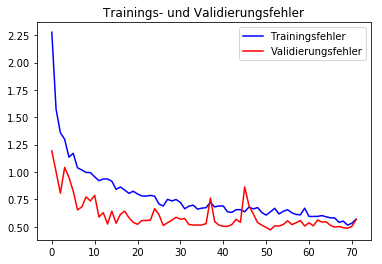

              precision    recall  f1-score   support

     T-shirt       0.81      0.70      0.75      1000
    Trousers       0.99      0.94      0.96      1000
    Pullover       0.59      0.57      0.58      1000
       Dress       0.78      0.86      0.82      1000
        Coat       0.65      0.55      0.59      1000
      Sandal       0.82      0.94      0.88      1000
       Shirt       0.42      0.49      0.45      1000
     Sneaker       0.91      0.85      0.88      1000
         Bag       0.90      0.93      0.91      1000
  Ankle-boot       0.95      0.93      0.94      1000

    accuracy                           0.78     10000
   macro avg       0.78      0.78      0.78     10000
weighted avg       0.78      0.78      0.78     10000



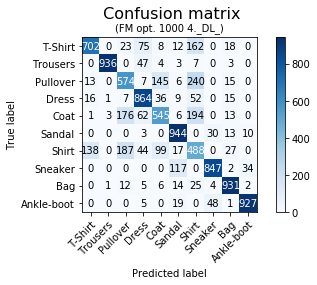

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
15/15 [==============================] - 22s 1s/step - loss: 2.1375 - acc: 0.2898 - val_loss: 1.3581 - val_acc: 0.6100
Epoch 2/300
15/15 [==============================] - 0s 23ms/step - loss: 1.5107 - acc: 0.4623 - val_loss: 1.1925 - val_acc: 0.6500
Epoch 3/300
15/15 [==============================] - 0s 33ms/step - loss: 1.2622 - acc: 0.5701 - val_loss: 1.2162 - val_acc: 0.6900
Epoch 4/300
15/15 [==============================] - 0s 31ms/step - loss: 1.2410 - acc: 0.5690 - val_loss: 1.1084 - val_acc: 0.6900
Epoch 5/300
15/15 [==============================] - 0s 32ms/step - loss: 1.1683 - acc: 0.6015 - val_loss: 1.0282 - val_acc: 0.6600
Epoch 6/300
15/15 [==============================] - 0s 33ms/step - loss: 1.0300 - acc: 0.6119 - val_loss: 0.9590 - val_acc: 0.6700
Epoch 7/300
15/15 [==============================] - 0s 31ms/step

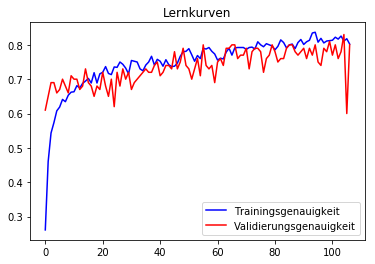

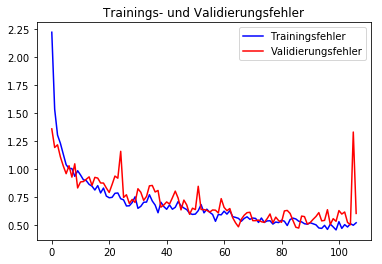

              precision    recall  f1-score   support

     T-shirt       0.68      0.83      0.75      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.58      0.75      0.66      1000
       Dress       0.85      0.83      0.84      1000
        Coat       0.73      0.55      0.62      1000
      Sandal       0.97      0.82      0.89      1000
       Shirt       0.49      0.39      0.43      1000
     Sneaker       0.84      0.90      0.87      1000
         Bag       0.96      0.94      0.95      1000
  Ankle-boot       0.89      0.96      0.92      1000

    accuracy                           0.79     10000
   macro avg       0.80      0.79      0.79     10000
weighted avg       0.80      0.79      0.79     10000



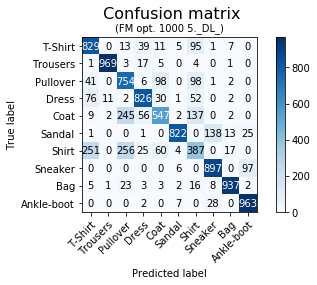

Die durchschnittliche Epochenanzahl beträgt:  72.8


In [0]:
# Trainingsmenge 1000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.0001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1, 5, X_tr_1000, y_tr_1000, 0.4, 0.001, False, 300, 1000)

In [0]:
downloader(1000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 










Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 8s 5ms/step - loss: 2.7316 - acc: 0.1378 - val_loss: 1.8322 - val_acc: 0.3550
Epoch 2/300
1800/1800 [==============================] - 0s 180us/step - loss: 2.1178 - acc: 0.2900 - val_loss: 1.4539 - val_acc: 0.4900
Epoch 3/300
1800/1800 [==============================] - 0s 190us/step - loss: 1.7855 - acc: 0.3822 - val_loss: 1.2070 - val_acc: 0.6300
Epoch 4/300
1800/1800 [==============================] - 0s 168us/step - loss: 1.5200 - acc: 0.4800 - val_loss: 1.0397 - val_acc: 0.6800
Epoch 5/300
1800/1800 [==============================] - 0s 17

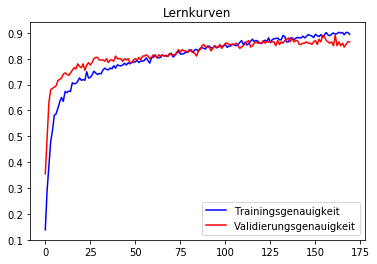

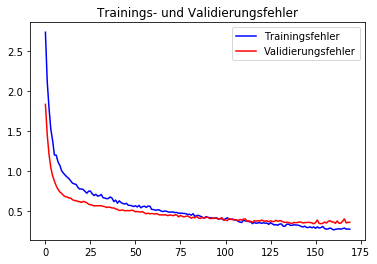

              precision    recall  f1-score   support

     T-shirt       0.82      0.74      0.77      1000
    Trousers       0.99      0.96      0.98      1000
    Pullover       0.81      0.77      0.79      1000
       Dress       0.87      0.88      0.88      1000
        Coat       0.75      0.81      0.78      1000
      Sandal       0.97      0.92      0.94      1000
       Shirt       0.57      0.64      0.60      1000
     Sneaker       0.89      0.95      0.92      1000
         Bag       0.96      0.95      0.95      1000
  Ankle-boot       0.94      0.94      0.94      1000

    accuracy                           0.85     10000
   macro avg       0.86      0.85      0.86     10000
weighted avg       0.86      0.85      0.86     10000



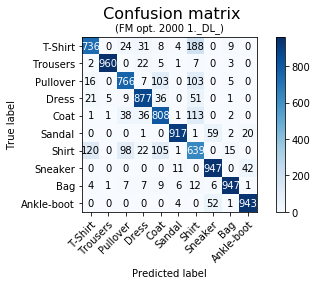

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 2s 905us/step - loss: 2.7685 - acc: 0.1483 - val_loss: 1.7433 - val_acc: 0.4050
Epoch 2/300
1800/1800 [==============================] - 0s 191us/step - loss: 2.0960 - acc: 0.2983 - val_loss: 1.3210 - val_acc: 0.5650
Epoch 3/300
1800/1800 [==============================] - 0s 180us/step - loss: 1.6320 - acc: 0.4172 - val_loss: 1.0959 - val_acc: 0.6550
Epoch 4/300
1800/1800 [==============================] - 0s 206us/step - loss: 1.4335 - acc: 0.4922 - val_loss: 0.9691 - val_acc: 0.7050
Epoch 5/300
1800/1800 [==============================] - 0s 240us/step - loss: 1.2842 - acc: 0.5589 - val_loss: 0.8952 - val_acc: 0.7100
Epoch 6/300
1800/1800 [==============================] - 0s 177us/step - loss: 1.1957 - acc: 0.5800 - val_loss: 0.8310 - val_acc: 0.7250
Epoch 7/3

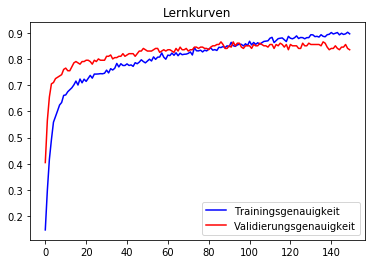

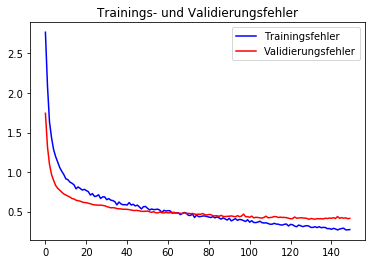

              precision    recall  f1-score   support

     T-shirt       0.83      0.78      0.80      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.76      0.80      0.78      1000
       Dress       0.85      0.88      0.87      1000
        Coat       0.79      0.73      0.76      1000
      Sandal       0.97      0.92      0.95      1000
       Shirt       0.59      0.63      0.61      1000
     Sneaker       0.89      0.95      0.92      1000
         Bag       0.96      0.96      0.96      1000
  Ankle-boot       0.95      0.94      0.94      1000

    accuracy                           0.86     10000
   macro avg       0.86      0.86      0.86     10000
weighted avg       0.86      0.86      0.86     10000



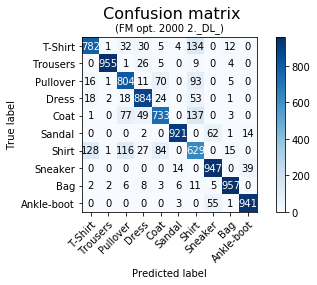

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 2s 1ms/step - loss: 2.7619 - acc: 0.1572 - val_loss: 1.8416 - val_acc: 0.4150
Epoch 2/300
1800/1800 [==============================] - 0s 271us/step - loss: 2.0917 - acc: 0.2861 - val_loss: 1.4374 - val_acc: 0.5450
Epoch 3/300
1800/1800 [==============================] - 0s 224us/step - loss: 1.7994 - acc: 0.3811 - val_loss: 1.1858 - val_acc: 0.6300
Epoch 4/300
1800/1800 [==============================] - 0s 193us/step - loss: 1.5065 - acc: 0.4617 - val_loss: 1.0460 - val_acc: 0.6500
Epoch 5/300
1800/1800 [==============================] - 0s 226us/step - loss: 1.3353 - acc: 0.5400 - val_loss: 0.9624 - val_acc: 0.6550
Epoch 6/300
1800/1800 [==============================] - 0s 195us/step - loss: 1.2210 - acc: 0.5700 - val_loss: 0.9036 - val_acc: 0.6800
Epoch 7/300

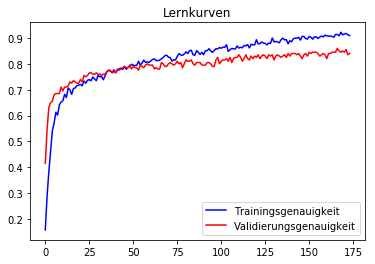

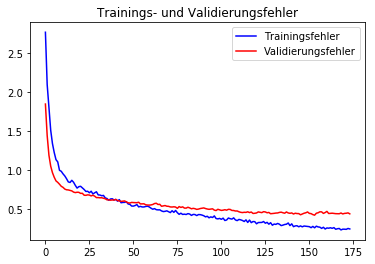

              precision    recall  f1-score   support

     T-shirt       0.80      0.76      0.78      1000
    Trousers       1.00      0.96      0.98      1000
    Pullover       0.80      0.79      0.79      1000
       Dress       0.87      0.87      0.87      1000
        Coat       0.80      0.77      0.78      1000
      Sandal       0.97      0.92      0.94      1000
       Shirt       0.59      0.65      0.62      1000
     Sneaker       0.90      0.95      0.92      1000
         Bag       0.96      0.96      0.96      1000
  Ankle-boot       0.94      0.95      0.94      1000

    accuracy                           0.86     10000
   macro avg       0.86      0.86      0.86     10000
weighted avg       0.86      0.86      0.86     10000



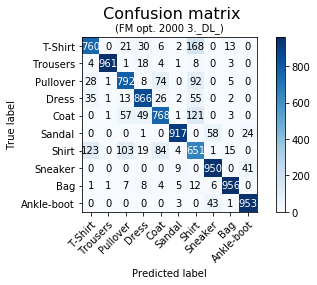

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 2s 1ms/step - loss: 2.6684 - acc: 0.1650 - val_loss: 1.7245 - val_acc: 0.4950
Epoch 2/300
1800/1800 [==============================] - 0s 229us/step - loss: 2.0137 - acc: 0.3133 - val_loss: 1.3628 - val_acc: 0.5950
Epoch 3/300
1800/1800 [==============================] - 0s 232us/step - loss: 1.7053 - acc: 0.4172 - val_loss: 1.1451 - val_acc: 0.6350
Epoch 4/300
1800/1800 [==============================] - 0s 194us/step - loss: 1.4321 - acc: 0.4994 - val_loss: 1.0263 - val_acc: 0.6650
Epoch 5/300
1800/1800 [==============================] - 0s 209us/step - loss: 1.3132 - acc: 0.5517 - val_loss: 0.9396 - val_acc: 0.6750
Epoch 6/300
1800/1800 [==============================] - 0s 199us/step - loss: 1.2021 - acc: 0.5789 - val_loss: 0.8833 - val_acc: 0.6900
Epoch 7/300

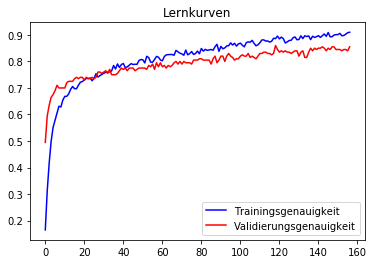

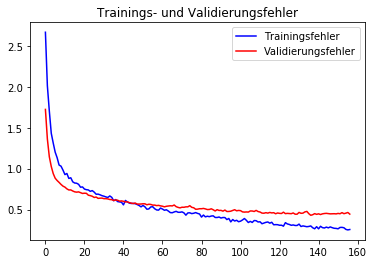

              precision    recall  f1-score   support

     T-shirt       0.83      0.73      0.77      1000
    Trousers       0.99      0.96      0.97      1000
    Pullover       0.80      0.75      0.77      1000
       Dress       0.87      0.87      0.87      1000
        Coat       0.75      0.76      0.75      1000
      Sandal       0.97      0.90      0.93      1000
       Shirt       0.54      0.66      0.60      1000
     Sneaker       0.88      0.95      0.91      1000
         Bag       0.97      0.95      0.96      1000
  Ankle-boot       0.95      0.94      0.94      1000

    accuracy                           0.85     10000
   macro avg       0.85      0.85      0.85     10000
weighted avg       0.85      0.85      0.85     10000



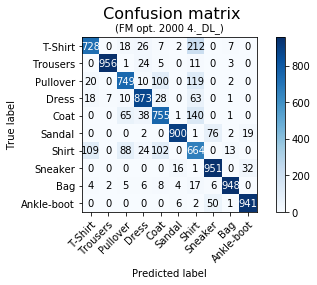

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 3s 2ms/step - loss: 2.7276 - acc: 0.1406 - val_loss: 1.8168 - val_acc: 0.4000
Epoch 2/300
1800/1800 [==============================] - 0s 231us/step - loss: 2.2229 - acc: 0.2544 - val_loss: 1.4000 - val_acc: 0.6300
Epoch 3/300
1800/1800 [==============================] - 0s 214us/step - loss: 1.8515 - acc: 0.3728 - val_loss: 1.1411 - val_acc: 0.6800
Epoch 4/300
1800/1800 [==============================] - 0s 197us/step - loss: 1.5499 - acc: 0.4567 - val_loss: 0.9671 - val_acc: 0.7100
Epoch 5/300
1800/1800 [==============================] - 0s 199us/step - loss: 1.4263 - acc: 0.5017 - val_loss: 0.8617 - val_acc: 0.7200
Epoch 6/300
1800/1800 [==============================] - 0s 188us/step - loss: 1.2841 - acc: 0.5533 - val_loss: 0.7861 - val_acc: 0.7400
Epoch 7/300

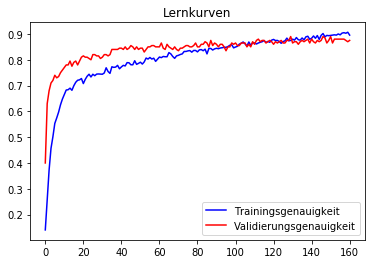

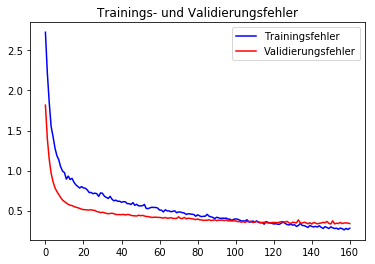

              precision    recall  f1-score   support

     T-shirt       0.79      0.79      0.79      1000
    Trousers       0.98      0.97      0.97      1000
    Pullover       0.68      0.84      0.75      1000
       Dress       0.87      0.86      0.87      1000
        Coat       0.79      0.65      0.71      1000
      Sandal       0.98      0.89      0.93      1000
       Shirt       0.60      0.57      0.58      1000
     Sneaker       0.87      0.95      0.91      1000
         Bag       0.96      0.95      0.96      1000
  Ankle-boot       0.93      0.94      0.94      1000

    accuracy                           0.84     10000
   macro avg       0.85      0.84      0.84     10000
weighted avg       0.85      0.84      0.84     10000



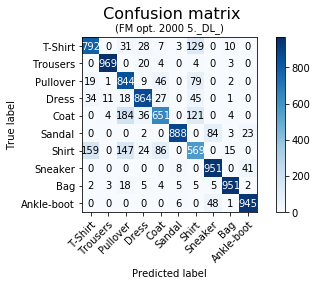

Die durchschnittliche Epochenanzahl beträgt:  142.4


In [0]:
# Trainingsmenge 2000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.0001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1, 5, X_tr_2000, y_tr_2000, 0.4, 0.0001, False, 300, 2000)

In [0]:
downloader(2000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/143
2000/2000 [==============================] - 20s 10ms/step - loss: 2.7067 - acc: 0.1660 - val_loss: 1.7899 - val_acc: 0.4625
Epoch 2/143
2000/2000 [==============================] - 1s 697us/step - loss: 2.0457 - acc: 0.2835 - val_loss: 1.3438 - val_acc: 0.6392
Epoch 3/143
2000/2000 [==============================] - 1s 717us/step - loss: 1.6187 - acc: 0.4285 - val_loss: 1.0813 - val_acc: 0.6777
Epoch 4/143
2000/2000 [==============================] - 1s 704us/step - loss: 1.3928 - acc: 0.5185 - val_loss: 0.9329 - val_acc: 0.6972
Epoch 5/143
2000/2000 [==============================] - 2s 819us/step - loss: 1.2243 - acc: 0.5545 - val_loss: 0.8557 - val_acc: 0.7079
Epoch 6/143
2000/2000 [==============================] - 1s 686us/step - loss: 1.1095 - acc: 0.6135 - val_loss: 0.8136 - val_acc: 0.7128
Epoch 7/143
2000/2000 [==

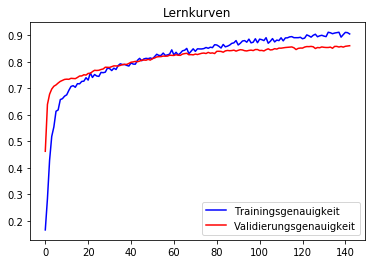

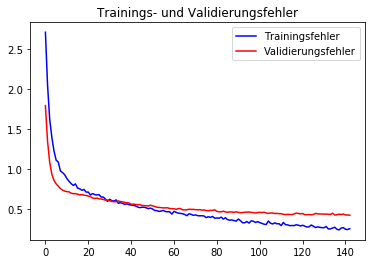

              precision    recall  f1-score   support

     T-shirt       0.83      0.80      0.81      1000
    Trousers       0.99      0.96      0.97      1000
    Pullover       0.82      0.80      0.81      1000
       Dress       0.88      0.86      0.87      1000
        Coat       0.77      0.84      0.80      1000
      Sandal       0.99      0.84      0.91      1000
       Shirt       0.61      0.64      0.63      1000
     Sneaker       0.86      0.97      0.91      1000
         Bag       0.97      0.95      0.96      1000
  Ankle-boot       0.94      0.95      0.94      1000

    accuracy                           0.86     10000
   macro avg       0.86      0.86      0.86     10000
weighted avg       0.86      0.86      0.86     10000



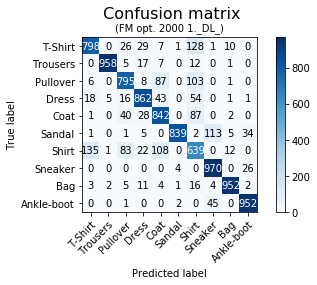

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/143
2000/2000 [==============================] - 21s 10ms/step - loss: 2.5981 - acc: 0.1735 - val_loss: 1.7128 - val_acc: 0.4571
Epoch 2/143
2000/2000 [==============================] - 1s 707us/step - loss: 1.8932 - acc: 0.3520 - val_loss: 1.2910 - val_acc: 0.5735
Epoch 3/143
2000/2000 [==============================] - 1s 705us/step - loss: 1.4875 - acc: 0.4740 - val_loss: 1.0553 - val_acc: 0.6314
Epoch 4/143
2000/2000 [==============================] - 1s 692us/step - loss: 1.2984 - acc: 0.5480 - val_loss: 0.9303 - val_acc: 0.6609
Epoch 5/143
2000/2000 [==============================] - 1s 717us/step - loss: 1.1404 - acc: 0.5890 - val_loss: 0.8669 - val_acc: 0.6731
Epoch 6/143
2000/2000 [==============================] - 1s 714us/step - loss: 1.0524 - acc: 0.6260 - val_loss: 0.8337 - val_acc: 0.6834
Epoch 7/143
2000/2000 [==

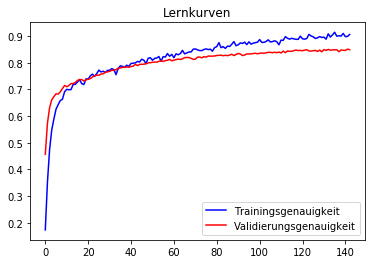

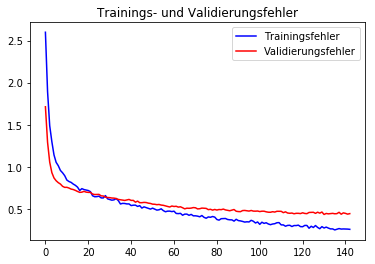

              precision    recall  f1-score   support

     T-shirt       0.84      0.77      0.80      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.81      0.74      0.78      1000
       Dress       0.88      0.84      0.86      1000
        Coat       0.71      0.84      0.77      1000
      Sandal       0.99      0.85      0.91      1000
       Shirt       0.57      0.65      0.61      1000
     Sneaker       0.86      0.96      0.91      1000
         Bag       0.97      0.94      0.95      1000
  Ankle-boot       0.94      0.95      0.95      1000

    accuracy                           0.85     10000
   macro avg       0.86      0.85      0.85     10000
weighted avg       0.86      0.85      0.85     10000



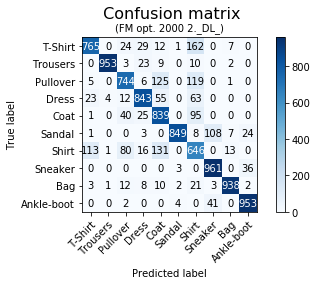

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/143
2000/2000 [==============================] - 21s 11ms/step - loss: 2.5332 - acc: 0.1860 - val_loss: 1.6752 - val_acc: 0.5094
Epoch 2/143
2000/2000 [==============================] - 1s 742us/step - loss: 1.8835 - acc: 0.3590 - val_loss: 1.2712 - val_acc: 0.6303
Epoch 3/143
2000/2000 [==============================] - 1s 702us/step - loss: 1.5545 - acc: 0.4590 - val_loss: 1.0534 - val_acc: 0.6702
Epoch 4/143
2000/2000 [==============================] - 1s 743us/step - loss: 1.3348 - acc: 0.5350 - val_loss: 0.9363 - val_acc: 0.6881
Epoch 5/143
2000/2000 [==============================] - 1s 723us/step - loss: 1.1584 - acc: 0.5870 - val_loss: 0.8675 - val_acc: 0.6997
Epoch 6/143
2000/2000 [==============================] - 1s 728us/step - loss: 1.0920 - acc: 0.6210 - val_loss: 0.8203 - val_acc: 0.7094
Epoch 7/143
2000/2000 [==

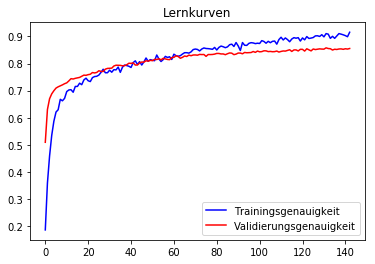

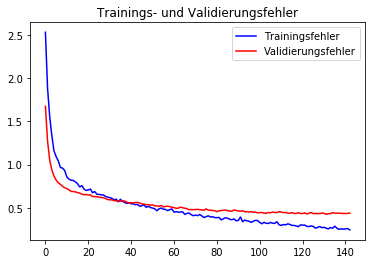

              precision    recall  f1-score   support

     T-shirt       0.82      0.81      0.82      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.84      0.75      0.79      1000
       Dress       0.87      0.87      0.87      1000
        Coat       0.75      0.83      0.78      1000
      Sandal       0.99      0.85      0.91      1000
       Shirt       0.59      0.62      0.60      1000
     Sneaker       0.86      0.96      0.91      1000
         Bag       0.96      0.95      0.96      1000
  Ankle-boot       0.93      0.95      0.94      1000

    accuracy                           0.86     10000
   macro avg       0.86      0.86      0.86     10000
weighted avg       0.86      0.86      0.86     10000



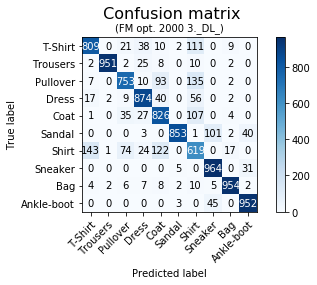

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/143
2000/2000 [==============================] - 21s 11ms/step - loss: 2.6816 - acc: 0.1530 - val_loss: 1.7458 - val_acc: 0.4765
Epoch 2/143
2000/2000 [==============================] - 2s 770us/step - loss: 1.9789 - acc: 0.3170 - val_loss: 1.3377 - val_acc: 0.6227
Epoch 3/143
2000/2000 [==============================] - 2s 755us/step - loss: 1.6414 - acc: 0.4335 - val_loss: 1.1133 - val_acc: 0.6679
Epoch 4/143
2000/2000 [==============================] - 1s 737us/step - loss: 1.3683 - acc: 0.5130 - val_loss: 0.9797 - val_acc: 0.6906
Epoch 5/143
2000/2000 [==============================] - 1s 726us/step - loss: 1.2098 - acc: 0.5700 - val_loss: 0.8999 - val_acc: 0.7021
Epoch 6/143
2000/2000 [==============================] - 1s 705us/step - loss: 1.1450 - acc: 0.6060 - val_loss: 0.8501 - val_acc: 0.7088
Epoch 7/143
2000/2000 [==

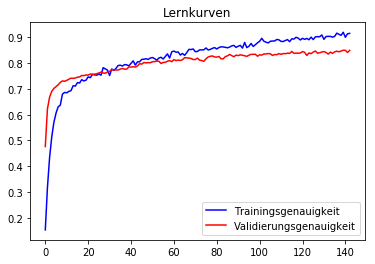

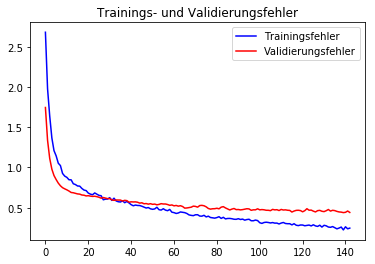

              precision    recall  f1-score   support

     T-shirt       0.82      0.81      0.82      1000
    Trousers       0.99      0.94      0.97      1000
    Pullover       0.81      0.79      0.80      1000
       Dress       0.86      0.88      0.87      1000
        Coat       0.84      0.68      0.75      1000
      Sandal       0.99      0.84      0.90      1000
       Shirt       0.54      0.67      0.60      1000
     Sneaker       0.85      0.97      0.91      1000
         Bag       0.95      0.97      0.96      1000
  Ankle-boot       0.94      0.95      0.94      1000

    accuracy                           0.85     10000
   macro avg       0.86      0.85      0.85     10000
weighted avg       0.86      0.85      0.85     10000



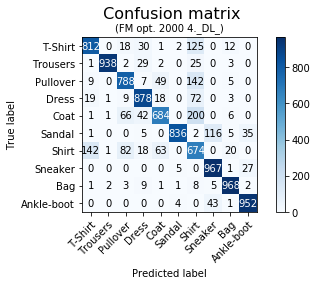

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/143
2000/2000 [==============================] - 23s 12ms/step - loss: 2.6239 - acc: 0.1835 - val_loss: 1.7534 - val_acc: 0.4791
Epoch 2/143
2000/2000 [==============================] - 2s 854us/step - loss: 2.0416 - acc: 0.3190 - val_loss: 1.3987 - val_acc: 0.5595
Epoch 3/143
2000/2000 [==============================] - 2s 877us/step - loss: 1.6671 - acc: 0.4195 - val_loss: 1.1879 - val_acc: 0.6033
Epoch 4/143
2000/2000 [==============================] - 2s 897us/step - loss: 1.4190 - acc: 0.5200 - val_loss: 1.0465 - val_acc: 0.6419
Epoch 5/143
2000/2000 [==============================] - 2s 856us/step - loss: 1.2659 - acc: 0.5570 - val_loss: 0.9542 - val_acc: 0.6635
Epoch 6/143
2000/2000 [==============================] - 2s 838us/step - loss: 1.1542 - acc: 0.6025 - val_loss: 0.8883 - val_acc: 0.6813
Epoch 7/143
2000/2000 [==

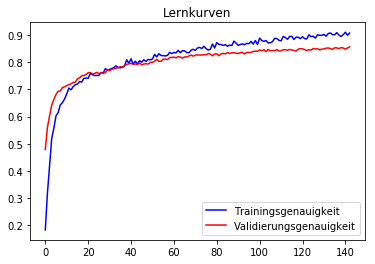

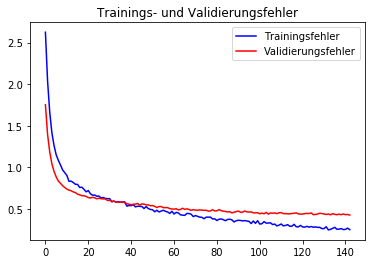

              precision    recall  f1-score   support

     T-shirt       0.83      0.80      0.82      1000
    Trousers       0.99      0.94      0.97      1000
    Pullover       0.85      0.74      0.79      1000
       Dress       0.84      0.89      0.86      1000
        Coat       0.80      0.78      0.79      1000
      Sandal       0.99      0.86      0.92      1000
       Shirt       0.57      0.66      0.61      1000
     Sneaker       0.87      0.96      0.92      1000
         Bag       0.94      0.96      0.95      1000
  Ankle-boot       0.94      0.96      0.95      1000

    accuracy                           0.86     10000
   macro avg       0.86      0.86      0.86     10000
weighted avg       0.86      0.86      0.86     10000



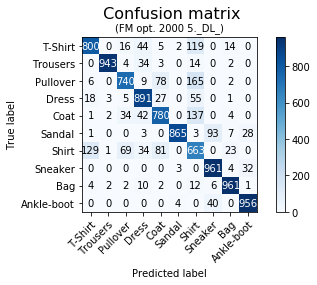

In [54]:
# Trainingsmenge 2000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.0001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainieren, mit durchschnittlichen bester Epochenanzahl aus EarlyStopping
fullDataRuns(1, 5, X_tr_2000, y_tr_2000, X_test, y_test, 0.4, 0.0001, False, 143, 2000)

In [0]:
downloader_full(2000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
29/29 [==============================] - 3s 104ms/step - loss: 2.9537 - acc: 0.1133 - val_loss: 1.8927 - val_acc: 0.3550
Epoch 2/300
29/29 [==============================] - 0s 16ms/step - loss: 2.4540 - acc: 0.2137 - val_loss: 1.5716 - val_acc: 0.5200
Epoch 3/300
29/29 [==============================] - 1s 20ms/step - loss: 2.1552 - acc: 0.2636 - val_loss: 1.3376 - val_acc: 0.6000
Epoch 4/300
29/29 [==============================] - 1s 20ms/step - loss: 2.0385 - acc: 0.3030 - val_loss: 1.1752 - val_acc: 0.6600
Epoch 5/300
29/29 [==============================] - 1s 20ms/step - loss: 1.7988 - acc: 0.3751 - val_loss: 1.0709 - val_acc: 0.6750
Epoch 6/300
29/29 [==============================] - 1s 20ms/step - loss: 1.6751 - acc: 0.4281 - val_loss: 0.9904 - val_acc: 0.6950
Epoch 7/300
29/29 [==============================] - 1s 20ms/st

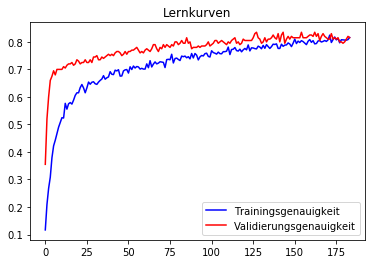

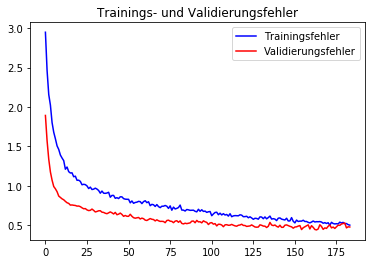

              precision    recall  f1-score   support

     T-shirt       0.72      0.82      0.77      1000
    Trousers       0.98      0.96      0.97      1000
    Pullover       0.81      0.64      0.71      1000
       Dress       0.86      0.83      0.85      1000
        Coat       0.72      0.72      0.72      1000
      Sandal       0.94      0.89      0.92      1000
       Shirt       0.50      0.55      0.52      1000
     Sneaker       0.83      0.96      0.90      1000
         Bag       0.94      0.95      0.95      1000
  Ankle-boot       0.97      0.90      0.94      1000

    accuracy                           0.82     10000
   macro avg       0.83      0.82      0.82     10000
weighted avg       0.83      0.82      0.82     10000



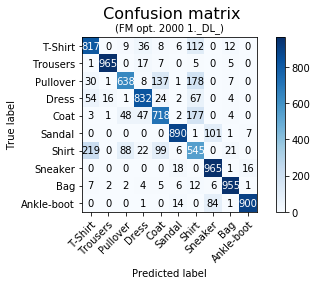

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
29/29 [==============================] - 3s 111ms/step - loss: 2.8181 - acc: 0.1401 - val_loss: 1.8144 - val_acc: 0.3600
Epoch 2/300
29/29 [==============================] - 0s 16ms/step - loss: 2.3221 - acc: 0.2268 - val_loss: 1.4901 - val_acc: 0.5400
Epoch 3/300
29/29 [==============================] - 1s 21ms/step - loss: 2.0302 - acc: 0.3029 - val_loss: 1.3012 - val_acc: 0.5850
Epoch 4/300
29/29 [==============================] - 1s 20ms/step - loss: 1.8056 - acc: 0.3794 - val_loss: 1.1666 - val_acc: 0.6350
Epoch 5/300
29/29 [==============================] - 1s 27ms/step - loss: 1.5866 - acc: 0.4573 - val_loss: 1.0962 - val_acc: 0.6550
Epoch 6/300
29/29 [==============================] - 1s 21ms/step - loss: 1.5403 - acc: 0.4415 - val_loss: 1.0365 - val_acc: 0.6900
Epoch 7/300
29/29 [==============================] - 1s 20ms/st

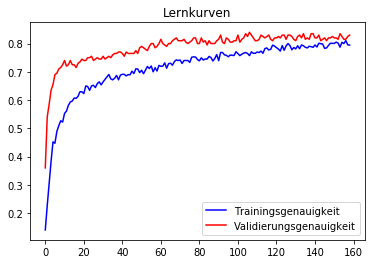

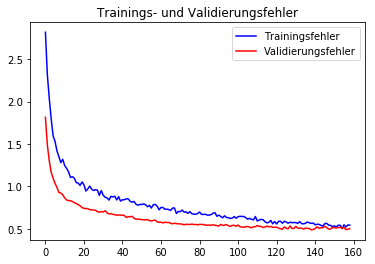

              precision    recall  f1-score   support

     T-shirt       0.78      0.76      0.77      1000
    Trousers       0.98      0.96      0.97      1000
    Pullover       0.76      0.61      0.68      1000
       Dress       0.87      0.84      0.85      1000
        Coat       0.68      0.74      0.71      1000
      Sandal       0.96      0.85      0.91      1000
       Shirt       0.47      0.55      0.51      1000
     Sneaker       0.85      0.95      0.90      1000
         Bag       0.94      0.95      0.95      1000
  Ankle-boot       0.95      0.94      0.95      1000

    accuracy                           0.82     10000
   macro avg       0.82      0.82      0.82     10000
weighted avg       0.82      0.82      0.82     10000



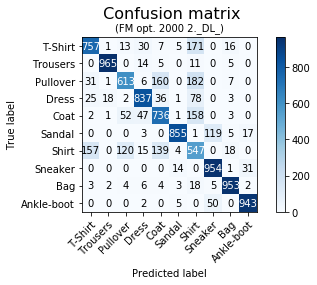

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
29/29 [==============================] - 4s 126ms/step - loss: 2.8049 - acc: 0.1309 - val_loss: 1.9806 - val_acc: 0.2850
Epoch 2/300
29/29 [==============================] - 0s 16ms/step - loss: 2.4109 - acc: 0.2051 - val_loss: 1.6568 - val_acc: 0.4100
Epoch 3/300
29/29 [==============================] - 1s 20ms/step - loss: 2.1964 - acc: 0.2563 - val_loss: 1.4555 - val_acc: 0.4700
Epoch 4/300
29/29 [==============================] - 1s 20ms/step - loss: 1.9451 - acc: 0.3201 - val_loss: 1.3020 - val_acc: 0.5750
Epoch 5/300
29/29 [==============================] - 1s 19ms/step - loss: 1.7671 - acc: 0.3804 - val_loss: 1.2134 - val_acc: 0.6100
Epoch 6/300
29/29 [==============================] - 1s 21ms/step - loss: 1.6368 - acc: 0.4155 - val_loss: 1.1269 - val_acc: 0.6400
Epoch 7/300
29/29 [==============================] - 1s 22ms/st

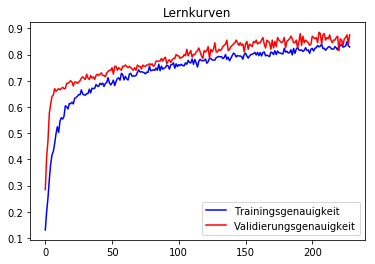

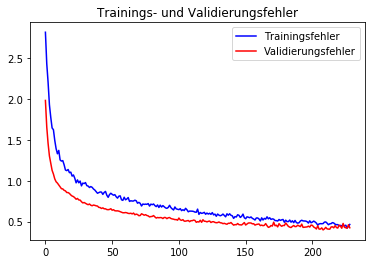

              precision    recall  f1-score   support

     T-shirt       0.77      0.77      0.77      1000
    Trousers       0.99      0.96      0.98      1000
    Pullover       0.85      0.64      0.73      1000
       Dress       0.85      0.88      0.87      1000
        Coat       0.72      0.77      0.75      1000
      Sandal       0.94      0.91      0.92      1000
       Shirt       0.53      0.63      0.57      1000
     Sneaker       0.86      0.96      0.90      1000
         Bag       0.96      0.95      0.96      1000
  Ankle-boot       0.97      0.90      0.93      1000

    accuracy                           0.84     10000
   macro avg       0.84      0.84      0.84     10000
weighted avg       0.84      0.84      0.84     10000



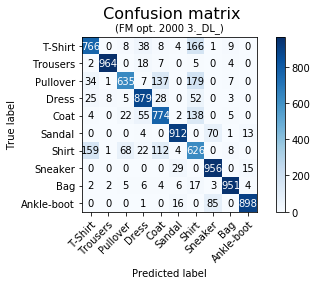

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
29/29 [==============================] - 4s 136ms/step - loss: 2.8765 - acc: 0.1304 - val_loss: 1.9529 - val_acc: 0.3150
Epoch 2/300
29/29 [==============================] - 1s 18ms/step - loss: 2.3359 - acc: 0.2129 - val_loss: 1.5647 - val_acc: 0.4650
Epoch 3/300
29/29 [==============================] - 1s 21ms/step - loss: 2.0393 - acc: 0.2797 - val_loss: 1.2985 - val_acc: 0.5500
Epoch 4/300
29/29 [==============================] - 1s 25ms/step - loss: 1.8109 - acc: 0.3616 - val_loss: 1.1529 - val_acc: 0.6100
Epoch 5/300
29/29 [==============================] - 1s 23ms/step - loss: 1.6430 - acc: 0.4003 - val_loss: 1.0567 - val_acc: 0.6400
Epoch 6/300
29/29 [==============================] - 1s 21ms/step - loss: 1.4776 - acc: 0.4736 - val_loss: 0.9777 - val_acc: 0.6450
Epoch 7/300
29/29 [==============================] - 1s 20ms/st

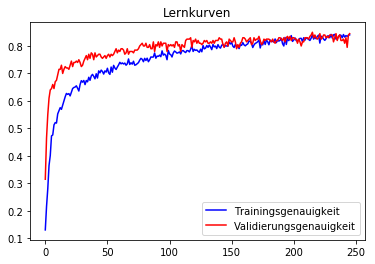

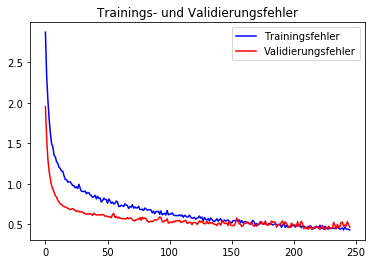

              precision    recall  f1-score   support

     T-shirt       0.77      0.79      0.78      1000
    Trousers       0.99      0.96      0.98      1000
    Pullover       0.82      0.66      0.73      1000
       Dress       0.87      0.86      0.87      1000
        Coat       0.74      0.72      0.73      1000
      Sandal       0.97      0.86      0.91      1000
       Shirt       0.50      0.62      0.55      1000
     Sneaker       0.83      0.97      0.90      1000
         Bag       0.97      0.95      0.96      1000
  Ankle-boot       0.97      0.91      0.94      1000

    accuracy                           0.83     10000
   macro avg       0.84      0.83      0.83     10000
weighted avg       0.84      0.83      0.83     10000



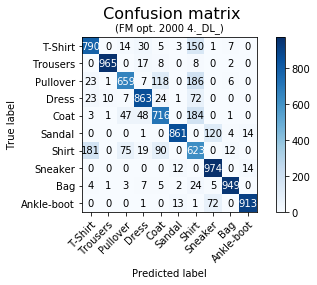

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
29/29 [==============================] - 4s 142ms/step - loss: 2.7998 - acc: 0.1427 - val_loss: 2.0479 - val_acc: 0.2700
Epoch 2/300
29/29 [==============================] - 0s 17ms/step - loss: 2.5122 - acc: 0.1903 - val_loss: 1.6789 - val_acc: 0.4800
Epoch 3/300
29/29 [==============================] - 1s 20ms/step - loss: 2.2395 - acc: 0.2539 - val_loss: 1.4104 - val_acc: 0.5450
Epoch 4/300
29/29 [==============================] - 1s 20ms/step - loss: 1.9768 - acc: 0.3279 - val_loss: 1.2464 - val_acc: 0.5750
Epoch 5/300
29/29 [==============================] - 1s 20ms/step - loss: 1.8549 - acc: 0.3750 - val_loss: 1.1363 - val_acc: 0.6200
Epoch 6/300
29/29 [==============================] - 1s 21ms/step - loss: 1.6637 - acc: 0.4234 - val_loss: 1.0653 - val_acc: 0.6350
Epoch 7/300
29/29 [==============================] - 1s 22ms/st

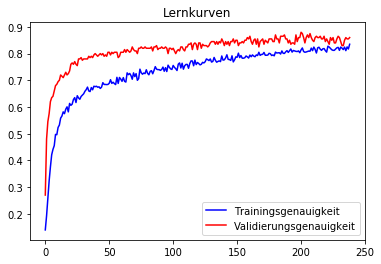

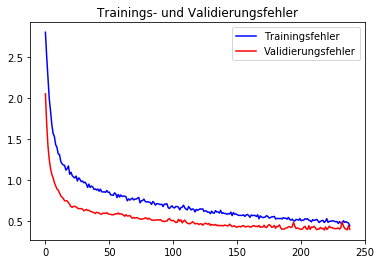

              precision    recall  f1-score   support

     T-shirt       0.77      0.78      0.78      1000
    Trousers       0.99      0.96      0.98      1000
    Pullover       0.72      0.74      0.73      1000
       Dress       0.84      0.88      0.86      1000
        Coat       0.77      0.69      0.73      1000
      Sandal       0.94      0.91      0.93      1000
       Shirt       0.52      0.54      0.53      1000
     Sneaker       0.88      0.95      0.91      1000
         Bag       0.95      0.96      0.95      1000
  Ankle-boot       0.96      0.93      0.95      1000

    accuracy                           0.83     10000
   macro avg       0.84      0.83      0.83     10000
weighted avg       0.84      0.83      0.83     10000



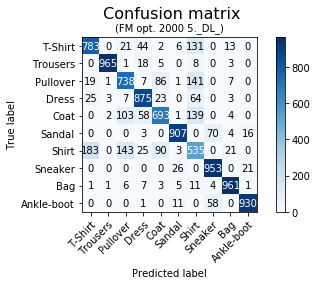

Die durchschnittliche Epochenanzahl beträgt:  191.4


In [0]:
# Trainingsmenge 2000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.0001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1, 5, X_tr_2000, y_tr_2000, 0.4, 0.0001, False, 300, 2000)

In [0]:
downloader(2000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 5s 1ms/step - loss: 2.3741 - acc: 0.2371 - val_loss: 1.3850 - val_acc: 0.5580
Epoch 2/300
4500/4500 [==============================] - 1s 185us/step - loss: 1.5165 - acc: 0.4789 - val_loss: 0.9787 - val_acc: 0.7000
Epoch 3/300
4500/4500 [==============================] - 1s 176us/step - loss: 1.1948 - acc: 0.5902 - val_loss: 0.8107 - val_acc: 0.7400
Epoch 4/300
4500/4500 [==============================] - 1s 179us/step - loss: 1.0394 - acc: 0.6309 - val_loss: 0.7234 - val_acc: 0.7520
Epoch 5/300
4500/4500 [==============================] - 1s 204us/step - loss: 0.9563 - acc: 0.6624 - val_loss: 0.6763 - val_acc: 0.7680
Epoch 6/300
4500/4500 [==============================] - 1s 199us/step - loss: 0.9051 - acc: 0.6724 - val_loss: 0.6445 - val_acc: 0.7760
Epoch 7/300

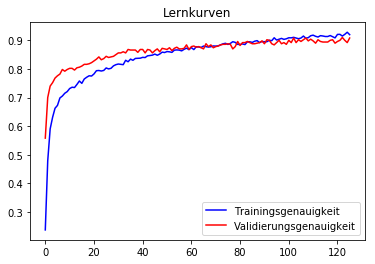

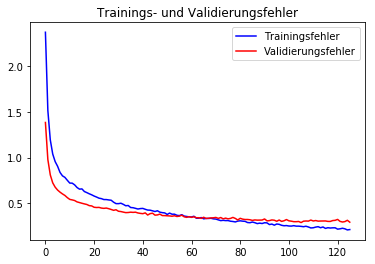

              precision    recall  f1-score   support

     T-shirt       0.84      0.83      0.83      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.84      0.82      0.83      1000
       Dress       0.89      0.90      0.89      1000
        Coat       0.82      0.82      0.82      1000
      Sandal       0.99      0.92      0.95      1000
       Shirt       0.67      0.68      0.67      1000
     Sneaker       0.88      0.97      0.93      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.96      0.94      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



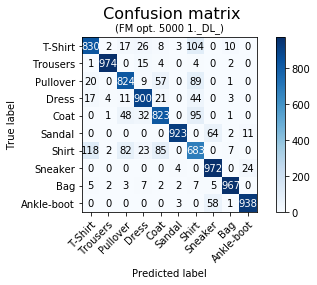

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 5s 1ms/step - loss: 2.2466 - acc: 0.2753 - val_loss: 1.2622 - val_acc: 0.6040
Epoch 2/300
4500/4500 [==============================] - 1s 219us/step - loss: 1.3829 - acc: 0.5184 - val_loss: 0.9411 - val_acc: 0.6820
Epoch 3/300
4500/4500 [==============================] - 1s 192us/step - loss: 1.1137 - acc: 0.6158 - val_loss: 0.8237 - val_acc: 0.7300
Epoch 4/300
4500/4500 [==============================] - 1s 190us/step - loss: 0.9805 - acc: 0.6520 - val_loss: 0.7611 - val_acc: 0.7360
Epoch 5/300
4500/4500 [==============================] - 1s 184us/step - loss: 0.8997 - acc: 0.6776 - val_loss: 0.7139 - val_acc: 0.7520
Epoch 6/300
4500/4500 [==============================] - 1s 179us/step - loss: 0.8524 - acc: 0.6920 - val_loss: 0.6819 - val_acc: 0.7540
Epoch 7/300

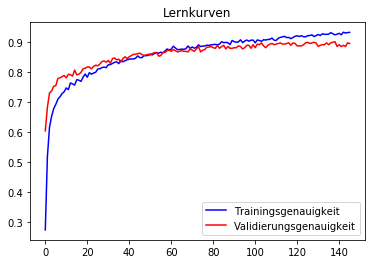

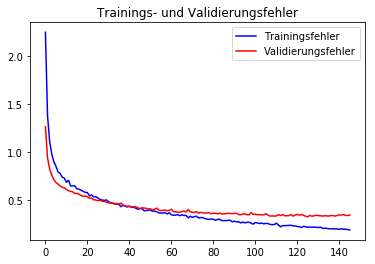

              precision    recall  f1-score   support

     T-shirt       0.84      0.82      0.83      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.85      0.84      0.84      1000
       Dress       0.89      0.90      0.89      1000
        Coat       0.84      0.80      0.82      1000
      Sandal       0.99      0.93      0.96      1000
       Shirt       0.64      0.69      0.67      1000
     Sneaker       0.89      0.98      0.93      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.97      0.94      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.89      0.88      0.88     10000
weighted avg       0.89      0.88      0.88     10000



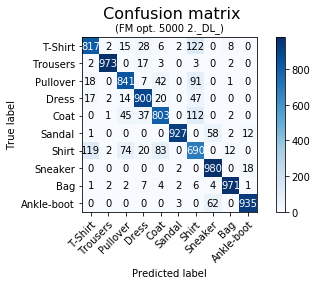

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 5s 1ms/step - loss: 2.3178 - acc: 0.2538 - val_loss: 1.2039 - val_acc: 0.6680
Epoch 2/300
4500/4500 [==============================] - 1s 182us/step - loss: 1.4818 - acc: 0.4838 - val_loss: 0.8619 - val_acc: 0.7280
Epoch 3/300
4500/4500 [==============================] - 1s 187us/step - loss: 1.1630 - acc: 0.5876 - val_loss: 0.7416 - val_acc: 0.7520
Epoch 4/300
4500/4500 [==============================] - 1s 191us/step - loss: 1.0126 - acc: 0.6360 - val_loss: 0.6809 - val_acc: 0.7560
Epoch 5/300
4500/4500 [==============================] - 1s 178us/step - loss: 0.9490 - acc: 0.6649 - val_loss: 0.6387 - val_acc: 0.7720
Epoch 6/300
4500/4500 [==============================] - 1s 186us/step - loss: 0.8917 - acc: 0.6776 - val_loss: 0.6126 - val_acc: 0.7860
Epoch 7/300

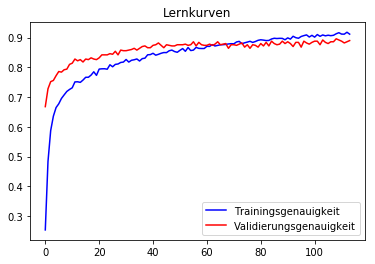

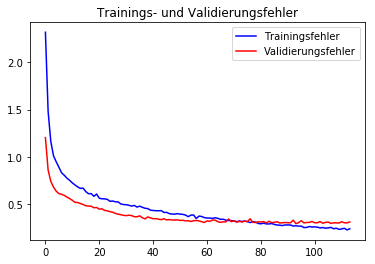

              precision    recall  f1-score   support

     T-shirt       0.85      0.81      0.83      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.83      0.82      0.83      1000
       Dress       0.87      0.89      0.88      1000
        Coat       0.80      0.83      0.81      1000
      Sandal       0.98      0.93      0.96      1000
       Shirt       0.65      0.66      0.65      1000
     Sneaker       0.89      0.97      0.93      1000
         Bag       0.97      0.96      0.96      1000
  Ankle-boot       0.96      0.94      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



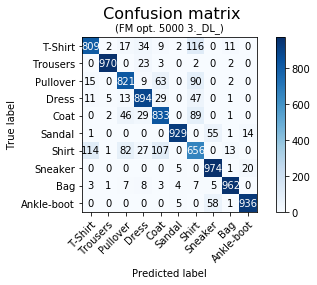

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 6s 1ms/step - loss: 2.2647 - acc: 0.2673 - val_loss: 1.2205 - val_acc: 0.6460
Epoch 2/300
4500/4500 [==============================] - 1s 182us/step - loss: 1.4066 - acc: 0.5024 - val_loss: 0.9085 - val_acc: 0.7000
Epoch 3/300
4500/4500 [==============================] - 1s 182us/step - loss: 1.1422 - acc: 0.6040 - val_loss: 0.8261 - val_acc: 0.6940
Epoch 4/300
4500/4500 [==============================] - 1s 185us/step - loss: 1.0012 - acc: 0.6444 - val_loss: 0.7665 - val_acc: 0.7160
Epoch 5/300
4500/4500 [==============================] - 1s 194us/step - loss: 0.9245 - acc: 0.6713 - val_loss: 0.7371 - val_acc: 0.7200
Epoch 6/300
4500/4500 [==============================] - 1s 185us/step - loss: 0.8747 - acc: 0.6813 - val_loss: 0.7121 - val_acc: 0.7180
Epoch 7/300

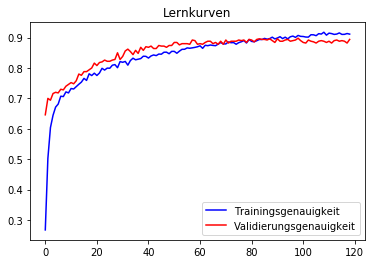

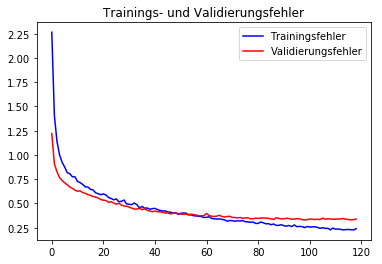

              precision    recall  f1-score   support

     T-shirt       0.85      0.82      0.84      1000
    Trousers       0.98      0.97      0.98      1000
    Pullover       0.84      0.83      0.84      1000
       Dress       0.89      0.88      0.89      1000
        Coat       0.82      0.81      0.82      1000
      Sandal       0.99      0.93      0.96      1000
       Shirt       0.64      0.69      0.66      1000
     Sneaker       0.90      0.98      0.94      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.97      0.95      0.96      1000

    accuracy                           0.88     10000
   macro avg       0.89      0.88      0.88     10000
weighted avg       0.89      0.88      0.88     10000



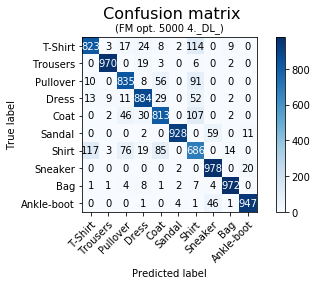

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 6s 1ms/step - loss: 2.3418 - acc: 0.2411 - val_loss: 1.3038 - val_acc: 0.6320
Epoch 2/300
4500/4500 [==============================] - 1s 177us/step - loss: 1.5067 - acc: 0.4769 - val_loss: 0.9209 - val_acc: 0.7160
Epoch 3/300
4500/4500 [==============================] - 1s 186us/step - loss: 1.1751 - acc: 0.5809 - val_loss: 0.7870 - val_acc: 0.7300
Epoch 4/300
4500/4500 [==============================] - 1s 185us/step - loss: 1.0374 - acc: 0.6347 - val_loss: 0.7238 - val_acc: 0.7420
Epoch 5/300
4500/4500 [==============================] - 1s 185us/step - loss: 0.9601 - acc: 0.6618 - val_loss: 0.6774 - val_acc: 0.7520
Epoch 6/300
4500/4500 [==============================] - 1s 178us/step - loss: 0.8868 - acc: 0.6820 - val_loss: 0.6546 - val_acc: 0.7660
Epoch 7/300

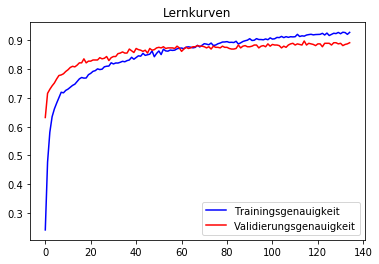

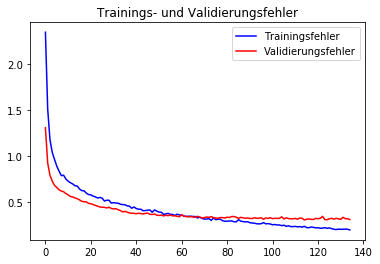

              precision    recall  f1-score   support

     T-shirt       0.84      0.82      0.83      1000
    Trousers       0.98      0.97      0.98      1000
    Pullover       0.84      0.84      0.84      1000
       Dress       0.90      0.87      0.89      1000
        Coat       0.82      0.83      0.83      1000
      Sandal       0.98      0.94      0.96      1000
       Shirt       0.66      0.70      0.68      1000
     Sneaker       0.89      0.98      0.93      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.97      0.93      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.89      0.88      0.89     10000
weighted avg       0.89      0.88      0.89     10000



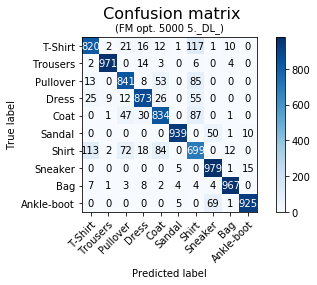

Die durchschnittliche Epochenanzahl beträgt:  108.0


In [0]:
# Trainingsmenge 5000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.0001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1, 5, X_tr_5000, y_tr_5000, 0.4, 0.0001, False, 300, 5000)

In [0]:
downloader(5000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/108
5000/5000 [==============================] - 30s 6ms/step - loss: 2.2603 - acc: 0.2690 - val_loss: 1.1894 - val_acc: 0.6525
Epoch 2/108
5000/5000 [==============================] - 3s 515us/step - loss: 1.3939 - acc: 0.5192 - val_loss: 0.8820 - val_acc: 0.7071
Epoch 3/108
5000/5000 [==============================] - 3s 513us/step - loss: 1.1124 - acc: 0.6070 - val_loss: 0.7747 - val_acc: 0.7239
Epoch 4/108
5000/5000 [==============================] - 2s 492us/step - loss: 0.9883 - acc: 0.6510 - val_loss: 0.7186 - val_acc: 0.7330
Epoch 5/108
5000/5000 [==============================] - 3s 521us/step - loss: 0.9118 - acc: 0.6768 - val_loss: 0.6838 - val_acc: 0.7407
Epoch 6/108
5000/5000 [==============================] - 2s 481us/step - loss: 0.8497 - acc: 0.6956 - val_loss: 0.6613 - val_acc: 0.7499
Epoch 7/108
5000/5000 [===

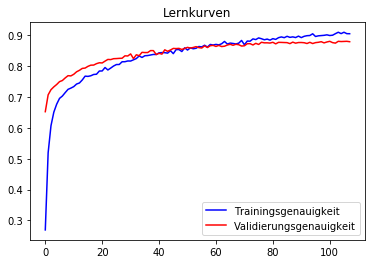

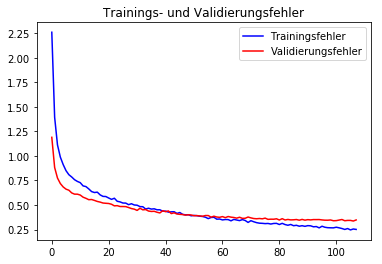

              precision    recall  f1-score   support

     T-shirt       0.83      0.84      0.84      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.80      0.86      0.83      1000
       Dress       0.89      0.89      0.89      1000
        Coat       0.85      0.76      0.80      1000
      Sandal       0.99      0.93      0.96      1000
       Shirt       0.65      0.67      0.66      1000
     Sneaker       0.89      0.98      0.93      1000
         Bag       0.96      0.97      0.97      1000
  Ankle-boot       0.97      0.94      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



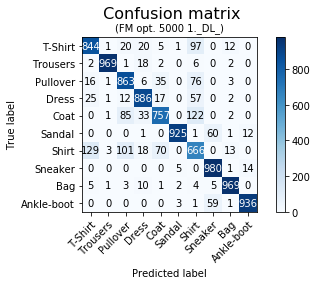

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/108
5000/5000 [==============================] - 31s 6ms/step - loss: 2.2303 - acc: 0.2718 - val_loss: 1.2063 - val_acc: 0.6419
Epoch 2/108
5000/5000 [==============================] - 2s 499us/step - loss: 1.3892 - acc: 0.5244 - val_loss: 0.8853 - val_acc: 0.6997
Epoch 3/108
5000/5000 [==============================] - 2s 492us/step - loss: 1.0988 - acc: 0.6112 - val_loss: 0.7737 - val_acc: 0.7249
Epoch 4/108
5000/5000 [==============================] - 2s 483us/step - loss: 0.9823 - acc: 0.6512 - val_loss: 0.7178 - val_acc: 0.7375
Epoch 5/108
5000/5000 [==============================] - 2s 488us/step - loss: 0.9070 - acc: 0.6822 - val_loss: 0.6777 - val_acc: 0.7503
Epoch 6/108
5000/5000 [==============================] - 2s 486us/step - loss: 0.8424 - acc: 0.6994 - val_loss: 0.6551 - val_acc: 0.7557
Epoch 7/108
5000/5000 [===

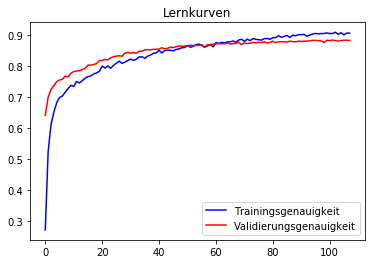

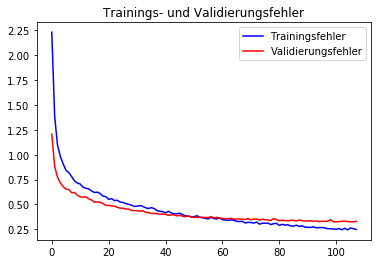

              precision    recall  f1-score   support

     T-shirt       0.86      0.80      0.83      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.85      0.83      0.84      1000
       Dress       0.88      0.90      0.89      1000
        Coat       0.83      0.81      0.82      1000
      Sandal       0.99      0.94      0.96      1000
       Shirt       0.64      0.72      0.68      1000
     Sneaker       0.89      0.98      0.93      1000
         Bag       0.98      0.96      0.97      1000
  Ankle-boot       0.97      0.93      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.89      0.88      0.88     10000
weighted avg       0.89      0.88      0.88     10000



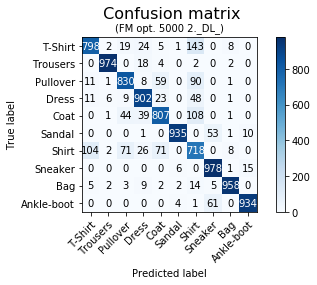

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/108
5000/5000 [==============================] - 32s 6ms/step - loss: 2.2253 - acc: 0.2704 - val_loss: 1.1995 - val_acc: 0.6225
Epoch 2/108
5000/5000 [==============================] - 3s 620us/step - loss: 1.4301 - acc: 0.5000 - val_loss: 0.9021 - val_acc: 0.6925
Epoch 3/108
5000/5000 [==============================] - 4s 730us/step - loss: 1.1586 - acc: 0.5908 - val_loss: 0.7969 - val_acc: 0.7192
Epoch 4/108
5000/5000 [==============================] - 3s 622us/step - loss: 1.0111 - acc: 0.6386 - val_loss: 0.7372 - val_acc: 0.7324
Epoch 5/108
5000/5000 [==============================] - 3s 646us/step - loss: 0.9554 - acc: 0.6720 - val_loss: 0.6997 - val_acc: 0.7436
Epoch 6/108
5000/5000 [==============================] - 3s 681us/step - loss: 0.8802 - acc: 0.6932 - val_loss: 0.6624 - val_acc: 0.7552
Epoch 7/108
5000/5000 [===

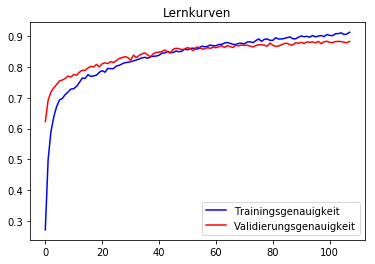

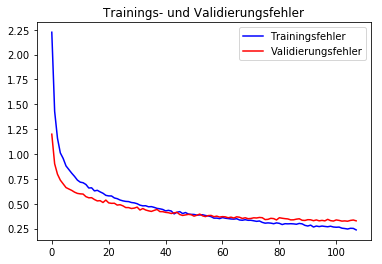

              precision    recall  f1-score   support

     T-shirt       0.84      0.83      0.83      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.82      0.85      0.84      1000
       Dress       0.88      0.89      0.89      1000
        Coat       0.83      0.80      0.81      1000
      Sandal       0.99      0.94      0.96      1000
       Shirt       0.67      0.69      0.68      1000
     Sneaker       0.89      0.98      0.93      1000
         Bag       0.97      0.96      0.97      1000
  Ankle-boot       0.97      0.93      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



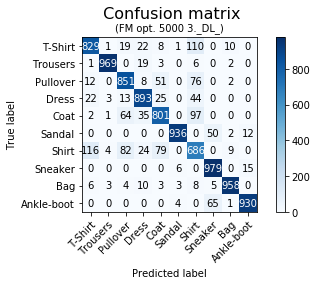

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/108
5000/5000 [==============================] - 31s 6ms/step - loss: 2.2528 - acc: 0.2574 - val_loss: 1.1778 - val_acc: 0.6171
Epoch 2/108
5000/5000 [==============================] - 3s 557us/step - loss: 1.4206 - acc: 0.5044 - val_loss: 0.8777 - val_acc: 0.7065
Epoch 3/108
5000/5000 [==============================] - 2s 499us/step - loss: 1.1349 - acc: 0.5998 - val_loss: 0.7613 - val_acc: 0.7253
Epoch 4/108
5000/5000 [==============================] - 3s 530us/step - loss: 1.0084 - acc: 0.6402 - val_loss: 0.6935 - val_acc: 0.7408
Epoch 5/108
5000/5000 [==============================] - 3s 512us/step - loss: 0.8943 - acc: 0.6844 - val_loss: 0.6611 - val_acc: 0.7512
Epoch 6/108
5000/5000 [==============================] - 3s 525us/step - loss: 0.8695 - acc: 0.6836 - val_loss: 0.6411 - val_acc: 0.7592
Epoch 7/108
5000/5000 [===

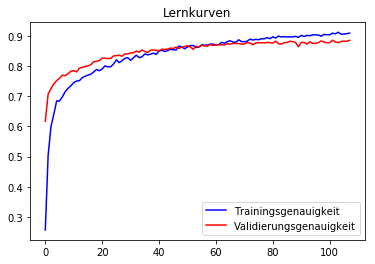

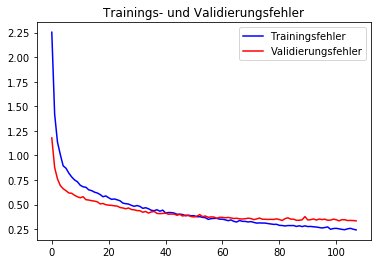

              precision    recall  f1-score   support

     T-shirt       0.86      0.81      0.83      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.82      0.86      0.84      1000
       Dress       0.87      0.91      0.89      1000
        Coat       0.82      0.80      0.81      1000
      Sandal       0.99      0.94      0.96      1000
       Shirt       0.67      0.70      0.68      1000
     Sneaker       0.88      0.98      0.93      1000
         Bag       0.98      0.96      0.97      1000
  Ankle-boot       0.98      0.92      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.89      0.88      0.89     10000
weighted avg       0.89      0.88      0.89     10000



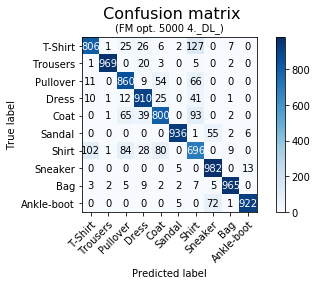

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/108
5000/5000 [==============================] - 31s 6ms/step - loss: 2.2568 - acc: 0.2654 - val_loss: 1.2037 - val_acc: 0.6245
Epoch 2/108
5000/5000 [==============================] - 2s 496us/step - loss: 1.4287 - acc: 0.5162 - val_loss: 0.8833 - val_acc: 0.7077
Epoch 3/108
5000/5000 [==============================] - 3s 547us/step - loss: 1.1362 - acc: 0.6074 - val_loss: 0.7832 - val_acc: 0.7283
Epoch 4/108
5000/5000 [==============================] - 3s 522us/step - loss: 1.0055 - acc: 0.6460 - val_loss: 0.7194 - val_acc: 0.7424
Epoch 5/108
5000/5000 [==============================] - 3s 528us/step - loss: 0.9081 - acc: 0.6736 - val_loss: 0.6785 - val_acc: 0.7524
Epoch 6/108
5000/5000 [==============================] - 3s 513us/step - loss: 0.8442 - acc: 0.6980 - val_loss: 0.6493 - val_acc: 0.7601
Epoch 7/108
5000/5000 [===

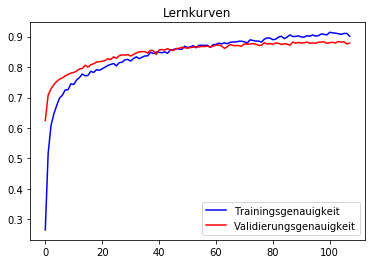

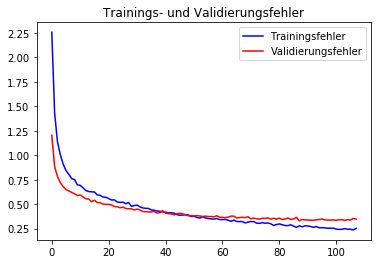

              precision    recall  f1-score   support

     T-shirt       0.85      0.85      0.85      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.75      0.88      0.81      1000
       Dress       0.87      0.90      0.88      1000
        Coat       0.83      0.75      0.79      1000
      Sandal       0.99      0.93      0.96      1000
       Shirt       0.69      0.64      0.66      1000
     Sneaker       0.88      0.98      0.93      1000
         Bag       0.98      0.96      0.97      1000
  Ankle-boot       0.98      0.93      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



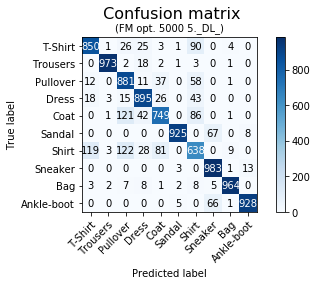

In [75]:
# Trainingsmenge 5000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.0001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainieren, mit durchschnittlichen bester Epochenanzahl aus EarlyStopping
fullDataRuns(1, 5, X_tr_5000, y_tr_5000, X_test, y_test, 0.4, 0.0001, False, 108, 5000)

In [0]:
downloader_full(5000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
71/71 [==============================] - 7s 100ms/step - loss: 2.5696 - acc: 0.1765 - val_loss: 1.4333 - val_acc: 0.5680
Epoch 2/300
71/71 [==============================] - 1s 19ms/step - loss: 1.8574 - acc: 0.3653 - val_loss: 1.1264 - val_acc: 0.6240
Epoch 3/300
71/71 [==============================] - 2s 21ms/step - loss: 1.5379 - acc: 0.4662 - val_loss: 1.0182 - val_acc: 0.6520
Epoch 4/300
71/71 [==============================] - 2s 22ms/step - loss: 1.3412 - acc: 0.5252 - val_loss: 0.9222 - val_acc: 0.6880
Epoch 5/300
71/71 [==============================] - 2s 22ms/step - loss: 1.2592 - acc: 0.5514 - val_loss: 0.8725 - val_acc: 0.7060
Epoch 6/300
71/71 [==============================] - 2s 23ms/step - loss: 1.1771 - acc: 0.5873 - val_loss: 0.7894 - val_acc: 0.7180
Epoch 7/300
71/71 [==============================] - 1s 20ms/st

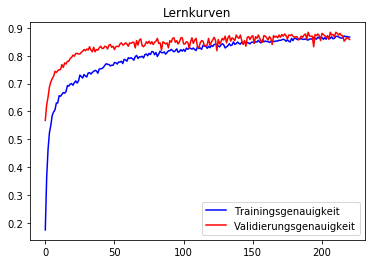

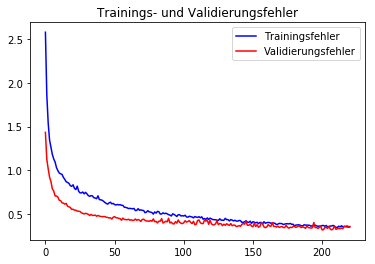

              precision    recall  f1-score   support

     T-shirt       0.85      0.81      0.83      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.85      0.79      0.82      1000
       Dress       0.86      0.91      0.88      1000
        Coat       0.80      0.82      0.81      1000
      Sandal       0.97      0.94      0.96      1000
       Shirt       0.64      0.66      0.65      1000
     Sneaker       0.90      0.97      0.93      1000
         Bag       0.95      0.98      0.97      1000
  Ankle-boot       0.98      0.94      0.96      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



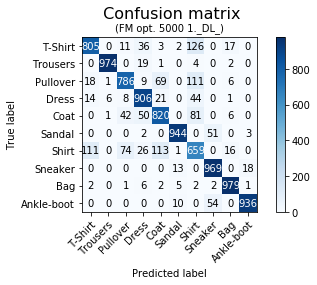

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
71/71 [==============================] - 8s 116ms/step - loss: 2.4749 - acc: 0.1889 - val_loss: 1.4772 - val_acc: 0.5260
Epoch 2/300
71/71 [==============================] - 2s 21ms/step - loss: 1.7834 - acc: 0.3797 - val_loss: 1.1394 - val_acc: 0.6140
Epoch 3/300
71/71 [==============================] - 2s 24ms/step - loss: 1.4712 - acc: 0.4800 - val_loss: 1.0234 - val_acc: 0.6620
Epoch 4/300
71/71 [==============================] - 2s 24ms/step - loss: 1.3184 - acc: 0.5331 - val_loss: 0.9096 - val_acc: 0.7040
Epoch 5/300
71/71 [==============================] - 2s 23ms/step - loss: 1.1923 - acc: 0.5720 - val_loss: 0.8368 - val_acc: 0.7220
Epoch 6/300
71/71 [==============================] - 2s 25ms/step - loss: 1.1399 - acc: 0.5895 - val_loss: 0.8040 - val_acc: 0.7240
Epoch 7/300
71/71 [==============================] - 2s 25ms/st

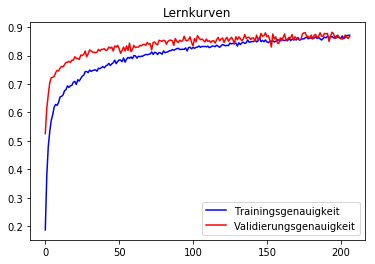

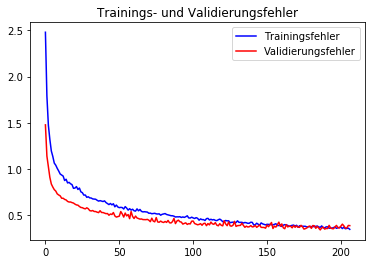

              precision    recall  f1-score   support

     T-shirt       0.83      0.82      0.83      1000
    Trousers       0.98      0.98      0.98      1000
    Pullover       0.85      0.81      0.83      1000
       Dress       0.89      0.88      0.88      1000
        Coat       0.78      0.84      0.81      1000
      Sandal       0.97      0.91      0.94      1000
       Shirt       0.63      0.63      0.63      1000
     Sneaker       0.87      0.98      0.92      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.97      0.92      0.95      1000

    accuracy                           0.87     10000
   macro avg       0.87      0.87      0.87     10000
weighted avg       0.87      0.87      0.87     10000



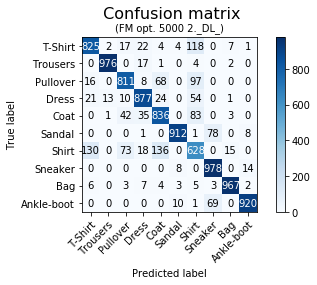

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
71/71 [==============================] - 8s 107ms/step - loss: 2.5386 - acc: 0.1808 - val_loss: 1.4503 - val_acc: 0.5260
Epoch 2/300
71/71 [==============================] - 1s 19ms/step - loss: 1.8780 - acc: 0.3512 - val_loss: 1.0983 - val_acc: 0.6520
Epoch 3/300
71/71 [==============================] - 2s 21ms/step - loss: 1.5474 - acc: 0.4567 - val_loss: 0.9493 - val_acc: 0.6760
Epoch 4/300
71/71 [==============================] - 2s 21ms/step - loss: 1.3789 - acc: 0.5160 - val_loss: 0.8565 - val_acc: 0.7000
Epoch 5/300
71/71 [==============================] - 2s 21ms/step - loss: 1.2286 - acc: 0.5582 - val_loss: 0.7892 - val_acc: 0.7240
Epoch 6/300
71/71 [==============================] - 2s 23ms/step - loss: 1.1682 - acc: 0.5806 - val_loss: 0.7500 - val_acc: 0.7460
Epoch 7/300
71/71 [==============================] - 1s 21ms/st

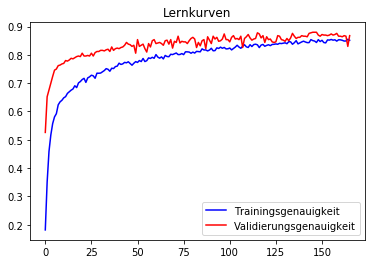

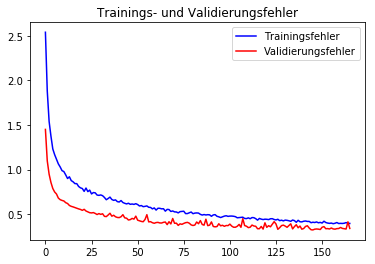

              precision    recall  f1-score   support

     T-shirt       0.82      0.83      0.83      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.87      0.79      0.83      1000
       Dress       0.87      0.89      0.88      1000
        Coat       0.78      0.82      0.80      1000
      Sandal       0.97      0.92      0.94      1000
       Shirt       0.63      0.61      0.62      1000
     Sneaker       0.88      0.97      0.92      1000
         Bag       0.95      0.97      0.96      1000
  Ankle-boot       0.97      0.93      0.95      1000

    accuracy                           0.87     10000
   macro avg       0.87      0.87      0.87     10000
weighted avg       0.87      0.87      0.87     10000



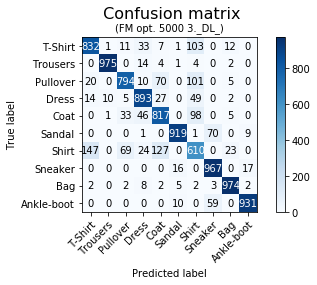

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
71/71 [==============================] - 8s 118ms/step - loss: 2.5952 - acc: 0.1789 - val_loss: 1.4687 - val_acc: 0.5640
Epoch 2/300
71/71 [==============================] - 1s 19ms/step - loss: 1.8612 - acc: 0.3637 - val_loss: 1.2900 - val_acc: 0.6140
Epoch 3/300
71/71 [==============================] - 2s 22ms/step - loss: 1.5772 - acc: 0.4488 - val_loss: 1.0780 - val_acc: 0.6620
Epoch 4/300
71/71 [==============================] - 1s 21ms/step - loss: 1.3773 - acc: 0.5113 - val_loss: 1.0170 - val_acc: 0.6720
Epoch 5/300
71/71 [==============================] - 2s 21ms/step - loss: 1.2576 - acc: 0.5526 - val_loss: 0.9543 - val_acc: 0.6940
Epoch 6/300
71/71 [==============================] - 2s 24ms/step - loss: 1.1759 - acc: 0.5769 - val_loss: 0.8631 - val_acc: 0.7200
Epoch 7/300
71/71 [==============================] - 2s 22ms/st

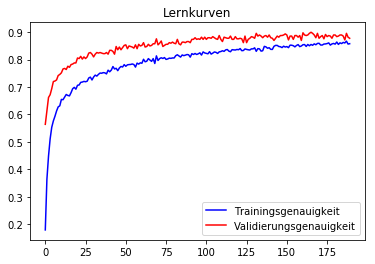

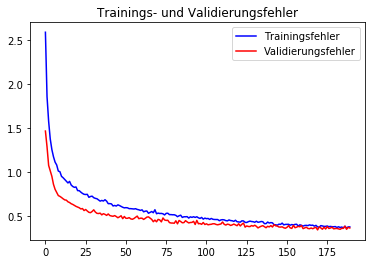

              precision    recall  f1-score   support

     T-shirt       0.84      0.82      0.83      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.84      0.79      0.81      1000
       Dress       0.87      0.90      0.88      1000
        Coat       0.78      0.82      0.80      1000
      Sandal       0.97      0.91      0.94      1000
       Shirt       0.63      0.64      0.63      1000
     Sneaker       0.88      0.97      0.92      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.97      0.93      0.95      1000

    accuracy                           0.87     10000
   macro avg       0.87      0.87      0.87     10000
weighted avg       0.87      0.87      0.87     10000



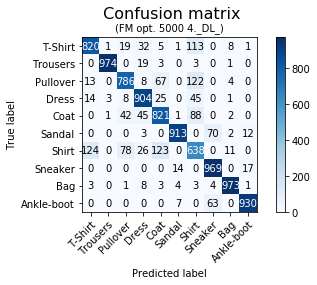

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
71/71 [==============================] - 8s 118ms/step - loss: 2.5463 - acc: 0.1882 - val_loss: 1.4927 - val_acc: 0.5400
Epoch 2/300
71/71 [==============================] - 1s 20ms/step - loss: 1.9142 - acc: 0.3494 - val_loss: 1.1343 - val_acc: 0.6320
Epoch 3/300
71/71 [==============================] - 2s 21ms/step - loss: 1.6061 - acc: 0.4374 - val_loss: 0.9874 - val_acc: 0.6740
Epoch 4/300
71/71 [==============================] - 2s 22ms/step - loss: 1.4103 - acc: 0.5057 - val_loss: 0.8648 - val_acc: 0.6920
Epoch 5/300
71/71 [==============================] - 1s 21ms/step - loss: 1.2838 - acc: 0.5415 - val_loss: 0.8037 - val_acc: 0.7160
Epoch 6/300
71/71 [==============================] - 2s 22ms/step - loss: 1.2037 - acc: 0.5739 - val_loss: 0.7846 - val_acc: 0.7200
Epoch 7/300
71/71 [==============================] - 2s 22ms/st

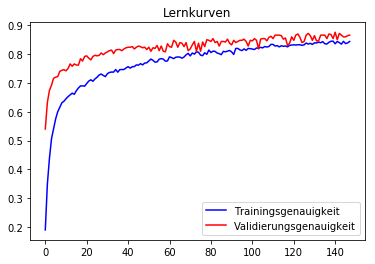

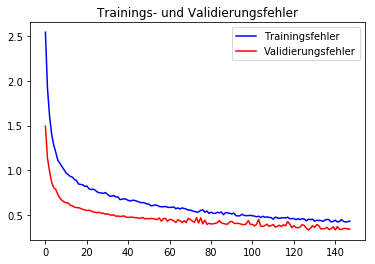

              precision    recall  f1-score   support

     T-shirt       0.84      0.78      0.81      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.86      0.75      0.80      1000
       Dress       0.87      0.89      0.88      1000
        Coat       0.76      0.83      0.79      1000
      Sandal       0.97      0.89      0.93      1000
       Shirt       0.58      0.63      0.60      1000
     Sneaker       0.86      0.97      0.91      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.96      0.92      0.94      1000

    accuracy                           0.86     10000
   macro avg       0.87      0.86      0.86     10000
weighted avg       0.87      0.86      0.86     10000



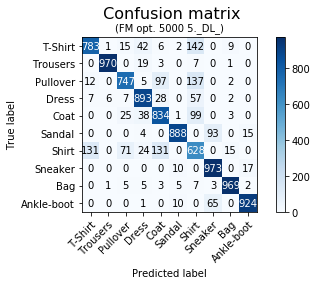

Die durchschnittliche Epochenanzahl beträgt:  166.4


In [0]:
# Trainingsmenge 5000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.0001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1, 5, X_tr_5000, y_tr_5000, 0.4, 0.0001, False, 300, 5000)

In [0]:
downloader(5000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 34s 4ms/step - loss: 1.7187 - acc: 0.4402 - val_loss: 0.8959 - val_acc: 0.6940
Epoch 2/300
9000/9000 [==============================] - 3s 345us/step - loss: 0.9993 - acc: 0.6516 - val_loss: 0.6961 - val_acc: 0.7480
Epoch 3/300
9000/9000 [==============================] - 3s 345us/step - loss: 0.8424 - acc: 0.7027 - val_loss: 0.6126 - val_acc: 0.7860
Epoch 4/300
9000/9000 [==============================] - 3s 357us/step - loss: 0.7674 - acc: 0.7223 - val_loss: 0.5677 - val_acc: 0.7950
Epoch 5/300
9000/9000 [==============================] - 3s 383us/step - loss: 0.7147 - acc: 0.7364 - val_loss: 0.5393 - val_acc: 0.8010
Epoch 6/300
9000/9000 [==============================] - 3s 358us/step - loss: 0.6582 - acc: 0.7540 - val_loss: 0.5207 - val_acc: 0.8210
Epoch 7/3

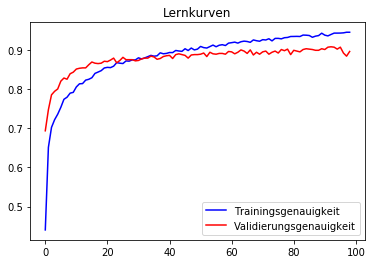

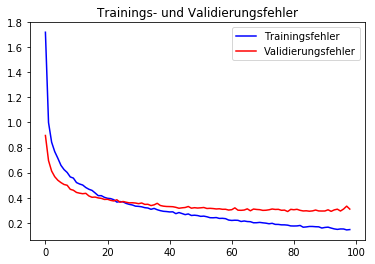

              precision    recall  f1-score   support

     T-shirt       0.86      0.85      0.86      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.85      0.87      0.86      1000
       Dress       0.88      0.91      0.89      1000
        Coat       0.85      0.81      0.83      1000
      Sandal       0.98      0.96      0.97      1000
       Shirt       0.70      0.72      0.71      1000
     Sneaker       0.93      0.97      0.95      1000
         Bag       0.98      0.97      0.97      1000
  Ankle-boot       0.97      0.95      0.96      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



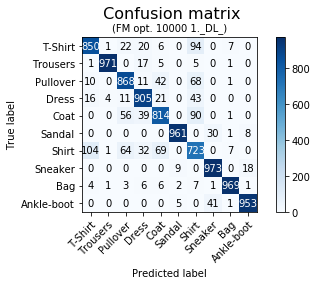

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 31s 3ms/step - loss: 1.6262 - acc: 0.4466 - val_loss: 0.8128 - val_acc: 0.7080
Epoch 2/300
9000/9000 [==============================] - 2s 254us/step - loss: 0.9328 - acc: 0.6684 - val_loss: 0.6683 - val_acc: 0.7410
Epoch 3/300
9000/9000 [==============================] - 2s 250us/step - loss: 0.8065 - acc: 0.7042 - val_loss: 0.6025 - val_acc: 0.7610
Epoch 4/300
9000/9000 [==============================] - 2s 253us/step - loss: 0.7284 - acc: 0.7313 - val_loss: 0.5715 - val_acc: 0.7760
Epoch 5/300
9000/9000 [==============================] - 2s 252us/step - loss: 0.6752 - acc: 0.7531 - val_loss: 0.5360 - val_acc: 0.7910
Epoch 6/300
9000/9000 [==============================] - 2s 252us/step - loss: 0.6457 - acc: 0.7638 - val_loss: 0.5236 - val_acc: 0.7880
Epoch 7/3

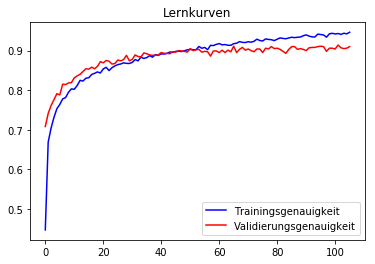

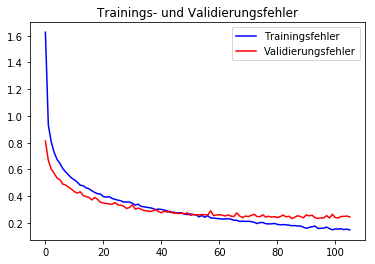

              precision    recall  f1-score   support

     T-shirt       0.85      0.83      0.84      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.82      0.88      0.85      1000
       Dress       0.90      0.90      0.90      1000
        Coat       0.83      0.84      0.84      1000
      Sandal       0.98      0.96      0.97      1000
       Shirt       0.72      0.69      0.71      1000
     Sneaker       0.92      0.97      0.95      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.97      0.95      0.96      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



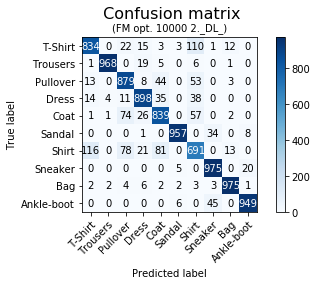

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 31s 3ms/step - loss: 1.6142 - acc: 0.4531 - val_loss: 0.7690 - val_acc: 0.7370
Epoch 2/300
9000/9000 [==============================] - 2s 253us/step - loss: 0.9404 - acc: 0.6704 - val_loss: 0.6523 - val_acc: 0.7660
Epoch 3/300
9000/9000 [==============================] - 2s 252us/step - loss: 0.7984 - acc: 0.7122 - val_loss: 0.5912 - val_acc: 0.7780
Epoch 4/300
9000/9000 [==============================] - 2s 258us/step - loss: 0.7326 - acc: 0.7357 - val_loss: 0.5669 - val_acc: 0.7910
Epoch 5/300
9000/9000 [==============================] - 2s 255us/step - loss: 0.6743 - acc: 0.7532 - val_loss: 0.5482 - val_acc: 0.7880
Epoch 6/300
9000/9000 [==============================] - 2s 259us/step - loss: 0.6381 - acc: 0.7650 - val_loss: 0.5410 - val_acc: 0.7970
Epoch 7/3

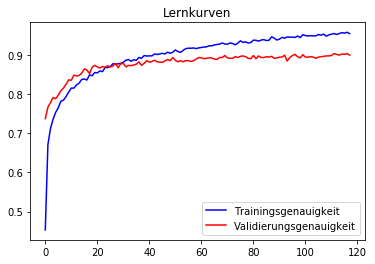

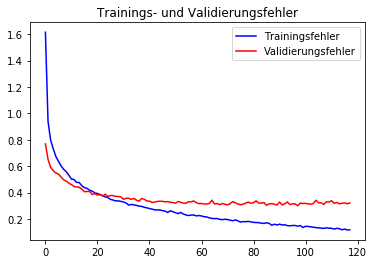

              precision    recall  f1-score   support

     T-shirt       0.86      0.83      0.85      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.84      0.88      0.86      1000
       Dress       0.90      0.90      0.90      1000
        Coat       0.84      0.87      0.85      1000
      Sandal       0.98      0.96      0.97      1000
       Shirt       0.71      0.71      0.71      1000
     Sneaker       0.91      0.97      0.94      1000
         Bag       0.99      0.97      0.98      1000
  Ankle-boot       0.97      0.94      0.96      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



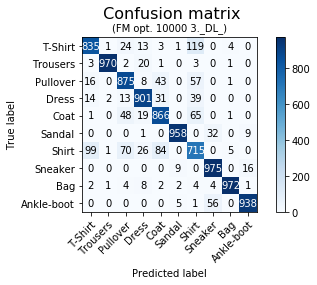

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 32s 4ms/step - loss: 1.7389 - acc: 0.4217 - val_loss: 0.8467 - val_acc: 0.7030
Epoch 2/300
9000/9000 [==============================] - 2s 270us/step - loss: 0.9791 - acc: 0.6560 - val_loss: 0.6966 - val_acc: 0.7430
Epoch 3/300
9000/9000 [==============================] - 2s 265us/step - loss: 0.8333 - acc: 0.7021 - val_loss: 0.6133 - val_acc: 0.7730
Epoch 4/300
9000/9000 [==============================] - 2s 257us/step - loss: 0.7584 - acc: 0.7223 - val_loss: 0.5920 - val_acc: 0.7750
Epoch 5/300
9000/9000 [==============================] - 2s 261us/step - loss: 0.7018 - acc: 0.7434 - val_loss: 0.5314 - val_acc: 0.7950
Epoch 6/300
9000/9000 [==============================] - 2s 259us/step - loss: 0.6581 - acc: 0.7589 - val_loss: 0.5118 - val_acc: 0.8270
Epoch 7/3

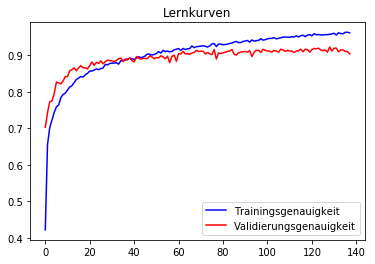

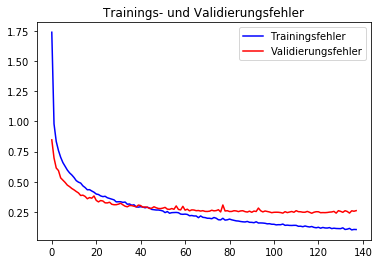

              precision    recall  f1-score   support

     T-shirt       0.85      0.83      0.84      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.86      0.87      0.87      1000
       Dress       0.88      0.92      0.90      1000
        Coat       0.87      0.83      0.85      1000
      Sandal       0.99      0.95      0.97      1000
       Shirt       0.70      0.74      0.72      1000
     Sneaker       0.91      0.98      0.94      1000
         Bag       0.98      0.96      0.97      1000
  Ankle-boot       0.97      0.94      0.95      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



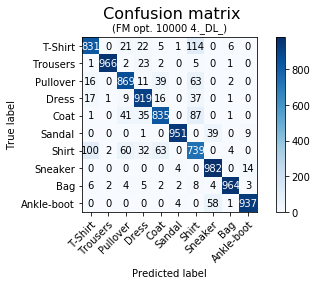

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 9000 samples, validate on 1000 samples
Epoch 1/300
9000/9000 [==============================] - 32s 4ms/step - loss: 1.6521 - acc: 0.4526 - val_loss: 0.7595 - val_acc: 0.7400
Epoch 2/300
9000/9000 [==============================] - 2s 262us/step - loss: 0.9419 - acc: 0.6683 - val_loss: 0.6308 - val_acc: 0.7640
Epoch 3/300
9000/9000 [==============================] - 2s 258us/step - loss: 0.7911 - acc: 0.7129 - val_loss: 0.5762 - val_acc: 0.7820
Epoch 4/300
9000/9000 [==============================] - 2s 254us/step - loss: 0.7199 - acc: 0.7406 - val_loss: 0.5431 - val_acc: 0.7940
Epoch 5/300
9000/9000 [==============================] - 2s 251us/step - loss: 0.6705 - acc: 0.7554 - val_loss: 0.5169 - val_acc: 0.8070
Epoch 6/300
9000/9000 [==============================] - 2s 248us/step - loss: 0.6250 - acc: 0.7692 - val_loss: 0.5005 - val_acc: 0.8130
Epoch 7/3

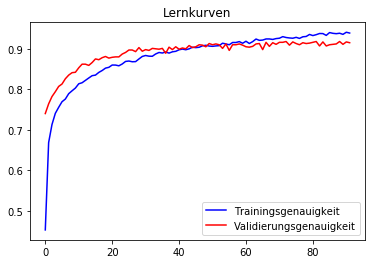

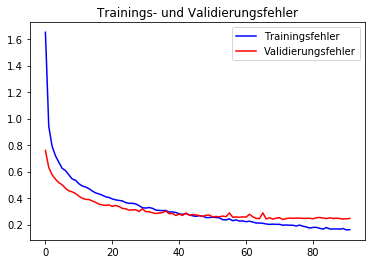

              precision    recall  f1-score   support

     T-shirt       0.83      0.87      0.85      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.84      0.86      0.85      1000
       Dress       0.90      0.90      0.90      1000
        Coat       0.84      0.83      0.84      1000
      Sandal       0.99      0.95      0.97      1000
       Shirt       0.71      0.69      0.70      1000
     Sneaker       0.89      0.98      0.94      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.98      0.92      0.95      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



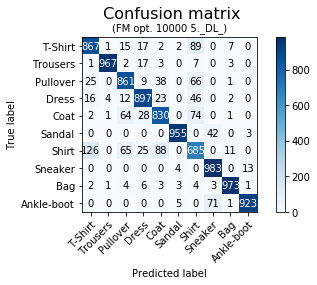

Die durchschnittliche Epochenanzahl beträgt:  90.6


In [77]:
# Trainingsmenge 10000
# optimierte Parameter: Dropoutrate: 0.3, Lernrate: 0.0001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1, 5, X_tr_10000, y_tr_10000, 0.3, 0.0001, False, 300, 10000)

In [0]:
downloader(10000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 10000 samples, validate on 10000 samples
Epoch 1/91
10000/10000 [==============================] - 34s 3ms/step - loss: 1.5813 - acc: 0.4690 - val_loss: 0.7923 - val_acc: 0.7270
Epoch 2/91
10000/10000 [==============================] - 4s 372us/step - loss: 0.9374 - acc: 0.6725 - val_loss: 0.6533 - val_acc: 0.7592
Epoch 3/91
10000/10000 [==============================] - 4s 370us/step - loss: 0.7995 - acc: 0.7109 - val_loss: 0.5968 - val_acc: 0.7750
Epoch 4/91
10000/10000 [==============================] - 4s 366us/step - loss: 0.7141 - acc: 0.7399 - val_loss: 0.5618 - val_acc: 0.7878
Epoch 5/91
10000/10000 [==============================] - 4s 366us/step - loss: 0.6761 - acc: 0.7519 - val_loss: 0.5426 - val_acc: 0.7959
Epoch 6/91
10000/10000 [==============================] - 4s 364us/step - loss: 0.6368 - acc: 0.7698 - val_loss: 0.5124 - val_acc: 0.8084
Epoch 7/91
10000/10

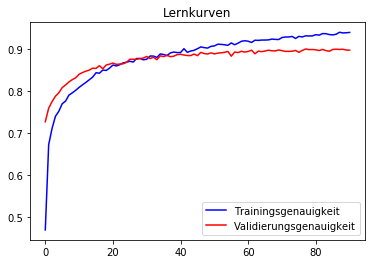

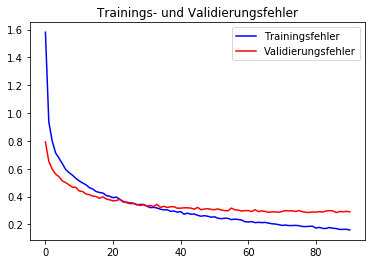

              precision    recall  f1-score   support

     T-shirt       0.88      0.82      0.85      1000
    Trousers       0.98      0.98      0.98      1000
    Pullover       0.87      0.85      0.86      1000
       Dress       0.90      0.90      0.90      1000
        Coat       0.87      0.80      0.83      1000
      Sandal       0.99      0.96      0.97      1000
       Shirt       0.66      0.79      0.72      1000
     Sneaker       0.92      0.98      0.95      1000
         Bag       0.99      0.96      0.98      1000
  Ankle-boot       0.97      0.95      0.96      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



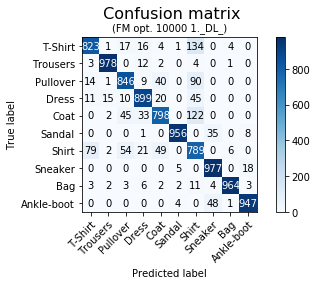

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 10000 samples, validate on 10000 samples
Epoch 1/91
10000/10000 [==============================] - 34s 3ms/step - loss: 1.5869 - acc: 0.4671 - val_loss: 0.7855 - val_acc: 0.7137
Epoch 2/91
10000/10000 [==============================] - 4s 374us/step - loss: 0.9459 - acc: 0.6684 - val_loss: 0.6491 - val_acc: 0.7609
Epoch 3/91
10000/10000 [==============================] - 4s 396us/step - loss: 0.7938 - acc: 0.7130 - val_loss: 0.6069 - val_acc: 0.7812
Epoch 4/91
10000/10000 [==============================] - 4s 386us/step - loss: 0.7293 - acc: 0.7286 - val_loss: 0.5594 - val_acc: 0.7962
Epoch 5/91
10000/10000 [==============================] - 4s 372us/step - loss: 0.6780 - acc: 0.7494 - val_loss: 0.5426 - val_acc: 0.8010
Epoch 6/91
10000/10000 [==============================] - 4s 372us/step - loss: 0.6373 - acc: 0.7639 - val_loss: 0.5068 - val_acc: 0.8169
Epoch 7/91
10000/10

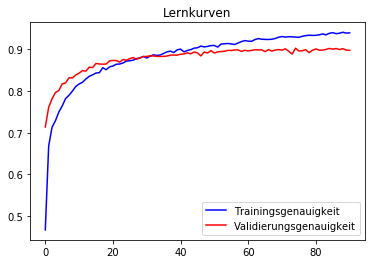

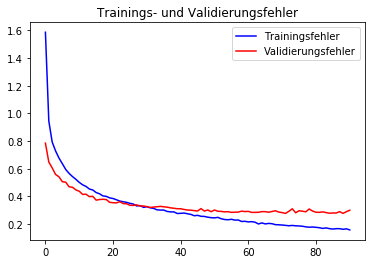

              precision    recall  f1-score   support

     T-shirt       0.84      0.86      0.85      1000
    Trousers       1.00      0.97      0.99      1000
    Pullover       0.80      0.91      0.85      1000
       Dress       0.89      0.92      0.90      1000
        Coat       0.88      0.77      0.82      1000
      Sandal       0.99      0.95      0.97      1000
       Shirt       0.74      0.69      0.71      1000
     Sneaker       0.91      0.98      0.94      1000
         Bag       0.96      0.98      0.97      1000
  Ankle-boot       0.98      0.94      0.96      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



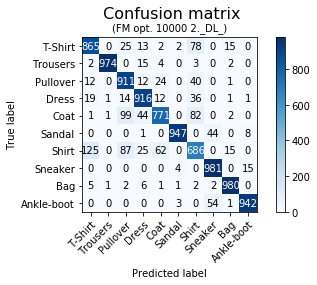

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 10000 samples, validate on 10000 samples
Epoch 1/91
10000/10000 [==============================] - 34s 3ms/step - loss: 1.6733 - acc: 0.4485 - val_loss: 0.8140 - val_acc: 0.7227
Epoch 2/91
10000/10000 [==============================] - 4s 374us/step - loss: 0.9641 - acc: 0.6672 - val_loss: 0.6601 - val_acc: 0.7596
Epoch 3/91
10000/10000 [==============================] - 4s 369us/step - loss: 0.8095 - acc: 0.7133 - val_loss: 0.6128 - val_acc: 0.7729
Epoch 4/91
10000/10000 [==============================] - 4s 367us/step - loss: 0.7266 - acc: 0.7379 - val_loss: 0.5746 - val_acc: 0.7888
Epoch 5/91
10000/10000 [==============================] - 4s 394us/step - loss: 0.6767 - acc: 0.7514 - val_loss: 0.5502 - val_acc: 0.7974
Epoch 6/91
10000/10000 [==============================] - 4s 383us/step - loss: 0.6357 - acc: 0.7673 - val_loss: 0.5401 - val_acc: 0.8055
Epoch 7/91
10000/10

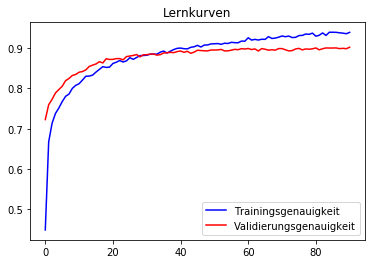

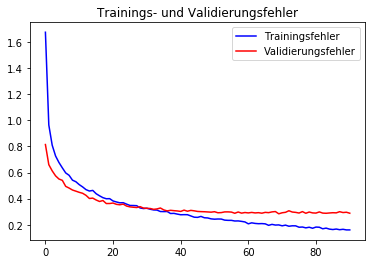

In [0]:
# Trainingsmenge 10000
# optimierte Parameter: Dropoutrate: 0.3, Lernrate: 0.0001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainieren, mit durchschnittlichen bester Epochenanzahl aus EarlyStopping
fullDataRuns(1, 5, X_tr_10000, y_tr_10000, X_test, y_test, 0.3, 0.0001, False, 91, 10000)

In [0]:
downloader_full(10000)

In [0]:
# Trainingsmenge 10000
# optimierte Parameter: Dropoutrate: 0.3, Lernrate: 0.0001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1, 5, X_tr_10000, y_tr_10000, 0.3, 0.0001, False, 300, 10000)

In [0]:
downloader(10000)

In [0]:
########################################################################################################################
###################   Wiederholtes Training mitoptimiertenHyperparametern unter Verwendung von 
###################   EarlyStopping 
###################   3. Aufteilung der Trainingsdaten
########################################################################################################################

X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500 = make_subsets_training_data_C(X_train, y_train)


***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 450 samples, validate on 50 samples
Epoch 1/300
450/450 [==============================] - 7s 16ms/step - loss: 2.4924 - acc: 0.2022 - val_loss: 1.2478 - val_acc: 0.6200
Epoch 2/300
450/450 [==============================] - 0s 264us/step - loss: 1.6049 - acc: 0.4711 - val_loss: 1.0114 - val_acc: 0.6200
Epoch 3/300
450/450 [==============================] - 0s 233us/step - loss: 1.3875 - acc: 0.5089 - val_loss: 0.8614 - val_acc: 0.6600
Epoch 4/300
450/450 [==============================] - 0s 229us/step - loss: 1.1791 - acc: 0.5978 - val_loss: 0.8026 - val_acc: 0.7600
Epoch 5/300
450/450 [==============================] - 0s 225us/step - loss: 1.1612 - acc: 0.5978 - val_loss: 0.7744 - val_acc: 0.7200
Epoch 6/300
450/450 [==============================] - 0s 237us/step - loss: 1.0490 - acc: 0.6422 - val_loss: 0.7438 - val_acc: 0.7400
Epoch 7/300
450/450 [===

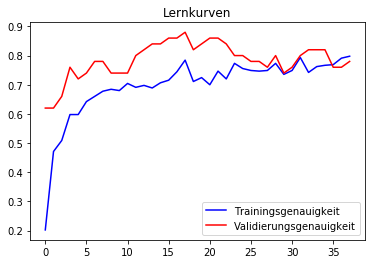

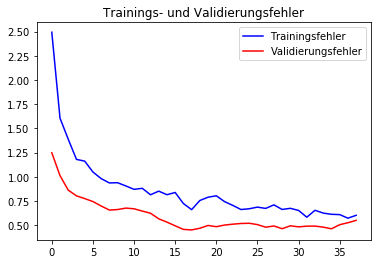

              precision    recall  f1-score   support

     T-shirt       0.68      0.80      0.74      1000
    Trousers       0.98      0.94      0.96      1000
    Pullover       0.50      0.65      0.56      1000
       Dress       0.77      0.81      0.79      1000
        Coat       0.56      0.65      0.60      1000
      Sandal       0.89      0.76      0.82      1000
       Shirt       0.35      0.10      0.15      1000
     Sneaker       0.77      0.87      0.81      1000
         Bag       0.90      0.90      0.90      1000
  Ankle-boot       0.86      0.95      0.90      1000

    accuracy                           0.74     10000
   macro avg       0.73      0.74      0.72     10000
weighted avg       0.73      0.74      0.72     10000



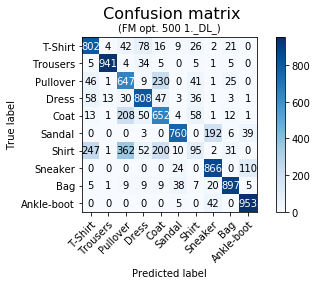

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 450 samples, validate on 50 samples
Epoch 1/300
450/450 [==============================] - 7s 17ms/step - loss: 2.4178 - acc: 0.2222 - val_loss: 1.5002 - val_acc: 0.5000
Epoch 2/300
450/450 [==============================] - 0s 236us/step - loss: 1.7041 - acc: 0.4111 - val_loss: 1.2767 - val_acc: 0.5200
Epoch 3/300
450/450 [==============================] - 0s 235us/step - loss: 1.3160 - acc: 0.5400 - val_loss: 1.1683 - val_acc: 0.5800
Epoch 4/300
450/450 [==============================] - 0s 274us/step - loss: 1.1643 - acc: 0.5978 - val_loss: 1.0085 - val_acc: 0.6600
Epoch 5/300
450/450 [==============================] - 0s 233us/step - loss: 1.1089 - acc: 0.6000 - val_loss: 0.8734 - val_acc: 0.7200
Epoch 6/300
450/450 [==============================] - 0s 234us/step - loss: 1.0493 - acc: 0.6178 - val_loss: 0.8482 - val_acc: 0.7400
Epoch 7/300
450/450 [===

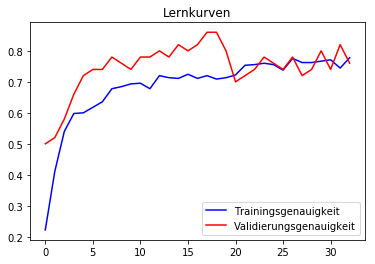

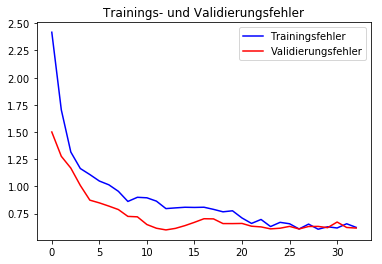

              precision    recall  f1-score   support

     T-shirt       0.66      0.79      0.72      1000
    Trousers       0.87      0.94      0.91      1000
    Pullover       0.45      0.77      0.57      1000
       Dress       0.76      0.71      0.73      1000
        Coat       0.58      0.56      0.57      1000
      Sandal       0.86      0.80      0.83      1000
       Shirt       0.24      0.03      0.06      1000
     Sneaker       0.80      0.82      0.81      1000
         Bag       0.93      0.83      0.88      1000
  Ankle-boot       0.84      0.96      0.89      1000

    accuracy                           0.72     10000
   macro avg       0.70      0.72      0.70     10000
weighted avg       0.70      0.72      0.70     10000



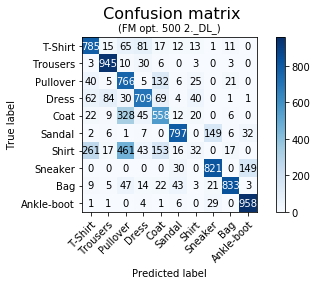

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 450 samples, validate on 50 samples
Epoch 1/300
450/450 [==============================] - 8s 18ms/step - loss: 2.4431 - acc: 0.2200 - val_loss: 1.2770 - val_acc: 0.5600
Epoch 2/300
450/450 [==============================] - 0s 267us/step - loss: 1.4742 - acc: 0.4556 - val_loss: 0.9997 - val_acc: 0.5800
Epoch 3/300
450/450 [==============================] - 0s 240us/step - loss: 1.2758 - acc: 0.5578 - val_loss: 0.9406 - val_acc: 0.6400
Epoch 4/300
450/450 [==============================] - 0s 254us/step - loss: 1.1900 - acc: 0.5889 - val_loss: 0.8489 - val_acc: 0.6200
Epoch 5/300
450/450 [==============================] - 0s 232us/step - loss: 0.9738 - acc: 0.6600 - val_loss: 0.7918 - val_acc: 0.7400
Epoch 6/300
450/450 [==============================] - 0s 228us/step - loss: 0.9562 - acc: 0.6511 - val_loss: 0.7996 - val_acc: 0.6800
Epoch 7/300
450/450 [===

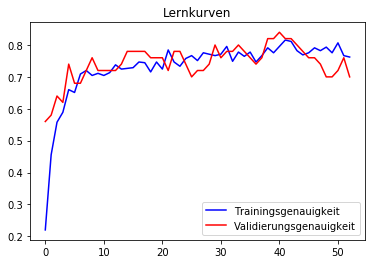

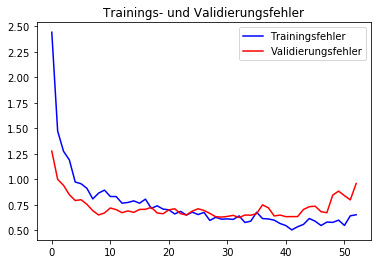

              precision    recall  f1-score   support

     T-shirt       0.61      0.85      0.71      1000
    Trousers       0.95      0.95      0.95      1000
    Pullover       0.56      0.51      0.53      1000
       Dress       0.85      0.71      0.78      1000
        Coat       0.53      0.74      0.62      1000
      Sandal       0.87      0.83      0.85      1000
       Shirt       0.40      0.11      0.17      1000
     Sneaker       0.84      0.84      0.84      1000
         Bag       0.81      0.92      0.86      1000
  Ankle-boot       0.87      0.95      0.91      1000

    accuracy                           0.74     10000
   macro avg       0.73      0.74      0.72     10000
weighted avg       0.73      0.74      0.72     10000



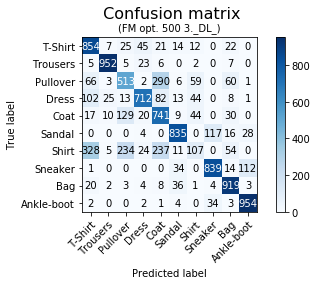

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 450 samples, validate on 50 samples
Epoch 1/300
450/450 [==============================] - 8s 18ms/step - loss: 2.5712 - acc: 0.1978 - val_loss: 1.4183 - val_acc: 0.5200
Epoch 2/300
450/450 [==============================] - 0s 280us/step - loss: 1.6659 - acc: 0.4378 - val_loss: 1.0916 - val_acc: 0.5800
Epoch 3/300
450/450 [==============================] - 0s 245us/step - loss: 1.3695 - acc: 0.5378 - val_loss: 1.0771 - val_acc: 0.5400
Epoch 4/300
450/450 [==============================] - 0s 234us/step - loss: 1.1659 - acc: 0.6222 - val_loss: 0.9199 - val_acc: 0.7000
Epoch 5/300
450/450 [==============================] - 0s 231us/step - loss: 1.1293 - acc: 0.6378 - val_loss: 0.7973 - val_acc: 0.7200
Epoch 6/300
450/450 [==============================] - 0s 230us/step - loss: 0.9819 - acc: 0.6444 - val_loss: 0.8386 - val_acc: 0.6800
Epoch 7/300
450/450 [===

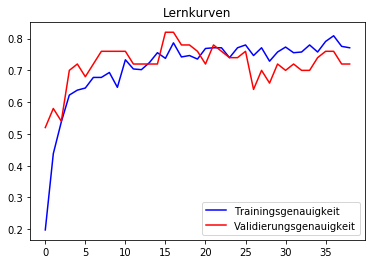

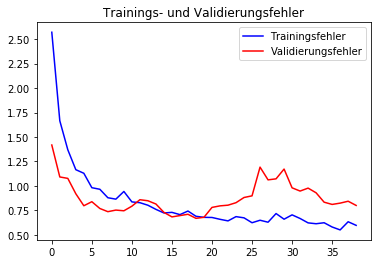

              precision    recall  f1-score   support

     T-shirt       0.65      0.77      0.70      1000
    Trousers       0.96      0.94      0.95      1000
    Pullover       0.51      0.61      0.56      1000
       Dress       0.78      0.72      0.75      1000
        Coat       0.60      0.58      0.59      1000
      Sandal       0.77      0.88      0.82      1000
       Shirt       0.33      0.23      0.27      1000
     Sneaker       0.81      0.84      0.83      1000
         Bag       0.95      0.80      0.87      1000
  Ankle-boot       0.90      0.93      0.91      1000

    accuracy                           0.73     10000
   macro avg       0.73      0.73      0.72     10000
weighted avg       0.73      0.73      0.72     10000



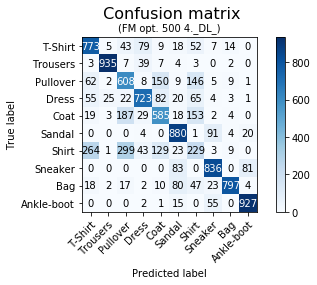

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 450 samples, validate on 50 samples
Epoch 1/300
450/450 [==============================] - 9s 19ms/step - loss: 2.3417 - acc: 0.2400 - val_loss: 1.3765 - val_acc: 0.6000
Epoch 2/300
450/450 [==============================] - 0s 270us/step - loss: 1.3748 - acc: 0.5489 - val_loss: 1.1484 - val_acc: 0.6400
Epoch 3/300
450/450 [==============================] - 0s 269us/step - loss: 1.1471 - acc: 0.6200 - val_loss: 1.0663 - val_acc: 0.6600
Epoch 4/300
450/450 [==============================] - 0s 237us/step - loss: 1.0966 - acc: 0.6333 - val_loss: 1.0449 - val_acc: 0.6400
Epoch 5/300
450/450 [==============================] - 0s 240us/step - loss: 0.9936 - acc: 0.6489 - val_loss: 1.0863 - val_acc: 0.6200
Epoch 6/300
450/450 [==============================] - 0s 241us/step - loss: 0.9803 - acc: 0.6733 - val_loss: 1.0694 - val_acc: 0.6400
Epoch 7/300
450/450 [===

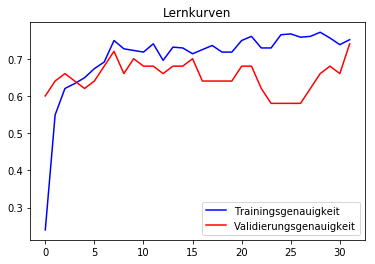

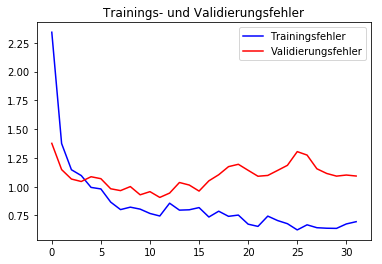

              precision    recall  f1-score   support

     T-shirt       0.67      0.68      0.67      1000
    Trousers       0.93      0.92      0.92      1000
    Pullover       0.53      0.49      0.51      1000
       Dress       0.79      0.70      0.74      1000
        Coat       0.53      0.37      0.44      1000
      Sandal       0.82      0.89      0.85      1000
       Shirt       0.28      0.43      0.34      1000
     Sneaker       0.75      0.90      0.82      1000
         Bag       0.97      0.73      0.83      1000
  Ankle-boot       0.95      0.86      0.90      1000

    accuracy                           0.70     10000
   macro avg       0.72      0.70      0.70     10000
weighted avg       0.72      0.70      0.70     10000



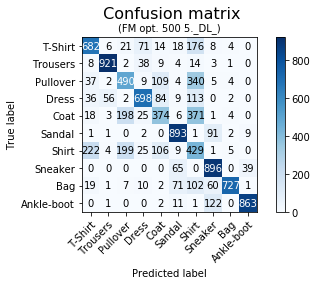

Die durchschnittliche Epochenanzahl beträgt:  19.0


In [0]:
# Trainingsmenge 500
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.001, mit SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1, 5, X_tr_500, y_tr_500, 0.4, 0.001, False, 300, 500)

In [0]:
downloader(500)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/19
500/500 [==============================] - 22s 44ms/step - loss: 2.4915 - acc: 0.2240 - val_loss: 1.2996 - val_acc: 0.5614
Epoch 2/19
500/500 [==============================] - 1s 2ms/step - loss: 1.4313 - acc: 0.4980 - val_loss: 0.9747 - val_acc: 0.6632
Epoch 3/19
500/500 [==============================] - 1s 2ms/step - loss: 1.0725 - acc: 0.6260 - val_loss: 0.8648 - val_acc: 0.7000
Epoch 4/19
500/500 [==============================] - 1s 3ms/step - loss: 0.8801 - acc: 0.6700 - val_loss: 0.8235 - val_acc: 0.7157
Epoch 5/19
500/500 [==============================] - 1s 2ms/step - loss: 0.8470 - acc: 0.7020 - val_loss: 0.7701 - val_acc: 0.7303
Epoch 6/19
500/500 [==============================] - 1s 2ms/step - loss: 0.7932 - acc: 0.7000 - val_loss: 0.7505 - val_acc: 0.7332
Epoch 7/19
500/500 [==============================] - 

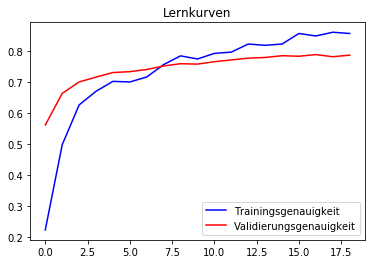

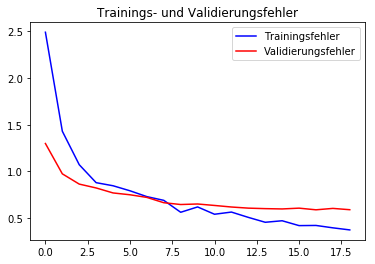

              precision    recall  f1-score   support

     T-shirt       0.71      0.78      0.75      1000
    Trousers       0.99      0.93      0.96      1000
    Pullover       0.75      0.51      0.61      1000
       Dress       0.89      0.73      0.80      1000
        Coat       0.60      0.75      0.67      1000
      Sandal       0.96      0.87      0.91      1000
       Shirt       0.41      0.49      0.45      1000
     Sneaker       0.87      0.91      0.89      1000
         Bag       0.92      0.94      0.93      1000
  Ankle-boot       0.92      0.94      0.93      1000

    accuracy                           0.79     10000
   macro avg       0.80      0.79      0.79     10000
weighted avg       0.80      0.79      0.79     10000



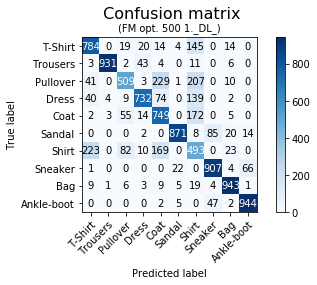

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/19
500/500 [==============================] - 22s 45ms/step - loss: 2.4167 - acc: 0.2560 - val_loss: 1.2856 - val_acc: 0.5988
Epoch 2/19
500/500 [==============================] - 1s 2ms/step - loss: 1.4395 - acc: 0.4880 - val_loss: 0.9839 - val_acc: 0.6606
Epoch 3/19
500/500 [==============================] - 1s 2ms/step - loss: 1.1122 - acc: 0.6200 - val_loss: 0.8914 - val_acc: 0.6956
Epoch 4/19
500/500 [==============================] - 1s 2ms/step - loss: 0.9640 - acc: 0.6580 - val_loss: 0.8089 - val_acc: 0.7156
Epoch 5/19
500/500 [==============================] - 1s 2ms/step - loss: 0.8578 - acc: 0.6760 - val_loss: 0.7858 - val_acc: 0.7200
Epoch 6/19
500/500 [==============================] - 1s 2ms/step - loss: 0.7429 - acc: 0.7560 - val_loss: 0.7606 - val_acc: 0.7281
Epoch 7/19
500/500 [==============================] - 

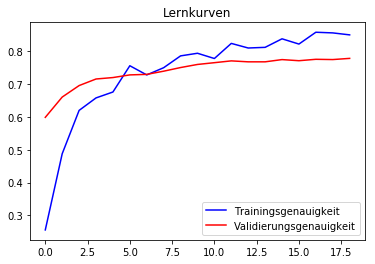

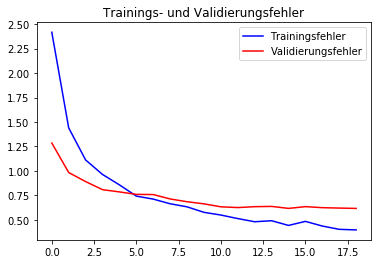

              precision    recall  f1-score   support

     T-shirt       0.69      0.84      0.76      1000
    Trousers       0.97      0.95      0.96      1000
    Pullover       0.72      0.48      0.57      1000
       Dress       0.87      0.75      0.81      1000
        Coat       0.58      0.77      0.66      1000
      Sandal       0.94      0.86      0.90      1000
       Shirt       0.43      0.35      0.39      1000
     Sneaker       0.85      0.86      0.86      1000
         Bag       0.87      0.95      0.91      1000
  Ankle-boot       0.88      0.95      0.91      1000

    accuracy                           0.78     10000
   macro avg       0.78      0.78      0.77     10000
weighted avg       0.78      0.78      0.77     10000



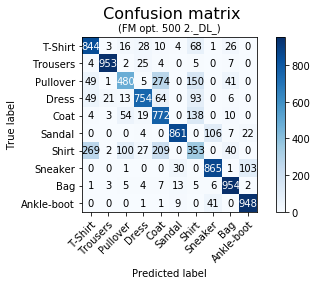

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/19
500/500 [==============================] - 23s 45ms/step - loss: 2.4163 - acc: 0.2200 - val_loss: 1.2373 - val_acc: 0.5872
Epoch 2/19
500/500 [==============================] - 1s 2ms/step - loss: 1.4438 - acc: 0.5160 - val_loss: 1.0430 - val_acc: 0.6506
Epoch 3/19
500/500 [==============================] - 1s 2ms/step - loss: 1.0254 - acc: 0.6320 - val_loss: 0.9873 - val_acc: 0.6838
Epoch 4/19
500/500 [==============================] - 1s 2ms/step - loss: 0.9906 - acc: 0.6720 - val_loss: 0.9406 - val_acc: 0.7016
Epoch 5/19
500/500 [==============================] - 1s 2ms/step - loss: 0.8257 - acc: 0.7000 - val_loss: 0.8185 - val_acc: 0.7266
Epoch 6/19
500/500 [==============================] - 1s 2ms/step - loss: 0.7320 - acc: 0.7360 - val_loss: 0.7732 - val_acc: 0.7325
Epoch 7/19
500/500 [==============================] - 

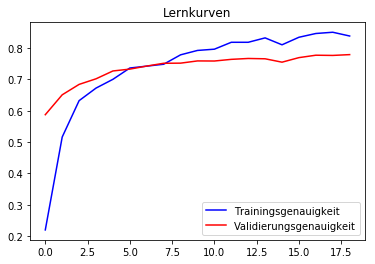

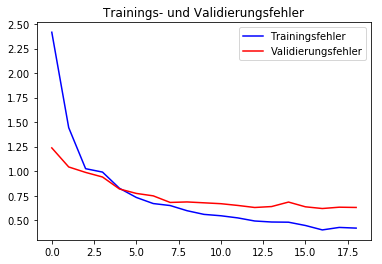

              precision    recall  f1-score   support

     T-shirt       0.74      0.75      0.75      1000
    Trousers       0.99      0.92      0.96      1000
    Pullover       0.75      0.56      0.64      1000
       Dress       0.87      0.68      0.76      1000
        Coat       0.56      0.81      0.67      1000
      Sandal       0.85      0.92      0.88      1000
       Shirt       0.44      0.43      0.43      1000
     Sneaker       0.90      0.83      0.87      1000
         Bag       0.88      0.93      0.91      1000
  Ankle-boot       0.90      0.95      0.92      1000

    accuracy                           0.78     10000
   macro avg       0.79      0.78      0.78     10000
weighted avg       0.79      0.78      0.78     10000



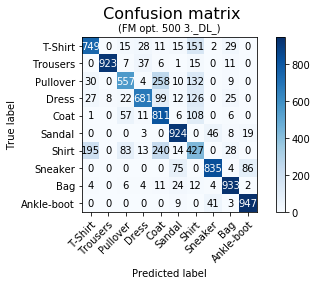

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/19
500/500 [==============================] - 23s 46ms/step - loss: 2.3496 - acc: 0.2540 - val_loss: 1.3284 - val_acc: 0.5527
Epoch 2/19
500/500 [==============================] - 1s 2ms/step - loss: 1.3984 - acc: 0.5100 - val_loss: 0.9202 - val_acc: 0.6783
Epoch 3/19
500/500 [==============================] - 1s 2ms/step - loss: 1.0612 - acc: 0.6320 - val_loss: 0.8796 - val_acc: 0.6950
Epoch 4/19
500/500 [==============================] - 1s 2ms/step - loss: 0.8894 - acc: 0.6820 - val_loss: 0.8156 - val_acc: 0.7130
Epoch 5/19
500/500 [==============================] - 1s 2ms/step - loss: 0.8240 - acc: 0.7140 - val_loss: 0.7657 - val_acc: 0.7246
Epoch 6/19
500/500 [==============================] - 1s 2ms/step - loss: 0.8393 - acc: 0.6920 - val_loss: 0.7317 - val_acc: 0.7331
Epoch 7/19
500/500 [==============================] - 

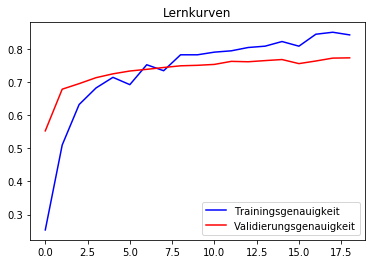

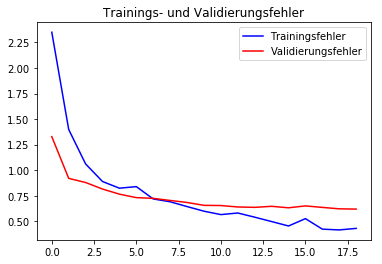

              precision    recall  f1-score   support

     T-shirt       0.76      0.72      0.74      1000
    Trousers       0.97      0.94      0.95      1000
    Pullover       0.73      0.48      0.58      1000
       Dress       0.86      0.74      0.80      1000
        Coat       0.56      0.75      0.64      1000
      Sandal       0.95      0.84      0.89      1000
       Shirt       0.41      0.48      0.44      1000
     Sneaker       0.85      0.86      0.86      1000
         Bag       0.93      0.94      0.93      1000
  Ankle-boot       0.86      0.96      0.91      1000

    accuracy                           0.77     10000
   macro avg       0.79      0.77      0.77     10000
weighted avg       0.79      0.77      0.77     10000



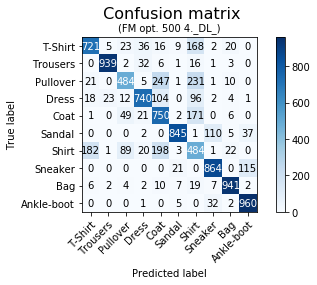

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 500 samples, validate on 10000 samples
Epoch 1/19
500/500 [==============================] - 23s 47ms/step - loss: 2.4250 - acc: 0.2240 - val_loss: 1.2497 - val_acc: 0.5880
Epoch 2/19
500/500 [==============================] - 1s 2ms/step - loss: 1.4299 - acc: 0.5180 - val_loss: 0.9719 - val_acc: 0.6657
Epoch 3/19
500/500 [==============================] - 1s 2ms/step - loss: 1.1151 - acc: 0.6280 - val_loss: 1.0128 - val_acc: 0.6678
Epoch 4/19
500/500 [==============================] - 1s 2ms/step - loss: 0.9298 - acc: 0.6760 - val_loss: 0.9435 - val_acc: 0.6880
Epoch 5/19
500/500 [==============================] - 1s 2ms/step - loss: 0.9091 - acc: 0.7060 - val_loss: 0.8773 - val_acc: 0.7028
Epoch 6/19
500/500 [==============================] - 1s 2ms/step - loss: 0.8137 - acc: 0.7160 - val_loss: 0.7919 - val_acc: 0.7224
Epoch 7/19
500/500 [==============================] - 

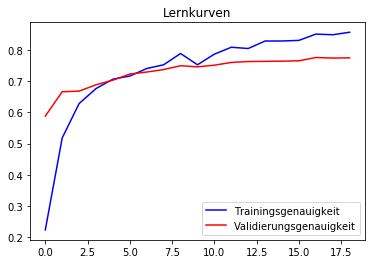

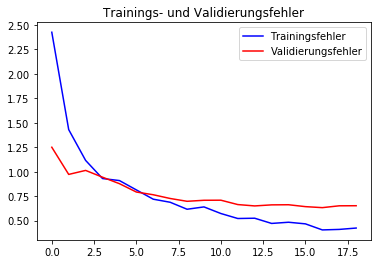

              precision    recall  f1-score   support

     T-shirt       0.69      0.83      0.75      1000
    Trousers       0.97      0.95      0.96      1000
    Pullover       0.62      0.54      0.58      1000
       Dress       0.86      0.75      0.80      1000
        Coat       0.57      0.76      0.65      1000
      Sandal       0.95      0.85      0.89      1000
       Shirt       0.44      0.24      0.31      1000
     Sneaker       0.84      0.92      0.88      1000
         Bag       0.83      0.96      0.89      1000
  Ankle-boot       0.92      0.93      0.93      1000

    accuracy                           0.77     10000
   macro avg       0.77      0.77      0.76     10000
weighted avg       0.77      0.77      0.76     10000



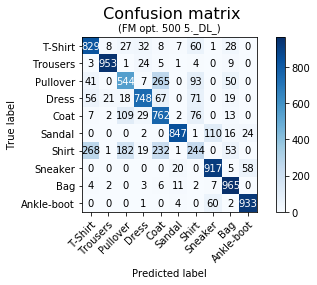

In [61]:
# Trainingsmenge 500
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainieren, mit durchschnittlichen bester Epochenanzahl aus EarlyStopping
fullDataRuns(1, 5, X_tr_500, y_tr_500, X_test, y_test, 0.4, 0.001, False, 19, 500)

In [0]:
downloader_full(500)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
8/8 [==============================] - 9s 1s/step - loss: 2.7000 - acc: 0.1507 - val_loss: 1.5117 - val_acc: 0.5000
Epoch 2/300
8/8 [==============================] - 0s 15ms/step - loss: 2.2309 - acc: 0.2717 - val_loss: 1.2382 - val_acc: 0.5800
Epoch 3/300
8/8 [==============================] - 0s 31ms/step - loss: 1.6796 - acc: 0.4586 - val_loss: 1.0076 - val_acc: 0.6200
Epoch 4/300
8/8 [==============================] - 0s 25ms/step - loss: 1.5720 - acc: 0.4465 - val_loss: 0.9161 - val_acc: 0.6800
Epoch 5/300
8/8 [==============================] - 0s 25ms/step - loss: 1.4825 - acc: 0.4482 - val_loss: 0.8295 - val_acc: 0.7000
Epoch 6/300
8/8 [==============================] - 0s 24ms/step - loss: 1.4686 - acc: 0.5040 - val_loss: 0.7605 - val_acc: 0.6800
Epoch 7/300
8/8 [==============================] - 0s 24ms/step - loss: 1.4632

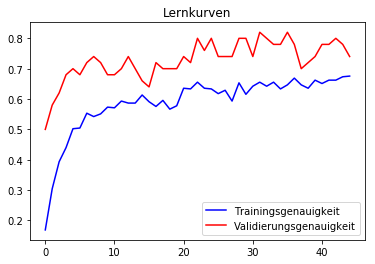

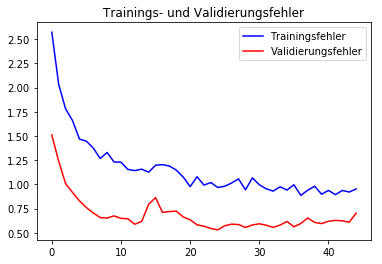

              precision    recall  f1-score   support

     T-shirt       0.70      0.78      0.73      1000
    Trousers       0.94      0.94      0.94      1000
    Pullover       0.51      0.63      0.56      1000
       Dress       0.73      0.77      0.75      1000
        Coat       0.60      0.61      0.60      1000
      Sandal       0.80      0.79      0.80      1000
       Shirt       0.39      0.19      0.26      1000
     Sneaker       0.70      0.96      0.81      1000
         Bag       0.93      0.82      0.87      1000
  Ankle-boot       0.95      0.80      0.87      1000

    accuracy                           0.73     10000
   macro avg       0.72      0.73      0.72     10000
weighted avg       0.72      0.73      0.72     10000



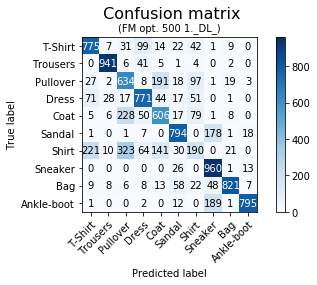

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
8/8 [==============================] - 9s 1s/step - loss: 2.6125 - acc: 0.1906 - val_loss: 1.6901 - val_acc: 0.3000
Epoch 2/300
8/8 [==============================] - 0s 17ms/step - loss: 2.3036 - acc: 0.3074 - val_loss: 1.4907 - val_acc: 0.5000
Epoch 3/300
8/8 [==============================] - 0s 22ms/step - loss: 1.7033 - acc: 0.3890 - val_loss: 1.3449 - val_acc: 0.5800
Epoch 4/300
8/8 [==============================] - 0s 23ms/step - loss: 1.8849 - acc: 0.3768 - val_loss: 1.4043 - val_acc: 0.5600
Epoch 5/300
8/8 [==============================] - 0s 26ms/step - loss: 1.5863 - acc: 0.4722 - val_loss: 1.6984 - val_acc: 0.4800
Epoch 6/300
8/8 [==============================] - 0s 23ms/step - loss: 1.6642 - acc: 0.4941 - val_loss: 1.7177 - val_acc: 0.4600
Epoch 7/300
8/8 [==============================] - 0s 27ms/step - loss: 1.4882

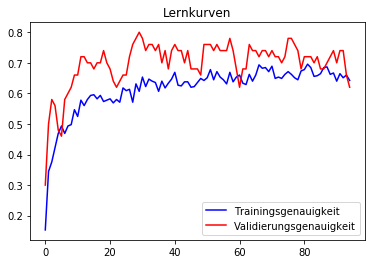

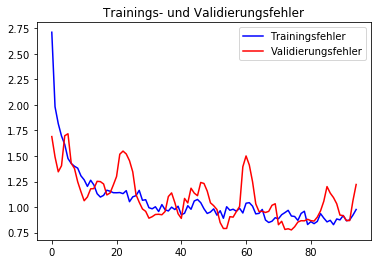

              precision    recall  f1-score   support

     T-shirt       0.75      0.74      0.74      1000
    Trousers       0.63      0.97      0.76      1000
    Pullover       0.38      0.92      0.54      1000
       Dress       0.70      0.39      0.50      1000
        Coat       0.60      0.24      0.35      1000
      Sandal       0.86      0.80      0.83      1000
       Shirt       0.37      0.04      0.07      1000
     Sneaker       0.81      0.82      0.82      1000
         Bag       0.95      0.85      0.90      1000
  Ankle-boot       0.83      0.97      0.89      1000

    accuracy                           0.67     10000
   macro avg       0.69      0.67      0.64     10000
weighted avg       0.69      0.67      0.64     10000



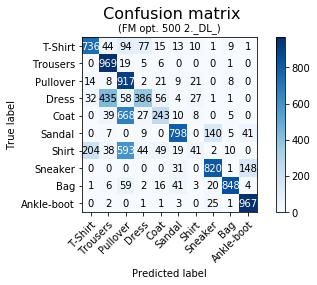

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
8/8 [==============================] - 10s 1s/step - loss: 2.6760 - acc: 0.2144 - val_loss: 1.5230 - val_acc: 0.5200
Epoch 2/300
8/8 [==============================] - 0s 15ms/step - loss: 1.8037 - acc: 0.3813 - val_loss: 1.1827 - val_acc: 0.6200
Epoch 3/300
8/8 [==============================] - 0s 31ms/step - loss: 1.8450 - acc: 0.3751 - val_loss: 1.0861 - val_acc: 0.5600
Epoch 4/300
8/8 [==============================] - 0s 24ms/step - loss: 1.6437 - acc: 0.4264 - val_loss: 1.2054 - val_acc: 0.5600
Epoch 5/300
8/8 [==============================] - 0s 27ms/step - loss: 1.5477 - acc: 0.4960 - val_loss: 1.0650 - val_acc: 0.6600
Epoch 6/300
8/8 [==============================] - 0s 22ms/step - loss: 1.4425 - acc: 0.5059 - val_loss: 0.9111 - val_acc: 0.6600
Epoch 7/300
8/8 [==============================] - 0s 24ms/step - loss: 1.505

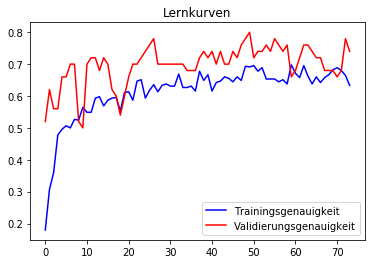

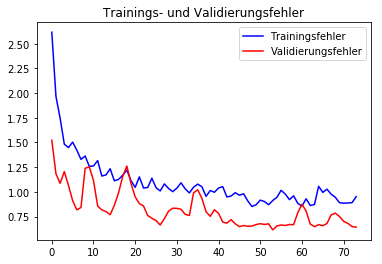

              precision    recall  f1-score   support

     T-shirt       0.73      0.78      0.76      1000
    Trousers       0.94      0.92      0.93      1000
    Pullover       0.48      0.65      0.55      1000
       Dress       0.76      0.76      0.76      1000
        Coat       0.58      0.53      0.55      1000
      Sandal       0.82      0.77      0.79      1000
       Shirt       0.31      0.09      0.14      1000
     Sneaker       0.79      0.83      0.81      1000
         Bag       0.75      0.91      0.82      1000
  Ankle-boot       0.82      0.97      0.89      1000

    accuracy                           0.72     10000
   macro avg       0.70      0.72      0.70     10000
weighted avg       0.70      0.72      0.70     10000



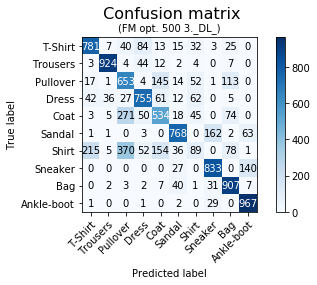

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
8/8 [==============================] - 10s 1s/step - loss: 2.5522 - acc: 0.1527 - val_loss: 1.7332 - val_acc: 0.4200
Epoch 2/300
8/8 [==============================] - 0s 16ms/step - loss: 1.9990 - acc: 0.3612 - val_loss: 1.3989 - val_acc: 0.5000
Epoch 3/300
8/8 [==============================] - 0s 30ms/step - loss: 1.8733 - acc: 0.3212 - val_loss: 1.2999 - val_acc: 0.5800
Epoch 4/300
8/8 [==============================] - 0s 22ms/step - loss: 1.7081 - acc: 0.4544 - val_loss: 1.2565 - val_acc: 0.6400
Epoch 5/300
8/8 [==============================] - 0s 24ms/step - loss: 1.4824 - acc: 0.4584 - val_loss: 1.3590 - val_acc: 0.5400
Epoch 6/300
8/8 [==============================] - 0s 24ms/step - loss: 1.8158 - acc: 0.4323 - val_loss: 1.4871 - val_acc: 0.4800
Epoch 7/300
8/8 [==============================] - 0s 28ms/step - loss: 1.637

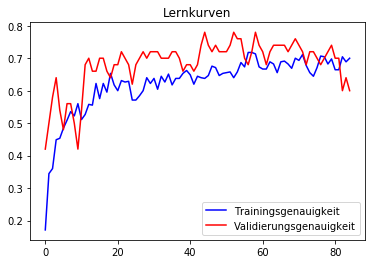

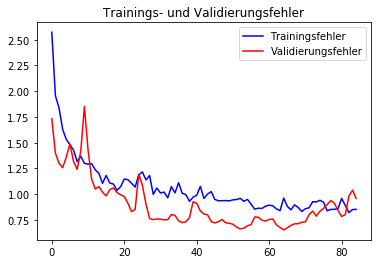

              precision    recall  f1-score   support

     T-shirt       0.76      0.70      0.73      1000
    Trousers       0.92      0.95      0.94      1000
    Pullover       0.47      0.63      0.54      1000
       Dress       0.78      0.73      0.75      1000
        Coat       0.58      0.54      0.56      1000
      Sandal       0.85      0.83      0.84      1000
       Shirt       0.33      0.26      0.29      1000
     Sneaker       0.82      0.85      0.84      1000
         Bag       0.93      0.87      0.90      1000
  Ankle-boot       0.87      0.96      0.91      1000

    accuracy                           0.73     10000
   macro avg       0.73      0.73      0.73     10000
weighted avg       0.73      0.73      0.73     10000



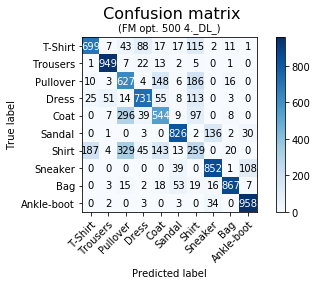

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
8/8 [==============================] - 10s 1s/step - loss: 2.7484 - acc: 0.1705 - val_loss: 1.9732 - val_acc: 0.3200
Epoch 2/300
8/8 [==============================] - 0s 17ms/step - loss: 1.9377 - acc: 0.3632 - val_loss: 1.9883 - val_acc: 0.4200
Epoch 3/300
8/8 [==============================] - 0s 19ms/step - loss: 1.5409 - acc: 0.4425 - val_loss: 1.7627 - val_acc: 0.5000
Epoch 4/300
8/8 [==============================] - 0s 24ms/step - loss: 1.4857 - acc: 0.5159 - val_loss: 1.6003 - val_acc: 0.5600
Epoch 5/300
8/8 [==============================] - 0s 23ms/step - loss: 1.4136 - acc: 0.4224 - val_loss: 1.5574 - val_acc: 0.5200
Epoch 6/300
8/8 [==============================] - 0s 24ms/step - loss: 1.2964 - acc: 0.5796 - val_loss: 1.6504 - val_acc: 0.5600
Epoch 7/300
8/8 [==============================] - 0s 26ms/step - loss: 1.365

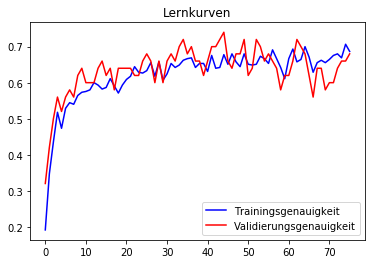

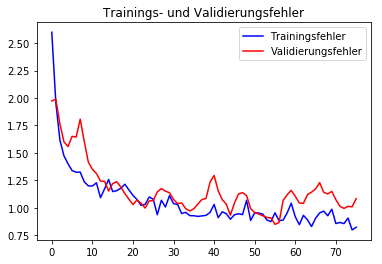

              precision    recall  f1-score   support

     T-shirt       0.75      0.69      0.72      1000
    Trousers       0.94      0.94      0.94      1000
    Pullover       0.51      0.51      0.51      1000
       Dress       0.78      0.71      0.75      1000
        Coat       0.56      0.62      0.59      1000
      Sandal       0.86      0.82      0.84      1000
       Shirt       0.31      0.34      0.32      1000
     Sneaker       0.81      0.84      0.83      1000
         Bag       0.94      0.82      0.88      1000
  Ankle-boot       0.86      0.95      0.90      1000

    accuracy                           0.72     10000
   macro avg       0.73      0.72      0.73     10000
weighted avg       0.73      0.72      0.73     10000



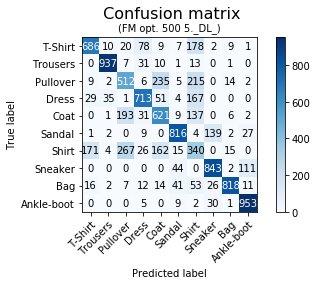

Die durchschnittliche Epochenanzahl beträgt:  55.0


In [0]:
# Trainingsmenge 500
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.001, mit SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1, 5, X_tr_500, y_tr_500, 0.4, 0.001, False, 300, 500)

In [0]:
downloader(500)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 900 samples, validate on 100 samples
Epoch 1/300
900/900 [==============================] - 11s 12ms/step - loss: 2.7230 - acc: 0.1278 - val_loss: 2.0095 - val_acc: 0.2200
Epoch 2/300
900/900 [==============================] - 0s 247us/step - loss: 2.1629 - acc: 0.2500 - val_loss: 1.6961 - val_acc: 0.4200
Epoch 3/300
900/900 [==============================] - 0s 246us/step - loss: 1.9045 - acc: 0.3456 - val_loss: 1.4851 - val_acc: 0.5300
Epoch 4/300
900/900 [==============================] - 0s 249us/step - loss: 1.7194 - acc: 0.4056 - val_loss: 1.3353 - val_acc: 0.5700
Epoch 5/300
900/900 [==============================] - 0s 234us/step - loss: 1.4782 - acc: 0.4978 - val_loss: 1.2316 - val_acc: 0.6000
Epoch 6/300
900/900 [==============================] - 0s 210us/step - loss: 1.4253 - acc: 0.5156 - val_loss: 1.1695 - val_acc: 0.6200
Epoch 7/300
900/900 [=

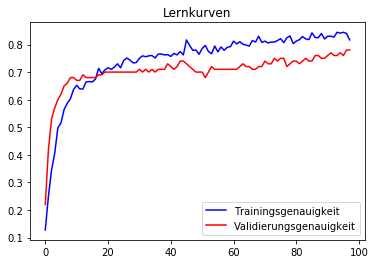

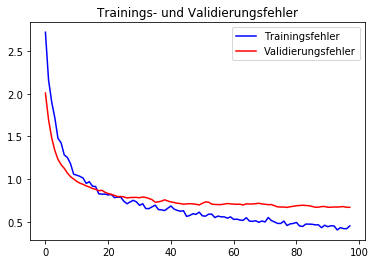

              precision    recall  f1-score   support

     T-shirt       0.77      0.79      0.78      1000
    Trousers       0.98      0.93      0.96      1000
    Pullover       0.72      0.60      0.65      1000
       Dress       0.81      0.83      0.82      1000
        Coat       0.61      0.79      0.69      1000
      Sandal       0.97      0.74      0.84      1000
       Shirt       0.48      0.43      0.45      1000
     Sneaker       0.77      0.91      0.84      1000
         Bag       0.95      0.93      0.94      1000
  Ankle-boot       0.89      0.95      0.92      1000

    accuracy                           0.79     10000
   macro avg       0.79      0.79      0.79     10000
weighted avg       0.79      0.79      0.79     10000



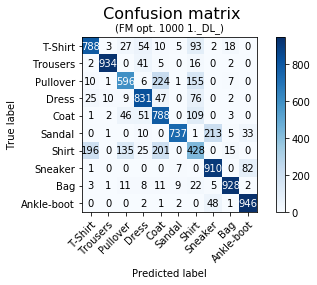

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 900 samples, validate on 100 samples
Epoch 1/300
900/900 [==============================] - 11s 12ms/step - loss: 2.7693 - acc: 0.1444 - val_loss: 1.9757 - val_acc: 0.3400
Epoch 2/300
900/900 [==============================] - 0s 267us/step - loss: 2.2595 - acc: 0.2589 - val_loss: 1.6676 - val_acc: 0.4400
Epoch 3/300
900/900 [==============================] - 0s 243us/step - loss: 1.9990 - acc: 0.3278 - val_loss: 1.4644 - val_acc: 0.5300
Epoch 4/300
900/900 [==============================] - 0s 245us/step - loss: 1.7490 - acc: 0.3911 - val_loss: 1.3355 - val_acc: 0.5500
Epoch 5/300
900/900 [==============================] - 0s 243us/step - loss: 1.6401 - acc: 0.4733 - val_loss: 1.2344 - val_acc: 0.6500
Epoch 6/300
900/900 [==============================] - 0s 230us/step - loss: 1.4571 - acc: 0.4922 - val_loss: 1.1551 - val_acc: 0.6700
Epoch 7/300
900/900 [=

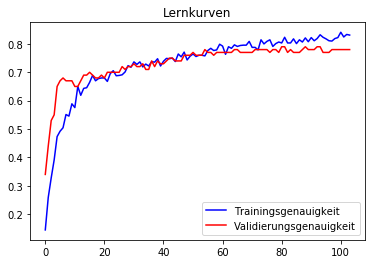

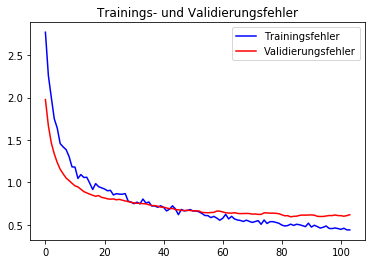

              precision    recall  f1-score   support

     T-shirt       0.71      0.84      0.77      1000
    Trousers       0.97      0.94      0.96      1000
    Pullover       0.63      0.62      0.62      1000
       Dress       0.82      0.82      0.82      1000
        Coat       0.62      0.69      0.66      1000
      Sandal       0.97      0.79      0.87      1000
       Shirt       0.40      0.30      0.34      1000
     Sneaker       0.81      0.90      0.85      1000
         Bag       0.92      0.94      0.93      1000
  Ankle-boot       0.89      0.96      0.93      1000

    accuracy                           0.78     10000
   macro avg       0.78      0.78      0.77     10000
weighted avg       0.78      0.78      0.77     10000



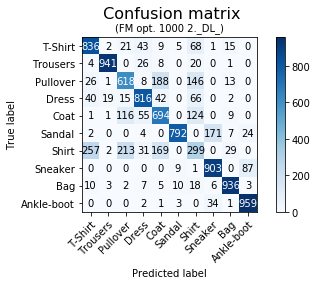

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 900 samples, validate on 100 samples
Epoch 1/300
900/900 [==============================] - 11s 12ms/step - loss: 2.8839 - acc: 0.1333 - val_loss: 1.9264 - val_acc: 0.3600
Epoch 2/300
900/900 [==============================] - 0s 323us/step - loss: 2.3939 - acc: 0.2300 - val_loss: 1.5825 - val_acc: 0.5100
Epoch 3/300
900/900 [==============================] - 0s 277us/step - loss: 1.9356 - acc: 0.3433 - val_loss: 1.3660 - val_acc: 0.5500
Epoch 4/300
900/900 [==============================] - 0s 235us/step - loss: 1.7780 - acc: 0.4211 - val_loss: 1.2212 - val_acc: 0.6200
Epoch 5/300
900/900 [==============================] - 0s 225us/step - loss: 1.5856 - acc: 0.4711 - val_loss: 1.1242 - val_acc: 0.6200
Epoch 6/300
900/900 [==============================] - 0s 229us/step - loss: 1.4599 - acc: 0.4933 - val_loss: 1.0581 - val_acc: 0.6300
Epoch 7/300
900/900 [=

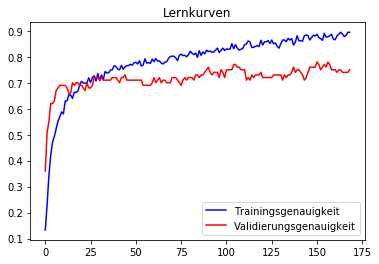

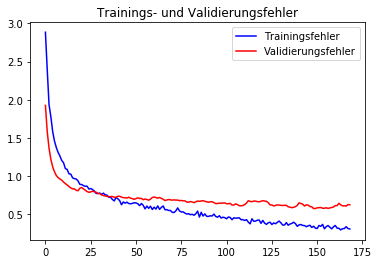

              precision    recall  f1-score   support

     T-shirt       0.78      0.81      0.80      1000
    Trousers       0.97      0.95      0.96      1000
    Pullover       0.66      0.71      0.68      1000
       Dress       0.84      0.83      0.84      1000
        Coat       0.67      0.71      0.69      1000
      Sandal       0.96      0.84      0.90      1000
       Shirt       0.51      0.43      0.47      1000
     Sneaker       0.84      0.90      0.87      1000
         Bag       0.93      0.95      0.94      1000
  Ankle-boot       0.90      0.95      0.92      1000

    accuracy                           0.81     10000
   macro avg       0.81      0.81      0.81     10000
weighted avg       0.81      0.81      0.81     10000



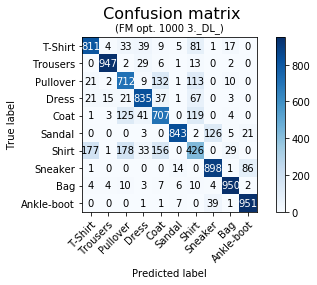

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 900 samples, validate on 100 samples
Epoch 1/300
900/900 [==============================] - 12s 13ms/step - loss: 2.7134 - acc: 0.1444 - val_loss: 1.9311 - val_acc: 0.3600
Epoch 2/300
900/900 [==============================] - 0s 254us/step - loss: 2.2658 - acc: 0.2556 - val_loss: 1.6181 - val_acc: 0.5200
Epoch 3/300
900/900 [==============================] - 0s 259us/step - loss: 2.0137 - acc: 0.3322 - val_loss: 1.4265 - val_acc: 0.5900
Epoch 4/300
900/900 [==============================] - 0s 250us/step - loss: 1.6771 - acc: 0.4356 - val_loss: 1.2791 - val_acc: 0.5700
Epoch 5/300
900/900 [==============================] - 0s 265us/step - loss: 1.5798 - acc: 0.4689 - val_loss: 1.1674 - val_acc: 0.6100
Epoch 6/300
900/900 [==============================] - 0s 234us/step - loss: 1.3815 - acc: 0.5067 - val_loss: 1.0869 - val_acc: 0.6500
Epoch 7/300
900/900 [=

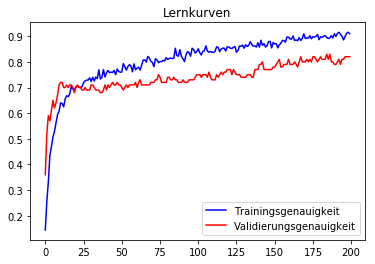

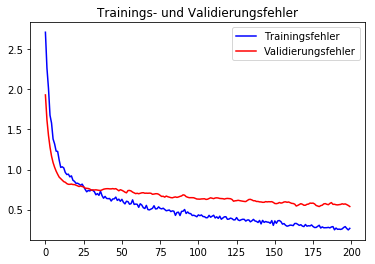

              precision    recall  f1-score   support

     T-shirt       0.75      0.84      0.79      1000
    Trousers       0.99      0.94      0.97      1000
    Pullover       0.72      0.67      0.70      1000
       Dress       0.85      0.83      0.84      1000
        Coat       0.69      0.73      0.71      1000
      Sandal       0.97      0.84      0.90      1000
       Shirt       0.52      0.48      0.50      1000
     Sneaker       0.85      0.91      0.87      1000
         Bag       0.93      0.95      0.94      1000
  Ankle-boot       0.89      0.96      0.93      1000

    accuracy                           0.82     10000
   macro avg       0.82      0.82      0.81     10000
weighted avg       0.82      0.82      0.81     10000



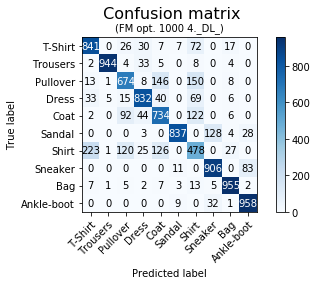

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 900 samples, validate on 100 samples
Epoch 1/300
900/900 [==============================] - 12s 13ms/step - loss: 2.8401 - acc: 0.1100 - val_loss: 2.0217 - val_acc: 0.2800
Epoch 2/300
900/900 [==============================] - 0s 270us/step - loss: 2.3131 - acc: 0.2378 - val_loss: 1.7568 - val_acc: 0.4400
Epoch 3/300
900/900 [==============================] - 0s 236us/step - loss: 1.9352 - acc: 0.3289 - val_loss: 1.5483 - val_acc: 0.5300
Epoch 4/300
900/900 [==============================] - 0s 227us/step - loss: 1.7710 - acc: 0.3767 - val_loss: 1.4071 - val_acc: 0.5700
Epoch 5/300
900/900 [==============================] - 0s 210us/step - loss: 1.5666 - acc: 0.4767 - val_loss: 1.3020 - val_acc: 0.5900
Epoch 6/300
900/900 [==============================] - 0s 245us/step - loss: 1.4338 - acc: 0.5089 - val_loss: 1.2260 - val_acc: 0.6200
Epoch 7/300
900/900 [=

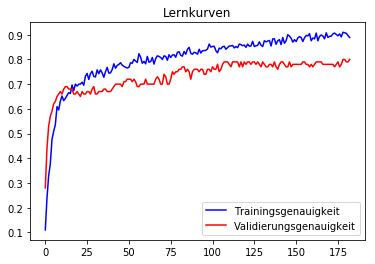

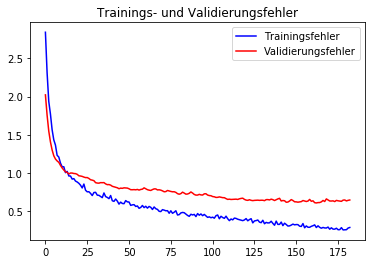

              precision    recall  f1-score   support

     T-shirt       0.78      0.79      0.79      1000
    Trousers       0.98      0.95      0.97      1000
    Pullover       0.75      0.70      0.72      1000
       Dress       0.83      0.84      0.84      1000
        Coat       0.67      0.78      0.72      1000
      Sandal       0.95      0.86      0.91      1000
       Shirt       0.53      0.49      0.51      1000
     Sneaker       0.86      0.90      0.88      1000
         Bag       0.94      0.94      0.94      1000
  Ankle-boot       0.90      0.95      0.93      1000

    accuracy                           0.82     10000
   macro avg       0.82      0.82      0.82     10000
weighted avg       0.82      0.82      0.82     10000



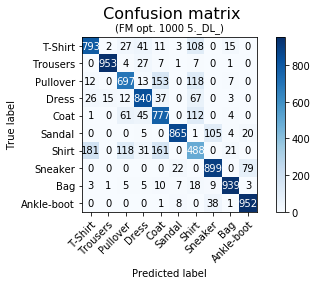

Die durchschnittliche Epochenanzahl beträgt:  130.8


In [0]:
# Trainingsmenge 1000
# optimierte Parameter: Dropoutrate: 0.3, Lernrate: 0.0001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1, 5, X_tr_1000, y_tr_1000, 0.3, 0.0001, False, 300, 1000)

In [0]:
downloader(1000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/131
1000/1000 [==============================] - 24s 24ms/step - loss: 2.7797 - acc: 0.1330 - val_loss: 1.9176 - val_acc: 0.3836
Epoch 2/131
1000/1000 [==============================] - 1s 1ms/step - loss: 2.2895 - acc: 0.2420 - val_loss: 1.5695 - val_acc: 0.5553
Epoch 3/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.9358 - acc: 0.3410 - val_loss: 1.3275 - val_acc: 0.6245
Epoch 4/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.6539 - acc: 0.4530 - val_loss: 1.1647 - val_acc: 0.6556
Epoch 5/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.4614 - acc: 0.5130 - val_loss: 1.0559 - val_acc: 0.6686
Epoch 6/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.3636 - acc: 0.5340 - val_loss: 0.9736 - val_acc: 0.6838
Epoch 7/131
1000/1000 [============

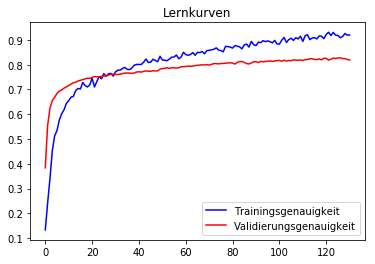

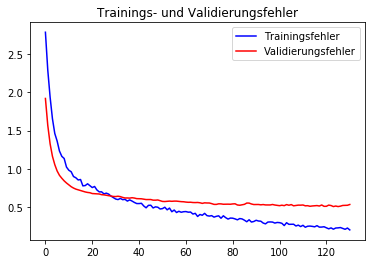

              precision    recall  f1-score   support

     T-shirt       0.79      0.77      0.78      1000
    Trousers       0.99      0.94      0.96      1000
    Pullover       0.78      0.64      0.70      1000
       Dress       0.82      0.85      0.84      1000
        Coat       0.68      0.81      0.74      1000
      Sandal       0.98      0.81      0.89      1000
       Shirt       0.54      0.56      0.55      1000
     Sneaker       0.82      0.92      0.87      1000
         Bag       0.95      0.94      0.95      1000
  Ankle-boot       0.91      0.95      0.93      1000

    accuracy                           0.82     10000
   macro avg       0.83      0.82      0.82     10000
weighted avg       0.83      0.82      0.82     10000



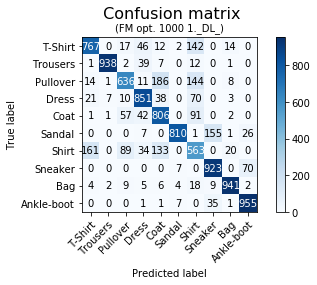

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/131
1000/1000 [==============================] - 24s 24ms/step - loss: 2.7296 - acc: 0.1470 - val_loss: 1.8637 - val_acc: 0.4028
Epoch 2/131
1000/1000 [==============================] - 1s 1ms/step - loss: 2.1556 - acc: 0.2760 - val_loss: 1.4645 - val_acc: 0.5854
Epoch 3/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.8358 - acc: 0.3670 - val_loss: 1.2167 - val_acc: 0.6370
Epoch 4/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.5382 - acc: 0.4870 - val_loss: 1.0722 - val_acc: 0.6630
Epoch 5/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.3474 - acc: 0.5390 - val_loss: 0.9821 - val_acc: 0.6789
Epoch 6/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.2335 - acc: 0.5840 - val_loss: 0.9209 - val_acc: 0.6907
Epoch 7/131
1000/1000 [============

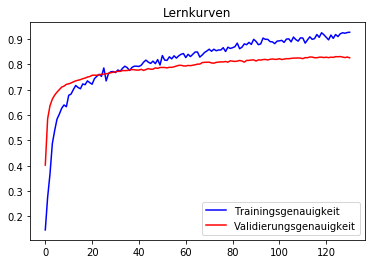

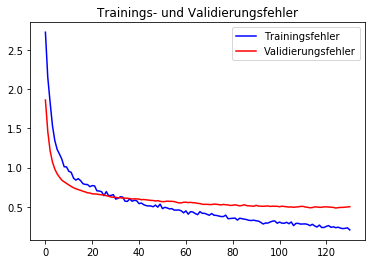

              precision    recall  f1-score   support

     T-shirt       0.79      0.79      0.79      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.79      0.65      0.71      1000
       Dress       0.86      0.85      0.86      1000
        Coat       0.68      0.80      0.74      1000
      Sandal       0.98      0.84      0.90      1000
       Shirt       0.52      0.56      0.54      1000
     Sneaker       0.85      0.93      0.89      1000
         Bag       0.96      0.94      0.95      1000
  Ankle-boot       0.91      0.96      0.93      1000

    accuracy                           0.83     10000
   macro avg       0.83      0.83      0.83     10000
weighted avg       0.83      0.83      0.83     10000



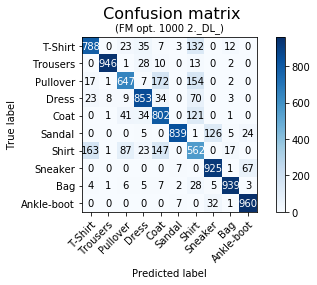

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/131
1000/1000 [==============================] - 25s 25ms/step - loss: 2.7505 - acc: 0.1550 - val_loss: 1.8566 - val_acc: 0.3545
Epoch 2/131
1000/1000 [==============================] - 1s 1ms/step - loss: 2.1940 - acc: 0.2540 - val_loss: 1.4651 - val_acc: 0.5981
Epoch 3/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.7986 - acc: 0.3770 - val_loss: 1.2187 - val_acc: 0.6591
Epoch 4/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.5769 - acc: 0.4700 - val_loss: 1.0676 - val_acc: 0.6815
Epoch 5/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.3599 - acc: 0.5270 - val_loss: 0.9731 - val_acc: 0.6932
Epoch 6/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.2521 - acc: 0.5610 - val_loss: 0.9102 - val_acc: 0.7020
Epoch 7/131
1000/1000 [============

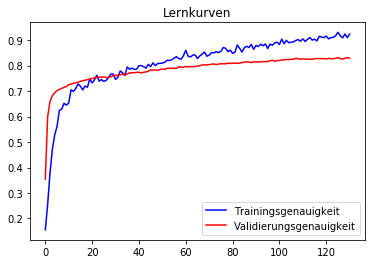

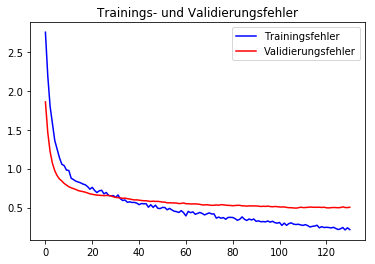

              precision    recall  f1-score   support

     T-shirt       0.73      0.85      0.79      1000
    Trousers       0.98      0.95      0.97      1000
    Pullover       0.73      0.74      0.73      1000
       Dress       0.87      0.83      0.85      1000
        Coat       0.69      0.79      0.73      1000
      Sandal       0.97      0.86      0.91      1000
       Shirt       0.58      0.44      0.50      1000
     Sneaker       0.84      0.94      0.89      1000
         Bag       0.95      0.95      0.95      1000
  Ankle-boot       0.93      0.95      0.94      1000

    accuracy                           0.83     10000
   macro avg       0.83      0.83      0.83     10000
weighted avg       0.83      0.83      0.83     10000



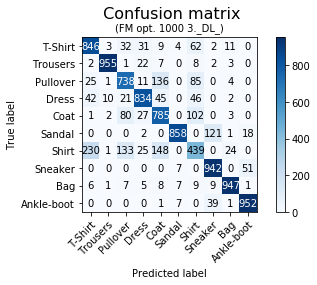

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/131
1000/1000 [==============================] - 25s 25ms/step - loss: 2.8414 - acc: 0.1390 - val_loss: 1.9149 - val_acc: 0.3623
Epoch 2/131
1000/1000 [==============================] - 1s 1ms/step - loss: 2.3433 - acc: 0.2390 - val_loss: 1.5772 - val_acc: 0.5159
Epoch 3/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.8823 - acc: 0.3330 - val_loss: 1.3485 - val_acc: 0.5889
Epoch 4/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.6322 - acc: 0.4330 - val_loss: 1.1845 - val_acc: 0.6343
Epoch 5/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.5074 - acc: 0.4880 - val_loss: 1.0786 - val_acc: 0.6616
Epoch 6/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.3944 - acc: 0.5260 - val_loss: 1.0038 - val_acc: 0.6786
Epoch 7/131
1000/1000 [============

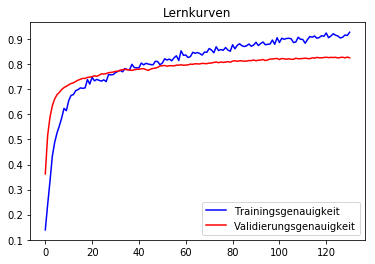

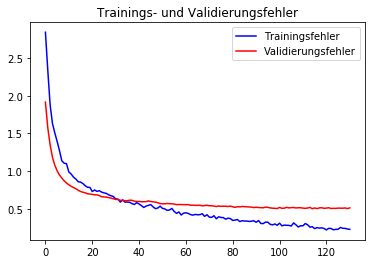

              precision    recall  f1-score   support

     T-shirt       0.74      0.83      0.78      1000
    Trousers       0.98      0.95      0.96      1000
    Pullover       0.71      0.77      0.74      1000
       Dress       0.87      0.81      0.84      1000
        Coat       0.76      0.73      0.74      1000
      Sandal       0.97      0.86      0.91      1000
       Shirt       0.54      0.49      0.52      1000
     Sneaker       0.86      0.92      0.89      1000
         Bag       0.94      0.95      0.95      1000
  Ankle-boot       0.91      0.96      0.93      1000

    accuracy                           0.83     10000
   macro avg       0.83      0.83      0.83     10000
weighted avg       0.83      0.83      0.83     10000



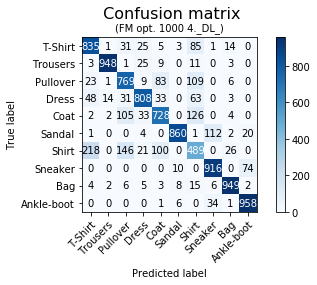

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 1000 samples, validate on 10000 samples
Epoch 1/131
1000/1000 [==============================] - 26s 26ms/step - loss: 2.7829 - acc: 0.1610 - val_loss: 1.8634 - val_acc: 0.4067
Epoch 2/131
1000/1000 [==============================] - 1s 1ms/step - loss: 2.3298 - acc: 0.2540 - val_loss: 1.5167 - val_acc: 0.5481
Epoch 3/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.8880 - acc: 0.3660 - val_loss: 1.2826 - val_acc: 0.6145
Epoch 4/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.6045 - acc: 0.4620 - val_loss: 1.1236 - val_acc: 0.6580
Epoch 5/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.4803 - acc: 0.5050 - val_loss: 1.0162 - val_acc: 0.6800
Epoch 6/131
1000/1000 [==============================] - 1s 1ms/step - loss: 1.3467 - acc: 0.5360 - val_loss: 0.9427 - val_acc: 0.6961
Epoch 7/131
1000/1000 [============

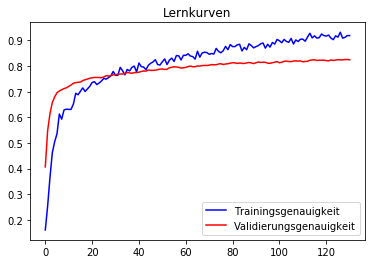

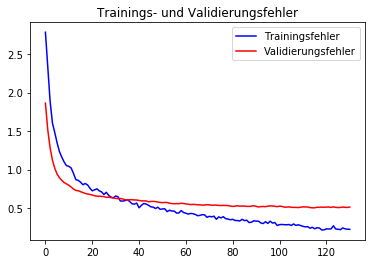

              precision    recall  f1-score   support

     T-shirt       0.75      0.83      0.79      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.79      0.64      0.71      1000
       Dress       0.82      0.86      0.84      1000
        Coat       0.70      0.77      0.73      1000
      Sandal       0.96      0.84      0.90      1000
       Shirt       0.55      0.52      0.53      1000
     Sneaker       0.83      0.95      0.88      1000
         Bag       0.93      0.95      0.94      1000
  Ankle-boot       0.94      0.94      0.94      1000

    accuracy                           0.82     10000
   macro avg       0.83      0.82      0.82     10000
weighted avg       0.83      0.82      0.82     10000



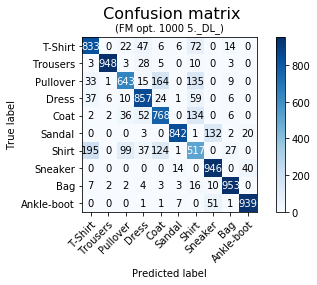

In [64]:
# Trainingsmenge 1000
# optimierte Parameter: Dropoutrate: 0.3, Lernrate: 0.0001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainieren, mit durchschnittlichen bester Epochenanzahl aus EarlyStopping
fullDataRuns(1, 5, X_tr_1000, y_tr_1000, X_test, y_test, 0.3, 0.0001, False, 131, 1000)

In [0]:
downloader_full(1000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 










Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Epoch 1/300
15/15 [==============================] - 8s 509ms/step - loss: 2.9054 - acc: 0.1349 - val_loss: 2.0667 - val_acc: 0.2600
Epoch 2/300
15/15 [==============================] - 0s 13ms/step - loss: 2.5876 - acc: 0.1998 - val_loss: 1.8149 - val_acc: 0.4200
Epoch 3/300
15/15 [==============================] - 0s 22ms/step - loss: 2.3662 - acc: 0.1987 - val_loss: 1.6353 - val_acc: 0.4700
Epoch 4/300
15/15 [==============================] - 0s 21ms/step - loss: 2.1954 - acc: 0.2646 - val_loss: 1.5016 - val_acc: 0.5300
Epoch 5/300
15/15 [==============================] - 0s 24ms/step - loss: 2.0309 - acc: 0.3274 - val_los

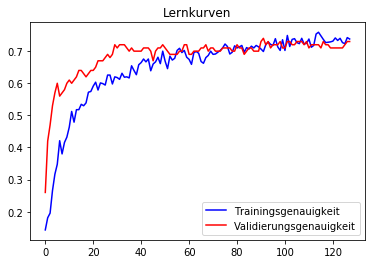

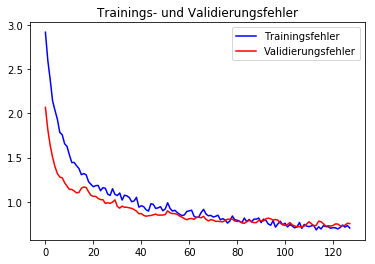

              precision    recall  f1-score   support

     T-shirt       0.74      0.82      0.77      1000
    Trousers       0.96      0.95      0.96      1000
    Pullover       0.52      0.71      0.60      1000
       Dress       0.83      0.75      0.79      1000
        Coat       0.62      0.68      0.65      1000
      Sandal       0.84      0.85      0.85      1000
       Shirt       0.41      0.19      0.26      1000
     Sneaker       0.84      0.84      0.84      1000
         Bag       0.94      0.91      0.92      1000
  Ankle-boot       0.89      0.95      0.92      1000

    accuracy                           0.77     10000
   macro avg       0.76      0.77      0.76     10000
weighted avg       0.76      0.77      0.76     10000



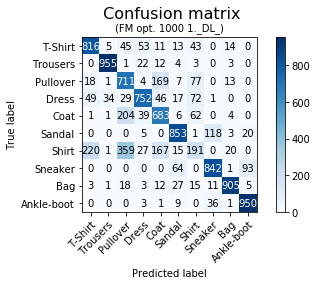

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
15/15 [==============================] - 2s 106ms/step - loss: 2.8959 - acc: 0.1328 - val_loss: 2.0880 - val_acc: 0.2800
Epoch 2/300
15/15 [==============================] - 0s 14ms/step - loss: 2.5079 - acc: 0.2019 - val_loss: 1.8321 - val_acc: 0.4700
Epoch 3/300
15/15 [==============================] - 0s 24ms/step - loss: 2.3160 - acc: 0.2448 - val_loss: 1.6435 - val_acc: 0.5000
Epoch 4/300
15/15 [==============================] - 0s 18ms/step - loss: 2.2366 - acc: 0.2510 - val_loss: 1.5029 - val_acc: 0.5400
Epoch 5/300
15/15 [==============================] - 0s 18ms/step - loss: 2.0414 - acc: 0.3180 - val_loss: 1.4342 - val_acc: 0.5600
Epoch 6/300
15/15 [==============================] - 0s 20ms/step - loss: 1.8922 - acc: 0.3410 - val_loss: 1.3729 - val_acc: 0.6000
Epoch 7/300
15/15 [==============================] - 0s 18ms/st

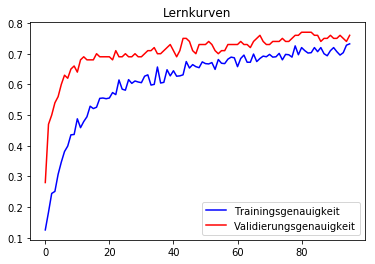

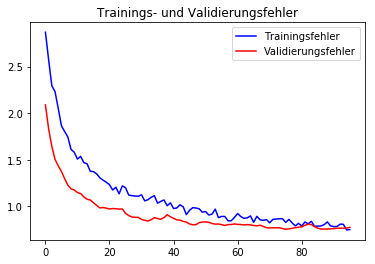

              precision    recall  f1-score   support

     T-shirt       0.74      0.78      0.76      1000
    Trousers       0.92      0.95      0.94      1000
    Pullover       0.45      0.77      0.57      1000
       Dress       0.78      0.73      0.76      1000
        Coat       0.63      0.49      0.55      1000
      Sandal       0.88      0.82      0.85      1000
       Shirt       0.39      0.18      0.25      1000
     Sneaker       0.79      0.89      0.84      1000
         Bag       0.91      0.91      0.91      1000
  Ankle-boot       0.94      0.91      0.92      1000

    accuracy                           0.74     10000
   macro avg       0.74      0.74      0.73     10000
weighted avg       0.74      0.74      0.73     10000



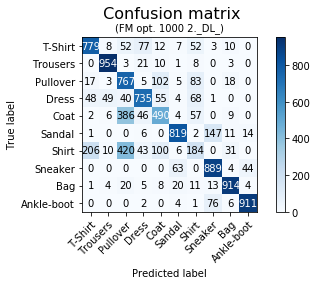

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
15/15 [==============================] - 2s 122ms/step - loss: 2.8324 - acc: 0.1287 - val_loss: 2.1881 - val_acc: 0.2000
Epoch 2/300
15/15 [==============================] - 0s 13ms/step - loss: 2.5843 - acc: 0.1705 - val_loss: 1.8546 - val_acc: 0.3500
Epoch 3/300
15/15 [==============================] - 0s 18ms/step - loss: 2.2672 - acc: 0.2636 - val_loss: 1.6200 - val_acc: 0.4500
Epoch 4/300
15/15 [==============================] - 0s 21ms/step - loss: 1.9833 - acc: 0.2918 - val_loss: 1.4365 - val_acc: 0.5300
Epoch 5/300
15/15 [==============================] - 0s 18ms/step - loss: 2.0439 - acc: 0.2929 - val_loss: 1.3044 - val_acc: 0.6100
Epoch 6/300
15/15 [==============================] - 0s 20ms/step - loss: 1.7890 - acc: 0.3734 - val_loss: 1.2018 - val_acc: 0.6200
Epoch 7/300
15/15 [==============================] - 0s 24ms/st

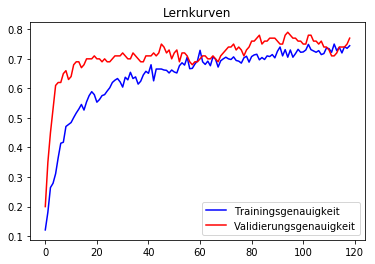

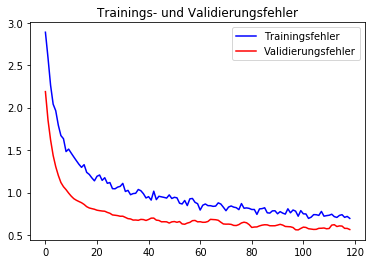

              precision    recall  f1-score   support

     T-shirt       0.75      0.77      0.76      1000
    Trousers       0.92      0.96      0.94      1000
    Pullover       0.48      0.77      0.59      1000
       Dress       0.82      0.71      0.76      1000
        Coat       0.65      0.55      0.60      1000
      Sandal       0.91      0.84      0.88      1000
       Shirt       0.39      0.24      0.30      1000
     Sneaker       0.84      0.88      0.86      1000
         Bag       0.93      0.90      0.92      1000
  Ankle-boot       0.90      0.95      0.92      1000

    accuracy                           0.76     10000
   macro avg       0.76      0.76      0.75     10000
weighted avg       0.76      0.76      0.75     10000



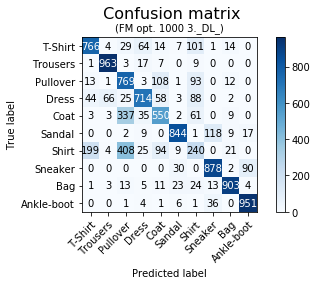

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
15/15 [==============================] - 2s 139ms/step - loss: 2.9274 - acc: 0.1402 - val_loss: 1.9311 - val_acc: 0.3000
Epoch 2/300
15/15 [==============================] - 0s 14ms/step - loss: 2.5151 - acc: 0.1799 - val_loss: 1.7054 - val_acc: 0.4100
Epoch 3/300
15/15 [==============================] - 0s 21ms/step - loss: 2.2045 - acc: 0.2448 - val_loss: 1.5232 - val_acc: 0.4700
Epoch 4/300
15/15 [==============================] - 0s 18ms/step - loss: 2.1340 - acc: 0.2751 - val_loss: 1.4104 - val_acc: 0.4700
Epoch 5/300
15/15 [==============================] - 0s 19ms/step - loss: 1.9664 - acc: 0.3211 - val_loss: 1.3091 - val_acc: 0.5400
Epoch 6/300
15/15 [==============================] - 0s 18ms/step - loss: 1.8034 - acc: 0.3849 - val_loss: 1.2290 - val_acc: 0.5900
Epoch 7/300
15/15 [==============================] - 0s 19ms/st

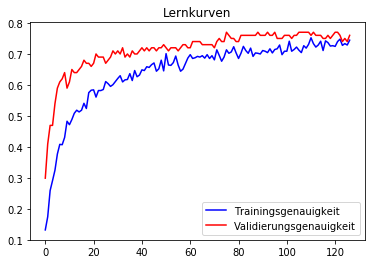

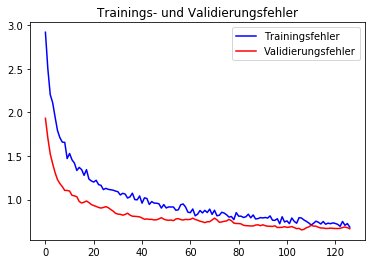

              precision    recall  f1-score   support

     T-shirt       0.77      0.74      0.76      1000
    Trousers       0.95      0.95      0.95      1000
    Pullover       0.54      0.70      0.61      1000
       Dress       0.79      0.73      0.76      1000
        Coat       0.60      0.65      0.63      1000
      Sandal       0.89      0.86      0.88      1000
       Shirt       0.39      0.29      0.34      1000
     Sneaker       0.81      0.90      0.85      1000
         Bag       0.95      0.91      0.93      1000
  Ankle-boot       0.93      0.90      0.91      1000

    accuracy                           0.76     10000
   macro avg       0.76      0.76      0.76     10000
weighted avg       0.76      0.76      0.76     10000



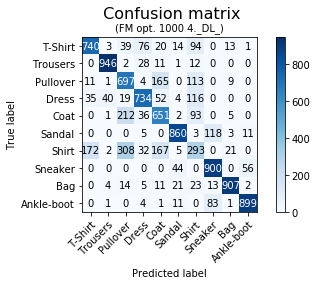

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
15/15 [==============================] - 3s 169ms/step - loss: 2.8680 - acc: 0.1297 - val_loss: 2.0794 - val_acc: 0.2400
Epoch 2/300
15/15 [==============================] - 0s 14ms/step - loss: 2.5166 - acc: 0.1925 - val_loss: 1.8216 - val_acc: 0.3600
Epoch 3/300
15/15 [==============================] - 0s 23ms/step - loss: 2.3042 - acc: 0.2144 - val_loss: 1.6208 - val_acc: 0.4400
Epoch 4/300
15/15 [==============================] - 0s 19ms/step - loss: 2.1787 - acc: 0.2939 - val_loss: 1.4815 - val_acc: 0.5200
Epoch 5/300
15/15 [==============================] - 0s 19ms/step - loss: 2.0322 - acc: 0.3232 - val_loss: 1.3945 - val_acc: 0.5600
Epoch 6/300
15/15 [==============================] - 0s 19ms/step - loss: 1.8224 - acc: 0.3713 - val_loss: 1.3224 - val_acc: 0.6100
Epoch 7/300
15/15 [==============================] - 0s 21ms/st

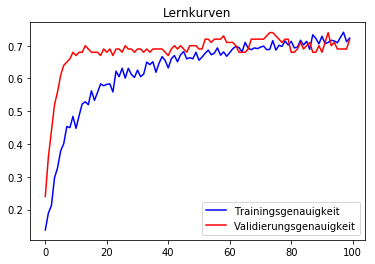

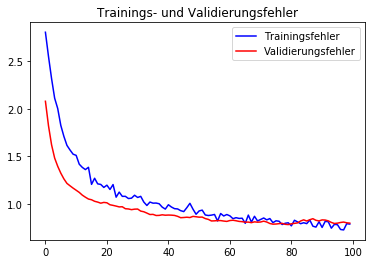

              precision    recall  f1-score   support

     T-shirt       0.72      0.80      0.76      1000
    Trousers       0.95      0.95      0.95      1000
    Pullover       0.47      0.76      0.58      1000
       Dress       0.81      0.74      0.78      1000
        Coat       0.60      0.56      0.58      1000
      Sandal       0.87      0.85      0.86      1000
       Shirt       0.36      0.12      0.18      1000
     Sneaker       0.84      0.85      0.85      1000
         Bag       0.90      0.92      0.91      1000
  Ankle-boot       0.89      0.94      0.92      1000

    accuracy                           0.75     10000
   macro avg       0.74      0.75      0.74     10000
weighted avg       0.74      0.75      0.74     10000



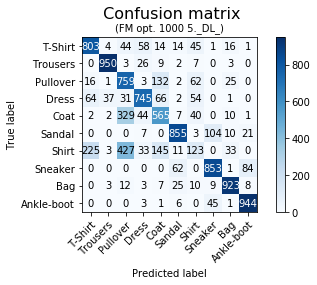

Die durchschnittliche Epochenanzahl beträgt:  94.0


In [12]:
# Trainingsmenge 1000
# optimierte Parameter: Dropoutrate: 0.3, Lernrate: 0.0001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1, 5, X_tr_1000, y_tr_1000, 0.3, 0.0001, False, 300, 1000)

In [0]:
downloader(1000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 3s 1ms/step - loss: 2.6664 - acc: 0.1661 - val_loss: 1.7940 - val_acc: 0.4550
Epoch 2/300
1800/1800 [==============================] - 0s 165us/step - loss: 2.0633 - acc: 0.3067 - val_loss: 1.4165 - val_acc: 0.5400
Epoch 3/300
1800/1800 [==============================] - 0s 165us/step - loss: 1.6850 - acc: 0.4189 - val_loss: 1.1664 - val_acc: 0.6600
Epoch 4/300
1800/1800 [==============================] - 0s 158us/step - loss: 1.5094 - acc: 0.4789 - val_loss: 1.0058 - val_acc: 0.7150
Epoch 5/300
1800/1800 [==============================] - 0s 168us/step - loss: 1.3772 - acc: 0.5322 - val_loss: 0.9015 - val_acc: 0.7400
Epoch 6/300
1800/1800 [==============================] - 0s 163us/step - loss: 1.2534 - acc: 0.5722 - val_loss: 0.8292 - val_acc: 0.7600
Epoch 7/300

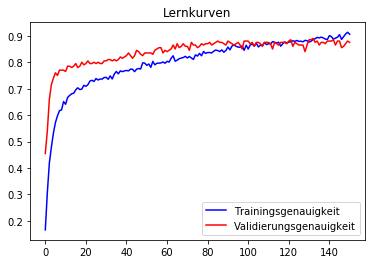

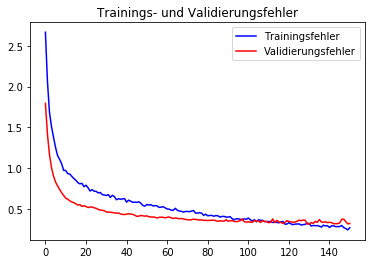

              precision    recall  f1-score   support

     T-shirt       0.79      0.78      0.79      1000
    Trousers       0.98      0.96      0.97      1000
    Pullover       0.76      0.78      0.77      1000
       Dress       0.87      0.86      0.86      1000
        Coat       0.76      0.78      0.77      1000
      Sandal       0.98      0.86      0.92      1000
       Shirt       0.57      0.56      0.57      1000
     Sneaker       0.86      0.95      0.90      1000
         Bag       0.95      0.95      0.95      1000
  Ankle-boot       0.94      0.95      0.94      1000

    accuracy                           0.84     10000
   macro avg       0.85      0.84      0.84     10000
weighted avg       0.85      0.84      0.84     10000



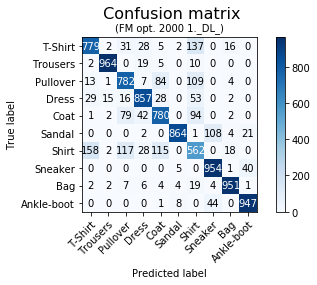

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 3s 2ms/step - loss: 2.7050 - acc: 0.1506 - val_loss: 1.8309 - val_acc: 0.3600
Epoch 2/300
1800/1800 [==============================] - 0s 156us/step - loss: 2.0948 - acc: 0.2772 - val_loss: 1.4298 - val_acc: 0.6000
Epoch 3/300
1800/1800 [==============================] - 0s 176us/step - loss: 1.7298 - acc: 0.4106 - val_loss: 1.1864 - val_acc: 0.6800
Epoch 4/300
1800/1800 [==============================] - 0s 167us/step - loss: 1.5631 - acc: 0.4472 - val_loss: 1.0075 - val_acc: 0.7400
Epoch 5/300
1800/1800 [==============================] - 0s 181us/step - loss: 1.3543 - acc: 0.5194 - val_loss: 0.8873 - val_acc: 0.7500
Epoch 6/300
1800/1800 [==============================] - 0s 176us/step - loss: 1.2463 - acc: 0.5639 - val_loss: 0.8130 - val_acc: 0.7600
Epoch 7/300

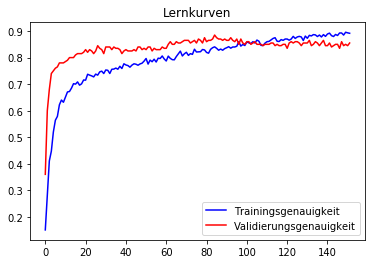

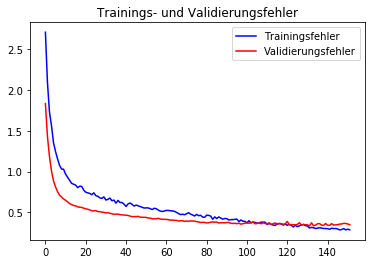

              precision    recall  f1-score   support

     T-shirt       0.77      0.82      0.80      1000
    Trousers       0.98      0.96      0.97      1000
    Pullover       0.78      0.73      0.76      1000
       Dress       0.89      0.83      0.86      1000
        Coat       0.74      0.78      0.76      1000
      Sandal       0.98      0.89      0.93      1000
       Shirt       0.56      0.56      0.56      1000
     Sneaker       0.88      0.96      0.91      1000
         Bag       0.95      0.96      0.95      1000
  Ankle-boot       0.94      0.95      0.95      1000

    accuracy                           0.84     10000
   macro avg       0.85      0.84      0.84     10000
weighted avg       0.85      0.84      0.84     10000



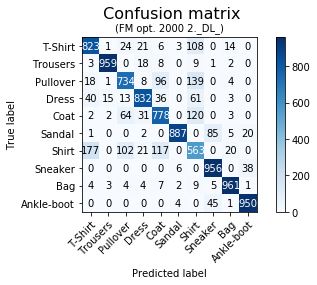

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 3s 2ms/step - loss: 2.7318 - acc: 0.1506 - val_loss: 1.7597 - val_acc: 0.4500
Epoch 2/300
1800/1800 [==============================] - 0s 186us/step - loss: 2.0304 - acc: 0.3050 - val_loss: 1.4112 - val_acc: 0.5350
Epoch 3/300
1800/1800 [==============================] - 0s 165us/step - loss: 1.6528 - acc: 0.4228 - val_loss: 1.1951 - val_acc: 0.6100
Epoch 4/300
1800/1800 [==============================] - 0s 166us/step - loss: 1.4477 - acc: 0.4933 - val_loss: 1.0435 - val_acc: 0.6300
Epoch 5/300
1800/1800 [==============================] - 0s 185us/step - loss: 1.2940 - acc: 0.5628 - val_loss: 0.9715 - val_acc: 0.6350
Epoch 6/300
1800/1800 [==============================] - 0s 171us/step - loss: 1.1674 - acc: 0.5839 - val_loss: 0.9261 - val_acc: 0.6550
Epoch 7/300

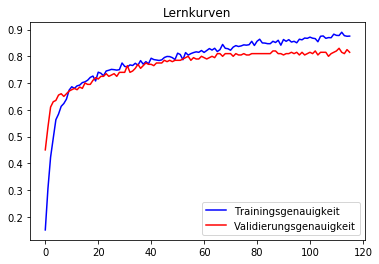

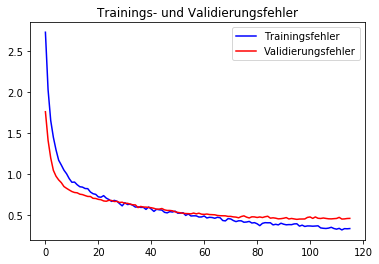

              precision    recall  f1-score   support

     T-shirt       0.78      0.81      0.80      1000
    Trousers       0.98      0.96      0.97      1000
    Pullover       0.72      0.81      0.76      1000
       Dress       0.90      0.81      0.85      1000
        Coat       0.72      0.79      0.75      1000
      Sandal       0.99      0.83      0.91      1000
       Shirt       0.59      0.48      0.53      1000
     Sneaker       0.85      0.95      0.90      1000
         Bag       0.93      0.95      0.94      1000
  Ankle-boot       0.92      0.96      0.94      1000

    accuracy                           0.84     10000
   macro avg       0.84      0.84      0.84     10000
weighted avg       0.84      0.84      0.84     10000



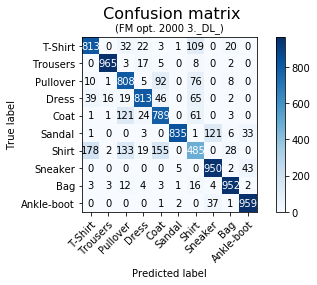

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 3s 2ms/step - loss: 2.6559 - acc: 0.1644 - val_loss: 1.7160 - val_acc: 0.4550
Epoch 2/300
1800/1800 [==============================] - 0s 171us/step - loss: 2.0422 - acc: 0.3094 - val_loss: 1.3222 - val_acc: 0.5750
Epoch 3/300
1800/1800 [==============================] - 0s 172us/step - loss: 1.6707 - acc: 0.4328 - val_loss: 1.0901 - val_acc: 0.6750
Epoch 4/300
1800/1800 [==============================] - 0s 176us/step - loss: 1.4981 - acc: 0.4767 - val_loss: 0.9505 - val_acc: 0.6850
Epoch 5/300
1800/1800 [==============================] - 0s 242us/step - loss: 1.3343 - acc: 0.5428 - val_loss: 0.8623 - val_acc: 0.7150
Epoch 6/300
1800/1800 [==============================] - 0s 253us/step - loss: 1.1985 - acc: 0.5761 - val_loss: 0.8064 - val_acc: 0.7300
Epoch 7/300

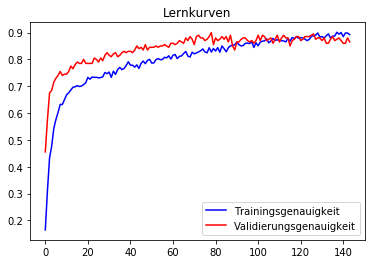

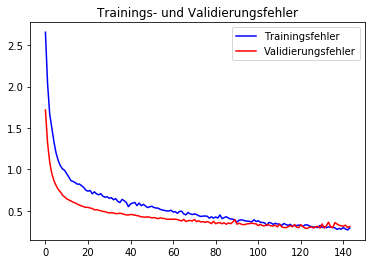

              precision    recall  f1-score   support

     T-shirt       0.80      0.81      0.80      1000
    Trousers       0.97      0.97      0.97      1000
    Pullover       0.75      0.79      0.77      1000
       Dress       0.88      0.83      0.85      1000
        Coat       0.76      0.76      0.76      1000
      Sandal       0.98      0.89      0.93      1000
       Shirt       0.59      0.59      0.59      1000
     Sneaker       0.89      0.95      0.92      1000
         Bag       0.94      0.95      0.95      1000
  Ankle-boot       0.93      0.96      0.94      1000

    accuracy                           0.85     10000
   macro avg       0.85      0.85      0.85     10000
weighted avg       0.85      0.85      0.85     10000



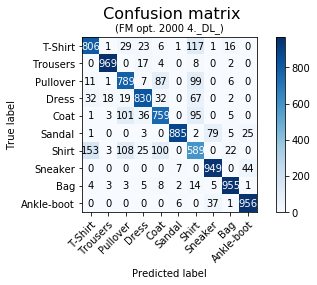

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 1800 samples, validate on 200 samples
Epoch 1/300
1800/1800 [==============================] - 4s 2ms/step - loss: 2.5949 - acc: 0.1739 - val_loss: 1.7355 - val_acc: 0.5000
Epoch 2/300
1800/1800 [==============================] - 0s 175us/step - loss: 1.9755 - acc: 0.3239 - val_loss: 1.3646 - val_acc: 0.5950
Epoch 3/300
1800/1800 [==============================] - 0s 189us/step - loss: 1.6534 - acc: 0.4328 - val_loss: 1.1142 - val_acc: 0.6800
Epoch 4/300
1800/1800 [==============================] - 0s 177us/step - loss: 1.3536 - acc: 0.5522 - val_loss: 0.9822 - val_acc: 0.7050
Epoch 5/300
1800/1800 [==============================] - 0s 182us/step - loss: 1.2965 - acc: 0.5572 - val_loss: 0.8836 - val_acc: 0.7300
Epoch 6/300
1800/1800 [==============================] - 0s 170us/step - loss: 1.1619 - acc: 0.6044 - val_loss: 0.8170 - val_acc: 0.7400
Epoch 7/300

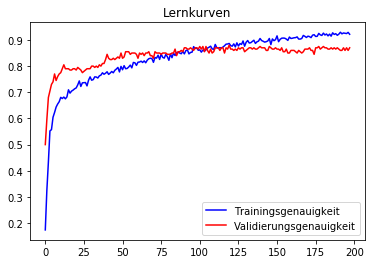

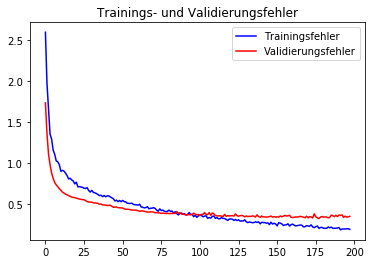

              precision    recall  f1-score   support

     T-shirt       0.80      0.82      0.81      1000
    Trousers       0.98      0.96      0.97      1000
    Pullover       0.78      0.79      0.79      1000
       Dress       0.90      0.83      0.86      1000
        Coat       0.79      0.78      0.79      1000
      Sandal       0.98      0.90      0.94      1000
       Shirt       0.58      0.62      0.60      1000
     Sneaker       0.86      0.97      0.91      1000
         Bag       0.95      0.96      0.95      1000
  Ankle-boot       0.97      0.93      0.95      1000

    accuracy                           0.85     10000
   macro avg       0.86      0.85      0.86     10000
weighted avg       0.86      0.85      0.86     10000



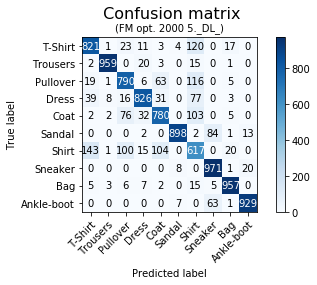

Die durchschnittliche Epochenanzahl beträgt:  132.2


In [16]:
# Trainingsmenge 2000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.0001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1, 5, X_tr_2000, y_tr_2000, 0.4, 0.0001, False, 300, 2000)

In [0]:
downloader(2000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/132
2000/2000 [==============================] - 26s 13ms/step - loss: 2.7439 - acc: 0.1550 - val_loss: 1.7531 - val_acc: 0.4603
Epoch 2/132
2000/2000 [==============================] - 1s 748us/step - loss: 2.0569 - acc: 0.3075 - val_loss: 1.3573 - val_acc: 0.6451
Epoch 3/132
2000/2000 [==============================] - 2s 779us/step - loss: 1.6911 - acc: 0.4260 - val_loss: 1.1093 - val_acc: 0.6824
Epoch 4/132
2000/2000 [==============================] - 1s 733us/step - loss: 1.4544 - acc: 0.5060 - val_loss: 0.9736 - val_acc: 0.6945
Epoch 5/132
2000/2000 [==============================] - 2s 757us/step - loss: 1.2570 - acc: 0.5555 - val_loss: 0.8956 - val_acc: 0.7037
Epoch 6/132
2000/2000 [==============================] - 2s 763us/step - loss: 1.1695 - acc: 0.5970 - val_loss: 0.8333 - val_acc: 0.7166
Epoch 7/132
2000/2000 [==

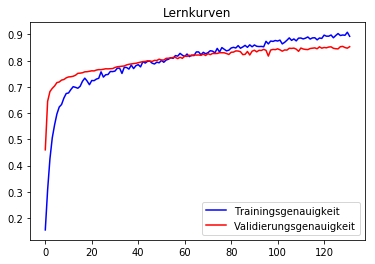

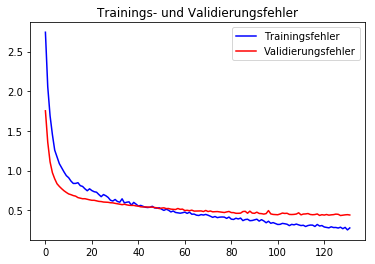

              precision    recall  f1-score   support

     T-shirt       0.82      0.79      0.80      1000
    Trousers       0.99      0.96      0.97      1000
    Pullover       0.78      0.80      0.79      1000
       Dress       0.88      0.86      0.87      1000
        Coat       0.77      0.79      0.78      1000
      Sandal       0.99      0.87      0.92      1000
       Shirt       0.58      0.60      0.59      1000
     Sneaker       0.87      0.96      0.91      1000
         Bag       0.96      0.95      0.95      1000
  Ankle-boot       0.94      0.95      0.95      1000

    accuracy                           0.85     10000
   macro avg       0.86      0.85      0.85     10000
weighted avg       0.86      0.85      0.85     10000



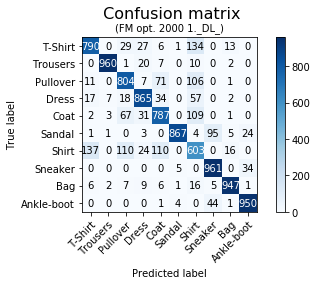

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/132
2000/2000 [==============================] - 26s 13ms/step - loss: 2.6647 - acc: 0.1645 - val_loss: 1.7237 - val_acc: 0.4686
Epoch 2/132
2000/2000 [==============================] - 2s 785us/step - loss: 1.9814 - acc: 0.3200 - val_loss: 1.2965 - val_acc: 0.5973
Epoch 3/132
2000/2000 [==============================] - 2s 782us/step - loss: 1.5844 - acc: 0.4475 - val_loss: 1.0851 - val_acc: 0.6619
Epoch 4/132
2000/2000 [==============================] - 2s 769us/step - loss: 1.4037 - acc: 0.5130 - val_loss: 0.9549 - val_acc: 0.6876
Epoch 5/132
2000/2000 [==============================] - 2s 784us/step - loss: 1.2463 - acc: 0.5655 - val_loss: 0.8739 - val_acc: 0.7018
Epoch 6/132
2000/2000 [==============================] - 2s 783us/step - loss: 1.1268 - acc: 0.5980 - val_loss: 0.8263 - val_acc: 0.7145
Epoch 7/132
2000/2000 [==

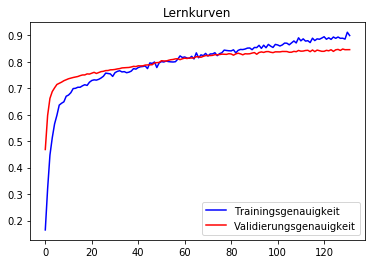

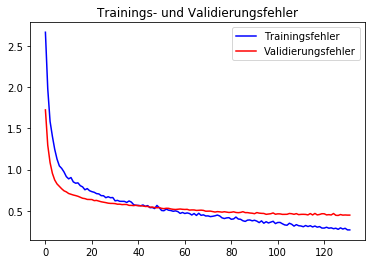

              precision    recall  f1-score   support

     T-shirt       0.85      0.71      0.78      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.80      0.74      0.77      1000
       Dress       0.84      0.87      0.86      1000
        Coat       0.74      0.82      0.78      1000
      Sandal       0.99      0.88      0.93      1000
       Shirt       0.55      0.63      0.59      1000
     Sneaker       0.88      0.96      0.92      1000
         Bag       0.96      0.95      0.95      1000
  Ankle-boot       0.95      0.95      0.95      1000

    accuracy                           0.85     10000
   macro avg       0.85      0.85      0.85     10000
weighted avg       0.85      0.85      0.85     10000



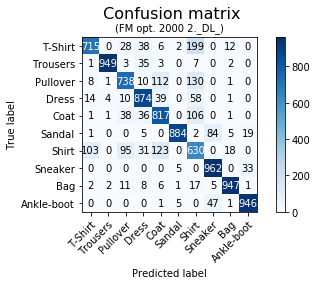

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/132
2000/2000 [==============================] - 27s 14ms/step - loss: 2.6636 - acc: 0.1690 - val_loss: 1.8332 - val_acc: 0.3842
Epoch 2/132
2000/2000 [==============================] - 2s 862us/step - loss: 2.0667 - acc: 0.3115 - val_loss: 1.4402 - val_acc: 0.5565
Epoch 3/132
2000/2000 [==============================] - 2s 841us/step - loss: 1.7099 - acc: 0.4295 - val_loss: 1.1953 - val_acc: 0.6311
Epoch 4/132
2000/2000 [==============================] - 2s 843us/step - loss: 1.4579 - acc: 0.5105 - val_loss: 1.0595 - val_acc: 0.6604
Epoch 5/132
2000/2000 [==============================] - 2s 851us/step - loss: 1.2838 - acc: 0.5565 - val_loss: 0.9750 - val_acc: 0.6825
Epoch 6/132
2000/2000 [==============================] - 2s 830us/step - loss: 1.2152 - acc: 0.5890 - val_loss: 0.9059 - val_acc: 0.6992
Epoch 7/132
2000/2000 [==

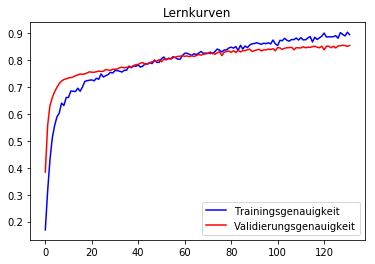

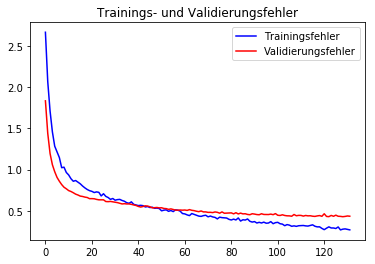

              precision    recall  f1-score   support

     T-shirt       0.82      0.79      0.81      1000
    Trousers       0.97      0.97      0.97      1000
    Pullover       0.80      0.79      0.79      1000
       Dress       0.90      0.82      0.86      1000
        Coat       0.74      0.84      0.79      1000
      Sandal       0.98      0.89      0.93      1000
       Shirt       0.60      0.59      0.59      1000
     Sneaker       0.89      0.94      0.92      1000
         Bag       0.94      0.96      0.95      1000
  Ankle-boot       0.93      0.96      0.94      1000

    accuracy                           0.85     10000
   macro avg       0.86      0.85      0.86     10000
weighted avg       0.86      0.85      0.86     10000



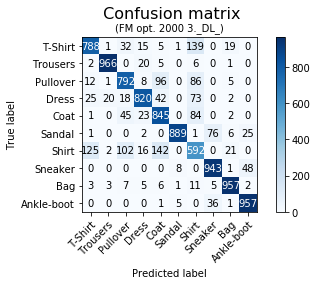

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/132
2000/2000 [==============================] - 27s 14ms/step - loss: 2.6337 - acc: 0.1700 - val_loss: 1.7206 - val_acc: 0.5193
Epoch 2/132
2000/2000 [==============================] - 2s 814us/step - loss: 2.0806 - acc: 0.2870 - val_loss: 1.3479 - val_acc: 0.6185
Epoch 3/132
2000/2000 [==============================] - 2s 809us/step - loss: 1.7126 - acc: 0.4195 - val_loss: 1.1484 - val_acc: 0.6538
Epoch 4/132
2000/2000 [==============================] - 2s 778us/step - loss: 1.4737 - acc: 0.4955 - val_loss: 1.0343 - val_acc: 0.6762
Epoch 5/132
2000/2000 [==============================] - 2s 813us/step - loss: 1.3241 - acc: 0.5485 - val_loss: 0.9504 - val_acc: 0.6898
Epoch 6/132
2000/2000 [==============================] - 2s 803us/step - loss: 1.2272 - acc: 0.5830 - val_loss: 0.8921 - val_acc: 0.7043
Epoch 7/132
2000/2000 [==

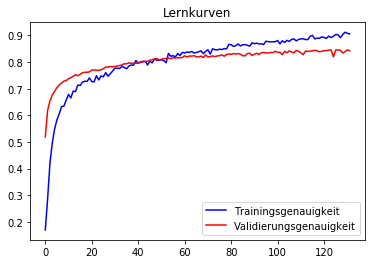

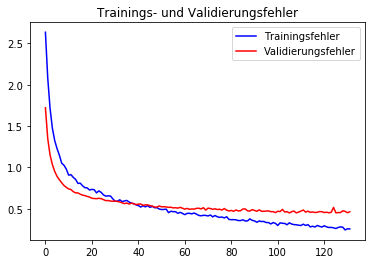

              precision    recall  f1-score   support

     T-shirt       0.83      0.71      0.77      1000
    Trousers       0.98      0.96      0.97      1000
    Pullover       0.80      0.73      0.76      1000
       Dress       0.87      0.86      0.86      1000
        Coat       0.75      0.81      0.78      1000
      Sandal       0.98      0.86      0.92      1000
       Shirt       0.54      0.66      0.59      1000
     Sneaker       0.84      0.98      0.90      1000
         Bag       0.97      0.92      0.95      1000
  Ankle-boot       0.96      0.93      0.95      1000

    accuracy                           0.84     10000
   macro avg       0.85      0.84      0.85     10000
weighted avg       0.85      0.84      0.85     10000



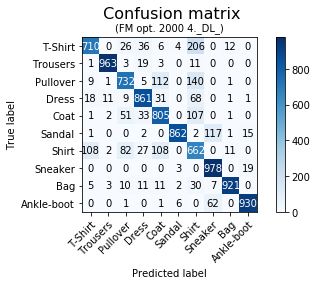

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 2000 samples, validate on 10000 samples
Epoch 1/132
2000/2000 [==============================] - 28s 14ms/step - loss: 2.6785 - acc: 0.1505 - val_loss: 1.6856 - val_acc: 0.4922
Epoch 2/132
2000/2000 [==============================] - 2s 896us/step - loss: 1.9518 - acc: 0.3260 - val_loss: 1.2740 - val_acc: 0.6181
Epoch 3/132
2000/2000 [==============================] - 2s 823us/step - loss: 1.5957 - acc: 0.4365 - val_loss: 1.0645 - val_acc: 0.6551
Epoch 4/132
2000/2000 [==============================] - 2s 825us/step - loss: 1.3484 - acc: 0.5250 - val_loss: 0.9496 - val_acc: 0.6730
Epoch 5/132
2000/2000 [==============================] - 2s 820us/step - loss: 1.2437 - acc: 0.5800 - val_loss: 0.8768 - val_acc: 0.6927
Epoch 6/132
2000/2000 [==============================] - 2s 839us/step - loss: 1.1825 - acc: 0.5870 - val_loss: 0.8343 - val_acc: 0.7000
Epoch 7/132
2000/2000 [==

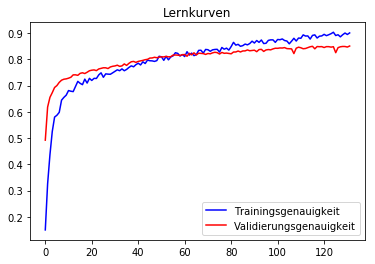

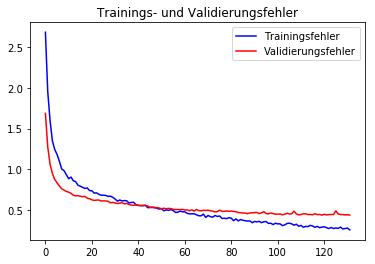

              precision    recall  f1-score   support

     T-shirt       0.79      0.81      0.80      1000
    Trousers       0.99      0.96      0.98      1000
    Pullover       0.83      0.73      0.78      1000
       Dress       0.89      0.83      0.86      1000
        Coat       0.76      0.79      0.78      1000
      Sandal       0.99      0.88      0.93      1000
       Shirt       0.56      0.65      0.60      1000
     Sneaker       0.85      0.98      0.91      1000
         Bag       0.96      0.95      0.95      1000
  Ankle-boot       0.97      0.93      0.95      1000

    accuracy                           0.85     10000
   macro avg       0.86      0.85      0.85     10000
weighted avg       0.86      0.85      0.85     10000



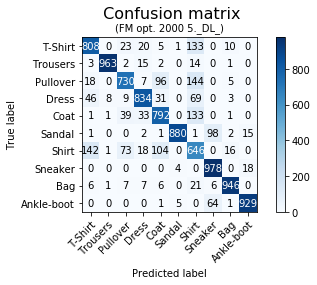

In [67]:
# Trainingsmenge 2000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.0001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainieren, mit durchschnittlichen bester Epochenanzahl aus EarlyStopping
fullDataRuns(1, 5, X_tr_2000, y_tr_2000, X_test, y_test, 0.4, 0.0001, False, 132, 2000)

In [0]:
downloader_full(2000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
29/29 [==============================] - 5s 159ms/step - loss: 2.7679 - acc: 0.1405 - val_loss: 1.8653 - val_acc: 0.4000
Epoch 2/300
29/29 [==============================] - 0s 16ms/step - loss: 2.4429 - acc: 0.1886 - val_loss: 1.5285 - val_acc: 0.5400
Epoch 3/300
29/29 [==============================] - 1s 22ms/step - loss: 2.1249 - acc: 0.2764 - val_loss: 1.3144 - val_acc: 0.6250
Epoch 4/300
29/29 [==============================] - 1s 26ms/step - loss: 1.8907 - acc: 0.3380 - val_loss: 1.1976 - val_acc: 0.6750
Epoch 5/300
29/29 [==============================] - 1s 26ms/step - loss: 1.7627 - acc: 0.3928 - val_loss: 1.1271 - val_acc: 0.6600
Epoch 6/300
29/29 [==============================] - 1s 21ms/step - loss: 1.6275 - acc: 0.4405 - val_loss: 1.0461 - val_acc: 0.7000
Epoch 7/300
29/29 [==============================] - 1s 24ms/st

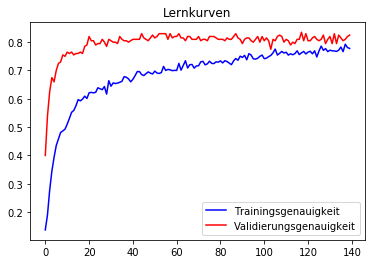

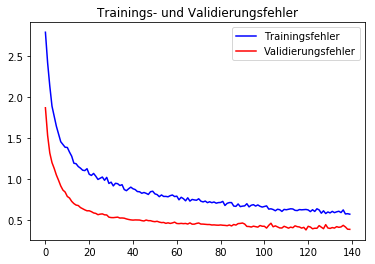

              precision    recall  f1-score   support

     T-shirt       0.76      0.82      0.79      1000
    Trousers       0.97      0.95      0.96      1000
    Pullover       0.65      0.69      0.67      1000
       Dress       0.83      0.83      0.83      1000
        Coat       0.72      0.70      0.71      1000
      Sandal       0.95      0.87      0.91      1000
       Shirt       0.46      0.41      0.43      1000
     Sneaker       0.84      0.96      0.90      1000
         Bag       0.94      0.95      0.94      1000
  Ankle-boot       0.96      0.92      0.94      1000

    accuracy                           0.81     10000
   macro avg       0.81      0.81      0.81     10000
weighted avg       0.81      0.81      0.81     10000



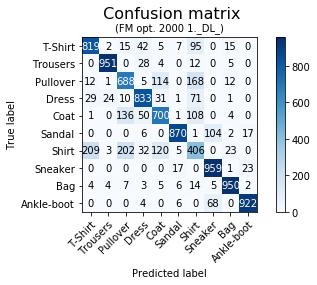

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
29/29 [==============================] - 5s 172ms/step - loss: 2.7603 - acc: 0.1261 - val_loss: 1.9643 - val_acc: 0.3550
Epoch 2/300
29/29 [==============================] - 0s 16ms/step - loss: 2.4427 - acc: 0.1951 - val_loss: 1.6582 - val_acc: 0.4850
Epoch 3/300
29/29 [==============================] - 1s 20ms/step - loss: 2.1132 - acc: 0.2673 - val_loss: 1.4252 - val_acc: 0.5650
Epoch 4/300
29/29 [==============================] - 1s 21ms/step - loss: 1.9402 - acc: 0.3324 - val_loss: 1.2570 - val_acc: 0.6200
Epoch 5/300
29/29 [==============================] - 1s 20ms/step - loss: 1.7599 - acc: 0.3962 - val_loss: 1.1476 - val_acc: 0.6250
Epoch 6/300
29/29 [==============================] - 1s 20ms/step - loss: 1.6585 - acc: 0.4074 - val_loss: 1.0648 - val_acc: 0.6600
Epoch 7/300
29/29 [==============================] - 1s 19ms/st

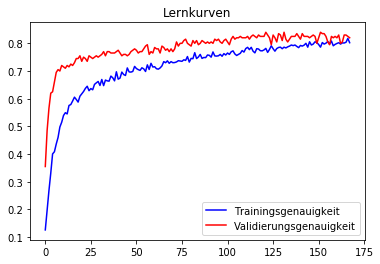

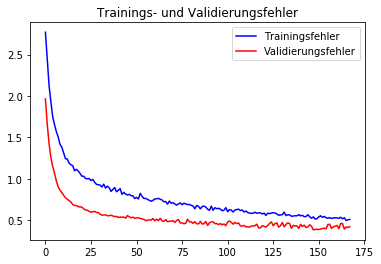

              precision    recall  f1-score   support

     T-shirt       0.81      0.75      0.78      1000
    Trousers       0.97      0.97      0.97      1000
    Pullover       0.74      0.69      0.72      1000
       Dress       0.85      0.86      0.86      1000
        Coat       0.69      0.83      0.75      1000
      Sandal       0.96      0.86      0.91      1000
       Shirt       0.53      0.50      0.51      1000
     Sneaker       0.83      0.97      0.89      1000
         Bag       0.96      0.94      0.95      1000
  Ankle-boot       0.96      0.92      0.94      1000

    accuracy                           0.83     10000
   macro avg       0.83      0.83      0.83     10000
weighted avg       0.83      0.83      0.83     10000



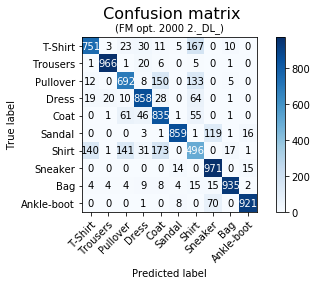

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
29/29 [==============================] - 5s 177ms/step - loss: 2.8530 - acc: 0.1274 - val_loss: 1.9134 - val_acc: 0.3500
Epoch 2/300
29/29 [==============================] - 0s 17ms/step - loss: 2.3786 - acc: 0.2178 - val_loss: 1.5630 - val_acc: 0.4950
Epoch 3/300
29/29 [==============================] - 1s 21ms/step - loss: 2.0081 - acc: 0.3207 - val_loss: 1.3626 - val_acc: 0.5500
Epoch 4/300
29/29 [==============================] - 1s 19ms/step - loss: 1.8349 - acc: 0.3563 - val_loss: 1.2479 - val_acc: 0.5900
Epoch 5/300
29/29 [==============================] - 1s 19ms/step - loss: 1.6518 - acc: 0.4295 - val_loss: 1.1596 - val_acc: 0.6450
Epoch 6/300
29/29 [==============================] - 1s 21ms/step - loss: 1.5390 - acc: 0.4718 - val_loss: 1.1193 - val_acc: 0.6400
Epoch 7/300
29/29 [==============================] - 1s 19ms/st

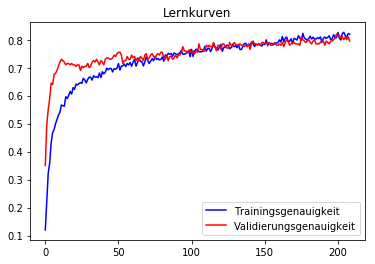

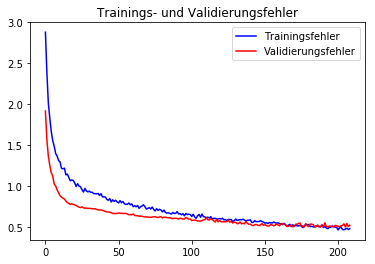

              precision    recall  f1-score   support

     T-shirt       0.84      0.73      0.78      1000
    Trousers       0.98      0.96      0.97      1000
    Pullover       0.82      0.67      0.74      1000
       Dress       0.87      0.86      0.86      1000
        Coat       0.68      0.81      0.74      1000
      Sandal       0.97      0.89      0.93      1000
       Shirt       0.51      0.59      0.55      1000
     Sneaker       0.85      0.96      0.90      1000
         Bag       0.96      0.95      0.96      1000
  Ankle-boot       0.96      0.92      0.94      1000

    accuracy                           0.83     10000
   macro avg       0.84      0.83      0.84     10000
weighted avg       0.84      0.83      0.84     10000



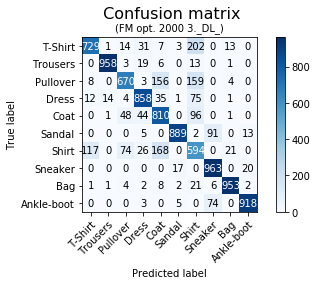

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
29/29 [==============================] - 6s 216ms/step - loss: 2.8938 - acc: 0.1272 - val_loss: 1.9610 - val_acc: 0.3150
Epoch 2/300
29/29 [==============================] - 1s 18ms/step - loss: 2.4781 - acc: 0.1985 - val_loss: 1.6108 - val_acc: 0.4800
Epoch 3/300
29/29 [==============================] - 1s 23ms/step - loss: 2.2091 - acc: 0.2635 - val_loss: 1.3735 - val_acc: 0.5900
Epoch 4/300
29/29 [==============================] - 1s 23ms/step - loss: 1.9394 - acc: 0.3321 - val_loss: 1.1995 - val_acc: 0.6400
Epoch 5/300
29/29 [==============================] - 1s 24ms/step - loss: 1.8293 - acc: 0.3701 - val_loss: 1.0928 - val_acc: 0.6700
Epoch 6/300
29/29 [==============================] - 1s 23ms/step - loss: 1.6678 - acc: 0.4107 - val_loss: 1.0081 - val_acc: 0.6850
Epoch 7/300
29/29 [==============================] - 1s 24ms/st

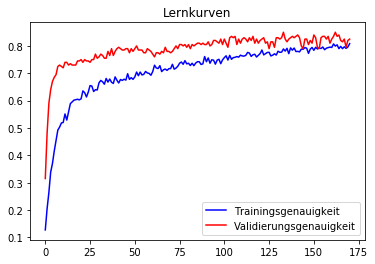

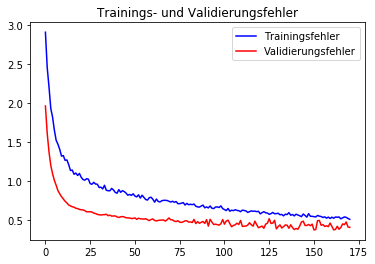

              precision    recall  f1-score   support

     T-shirt       0.80      0.79      0.79      1000
    Trousers       0.98      0.96      0.97      1000
    Pullover       0.79      0.63      0.70      1000
       Dress       0.83      0.87      0.85      1000
        Coat       0.69      0.82      0.75      1000
      Sandal       0.98      0.82      0.89      1000
       Shirt       0.50      0.52      0.51      1000
     Sneaker       0.79      0.98      0.87      1000
         Bag       0.97      0.94      0.95      1000
  Ankle-boot       0.96      0.89      0.93      1000

    accuracy                           0.82     10000
   macro avg       0.83      0.82      0.82     10000
weighted avg       0.83      0.82      0.82     10000



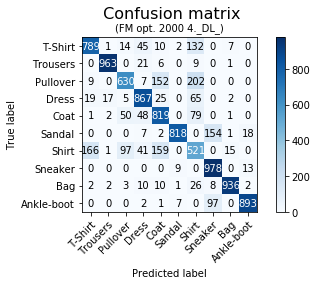

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
29/29 [==============================] - 6s 207ms/step - loss: 2.8255 - acc: 0.1343 - val_loss: 1.9353 - val_acc: 0.2850
Epoch 2/300
29/29 [==============================] - 0s 16ms/step - loss: 2.3448 - acc: 0.2220 - val_loss: 1.5962 - val_acc: 0.4750
Epoch 3/300
29/29 [==============================] - 1s 21ms/step - loss: 2.1048 - acc: 0.2886 - val_loss: 1.3911 - val_acc: 0.5300
Epoch 4/300
29/29 [==============================] - 1s 22ms/step - loss: 1.8818 - acc: 0.3519 - val_loss: 1.2468 - val_acc: 0.5850
Epoch 5/300
29/29 [==============================] - 1s 20ms/step - loss: 1.7229 - acc: 0.4020 - val_loss: 1.1170 - val_acc: 0.6600
Epoch 6/300
29/29 [==============================] - 1s 19ms/step - loss: 1.5569 - acc: 0.4498 - val_loss: 1.0206 - val_acc: 0.6850
Epoch 7/300
29/29 [==============================] - 1s 20ms/st

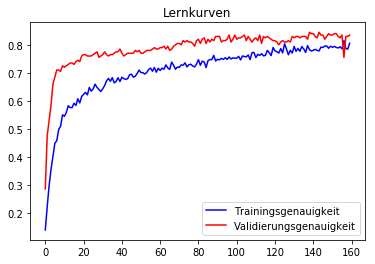

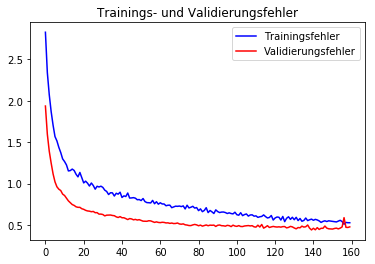

              precision    recall  f1-score   support

     T-shirt       0.77      0.83      0.80      1000
    Trousers       0.98      0.95      0.97      1000
    Pullover       0.76      0.68      0.72      1000
       Dress       0.85      0.83      0.84      1000
        Coat       0.69      0.77      0.73      1000
      Sandal       0.96      0.86      0.91      1000
       Shirt       0.50      0.48      0.49      1000
     Sneaker       0.81      0.97      0.88      1000
         Bag       0.95      0.94      0.94      1000
  Ankle-boot       0.97      0.89      0.92      1000

    accuracy                           0.82     10000
   macro avg       0.82      0.82      0.82     10000
weighted avg       0.82      0.82      0.82     10000



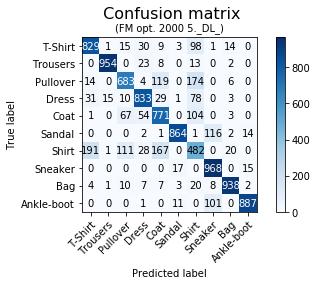

Die durchschnittliche Epochenanzahl beträgt:  149.6


In [19]:
# Trainingsmenge 2000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.0001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1, 5, X_tr_2000, y_tr_2000, 0.4, 0.0001, False, 300, 2000)

In [0]:
downloader(2000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 6s 1ms/step - loss: 1.2336 - acc: 0.5853 - val_loss: 0.6374 - val_acc: 0.7400
Epoch 2/300
4500/4500 [==============================] - 1s 185us/step - loss: 0.7683 - acc: 0.7133 - val_loss: 0.5751 - val_acc: 0.7900
Epoch 3/300
4500/4500 [==============================] - 1s 180us/step - loss: 0.6468 - acc: 0.7520 - val_loss: 0.5238 - val_acc: 0.8000
Epoch 4/300
4500/4500 [==============================] - 1s 186us/step - loss: 0.5916 - acc: 0.7671 - val_loss: 0.4802 - val_acc: 0.8080
Epoch 5/300
4500/4500 [==============================] - 1s 170us/step - loss: 0.5286 - acc: 0.8018 - val_loss: 0.4721 - val_acc: 0.8240
Epoch 6/300
4500/4500 [==============================] - 1s 185us/step - loss: 0.4866 - acc: 0.8122 - val_loss: 0.4712 - val_acc: 0.8300
Epoch 7/300

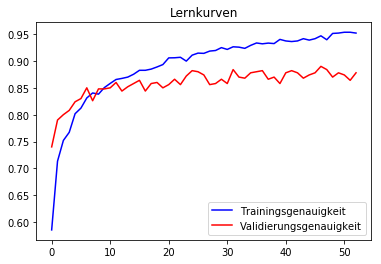

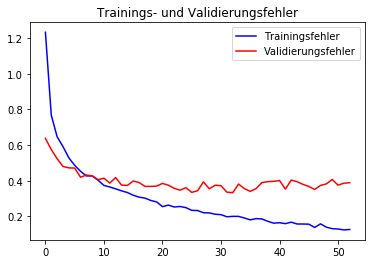

              precision    recall  f1-score   support

     T-shirt       0.86      0.81      0.83      1000
    Trousers       0.99      0.96      0.98      1000
    Pullover       0.83      0.85      0.84      1000
       Dress       0.88      0.90      0.89      1000
        Coat       0.83      0.80      0.82      1000
      Sandal       0.99      0.95      0.97      1000
       Shirt       0.67      0.70      0.68      1000
     Sneaker       0.93      0.97      0.95      1000
         Bag       0.96      0.98      0.97      1000
  Ankle-boot       0.96      0.96      0.96      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



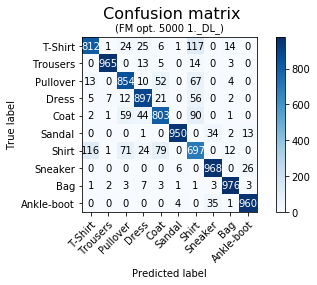

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 6s 1ms/step - loss: 1.2128 - acc: 0.5798 - val_loss: 0.6832 - val_acc: 0.7380
Epoch 2/300
4500/4500 [==============================] - 1s 182us/step - loss: 0.7246 - acc: 0.7282 - val_loss: 0.5942 - val_acc: 0.7540
Epoch 3/300
4500/4500 [==============================] - 1s 174us/step - loss: 0.6333 - acc: 0.7624 - val_loss: 0.5338 - val_acc: 0.7720
Epoch 4/300
4500/4500 [==============================] - 1s 174us/step - loss: 0.5914 - acc: 0.7733 - val_loss: 0.5628 - val_acc: 0.7720
Epoch 5/300
4500/4500 [==============================] - 1s 171us/step - loss: 0.5446 - acc: 0.7893 - val_loss: 0.5150 - val_acc: 0.7900
Epoch 6/300
4500/4500 [==============================] - 1s 172us/step - loss: 0.5031 - acc: 0.8053 - val_loss: 0.4320 - val_acc: 0.8420
Epoch 7/300

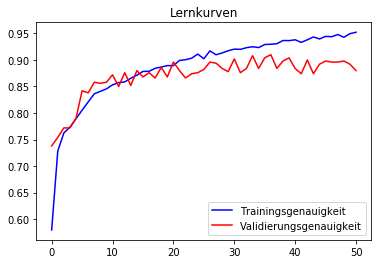

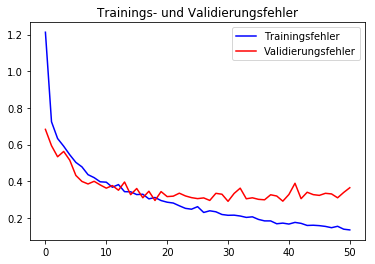

              precision    recall  f1-score   support

     T-shirt       0.81      0.86      0.84      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.74      0.91      0.82      1000
       Dress       0.88      0.89      0.89      1000
        Coat       0.87      0.74      0.80      1000
      Sandal       0.98      0.95      0.97      1000
       Shirt       0.74      0.58      0.65      1000
     Sneaker       0.94      0.95      0.95      1000
         Bag       0.91      0.98      0.95      1000
  Ankle-boot       0.94      0.96      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



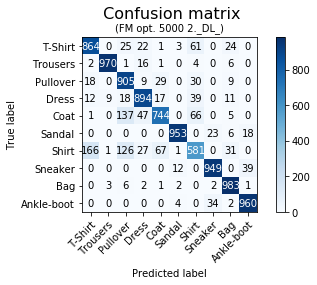

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 7s 2ms/step - loss: 1.2186 - acc: 0.5851 - val_loss: 0.5650 - val_acc: 0.7740
Epoch 2/300
4500/4500 [==============================] - 1s 172us/step - loss: 0.7507 - acc: 0.7242 - val_loss: 0.4772 - val_acc: 0.8320
Epoch 3/300
4500/4500 [==============================] - 1s 174us/step - loss: 0.6493 - acc: 0.7562 - val_loss: 0.4004 - val_acc: 0.8620
Epoch 4/300
4500/4500 [==============================] - 1s 179us/step - loss: 0.5824 - acc: 0.7802 - val_loss: 0.3897 - val_acc: 0.8620
Epoch 5/300
4500/4500 [==============================] - 1s 170us/step - loss: 0.5322 - acc: 0.8004 - val_loss: 0.3629 - val_acc: 0.8700
Epoch 6/300
4500/4500 [==============================] - 1s 188us/step - loss: 0.5027 - acc: 0.8069 - val_loss: 0.3580 - val_acc: 0.8620
Epoch 7/300

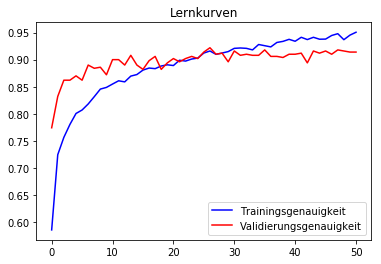

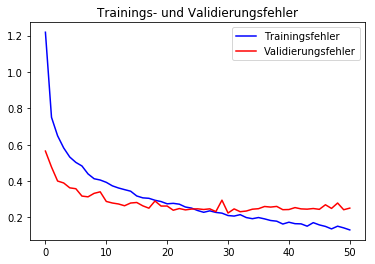

              precision    recall  f1-score   support

     T-shirt       0.82      0.85      0.84      1000
    Trousers       0.99      0.96      0.98      1000
    Pullover       0.85      0.85      0.85      1000
       Dress       0.90      0.87      0.88      1000
        Coat       0.80      0.88      0.83      1000
      Sandal       0.99      0.93      0.96      1000
       Shirt       0.72      0.65      0.68      1000
     Sneaker       0.90      0.97      0.93      1000
         Bag       0.96      0.97      0.97      1000
  Ankle-boot       0.96      0.95      0.95      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



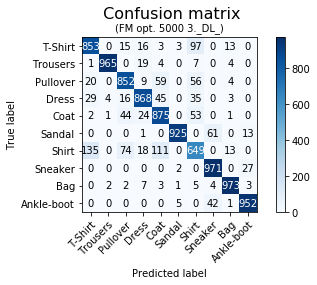

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 7s 2ms/step - loss: 1.2527 - acc: 0.5627 - val_loss: 0.7740 - val_acc: 0.7140
Epoch 2/300
4500/4500 [==============================] - 1s 182us/step - loss: 0.7470 - acc: 0.7309 - val_loss: 0.6051 - val_acc: 0.7700
Epoch 3/300
4500/4500 [==============================] - 1s 176us/step - loss: 0.6307 - acc: 0.7644 - val_loss: 0.5263 - val_acc: 0.7840
Epoch 4/300
4500/4500 [==============================] - 1s 180us/step - loss: 0.5836 - acc: 0.7840 - val_loss: 0.4695 - val_acc: 0.8100
Epoch 5/300
4500/4500 [==============================] - 1s 178us/step - loss: 0.5296 - acc: 0.7989 - val_loss: 0.4362 - val_acc: 0.8100
Epoch 6/300
4500/4500 [==============================] - 1s 184us/step - loss: 0.4974 - acc: 0.8142 - val_loss: 0.4743 - val_acc: 0.8300
Epoch 7/300

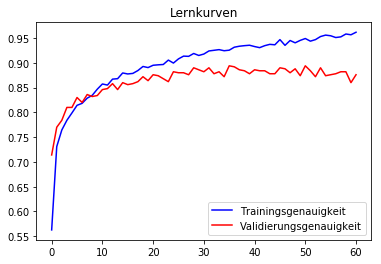

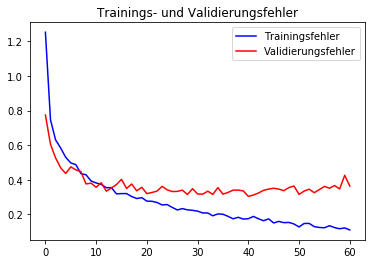

              precision    recall  f1-score   support

     T-shirt       0.80      0.86      0.83      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.80      0.89      0.84      1000
       Dress       0.88      0.90      0.89      1000
        Coat       0.88      0.77      0.82      1000
      Sandal       0.98      0.96      0.97      1000
       Shirt       0.70      0.63      0.67      1000
     Sneaker       0.91      0.98      0.95      1000
         Bag       0.94      0.97      0.96      1000
  Ankle-boot       0.98      0.94      0.96      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



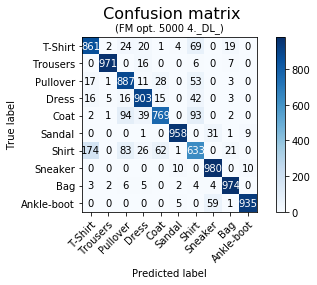

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
Train on 4500 samples, validate on 500 samples
Epoch 1/300
4500/4500 [==============================] - 8s 2ms/step - loss: 1.1905 - acc: 0.5827 - val_loss: 0.7290 - val_acc: 0.7280
Epoch 2/300
4500/4500 [==============================] - 1s 200us/step - loss: 0.7405 - acc: 0.7298 - val_loss: 0.5862 - val_acc: 0.7640
Epoch 3/300
4500/4500 [==============================] - 1s 199us/step - loss: 0.6414 - acc: 0.7520 - val_loss: 0.5928 - val_acc: 0.7680
Epoch 4/300
4500/4500 [==============================] - 1s 203us/step - loss: 0.5682 - acc: 0.7813 - val_loss: 0.4896 - val_acc: 0.8020
Epoch 5/300
4500/4500 [==============================] - 1s 191us/step - loss: 0.5274 - acc: 0.7978 - val_loss: 0.4723 - val_acc: 0.7980
Epoch 6/300
4500/4500 [==============================] - 1s 186us/step - loss: 0.4706 - acc: 0.8262 - val_loss: 0.4505 - val_acc: 0.8160
Epoch 7/300

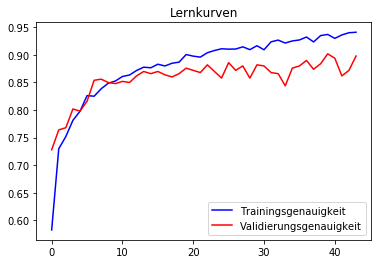

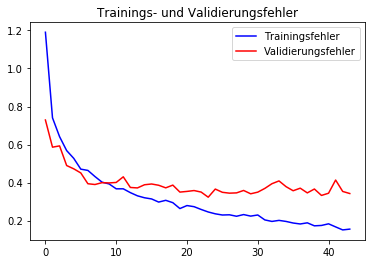

              precision    recall  f1-score   support

     T-shirt       0.78      0.88      0.83      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.78      0.89      0.83      1000
       Dress       0.91      0.84      0.88      1000
        Coat       0.81      0.82      0.82      1000
      Sandal       0.99      0.94      0.96      1000
       Shirt       0.72      0.57      0.64      1000
     Sneaker       0.93      0.95      0.94      1000
         Bag       0.95      0.97      0.96      1000
  Ankle-boot       0.94      0.97      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



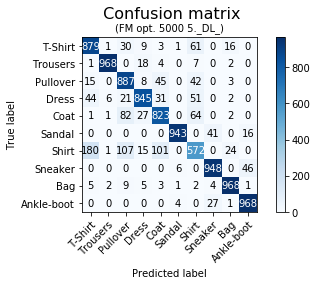

Die durchschnittliche Epochenanzahl beträgt:  32.0


In [22]:
# Trainingsmenge 5000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns(1, 5, X_tr_5000, y_tr_5000, 0.4, 0.001, False, 300, 5000)

In [0]:
downloader(5000)

***************************************************************************** 
1 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/32
5000/5000 [==============================] - 28s 6ms/step - loss: 1.1310 - acc: 0.6142 - val_loss: 0.6420 - val_acc: 0.7623
Epoch 2/32
5000/5000 [==============================] - 2s 481us/step - loss: 0.7039 - acc: 0.7380 - val_loss: 0.5697 - val_acc: 0.7856
Epoch 3/32
5000/5000 [==============================] - 2s 497us/step - loss: 0.5979 - acc: 0.7674 - val_loss: 0.4850 - val_acc: 0.8222
Epoch 4/32
5000/5000 [==============================] - 2s 465us/step - loss: 0.5527 - acc: 0.7928 - val_loss: 0.4497 - val_acc: 0.8381
Epoch 5/32
5000/5000 [==============================] - 2s 476us/step - loss: 0.5137 - acc: 0.8054 - val_loss: 0.4747 - val_acc: 0.8340
Epoch 6/32
5000/5000 [==============================] - 2s 463us/step - loss: 0.4750 - acc: 0.8176 - val_loss: 0.4158 - val_acc: 0.8497
Epoch 7/32
5000/5000 [==========

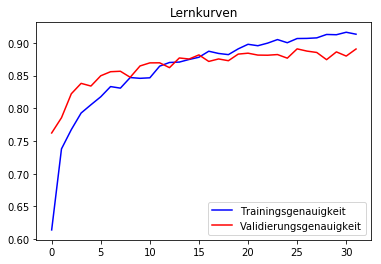

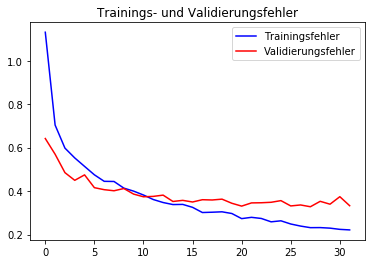

              precision    recall  f1-score   support

     T-shirt       0.85      0.82      0.84      1000
    Trousers       0.98      0.98      0.98      1000
    Pullover       0.87      0.82      0.84      1000
       Dress       0.88      0.88      0.88      1000
        Coat       0.81      0.87      0.84      1000
      Sandal       0.98      0.95      0.96      1000
       Shirt       0.69      0.69      0.69      1000
     Sneaker       0.93      0.96      0.95      1000
         Bag       0.96      0.97      0.97      1000
  Ankle-boot       0.96      0.96      0.96      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



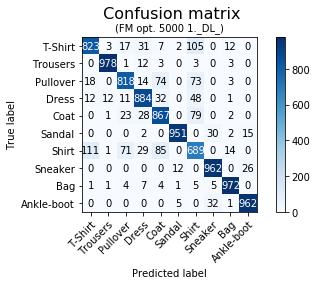

***************************************************************************** 
2 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/32
5000/5000 [==============================] - 29s 6ms/step - loss: 1.1370 - acc: 0.5996 - val_loss: 0.6493 - val_acc: 0.7586
Epoch 2/32
5000/5000 [==============================] - 2s 470us/step - loss: 0.7031 - acc: 0.7334 - val_loss: 0.5929 - val_acc: 0.7744
Epoch 3/32
5000/5000 [==============================] - 2s 481us/step - loss: 0.6170 - acc: 0.7692 - val_loss: 0.5409 - val_acc: 0.7964
Epoch 4/32
5000/5000 [==============================] - 2s 473us/step - loss: 0.5650 - acc: 0.7894 - val_loss: 0.4631 - val_acc: 0.8323
Epoch 5/32
5000/5000 [==============================] - 2s 455us/step - loss: 0.5178 - acc: 0.8006 - val_loss: 0.4394 - val_acc: 0.8440
Epoch 6/32
5000/5000 [==============================] - 2s 466us/step - loss: 0.4824 - acc: 0.8192 - val_loss: 0.4354 - val_acc: 0.8489
Epoch 7/32
5000/5000 [==========

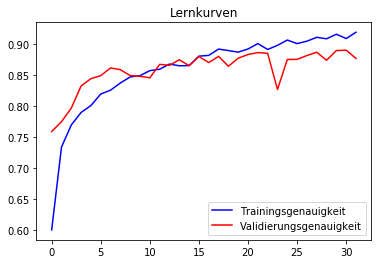

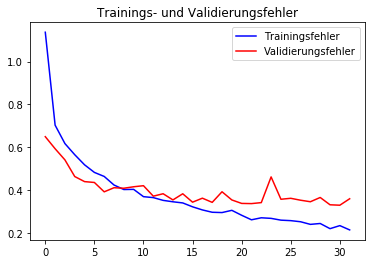

              precision    recall  f1-score   support

     T-shirt       0.84      0.81      0.82      1000
    Trousers       0.98      0.97      0.98      1000
    Pullover       0.85      0.75      0.80      1000
       Dress       0.91      0.84      0.87      1000
        Coat       0.73      0.92      0.81      1000
      Sandal       0.97      0.97      0.97      1000
       Shirt       0.66      0.62      0.64      1000
     Sneaker       0.94      0.96      0.95      1000
         Bag       0.96      0.96      0.96      1000
  Ankle-boot       0.97      0.95      0.96      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



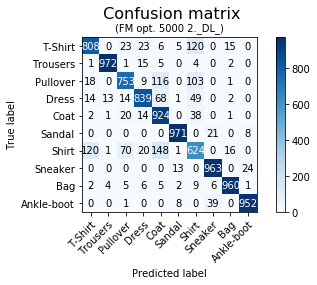

***************************************************************************** 
3 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/32
5000/5000 [==============================] - 29s 6ms/step - loss: 1.1897 - acc: 0.5928 - val_loss: 0.6768 - val_acc: 0.7430
Epoch 2/32
5000/5000 [==============================] - 2s 482us/step - loss: 0.7346 - acc: 0.7238 - val_loss: 0.5495 - val_acc: 0.7881
Epoch 3/32
5000/5000 [==============================] - 2s 461us/step - loss: 0.6224 - acc: 0.7604 - val_loss: 0.4949 - val_acc: 0.8217
Epoch 4/32
5000/5000 [==============================] - 2s 471us/step - loss: 0.5483 - acc: 0.7958 - val_loss: 0.4733 - val_acc: 0.8240
Epoch 5/32
5000/5000 [==============================] - 2s 485us/step - loss: 0.5180 - acc: 0.8076 - val_loss: 0.4383 - val_acc: 0.8434
Epoch 6/32
5000/5000 [==============================] - 2s 470us/step - loss: 0.4798 - acc: 0.8162 - val_loss: 0.4393 - val_acc: 0.8401
Epoch 7/32
5000/5000 [==========

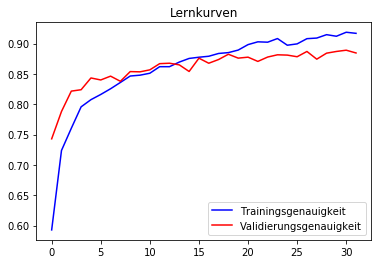

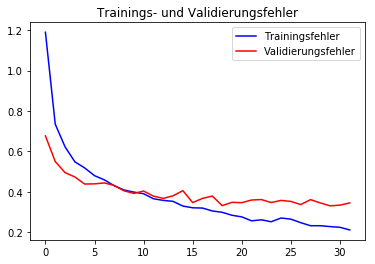

              precision    recall  f1-score   support

     T-shirt       0.83      0.84      0.84      1000
    Trousers       0.99      0.96      0.98      1000
    Pullover       0.84      0.85      0.84      1000
       Dress       0.89      0.88      0.89      1000
        Coat       0.84      0.81      0.82      1000
      Sandal       0.99      0.93      0.96      1000
       Shirt       0.66      0.69      0.67      1000
     Sneaker       0.89      0.98      0.93      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.97      0.94      0.95      1000

    accuracy                           0.88     10000
   macro avg       0.89      0.88      0.89     10000
weighted avg       0.89      0.88      0.89     10000



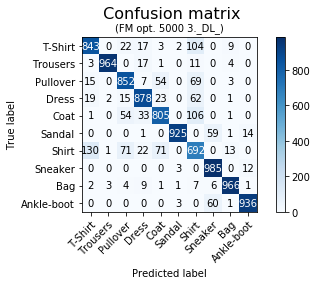

***************************************************************************** 
4 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/32
5000/5000 [==============================] - 29s 6ms/step - loss: 1.1025 - acc: 0.6218 - val_loss: 0.6756 - val_acc: 0.7511
Epoch 2/32
5000/5000 [==============================] - 3s 502us/step - loss: 0.7259 - acc: 0.7286 - val_loss: 0.5448 - val_acc: 0.7970
Epoch 3/32
5000/5000 [==============================] - 2s 492us/step - loss: 0.6172 - acc: 0.7656 - val_loss: 0.5006 - val_acc: 0.8134
Epoch 4/32
5000/5000 [==============================] - 2s 489us/step - loss: 0.5500 - acc: 0.7890 - val_loss: 0.4461 - val_acc: 0.8321
Epoch 5/32
5000/5000 [==============================] - 2s 492us/step - loss: 0.5075 - acc: 0.8126 - val_loss: 0.4193 - val_acc: 0.8495
Epoch 6/32
5000/5000 [==============================] - 2s 493us/step - loss: 0.4720 - acc: 0.8282 - val_loss: 0.4085 - val_acc: 0.8569
Epoch 7/32
5000/5000 [==========

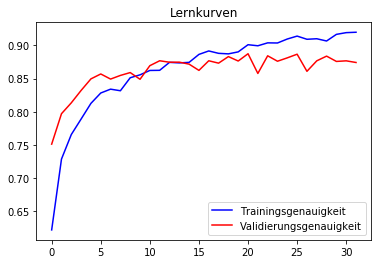

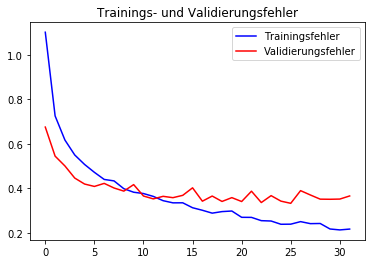

              precision    recall  f1-score   support

     T-shirt       0.84      0.84      0.84      1000
    Trousers       0.97      0.97      0.97      1000
    Pullover       0.77      0.88      0.82      1000
       Dress       0.90      0.86      0.88      1000
        Coat       0.86      0.71      0.78      1000
      Sandal       0.99      0.90      0.94      1000
       Shirt       0.66      0.69      0.67      1000
     Sneaker       0.91      0.95      0.93      1000
         Bag       0.95      0.97      0.96      1000
  Ankle-boot       0.92      0.97      0.95      1000

    accuracy                           0.87     10000
   macro avg       0.88      0.87      0.87     10000
weighted avg       0.88      0.87      0.87     10000



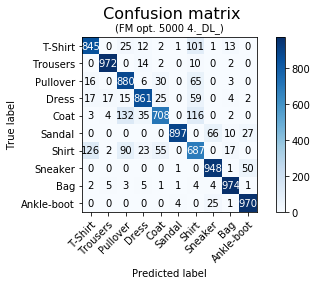

***************************************************************************** 
5 ._Trainingsdurchlauf
 
Train on 5000 samples, validate on 10000 samples
Epoch 1/32
5000/5000 [==============================] - 30s 6ms/step - loss: 1.1032 - acc: 0.6112 - val_loss: 0.6993 - val_acc: 0.7622
Epoch 2/32
5000/5000 [==============================] - 3s 503us/step - loss: 0.6916 - acc: 0.7372 - val_loss: 0.5538 - val_acc: 0.7973
Epoch 3/32
5000/5000 [==============================] - 2s 496us/step - loss: 0.6030 - acc: 0.7666 - val_loss: 0.5011 - val_acc: 0.8143
Epoch 4/32
5000/5000 [==============================] - 3s 522us/step - loss: 0.5623 - acc: 0.7854 - val_loss: 0.4952 - val_acc: 0.8187
Epoch 5/32
5000/5000 [==============================] - 3s 522us/step - loss: 0.5192 - acc: 0.8010 - val_loss: 0.4551 - val_acc: 0.8350
Epoch 6/32
5000/5000 [==============================] - 2s 480us/step - loss: 0.4683 - acc: 0.8210 - val_loss: 0.4217 - val_acc: 0.8516
Epoch 7/32
5000/5000 [==========

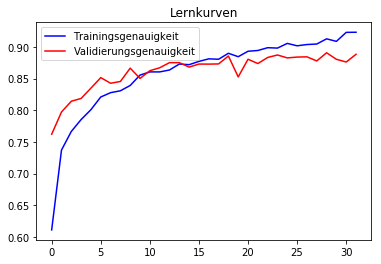

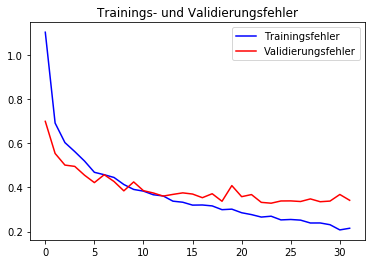

              precision    recall  f1-score   support

     T-shirt       0.83      0.87      0.85      1000
    Trousers       0.98      0.97      0.98      1000
    Pullover       0.87      0.81      0.84      1000
       Dress       0.90      0.87      0.88      1000
        Coat       0.85      0.83      0.84      1000
      Sandal       0.98      0.96      0.97      1000
       Shirt       0.68      0.69      0.68      1000
     Sneaker       0.96      0.94      0.95      1000
         Bag       0.91      0.98      0.94      1000
  Ankle-boot       0.94      0.97      0.96      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



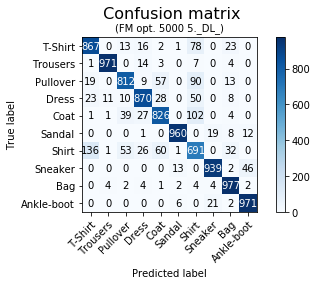

In [70]:
# Trainingsmenge 5000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainieren, mit durchschnittlichen bester Epochenanzahl aus EarlyStopping
fullDataRuns(1, 5, X_tr_5000, y_tr_5000, X_test, y_test, 0.4, 0.001, False, 32, 5000)

In [0]:
downloader_full(5000)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
71/71 [==============================] - 9s 123ms/step - loss: 1.4788 - acc: 0.4824 - val_loss: 1.1778 - val_acc: 0.6620
Epoch 2/300
71/71 [==============================] - 1s 19ms/step - loss: 0.9948 - acc: 0.6350 - val_loss: 0.7932 - val_acc: 0.7280
Epoch 3/300
71/71 [==============================] - 2s 21ms/step - loss: 0.8570 - acc: 0.6818 - val_loss: 0.7890 - val_acc: 0.7240
Epoch 4/300
71/71 [==============================] - 2s 22ms/step - loss: 0.8019 - acc: 0.6988 - val_loss: 0.6487 - val_acc: 0.7480
Epoch 5/300
71/71 [==============================] - 1s 20ms/step - loss: 0.7359 - acc: 0.7131 - val_loss: 0.6130 - val_acc: 0.7680
Epoch 6/300
71/71 [==============================] - 1s 21ms/step - loss: 0.6968 - acc: 0.7320 - val_loss: 0.6052 - val_acc: 0.7880
Epoch 7/300
71/71 [==============================] - 1s 20ms/st

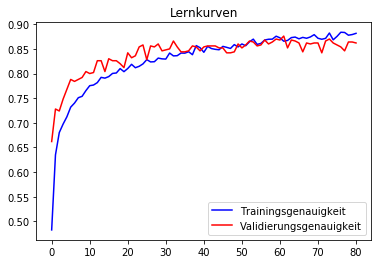

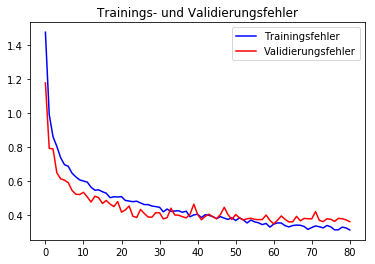

              precision    recall  f1-score   support

     T-shirt       0.85      0.85      0.85      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.85      0.85      0.85      1000
       Dress       0.86      0.91      0.88      1000
        Coat       0.85      0.77      0.81      1000
      Sandal       0.97      0.96      0.96      1000
       Shirt       0.66      0.68      0.67      1000
     Sneaker       0.92      0.97      0.94      1000
         Bag       0.96      0.98      0.97      1000
  Ankle-boot       0.97      0.94      0.96      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



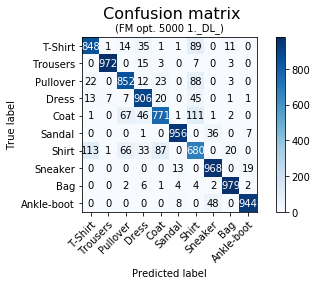

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
71/71 [==============================] - 9s 128ms/step - loss: 1.4650 - acc: 0.4913 - val_loss: 1.1647 - val_acc: 0.6400
Epoch 2/300
71/71 [==============================] - 1s 19ms/step - loss: 0.9702 - acc: 0.6432 - val_loss: 0.8132 - val_acc: 0.6960
Epoch 3/300
71/71 [==============================] - 1s 21ms/step - loss: 0.8263 - acc: 0.6839 - val_loss: 0.9290 - val_acc: 0.7060
Epoch 4/300
71/71 [==============================] - 2s 21ms/step - loss: 0.7987 - acc: 0.6961 - val_loss: 0.7040 - val_acc: 0.7420
Epoch 5/300
71/71 [==============================] - 2s 21ms/step - loss: 0.7398 - acc: 0.7219 - val_loss: 0.6619 - val_acc: 0.7460
Epoch 6/300
71/71 [==============================] - 1s 21ms/step - loss: 0.7142 - acc: 0.7310 - val_loss: 0.5536 - val_acc: 0.7740
Epoch 7/300
71/71 [==============================] - 1s 21ms/st

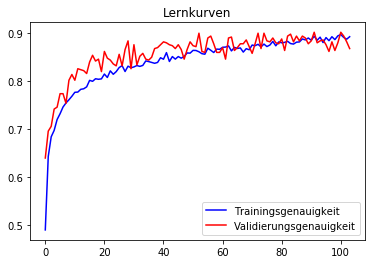

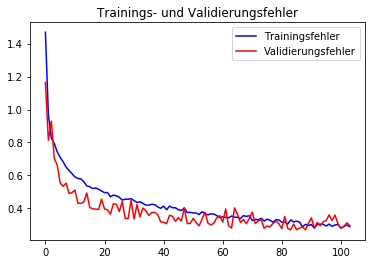

              precision    recall  f1-score   support

     T-shirt       0.81      0.88      0.85      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.79      0.89      0.84      1000
       Dress       0.88      0.91      0.90      1000
        Coat       0.85      0.76      0.80      1000
      Sandal       0.93      0.98      0.95      1000
       Shirt       0.73      0.61      0.66      1000
     Sneaker       0.94      0.93      0.93      1000
         Bag       0.96      0.98      0.97      1000
  Ankle-boot       0.98      0.94      0.96      1000

    accuracy                           0.89     10000
   macro avg       0.88      0.89      0.88     10000
weighted avg       0.88      0.89      0.88     10000



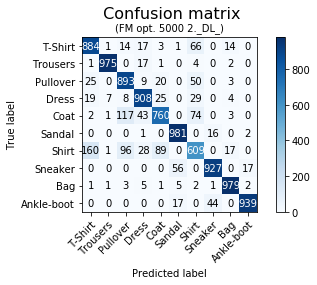

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
71/71 [==============================] - 10s 148ms/step - loss: 1.4444 - acc: 0.5078 - val_loss: 1.0822 - val_acc: 0.6960
Epoch 2/300
71/71 [==============================] - 2s 22ms/step - loss: 0.9626 - acc: 0.6432 - val_loss: 0.7566 - val_acc: 0.7680
Epoch 3/300
71/71 [==============================] - 2s 25ms/step - loss: 0.8758 - acc: 0.6719 - val_loss: 0.9964 - val_acc: 0.6940
Epoch 4/300
71/71 [==============================] - 2s 25ms/step - loss: 0.8062 - acc: 0.6963 - val_loss: 0.5354 - val_acc: 0.7940
Epoch 5/300
71/71 [==============================] - 2s 25ms/step - loss: 0.7539 - acc: 0.7117 - val_loss: 0.5057 - val_acc: 0.8140
Epoch 6/300
71/71 [==============================] - 2s 25ms/step - loss: 0.7382 - acc: 0.7177 - val_loss: 0.5108 - val_acc: 0.8080
Epoch 7/300
71/71 [==============================] - 2s 24ms/s

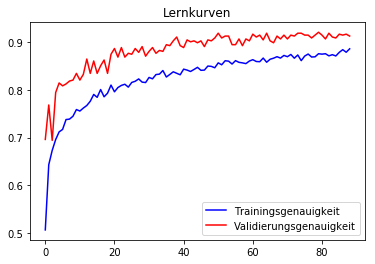

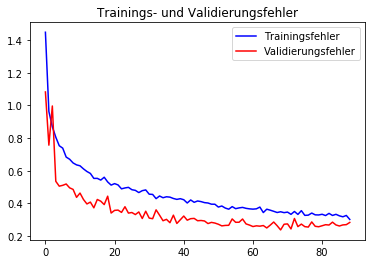

              precision    recall  f1-score   support

     T-shirt       0.81      0.88      0.84      1000
    Trousers       0.98      0.97      0.98      1000
    Pullover       0.89      0.79      0.84      1000
       Dress       0.88      0.89      0.89      1000
        Coat       0.78      0.88      0.83      1000
      Sandal       0.96      0.97      0.96      1000
       Shirt       0.69      0.61      0.65      1000
     Sneaker       0.93      0.97      0.95      1000
         Bag       0.97      0.98      0.97      1000
  Ankle-boot       0.98      0.94      0.96      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



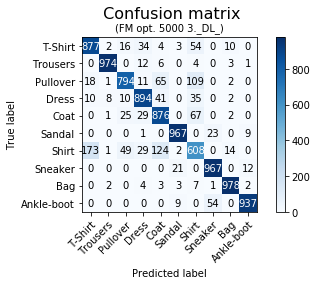

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
71/71 [==============================] - 10s 142ms/step - loss: 1.4635 - acc: 0.4932 - val_loss: 0.8659 - val_acc: 0.7200
Epoch 2/300
71/71 [==============================] - 1s 20ms/step - loss: 0.9395 - acc: 0.6538 - val_loss: 0.7935 - val_acc: 0.7220
Epoch 3/300
71/71 [==============================] - 2s 23ms/step - loss: 0.8239 - acc: 0.6929 - val_loss: 0.7062 - val_acc: 0.7480
Epoch 4/300
71/71 [==============================] - 2s 22ms/step - loss: 0.7931 - acc: 0.7046 - val_loss: 0.5750 - val_acc: 0.7620
Epoch 5/300
71/71 [==============================] - 2s 21ms/step - loss: 0.7321 - acc: 0.7225 - val_loss: 0.5702 - val_acc: 0.7680
Epoch 6/300
71/71 [==============================] - 2s 21ms/step - loss: 0.6998 - acc: 0.7359 - val_loss: 0.5956 - val_acc: 0.7820
Epoch 7/300
71/71 [==============================] - 2s 22ms/s

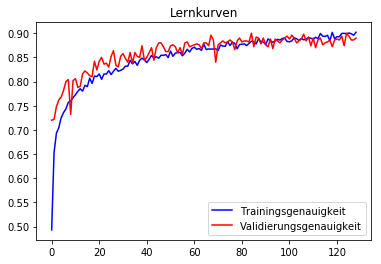

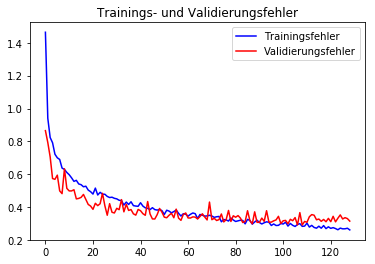

              precision    recall  f1-score   support

     T-shirt       0.85      0.86      0.85      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.90      0.75      0.82      1000
       Dress       0.88      0.89      0.89      1000
        Coat       0.73      0.91      0.81      1000
      Sandal       0.97      0.95      0.96      1000
       Shirt       0.70      0.64      0.67      1000
     Sneaker       0.91      0.97      0.94      1000
         Bag       0.97      0.97      0.97      1000
  Ankle-boot       0.97      0.94      0.95      1000

    accuracy                           0.89     10000
   macro avg       0.89      0.89      0.89     10000
weighted avg       0.89      0.89      0.89     10000



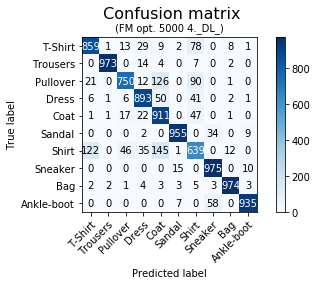

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping und Data Augmentation
 
Epoch 1/300
71/71 [==============================] - 10s 140ms/step - loss: 1.4586 - acc: 0.4939 - val_loss: 0.9778 - val_acc: 0.6920
Epoch 2/300
71/71 [==============================] - 1s 20ms/step - loss: 0.9511 - acc: 0.6536 - val_loss: 0.8240 - val_acc: 0.7280
Epoch 3/300
71/71 [==============================] - 1s 21ms/step - loss: 0.8351 - acc: 0.6941 - val_loss: 0.7209 - val_acc: 0.7140
Epoch 4/300
71/71 [==============================] - 1s 20ms/step - loss: 0.7847 - acc: 0.7044 - val_loss: 0.6951 - val_acc: 0.7620
Epoch 5/300
71/71 [==============================] - 1s 21ms/step - loss: 0.7377 - acc: 0.7170 - val_loss: 0.6243 - val_acc: 0.7640
Epoch 6/300
71/71 [==============================] - 2s 22ms/step - loss: 0.7229 - acc: 0.7329 - val_loss: 0.6220 - val_acc: 0.7980
Epoch 7/300
71/71 [==============================] - 1s 20ms/s

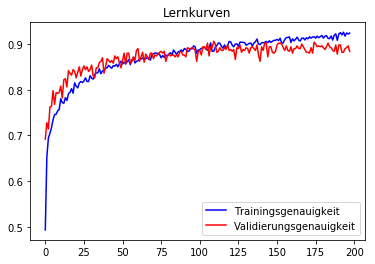

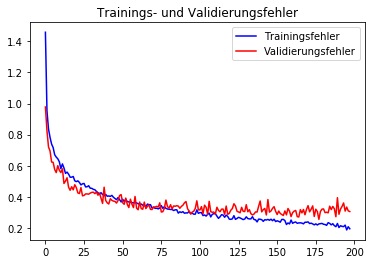

              precision    recall  f1-score   support

     T-shirt       0.82      0.90      0.85      1000
    Trousers       0.99      0.97      0.98      1000
    Pullover       0.85      0.89      0.87      1000
       Dress       0.89      0.90      0.90      1000
        Coat       0.85      0.83      0.84      1000
      Sandal       0.98      0.95      0.96      1000
       Shirt       0.74      0.65      0.69      1000
     Sneaker       0.91      0.97      0.94      1000
         Bag       0.97      0.98      0.97      1000
  Ankle-boot       0.97      0.94      0.96      1000

    accuracy                           0.90     10000
   macro avg       0.90      0.90      0.90     10000
weighted avg       0.90      0.90      0.90     10000



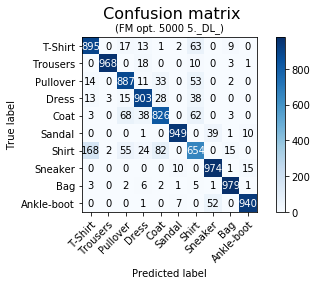

Die durchschnittliche Epochenanzahl beträgt:  100.2


In [25]:
# Trainingsmenge 5000
# optimierte Parameter: Dropoutrate: 0.4, Lernrate: 0.001, ohne SpatialDropout
# 5 Modelle mit EarlyStopping trainiren, Rückgabe der durchschnittlichen besten Epochenanzahl
earlyStoppingRuns_with_DA(1, 5, X_tr_5000, y_tr_5000, 0.4, 0.001, False, 300, 5000)

In [0]:
downloader(5000)